In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load the data
file_path = r"/content/drive/MyDrive/data_academic_performance (1).xlsx"
data = pd.read_excel(file_path, sheet_name='SABER11_SABERPRO')



In [ ]:
# Display the first few rows of the dataset
data.head()

,COD_S11,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,Unnamed: 9,...,CC_PRO,ENG_PRO,WC_PRO,FEP_PRO,G_SC,PERCENTILE,2ND_DECILE,QUARTILE,SEL,SEL_IHE
0,SB11201210000129,F,Incomplete Professional Education,Complete technique or technology,Technical or professional level employee,Home,Stratum 4,It is not classified by the SISBEN,Three,NaN,...,71,93,79,181,180,91,5,4,2,2
1,SB11201210000137,F,Complete Secundary,Complete professional education,Entrepreneur,Independent professional,Stratum 5,It is not classified by the SISBEN,Three,NaN,...,86,98,78,201,182,92,5,4,4,4
2,SB11201210005154,M,Not sure,Not sure,Independent,Home,Stratum 2,Level 2,Five,NaN,...,18,43,22,113,113,7,1,1,1,1
3,SB11201210007504,F,Not sure,Not sure,Other occupation,Independent,Stratum 2,It is not classified by the SISBEN,Three,NaN,...,76,80,48,137,157,67,4,3,2,2
4,SB11201210007548,M,Complete professional education,Complete professional education,Executive,Home,Stratum 4,It is not classified by the SISBEN,One,NaN,...,98,100,71,189,198,98,5,4,4,2


In [ ]:
# Display the first few rows of the dataset
data.tail()

,COD_S11,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,Unnamed: 9,...,CC_PRO,ENG_PRO,WC_PRO,FEP_PRO,G_SC,PERCENTILE,2ND_DECILE,QUARTILE,SEL,SEL_IHE
12406,SB11201420568705,M,Ninguno,Complete Secundary,Other occupation,Auxiliary or Administrative,Stratum 2,It is not classified by the SISBEN,Six,NaN,...,86,87,65,142,176,88,5,4,2,2
12407,SB11201420573045,M,Complete professional education,Complete Secundary,Executive,Other occupation,Stratum 2,Level 2,Five,NaN,...,44,11,0,127,107,4,1,1,4,2
12408,SB11201420578809,M,Complete technique or technology,Complete technique or technology,Retired,Home,Stratum 2,Level 2,Five,NaN,...,90,81,87,192,188,95,5,4,2,2
12409,SB11201420578812,F,Complete professional education,Complete professional education,Independent professional,Small entrepreneur,Stratum 3,It is not classified by the SISBEN,Seven,NaN,...,51,8,42,121,146,50,3,3,3,2
12410,SB11201420583232,M,Complete Secundary,Complete primary,Independent,Home,Stratum 3,Level 1,Four,NaN,...,91,79,47,193,178,89,5,4,2,4


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12411 entries, 0 to 12410
Data columns (total 45 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   COD_S11           12411 non-null  object 
 1   GENDER            12411 non-null  object 
 2   EDU_FATHER        12411 non-null  object 
 3   EDU_MOTHER        12411 non-null  object 
 4   OCC_FATHER        12411 non-null  object 
 5   OCC_MOTHER        12411 non-null  object 
 6   STRATUM           12411 non-null  object 
 7   SISBEN            12411 non-null  object 
 8   PEOPLE_HOUSE      12411 non-null  object 
 9   Unnamed: 9        0 non-null      float64
 10  INTERNET          12411 non-null  object 
 11  TV                12411 non-null  object 
 12  COMPUTER          12411 non-null  object 
 13  WASHING_MCH       12411 non-null  object 
 14  MIC_OVEN          12411 non-null  object 
 15  CAR               12411 non-null  object 
 16  DVD               12411 non-null  object

In [ ]:
 #Descriptive statistics for numerical columns
data.describe()

,Unnamed: 9,MAT_S11,CR_S11,CC_S11,BIO_S11,ENG_S11,QR_PRO,CR_PRO,CC_PRO,ENG_PRO,WC_PRO,FEP_PRO,G_SC,PERCENTILE,2ND_DECILE,QUARTILE,SEL,SEL_IHE
count,0.0,12411.000000,12411.000000,12411.000000,12411.000000,12411.000000,12411.000000,12411.000000,12411.00000,12411.000000,12411.000000,12411.000000,12411.000000,12411.000000,12411.000000,12411.000000,12411.000000,12411.000000
mean,NaN,64.320764,60.778422,60.705181,63.950528,61.801064,77.417291,62.199339,59.18677,67.498348,53.703408,145.476593,162.710499,68.446459,3.885747,3.188865,2.598904,2.409395
std,NaN,11.873650,10.025876,10.120524,11.156869,14.297777,22.673444,27.666558,28.99184,25.495096,30.001734,40.126386,23.112479,25.867550,1.248431,0.979043,1.111704,0.926765
min,NaN,26.000000,24.000000,0.000000,11.000000,26.000000,1.000000,1.000000,1.00000,1.000000,0.000000,1.000000,37.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,NaN,56.000000,54.000000,54.000000,56.000000,50.000000,65.000000,42.000000,36.00000,51.000000,28.000000,124.000000,147.000000,51.000000,3.000000,3.000000,2.000000,2.000000
50%,NaN,64.000000,61.000000,60.000000,64.000000,59.000000,85.000000,67.000000,65.00000,74.000000,56.000000,153.000000,163.000000,75.000000,4.000000,4.000000,2.000000,2.000000
75%,NaN,72.000000,67.000000,67.000000,71.000000,72.000000,96.000000,86.000000,85.00000,88.000000,80.000000,174.000000,179.000000,90.000000,5.000000,4.000000,4.000000,3.000000
max,NaN,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.00000,100.000000,100.000000,300.000000,247.000000,100.000000,5.000000,4.000000,4.000000,4.000000


In [ ]:
# Function to count unique values in each column
def count_unique_values(df):
    unique_counts = {}
    for col in df.columns:
        unique_counts[col] = df[col].value_counts(dropna=False)
    return unique_counts

# Generate the counts of unique values for each column
unique_value_counts = count_unique_values(data)

# Display the counts
for col, counts in unique_value_counts.items():
    print(f"Column: {col}")
    print(counts)
    print("\n")


Column: COD_S11
COD_S11
SB11201420583232    1
SB11201210000129    1
SB11201210000137    1
SB11201210005154    1
SB11201210007504    1
                   ..
SB11201210035276    1
SB11201210035394    1
SB11201210035645    1
SB11201210035831    1
SB11201210035865    1
Name: count, Length: 12411, dtype: int64


Column: GENDER
GENDER
M    7368
F    5043
Name: count, dtype: int64


Column: EDU_FATHER
EDU_FATHER
Complete professional education          3016
Complete Secundary                       2843
Complete technique or technology         1194
Incomplete Secundary                     1091
Postgraduate education                   1085
Complete primary                          824
Incomplete primary                        735
Incomplete Professional Education         425
Not sure                                  407
0                                         391
Incomplete technical or technological     277
Ninguno                                   123
Name: count, dtype: int64


Column: EDU

In [ ]:
#renaming features in the cols
data['EDU_FATHER'] = data['EDU_FATHER'].astype(str)
data['EDU_MOTHER'] = data['EDU_MOTHER'].astype(str)
data['OCC_FATHER'] = data['OCC_FATHER'].astype(str)
data['OCC_MOTHER'] = data['OCC_MOTHER'].astype(str)
data['PEOPLE_HOUSE'] = data['PEOPLE_HOUSE'].astype(str)
data['JOB'] = data['JOB'].astype(str)
data['STRATUM'] = data['STRATUM'].astype(str)
data['SISBEN'] = data['SISBEN'].astype(str)
data['REVENUE'] = data['REVENUE'].astype(str)

# Replace '0' with 'Not sure' in EDU_FATHER and EDU_MOTHER
data['EDU_FATHER'].replace('0', 'Not sure', inplace=True)
data['EDU_MOTHER'].replace('0', 'Not sure', inplace=True)

# Replace 'Ninguno' with 'None' in EDU_FATHER and EDU_MOTHER
data['EDU_FATHER'].replace('Ninguno', 'None', inplace=True)
data['EDU_MOTHER'].replace('Ninguno', 'None', inplace=True)

# Replace '0' with 'Unknown' in OCC_FATHER and OCC_MOTHER
data['OCC_FATHER'].replace('0', 'Unknown', inplace=True)
data['OCC_MOTHER'].replace('0', 'Unknown', inplace=True)

# Replace '0' with 'Stratum 3' in STRATUM
data['STRATUM'].replace('0', 'Stratum 3', inplace=True)

# Replace '0' with 'Level 2' and 'Esta clasificada en otro Level del SISBEN' with 'It is classified in another SISBEN Level' in SISBEN
data['SISBEN'].replace('0', 'Level 2', inplace=True)
data['SISBEN'].replace('Esta clasificada en otro Level del SISBEN', 'It is classified in another SISBEN Level', inplace=True)

# Replace '0' with 'Four', 'Nueve' with 'Nine', and 'Once' with 'One' in PEOPLE_HOUSE
data['PEOPLE_HOUSE'].replace('0', 'Four', inplace=True)
data['PEOPLE_HOUSE'].replace('Nueve', 'Nine', inplace=True)
data['PEOPLE_HOUSE'].replace('Once', 'One', inplace=True)

# Replace '0' with 'Between 1 and less than 2 LMMW' in REVENUE
data['REVENUE'].replace('0', 'Between 1 and less than 2 LMMW', inplace=True)

# Replace '0' with 'No' in JOB
data['JOB'].replace('0', 'No', inplace=True)

# Display the counts of unique values again
unique_value_counts = count_unique_values(data)
for col, counts in unique_value_counts.items():
    print(f"Column: {col}")
    print(counts)
    print("\n")


Column: COD_S11
COD_S11
SB11201420583232    1
SB11201210000129    1
SB11201210000137    1
SB11201210005154    1
SB11201210007504    1
                   ..
SB11201210035276    1
SB11201210035394    1
SB11201210035645    1
SB11201210035831    1
SB11201210035865    1
Name: count, Length: 12411, dtype: int64


Column: GENDER
GENDER
M    7368
F    5043
Name: count, dtype: int64


Column: EDU_FATHER
EDU_FATHER
Complete professional education          3016
Complete Secundary                       2843
Complete technique or technology         1194
Incomplete Secundary                     1091
Postgraduate education                   1085
Complete primary                          824
Not sure                                  798
Incomplete primary                        735
Incomplete Professional Education         425
Incomplete technical or technological     277
None                                      123
Name: count, dtype: int64


Column: EDU_MOTHER
EDU_MOTHER
Complete Secundary         

<ipython-input-8-ade9dcb0b797>:12: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['EDU_FATHER'].replace('0', 'Not sure', inplace=True)
<ipython-input-8-ade9dcb0b797>:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)',

In [ ]:
data.head()

,COD_S11,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,Unnamed: 9,...,CC_PRO,ENG_PRO,WC_PRO,FEP_PRO,G_SC,PERCENTILE,2ND_DECILE,QUARTILE,SEL,SEL_IHE
0,SB11201210000129,F,Incomplete Professional Education,Complete technique or technology,Technical or professional level employee,Home,Stratum 4,It is not classified by the SISBEN,Three,NaN,...,71,93,79,181,180,91,5,4,2,2
1,SB11201210000137,F,Complete Secundary,Complete professional education,Entrepreneur,Independent professional,Stratum 5,It is not classified by the SISBEN,Three,NaN,...,86,98,78,201,182,92,5,4,4,4
2,SB11201210005154,M,Not sure,Not sure,Independent,Home,Stratum 2,Level 2,Five,NaN,...,18,43,22,113,113,7,1,1,1,1
3,SB11201210007504,F,Not sure,Not sure,Other occupation,Independent,Stratum 2,It is not classified by the SISBEN,Three,NaN,...,76,80,48,137,157,67,4,3,2,2
4,SB11201210007548,M,Complete professional education,Complete professional education,Executive,Home,Stratum 4,It is not classified by the SISBEN,One,NaN,...,98,100,71,189,198,98,5,4,4,2


In [ ]:
value_counts = data['ACADEMIC_PROGRAM'].value_counts()

print("Count of each unique value in 'ACADEMIC_PROGRAM':")
print(value_counts)


Count of each unique value in 'ACADEMIC_PROGRAM':
ACADEMIC_PROGRAM
INDUSTRIAL ENGINEERING                           5318
CIVIL ENGINEERING                                3320
MECHANICAL ENGINEERING                           1135
CHEMICAL ENGINEERING                             1000
ELECTRONIC ENGINEERING                            849
ELECTRIC ENGINEERING                              278
MECHATRONICS ENGINEERING                           82
CATASTRAL ENGINEERING AND GEODESY                  78
PRODUCTION ENGINEERING                             60
ELECTRIC ENGINEERING AND TELECOMMUNICATIONS        47
AERONAUTICAL ENGINEERING                           44
TOPOGRAPHIC ENGINEERY                              42
ELECTROMECHANICAL ENGINEERING                      34
PRODUCTIVITY AND QUALITY ENGINEERING               29
TRANSPORTATION AND ROAD ENGINEERING                27
INDUSTRIAL AUTOMATIC ENGINEERING                   22
CONTROL ENGINEERING                                20
CIVIL CONSTRUCT

**Data Visualization**

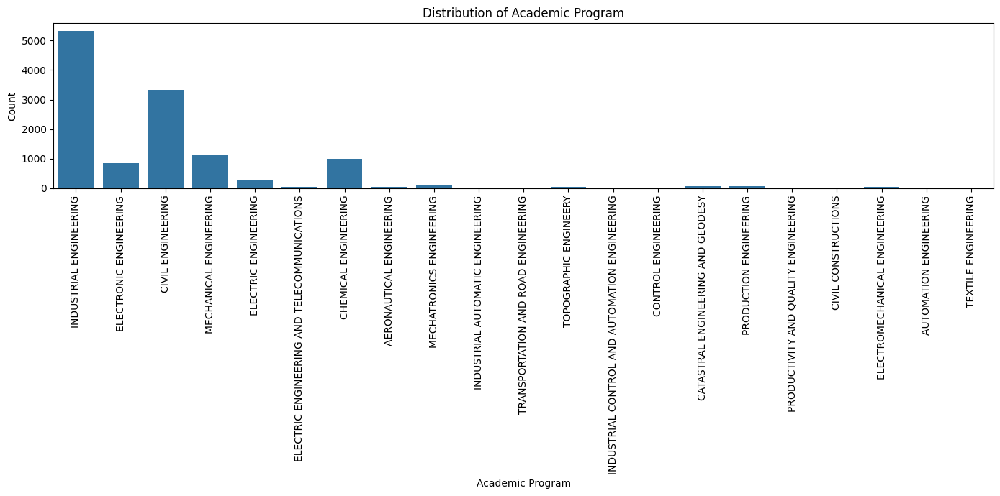

In [ ]:
# Distribution of  Academic Program
plt.figure(figsize=(14, 7))
sns.countplot(data=data, x='ACADEMIC_PROGRAM')
plt.xticks(rotation=90)
plt.title('Distribution of Academic Program')
plt.xlabel('Academic Program')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

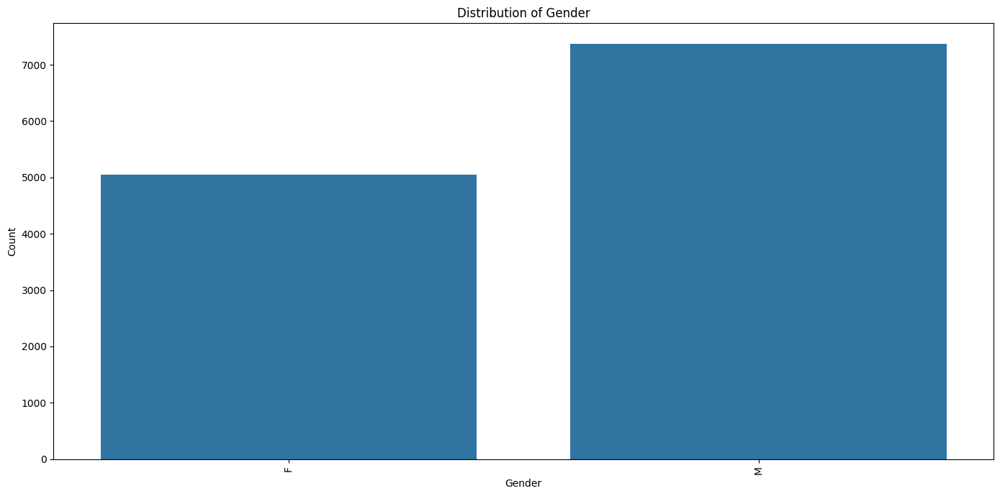

In [ ]:
# Gender
plt.figure(figsize=(14, 7))
sns.countplot(data=data, x='GENDER')
plt.xticks(rotation=90)
plt.title('Distribution of Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

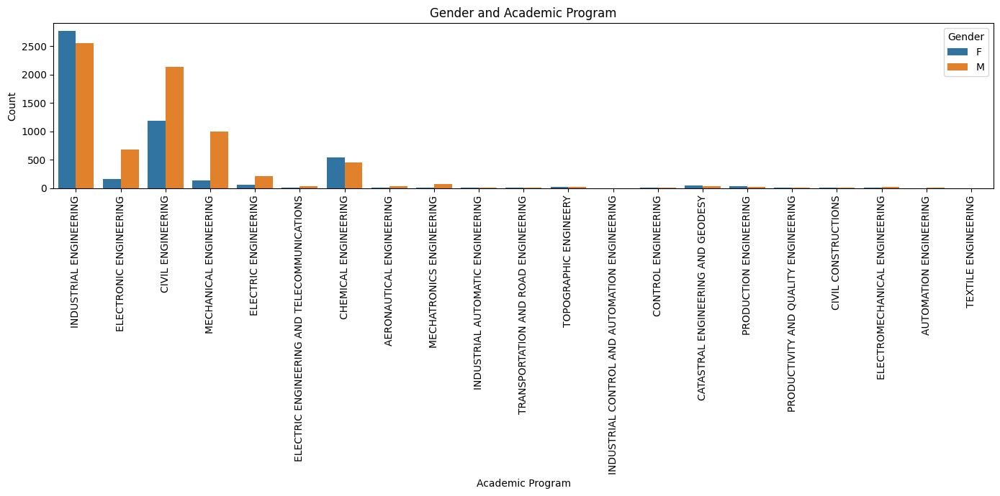

In [ ]:
# Gender and Academic Program
plt.figure(figsize=(14, 7))
sns.countplot(data=data, x='ACADEMIC_PROGRAM', hue='GENDER')
plt.xticks(rotation=90)
plt.title('Gender and Academic Program')
plt.xlabel('Academic Program')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()


<ipython-input-19-b50250dbfb33>:9: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


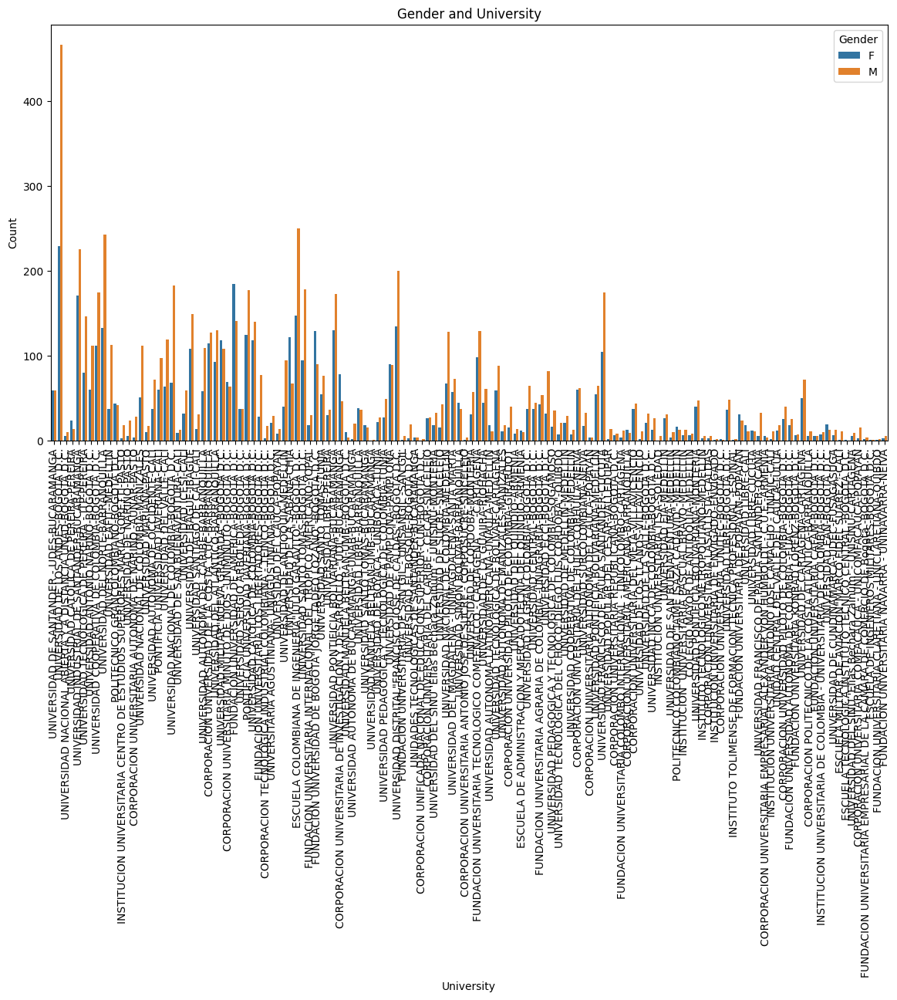

In [ ]:
# Gender and University
plt.figure(figsize=(14, 7))
sns.countplot(data=data, x='UNIVERSITY', hue='GENDER')
plt.xticks(rotation=90)
plt.title('Gender and University')
plt.xlabel('University')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When 

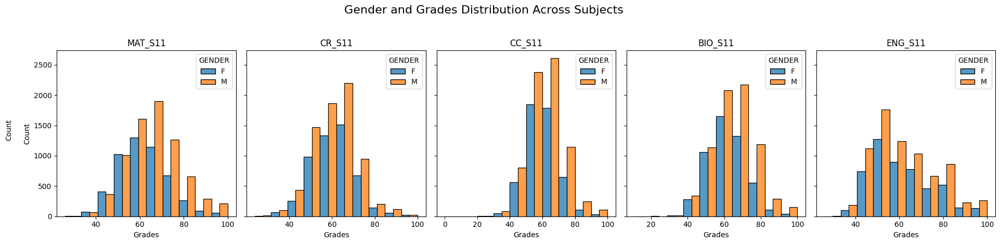

In [ ]:
# List of grade columns
grades_columns = ['MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11']

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=1, ncols=len(grades_columns), figsize=(20, 5), sharey=True)

# Loop through each grade column and corresponding subplot axis
for i, col in enumerate(grades_columns):
    sns.histplot(data=data, x=col, hue='GENDER', multiple='dodge', bins=10, ax=axes[i])
    axes[i].set_title(f'{col}')
    axes[i].set_xlabel('Grades')

# Set a common y-axis label
fig.text(0.04, 0.5, 'Count', va='center', rotation='vertical')

# Set the main title
plt.suptitle('Gender and Grades Distribution Across Subjects', fontsize=16)

# Adjust layout
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.show()


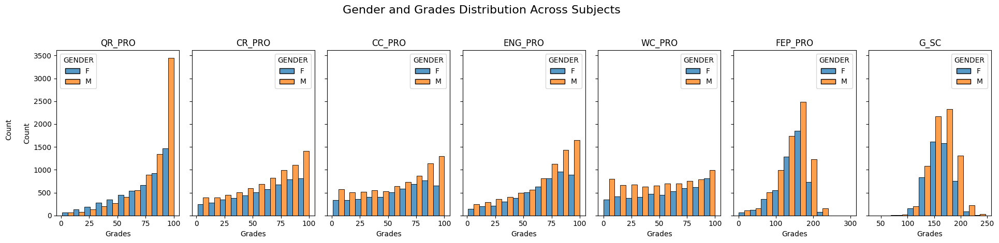

In [ ]:
# List of grade columns
grades_columns = ['QR_PRO', 'CR_PRO', 'CC_PRO', 'ENG_PRO', 'WC_PRO','FEP_PRO','G_SC']

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=1, ncols=len(grades_columns), figsize=(20, 5), sharey=True)

# Loop through each grade column and corresponding subplot axis
for i, col in enumerate(grades_columns):
    sns.histplot(data=data, x=col, hue='GENDER', multiple='dodge', bins=10, ax=axes[i])
    axes[i].set_title(f'{col}')
    axes[i].set_xlabel('Grades')

# Set a common y-axis label
fig.text(0.04, 0.5, 'Count', va='center', rotation='vertical')

# Set the main title
plt.suptitle('Gender and Grades Distribution Across Subjects', fontsize=16)

# Adjust layout
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.show()


<ipython-input-22-8c25d378f67a>:9: UserWarning: Glyph 129 (\x81) missing from current font.
  plt.tight_layout()
<ipython-input-22-8c25d378f67a>:9: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129 (\x81) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


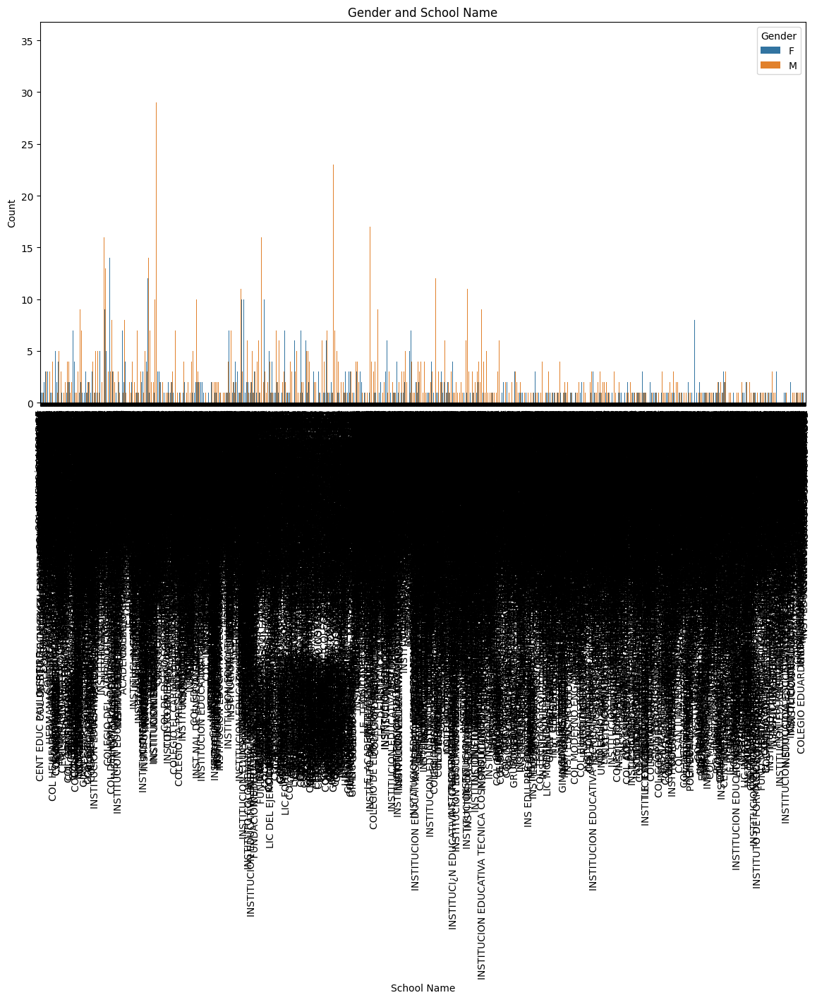

In [ ]:
#Gender and School Name
plt.figure(figsize=(14, 7))
sns.countplot(data=data, x='SCHOOL_NAME', hue='GENDER')
plt.xticks(rotation=90)
plt.title('Gender and School Name')
plt.xlabel('School Name')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


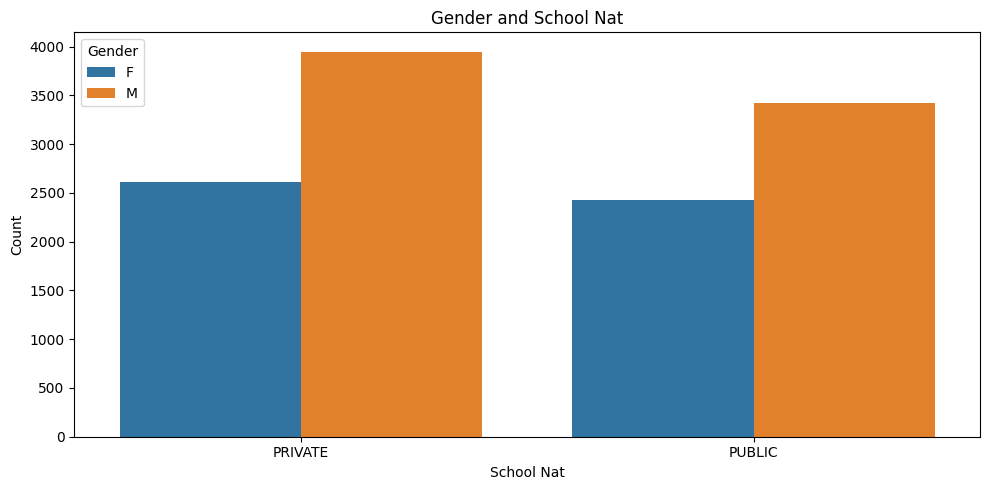

In [ ]:
# Gender and School Nat
plt.figure(figsize=(10, 5))
sns.countplot(data=data, x='SCHOOL_NAT', hue='GENDER')
plt.title('Gender and School Nat')
plt.xlabel('School Nat')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()


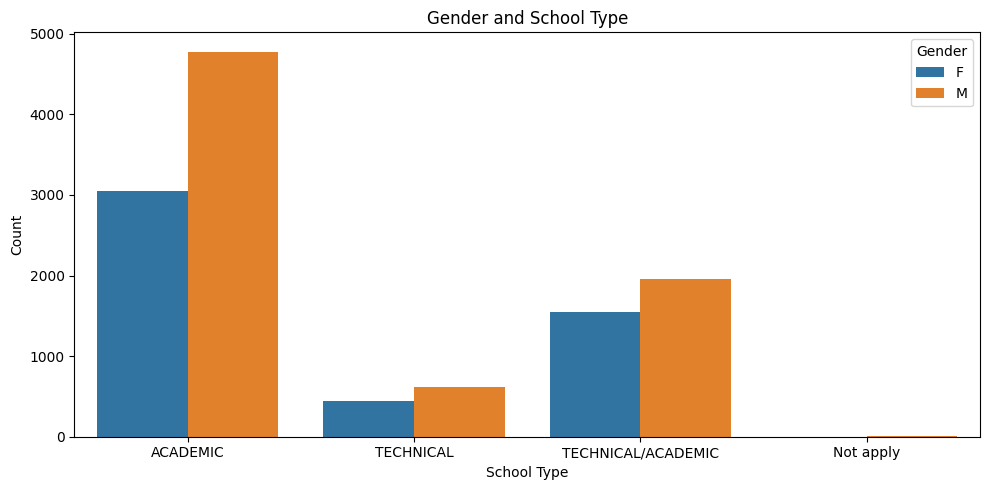

In [ ]:
# Gender and School Type
plt.figure(figsize=(10, 5))
sns.countplot(data=data, x='SCHOOL_TYPE', hue='GENDER')
plt.title('Gender and School Type')
plt.xlabel('School Type')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.tight_layout()
plt.show()


<ipython-input-25-bb33edd4d484>:8: UserWarning: Glyph 129 (\x81) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129 (\x81) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


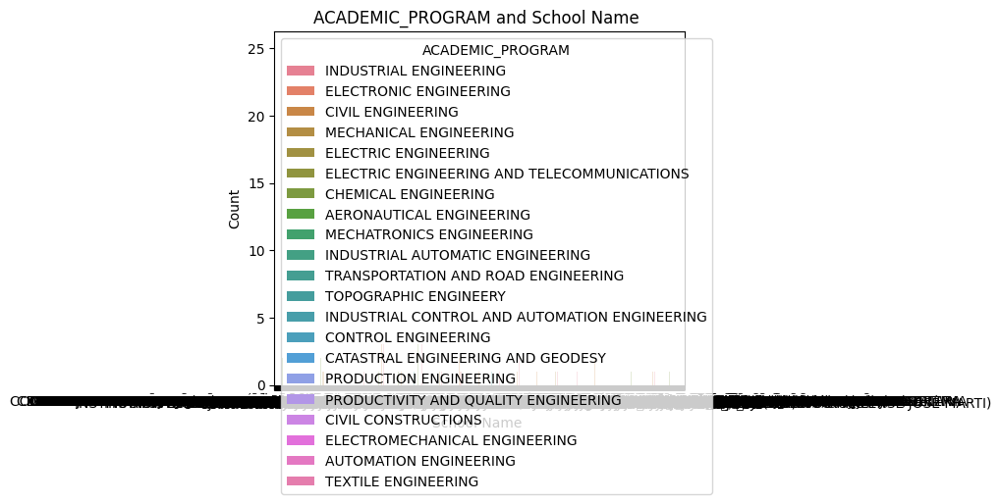

In [ ]:
#ACADEMIC_PROGRAM  and School Name
plt.figure(figsize=(10, 5))
sns.countplot(data=data, x='SCHOOL_NAME', hue='ACADEMIC_PROGRAM')
plt.title('ACADEMIC_PROGRAM and School Name ')
plt.xlabel('School Name ')
plt.ylabel('Count')
plt.legend(title='ACADEMIC_PROGRAM')
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When 

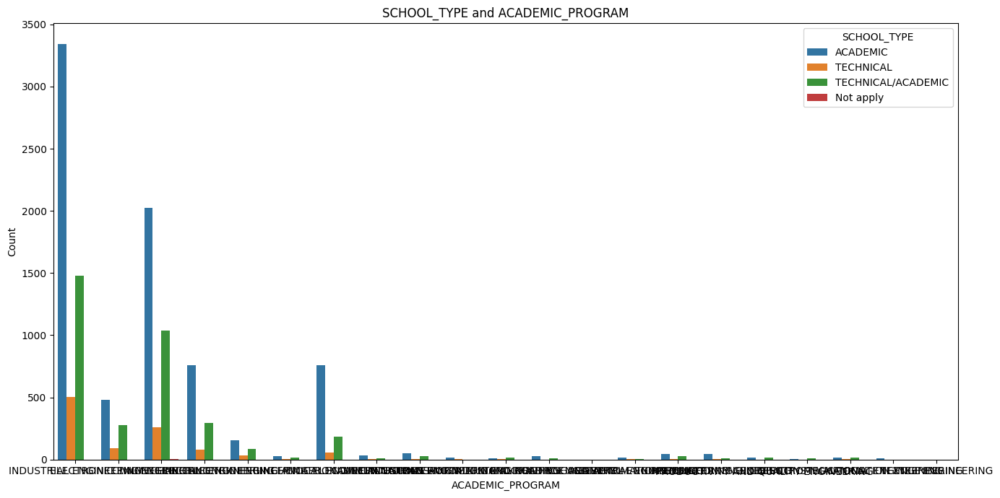

In [ ]:
#SCHOOL_TYPE and ACADEMIC_PROGRAM
plt.figure(figsize=(14, 7))
sns.countplot(data=data, x='ACADEMIC_PROGRAM', hue='SCHOOL_TYPE')
plt.title('SCHOOL_TYPE and ACADEMIC_PROGRAM')
plt.xlabel('ACADEMIC_PROGRAM')
plt.ylabel('Count')
plt.legend(title='SCHOOL_TYPE')
plt.tight_layout()
plt.show()

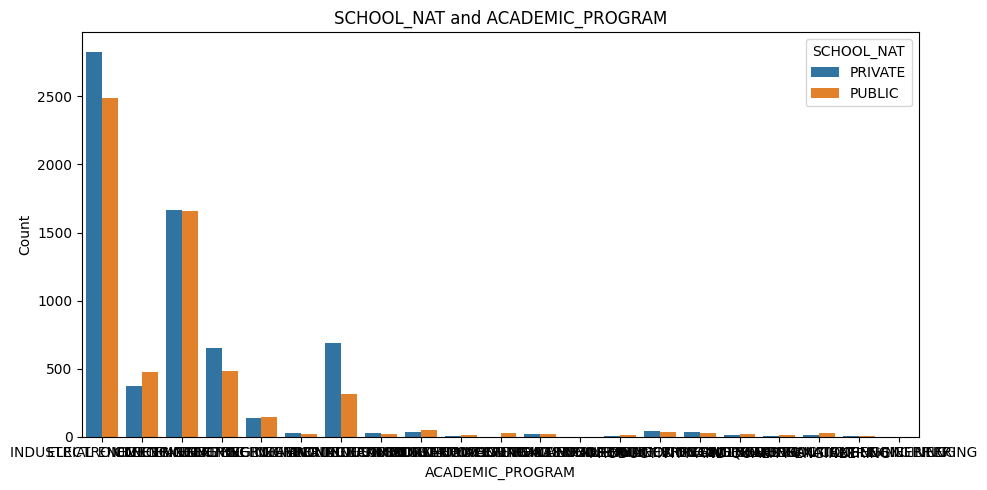

In [ ]:
# SCHOOL_NAT and ACADEMIC_PROGRAM
plt.figure(figsize=(10, 5))
sns.countplot(data=data, x='ACADEMIC_PROGRAM', hue='SCHOOL_NAT')
plt.title('SCHOOL_NAT and ACADEMIC_PROGRAM')
plt.xlabel('ACADEMIC_PROGRAM')
plt.ylabel('Count')
plt.legend(title='SCHOOL_NAT')
plt.tight_layout()
plt.show()

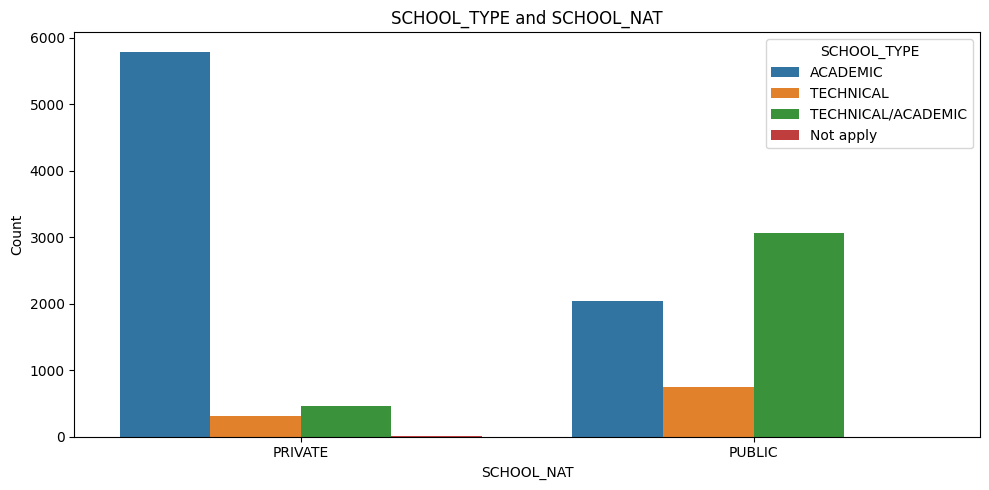

In [ ]:
#SCHOOL_TYPE and SCHOOL_NAT
plt.figure(figsize=(10, 5))
sns.countplot(data=data, x='SCHOOL_NAT', hue='SCHOOL_TYPE')
plt.title('SCHOOL_TYPE and SCHOOL_NAT')
plt.xlabel('SCHOOL_NAT')
plt.ylabel('Count')
plt.legend(title='SCHOOL_TYPE')
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)


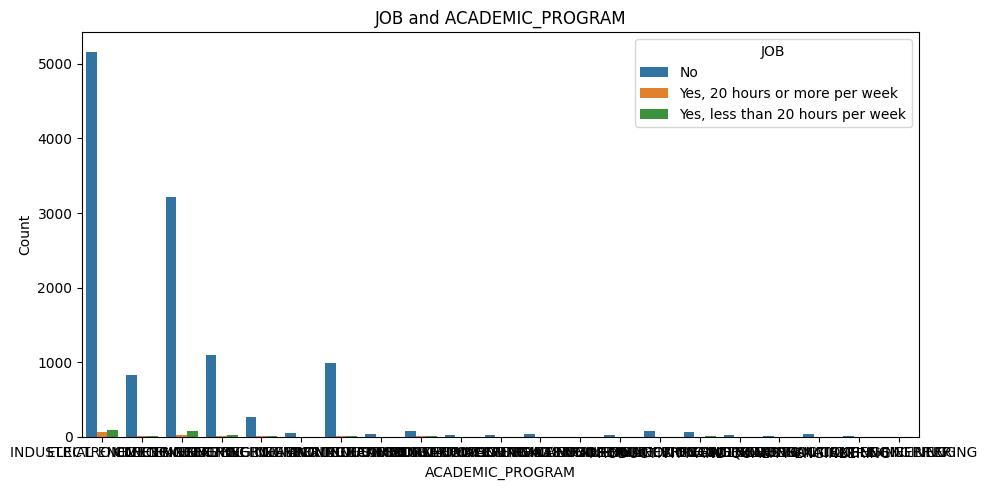

In [ ]:
# JOB and ACADEMIC_PROGRAM
plt.figure(figsize=(10, 5))
sns.countplot(data=data, x='ACADEMIC_PROGRAM', hue='JOB')
plt.title('JOB and ACADEMIC_PROGRAM')
plt.xlabel('ACADEMIC_PROGRAM')
plt.ylabel('Count')
plt.legend(title='JOB')
plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When 

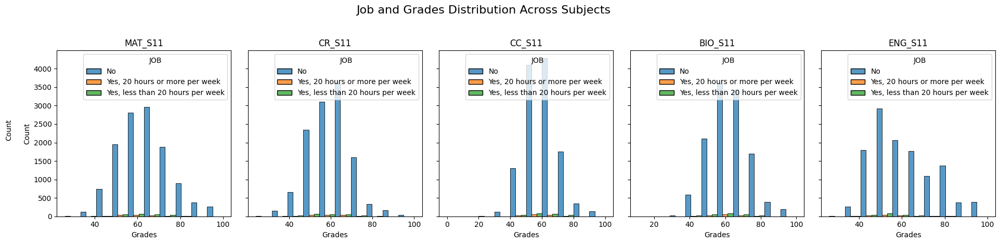

In [ ]:
# List of grade columns
grades_columns = ['MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11']

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=1, ncols=len(grades_columns), figsize=(20, 5), sharey=True)

# Loop through each grade column and corresponding subplot axis
for i, col in enumerate(grades_columns):
    sns.histplot(data=data, x=col, hue='JOB', multiple='dodge', bins=10, ax=axes[i])
    axes[i].set_title(f'{col}')
    axes[i].set_xlabel('Grades')

# Set a common y-axis label
fig.text(0.04, 0.5, 'Count', va='center', rotation='vertical')

# Set the main title
plt.suptitle('Job and Grades Distribution Across Subjects', fontsize=16)

# Adjust layout
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
plt.show()


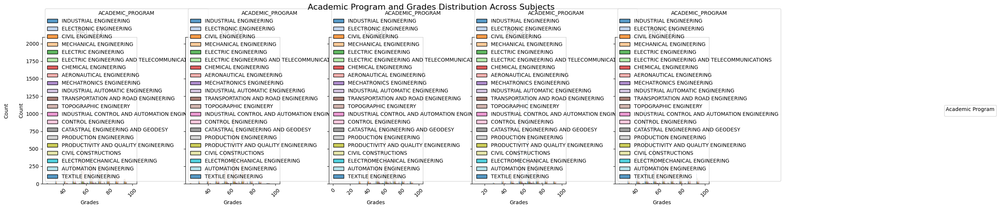

In [ ]:
# List of grade columns
grades_columns = ['MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11']

# Create a figure with multiple subplots
fig, axes = plt.subplots(nrows=1, ncols=len(grades_columns), figsize=(25, 6), sharey=True)

# Loop through each grade column and corresponding subplot axis
for i, col in enumerate(grades_columns):
    sns.histplot(data=data, x=col, hue='ACADEMIC_PROGRAM', multiple='dodge', bins=10, ax=axes[i], palette='tab20')
    axes[i].set_title(f'{col}')
    axes[i].set_xlabel('Grades')
    # Rotate x-axis labels for clarity
    axes[i].tick_params(axis='x', rotation=45)

# Adjust the legend position and size
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title='Academic Program', bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize='small')

# Set a common y-axis label
fig.text(0.04, 0.5, 'Count', va='center', rotation='vertical')

# Set the main title
plt.suptitle('Academic Program and Grades Distribution Across Subjects', fontsize=16)

# Adjust layout to make room for legend and labels
plt.tight_layout(rect=[0.05, 0.05, 0.85, 0.95])
plt.show()


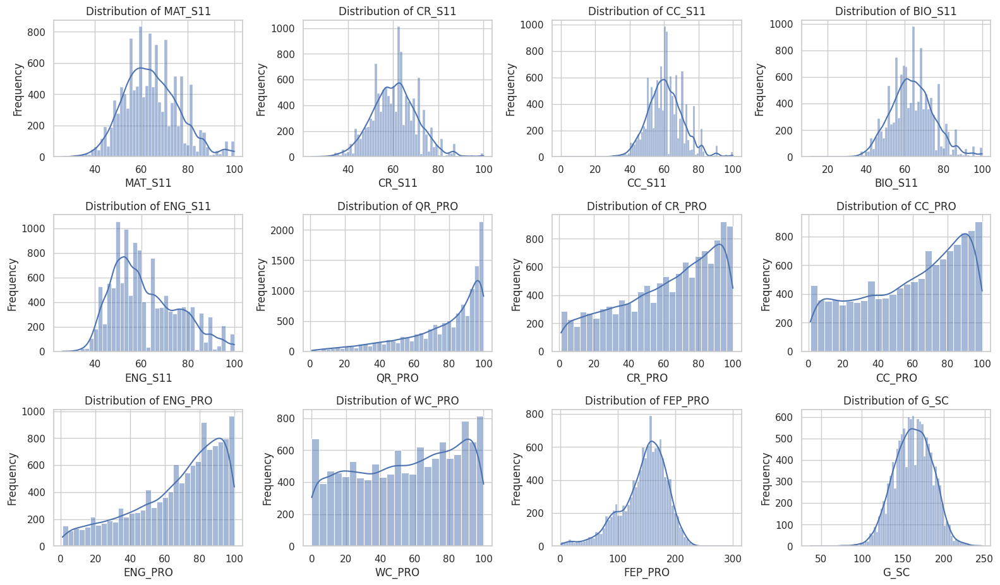

In [ ]:
# Set the plotting style
sns.set(style="whitegrid")

# Define the target variable for prediction (assumption: 'SEL' indicates selection or admission)
target_variable = 'SEL'

# Plot histograms for numerical columns
numerical_columns = ['MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11', 'QR_PRO', 'CR_PRO', 'CC_PRO', 'ENG_PRO', 'WC_PRO', 'FEP_PRO', 'G_SC']

# Plotting histograms
plt.figure(figsize=(16, 12))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(data[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [ ]:
# Define the mapping for STRATUM
stratum_mapping = {
    'Stratum 1': 1,
    'Stratum 2': 2,
    'Stratum 3': 3,
    'Stratum 4': 4,
    'Stratum 5': 5,
    'Stratum 6': 6
}

# Apply the mapping to STRATUM column and convert to int
data['STRATUM'] = data['STRATUM'].map(stratum_mapping).astype(int)

# Define the mapping for PEOPLE_HOUSE
people_house_mapping = {
    'Four': 4,
    'Five': 5,
    'Six': 6,
    'Three': 3,
    'Two': 2,
    'One': 1,
    'Seven': 7,
    'Eight': 8,
    'Nine': 9,
    'Ten': 10,
    'Twelve or more': 12,
    '0': 0
}

# Apply the mapping to PEOPLE_HOUSE column and convert to int
data['PEOPLE_HOUSE'] = data['PEOPLE_HOUSE'].map(people_house_mapping).astype(int)

# Convert columns 10-19 (INTERNET, TV, COMPUTER, etc.) to 1 for 'Yes' and 0 for 'No' and convert to int
columns_to_convert = ['INTERNET', 'TV', 'COMPUTER', 'WASHING_MCH', 'MIC_OVEN', 'CAR', 'DVD', 'FRESH', 'PHONE', 'MOBILE']
for column in columns_to_convert:
    data[column] = data[column].replace({'Yes': 1, 'No': 0}).astype(int)

# Convert GENDER to 1 for 'Male' and 0 for 'Female' and convert to int
data['GENDER'] = data['GENDER'].replace({'M': 1, 'F': 0}).astype(int)

# Convert JOB to 0 for 'No' and 1 for any other value and convert to int
data['JOB'] = data['JOB'].apply(lambda x: 0 if x == 'No' else 1).astype(int)

# Display the transformed DataFrame
print(data.dtypes)
print(data.head())


COD_S11              object
GENDER                int64
EDU_FATHER           object
EDU_MOTHER           object
OCC_FATHER           object
OCC_MOTHER           object
STRATUM               int64
SISBEN               object
PEOPLE_HOUSE          int64
Unnamed: 9          float64
INTERNET              int64
TV                    int64
COMPUTER              int64
WASHING_MCH           int64
MIC_OVEN              int64
CAR                   int64
DVD                   int64
FRESH                 int64
PHONE                 int64
MOBILE                int64
REVENUE              object
JOB                   int64
SCHOOL_NAME          object
SCHOOL_NAT           object
SCHOOL_TYPE          object
MAT_S11               int64
CR_S11                int64
CC_S11                int64
BIO_S11               int64
ENG_S11               int64
Cod_SPro             object
UNIVERSITY           object
ACADEMIC_PROGRAM     object
QR_PRO                int64
CR_PRO                int64
CC_PRO              

<ipython-input-18-244a52802e33>:36: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data[column] = data[column].replace({'Yes': 1, 'No': 0}).astype(int)
<ipython-input-18-244a52802e33>:36: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data[column] = data[column].replace({'Yes': 1, 'No': 0}).astype(int)
<ipython-input-18-244a52802e33>:36: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to t

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12411 entries, 0 to 12410
Data columns (total 45 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   COD_S11           12411 non-null  object 
 1   GENDER            12411 non-null  int64  
 2   EDU_FATHER        12411 non-null  object 
 3   EDU_MOTHER        12411 non-null  object 
 4   OCC_FATHER        12411 non-null  object 
 5   OCC_MOTHER        12411 non-null  object 
 6   STRATUM           12411 non-null  int64  
 7   SISBEN            12411 non-null  object 
 8   PEOPLE_HOUSE      12411 non-null  int64  
 9   Unnamed: 9        0 non-null      float64
 10  INTERNET          12411 non-null  int64  
 11  TV                12411 non-null  int64  
 12  COMPUTER          12411 non-null  int64  
 13  WASHING_MCH       12411 non-null  int64  
 14  MIC_OVEN          12411 non-null  int64  
 15  CAR               12411 non-null  int64  
 16  DVD               12411 non-null  int64 

In [ ]:
data.head()

,COD_S11,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,Unnamed: 9,...,CC_PRO,ENG_PRO,WC_PRO,FEP_PRO,G_SC,PERCENTILE,2ND_DECILE,QUARTILE,SEL,SEL_IHE
0,SB11201210000129,0,Incomplete Professional Education,Complete technique or technology,Technical or professional level employee,Home,4,It is not classified by the SISBEN,3,NaN,...,71,93,79,181,180,91,5,4,2,2
1,SB11201210000137,0,Complete Secundary,Complete professional education,Entrepreneur,Independent professional,5,It is not classified by the SISBEN,3,NaN,...,86,98,78,201,182,92,5,4,4,4
2,SB11201210005154,1,Not sure,Not sure,Independent,Home,2,Level 2,5,NaN,...,18,43,22,113,113,7,1,1,1,1
3,SB11201210007504,0,Not sure,Not sure,Other occupation,Independent,2,It is not classified by the SISBEN,3,NaN,...,76,80,48,137,157,67,4,3,2,2
4,SB11201210007548,1,Complete professional education,Complete professional education,Executive,Home,4,It is not classified by the SISBEN,1,NaN,...,98,100,71,189,198,98,5,4,4,2


In [ ]:
# Function to count unique values in each column
def count_unique_values(df):
    unique_counts = {}
    for col in df.columns:
        unique_counts[col] = df[col].value_counts(dropna=False)
    return unique_counts

# Generate the counts of unique values for each column
unique_value_counts = count_unique_values(data)

# Display the counts
for col, counts in unique_value_counts.items():
    print(f"Column: {col}")
    print(counts)
    print("\n")

Column: COD_S11
COD_S11
SB11201420583232    1
SB11201210000129    1
SB11201210000137    1
SB11201210005154    1
SB11201210007504    1
                   ..
SB11201210035276    1
SB11201210035394    1
SB11201210035645    1
SB11201210035831    1
SB11201210035865    1
Name: count, Length: 12411, dtype: int64


Column: GENDER
GENDER
1    7368
0    5043
Name: count, dtype: int64


Column: EDU_FATHER
EDU_FATHER
Complete professional education          3016
Complete Secundary                       2843
Complete technique or technology         1194
Incomplete Secundary                     1091
Postgraduate education                   1085
Complete primary                          824
Not sure                                  798
Incomplete primary                        735
Incomplete Professional Education         425
Incomplete technical or technological     277
None                                      123
Name: count, dtype: int64


Column: EDU_MOTHER
EDU_MOTHER
Complete Secundary         

## Extraction 1


In [ ]:
# Extracting specific columns from the DataFrame 'data'
columns_to_extract = ['ACADEMIC_PROGRAM', 'GENDER', 'JOB', 'SCHOOL_TYPE', 'MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11']
extracted_data = data[columns_to_extract]

# Display the extracted DataFrame
print(extracted_data)


               ACADEMIC_PROGRAM  GENDER  JOB SCHOOL_TYPE  MAT_S11  CR_S11  \
0        INDUSTRIAL ENGINEERING       0    0    ACADEMIC       71      81   
1        INDUSTRIAL ENGINEERING       0    0    ACADEMIC       83      75   
2        ELECTRONIC ENGINEERING       1    1    ACADEMIC       52      49   
3        INDUSTRIAL ENGINEERING       0    0    ACADEMIC       56      55   
4        INDUSTRIAL ENGINEERING       1    0    ACADEMIC       80      65   
...                         ...     ...  ...         ...      ...     ...   
12406  MECHATRONICS ENGINEERING       1    0    ACADEMIC       67      69   
12407    INDUSTRIAL ENGINEERING       1    0    ACADEMIC       58      57   
12408    INDUSTRIAL ENGINEERING       1    0    ACADEMIC       66      69   
12409         CIVIL ENGINEERING       0    0    ACADEMIC       53      69   
12410    INDUSTRIAL ENGINEERING       1    0    ACADEMIC       79      65   

       CC_S11  BIO_S11  ENG_S11  
0          61       86       82  
1      

In [ ]:
# Function to count unique values in each column
def count_unique_values(df):
    unique_counts = {}
    for col in df.columns:
        unique_counts[col] = df[col].value_counts(dropna=False)
    return unique_counts

# Generate the counts of unique values for each column
unique_value_counts = count_unique_values(extracted_data)

# Display the counts
for col, counts in unique_value_counts.items():
    print(f"Column: {col}")
    print(counts)
    print("\n")

Column: ACADEMIC_PROGRAM
ACADEMIC_PROGRAM
INDUSTRIAL ENGINEERING                           5318
CIVIL ENGINEERING                                3320
MECHANICAL ENGINEERING                           1135
CHEMICAL ENGINEERING                             1000
ELECTRONIC ENGINEERING                            849
ELECTRIC ENGINEERING                              278
MECHATRONICS ENGINEERING                           82
CATASTRAL ENGINEERING AND GEODESY                  78
PRODUCTION ENGINEERING                             60
ELECTRIC ENGINEERING AND TELECOMMUNICATIONS        47
AERONAUTICAL ENGINEERING                           44
TOPOGRAPHIC ENGINEERY                              42
ELECTROMECHANICAL ENGINEERING                      34
PRODUCTIVITY AND QUALITY ENGINEERING               29
TRANSPORTATION AND ROAD ENGINEERING                27
INDUSTRIAL AUTOMATIC ENGINEERING                   22
CONTROL ENGINEERING                                20
CIVIL CONSTRUCTIONS                     

In [ ]:
extracted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12411 entries, 0 to 12410
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ACADEMIC_PROGRAM  12411 non-null  object
 1   GENDER            12411 non-null  int64 
 2   JOB               12411 non-null  int64 
 3   SCHOOL_TYPE       12411 non-null  object
 4   MAT_S11           12411 non-null  int64 
 5   CR_S11            12411 non-null  int64 
 6   CC_S11            12411 non-null  int64 
 7   BIO_S11           12411 non-null  int64 
 8   ENG_S11           12411 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 872.8+ KB


In [ ]:
value_counts = extracted_data['ACADEMIC_PROGRAM'].value_counts()

print("Count of each unique value in 'ACADEMIC_PROGRAM':")
print(value_counts)


Count of each unique value in 'ACADEMIC_PROGRAM':
ACADEMIC_PROGRAM
INDUSTRIAL ENGINEERING                           5318
CIVIL ENGINEERING                                3320
MECHANICAL ENGINEERING                           1135
CHEMICAL ENGINEERING                             1000
ELECTRONIC ENGINEERING                            849
ELECTRIC ENGINEERING                              278
MECHATRONICS ENGINEERING                           82
CATASTRAL ENGINEERING AND GEODESY                  78
PRODUCTION ENGINEERING                             60
ELECTRIC ENGINEERING AND TELECOMMUNICATIONS        47
AERONAUTICAL ENGINEERING                           44
TOPOGRAPHIC ENGINEERY                              42
ELECTROMECHANICAL ENGINEERING                      34
PRODUCTIVITY AND QUALITY ENGINEERING               29
TRANSPORTATION AND ROAD ENGINEERING                27
INDUSTRIAL AUTOMATIC ENGINEERING                   22
CONTROL ENGINEERING                                20
CIVIL CONSTRUCT

In [ ]:
extracted_data

,ACADEMIC_PROGRAM,GENDER,JOB,SCHOOL_TYPE,MAT_S11,CR_S11,CC_S11,BIO_S11,ENG_S11
0,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,71,81,61,86,82
1,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,83,75,66,100,88
2,ELECTRONIC ENGINEERING,1,1,ACADEMIC,52,49,38,46,42
3,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,56,55,51,64,73
4,INDUSTRIAL ENGINEERING,1,0,ACADEMIC,80,65,76,85,92
...,...,...,...,...,...,...,...,...,...
12406,MECHATRONICS ENGINEERING,1,0,ACADEMIC,67,69,70,67,81
12407,INDUSTRIAL ENGINEERING,1,0,ACADEMIC,58,57,61,63,53
12408,INDUSTRIAL ENGINEERING,1,0,ACADEMIC,66,69,75,70,58
12409,CIVIL ENGINEERING,0,0,ACADEMIC,53,69,64,59,52


In [ ]:

# Define the list of programs to be renamed
programs_to_rename = [
    'MECHATRONICS ENGINEERING', 'CATASTRAL ENGINEERING AND GEODESY', 'PRODUCTION ENGINEERING',
    'ELECTRIC ENGINEERING AND TELECOMMUNICATIONS', 'AERONAUTICAL ENGINEERING', 'TOPOGRAPHIC ENGINEERY',
    'ELECTROMECHANICAL ENGINEERING', 'PRODUCTIVITY AND QUALITY ENGINEERING',
    'TRANSPORTATION AND ROAD ENGINEERING', 'INDUSTRIAL AUTOMATIC ENGINEERING', 'CONTROL ENGINEERING',
    'CIVIL CONSTRUCTIONS', 'AUTOMATION ENGINEERING', 'TEXTILE ENGINEERING',
    'INDUSTRIAL CONTROL AND AUTOMATION ENGINEERING'
]

# Ensure you're modifying the DataFrame in place using .loc
extracted_data.loc[extracted_data['ACADEMIC_PROGRAM'].isin(programs_to_rename), 'ACADEMIC_PROGRAM'] = 'OTHER_ENGINEERING_PROGRAM'

# Display the updated DataFrame
print(extracted_data)


                ACADEMIC_PROGRAM  GENDER  JOB SCHOOL_TYPE  MAT_S11  CR_S11  \
0         INDUSTRIAL ENGINEERING       0    0    ACADEMIC       71      81   
1         INDUSTRIAL ENGINEERING       0    0    ACADEMIC       83      75   
2         ELECTRONIC ENGINEERING       1    1    ACADEMIC       52      49   
3         INDUSTRIAL ENGINEERING       0    0    ACADEMIC       56      55   
4         INDUSTRIAL ENGINEERING       1    0    ACADEMIC       80      65   
...                          ...     ...  ...         ...      ...     ...   
12406  OTHER_ENGINEERING_PROGRAM       1    0    ACADEMIC       67      69   
12407     INDUSTRIAL ENGINEERING       1    0    ACADEMIC       58      57   
12408     INDUSTRIAL ENGINEERING       1    0    ACADEMIC       66      69   
12409          CIVIL ENGINEERING       0    0    ACADEMIC       53      69   
12410     INDUSTRIAL ENGINEERING       1    0    ACADEMIC       79      65   

       CC_S11  BIO_S11  ENG_S11  
0          61       86       

In [ ]:
value_counts = extracted_data['ACADEMIC_PROGRAM'].value_counts()

print("Count of each unique value in 'ACADEMIC_PROGRAM':")
print(value_counts)

Count of each unique value in 'ACADEMIC_PROGRAM':
ACADEMIC_PROGRAM
INDUSTRIAL ENGINEERING       5318
CIVIL ENGINEERING            3320
MECHANICAL ENGINEERING       1135
CHEMICAL ENGINEERING         1000
ELECTRONIC ENGINEERING        849
OTHER_ENGINEERING_PROGRAM     511
ELECTRIC ENGINEERING          278
Name: count, dtype: int64


In [ ]:
extracted_data.head()

,ACADEMIC_PROGRAM,GENDER,JOB,SCHOOL_TYPE,MAT_S11,CR_S11,CC_S11,BIO_S11,ENG_S11
0,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,71,81,61,86,82
1,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,83,75,66,100,88
2,ELECTRONIC ENGINEERING,1,1,ACADEMIC,52,49,38,46,42
3,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,56,55,51,64,73
4,INDUSTRIAL ENGINEERING,1,0,ACADEMIC,80,65,76,85,92


In [ ]:
extracted_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12411 entries, 0 to 12410
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ACADEMIC_PROGRAM  12411 non-null  object
 1   GENDER            12411 non-null  int64 
 2   JOB               12411 non-null  int64 
 3   SCHOOL_TYPE       12411 non-null  object
 4   MAT_S11           12411 non-null  int64 
 5   CR_S11            12411 non-null  int64 
 6   CC_S11            12411 non-null  int64 
 7   BIO_S11           12411 non-null  int64 
 8   ENG_S11           12411 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 872.8+ KB


In [ ]:
value_counts = extracted_data['SCHOOL_TYPE'].value_counts()

print("Count of each unique value in 'SCHOOL_TYPE':")
print(value_counts)

Count of each unique value in 'SCHOOL_TYPE':
SCHOOL_TYPE
ACADEMIC              7834
TECHNICAL/ACADEMIC    3513
TECHNICAL             1059
Not apply                5
Name: count, dtype: int64


In [ ]:
# Define the mapping for SCHOOL_TYPE
school_type_mapping = {
    'ACADEMIC': 1,
    'TECHNICAL/ACADEMIC': 2,
    'TECHNICAL': 3
}

# Replace 'SCHOOL_TYPE' values with the corresponding numbers and drop 'Not apply'
extracted_data = extracted_data[extracted_data['SCHOOL_TYPE'] != 'Not apply']
extracted_data['SCHOOL_TYPE'] = extracted_data['SCHOOL_TYPE'].map(school_type_mapping)

# Display the updated DataFrame
print(extracted_data)


                ACADEMIC_PROGRAM  GENDER  JOB  SCHOOL_TYPE  MAT_S11  CR_S11  \
0         INDUSTRIAL ENGINEERING       0    0            1       71      81   
1         INDUSTRIAL ENGINEERING       0    0            1       83      75   
2         ELECTRONIC ENGINEERING       1    1            1       52      49   
3         INDUSTRIAL ENGINEERING       0    0            1       56      55   
4         INDUSTRIAL ENGINEERING       1    0            1       80      65   
...                          ...     ...  ...          ...      ...     ...   
12406  OTHER_ENGINEERING_PROGRAM       1    0            1       67      69   
12407     INDUSTRIAL ENGINEERING       1    0            1       58      57   
12408     INDUSTRIAL ENGINEERING       1    0            1       66      69   
12409          CIVIL ENGINEERING       0    0            1       53      69   
12410     INDUSTRIAL ENGINEERING       1    0            1       79      65   

       CC_S11  BIO_S11  ENG_S11  
0          61    

<ipython-input-32-46b956f3d763>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  extracted_data['SCHOOL_TYPE'] = extracted_data['SCHOOL_TYPE'].map(school_type_mapping)


In [ ]:
value_counts = extracted_data['SCHOOL_TYPE'].value_counts()

print("Count of each unique value in 'SCHOOL_TYPE':")
print(value_counts)

Count of each unique value in 'SCHOOL_TYPE':
SCHOOL_TYPE
1    7834
2    3513
3    1059
Name: count, dtype: int64


In [ ]:
# Function to count unique values in each column
def count_unique_values(df):
    unique_counts = {}
    for col in df.columns:
        unique_counts[col] = df[col].value_counts(dropna=False)
    return unique_counts

# Generate the counts of unique values for each column
unique_value_counts = count_unique_values(extracted_data)

# Display the counts
for col, counts in unique_value_counts.items():
    print(f"Column: {col}")
    print(counts)
    print("\n")

Column: ACADEMIC_PROGRAM
ACADEMIC_PROGRAM
INDUSTRIAL ENGINEERING       5318
CIVIL ENGINEERING            3317
MECHANICAL ENGINEERING       1134
CHEMICAL ENGINEERING         1000
ELECTRONIC ENGINEERING        849
OTHER_ENGINEERING_PROGRAM     510
ELECTRIC ENGINEERING          278
Name: count, dtype: int64


Column: GENDER
GENDER
1    7363
0    5043
Name: count, dtype: int64


Column: JOB
JOB
0    12042
1      364
Name: count, dtype: int64


Column: SCHOOL_TYPE
SCHOOL_TYPE
1    7834
2    3513
3    1059
Name: count, dtype: int64


Column: MAT_S11
MAT_S11
64    480
60    479
62    453
58    450
65    448
     ... 
38      9
31      5
37      5
98      3
26      1
Name: count, Length: 69, dtype: int64


Column: CR_S11
CR_S11
64    816
62    736
60    553
57    543
56    521
     ... 
27      2
90      2
30      1
26      1
24      1
Name: count, Length: 71, dtype: int64


Column: CC_S11
CC_S11
62    946
60    742
58    685
67    619
64    607
     ... 
86      2
84      2
26      2
85      

In [ ]:
extracted_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12406 entries, 0 to 12410
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ACADEMIC_PROGRAM  12406 non-null  object
 1   GENDER            12406 non-null  int64 
 2   JOB               12406 non-null  int64 
 3   SCHOOL_TYPE       12406 non-null  int64 
 4   MAT_S11           12406 non-null  int64 
 5   CR_S11            12406 non-null  int64 
 6   CC_S11            12406 non-null  int64 
 7   BIO_S11           12406 non-null  int64 
 8   ENG_S11           12406 non-null  int64 
dtypes: int64(8), object(1)
memory usage: 969.2+ KB


*Models For Extraction 1*






Evaluating model: K-Nearest Neighbors
Classification Report for K-Nearest Neighbors:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.097087  0.100000  0.098522   200.000000
CIVIL ENGINEERING           0.274460  0.325792  0.297931   663.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.063291  0.029412  0.040161   170.000000
INDUSTRIAL ENGINEERING      0.465953  0.572368  0.513707  1064.000000
MECHANICAL ENGINEERING      0.131579  0.044053  0.066007   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.346495  0.346495  0.346495     0.346495
macro avg                   0.147481  0.153089  0.145190  2482.000000
weighted avg                0.297255  0.346495  0.316530  2482.000000


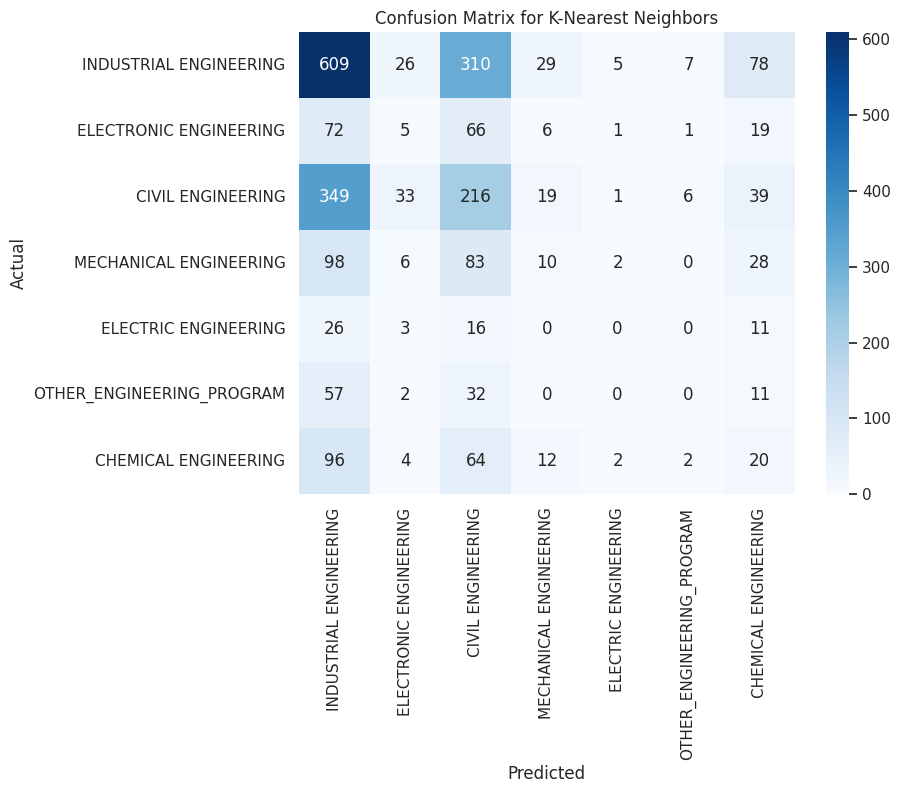

Evaluating model: Random Forest
Classification Report for Random Forest:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.152542  0.045000  0.069498   200.000000
CIVIL ENGINEERING           0.283142  0.260935  0.271586   663.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.088235  0.017647  0.029412   170.000000
INDUSTRIAL ENGINEERING      0.460900  0.731203  0.565407  1064.000000
MECHANICAL ENGINEERING      0.065789  0.022026  0.033003   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.390008  0.390008  0.390008     0.390008
macro avg                   0.150087  0.153830  0.138415  2482.000000
weighted avg                0.297568  0.390008  0.325562  2482.000000


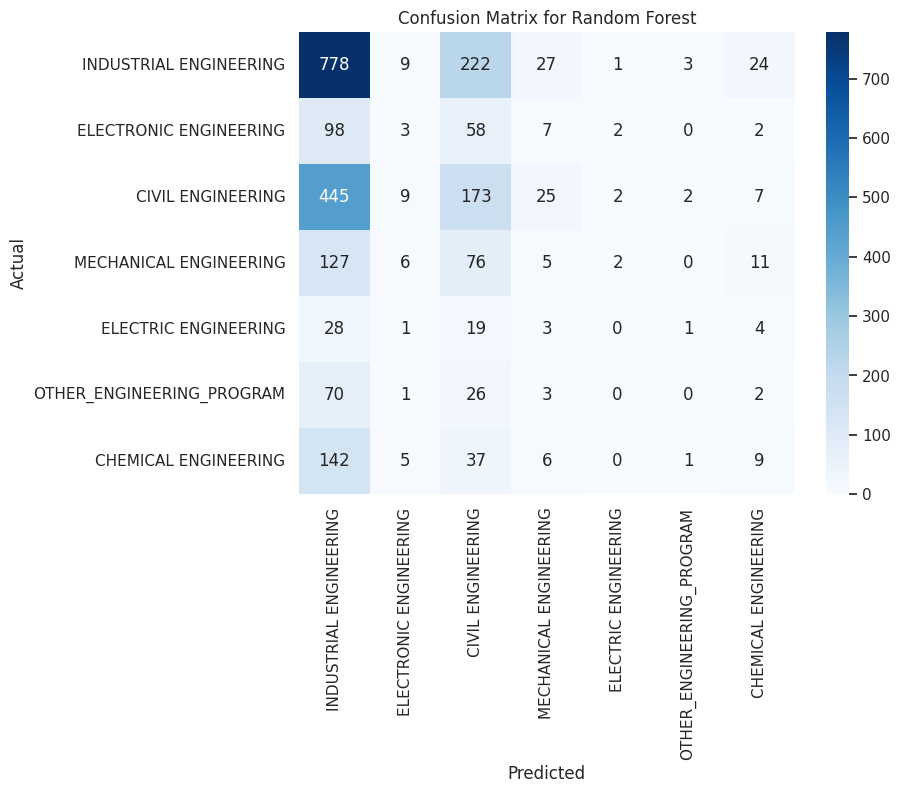

Evaluating model: Gradient Boosting
Classification Report for Gradient Boosting:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.090909  0.005000  0.009479   200.000000
CIVIL ENGINEERING           0.314763  0.170437  0.221135   663.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.461725  0.895677  0.609335  1064.000000
MECHANICAL ENGINEERING      0.137931  0.017621  0.031250   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.431507  0.431507  0.431507     0.431507
macro avg                   0.143618  0.155534  0.124457  2482.000000
weighted avg                0.301956  0.431507  0.323906  2482.000000


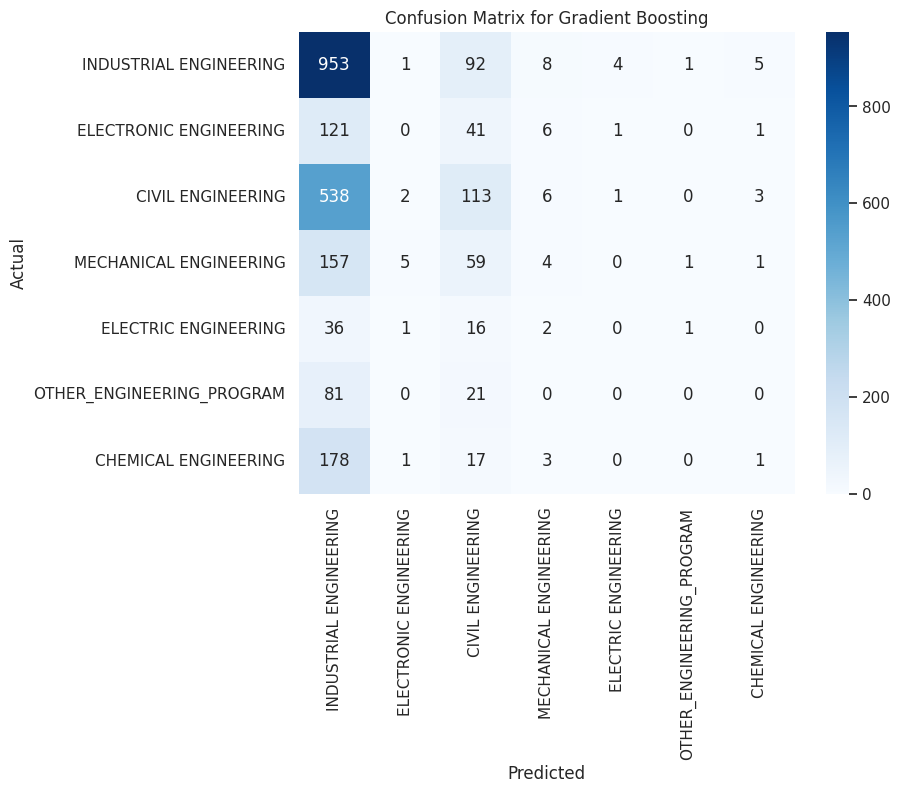

Evaluating model: Support Vector Machine


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report for Support Vector Machine:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.000000  0.000000  0.000000   663.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.428687  1.000000  0.600113  1064.000000
MECHANICAL ENGINEERING      0.000000  0.000000  0.000000   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.428687  0.428687  0.428687     0.428687
macro avg                   0.061241  0.142857  0.085730  2482.000000
weighted avg                0.183772  0.428687  0.257260  2482.000000


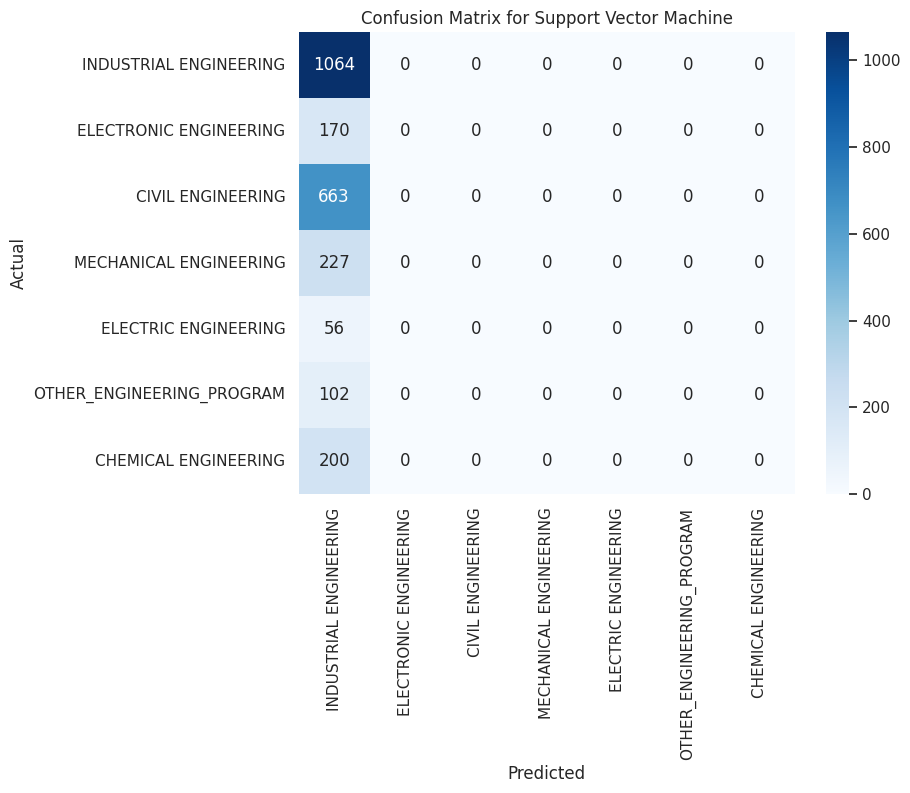

Evaluating model: Neural Network


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report for Neural Network:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.275510  0.040724  0.070959   663.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.434144  0.972744  0.600348  1064.000000
MECHANICAL ENGINEERING      0.000000  0.000000  0.000000   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.427881  0.427881  0.427881     0.427881
macro avg                   0.101379  0.144781  0.095901  2482.000000
weighted avg                0.259707  0.427881  0.276316  2482.000000


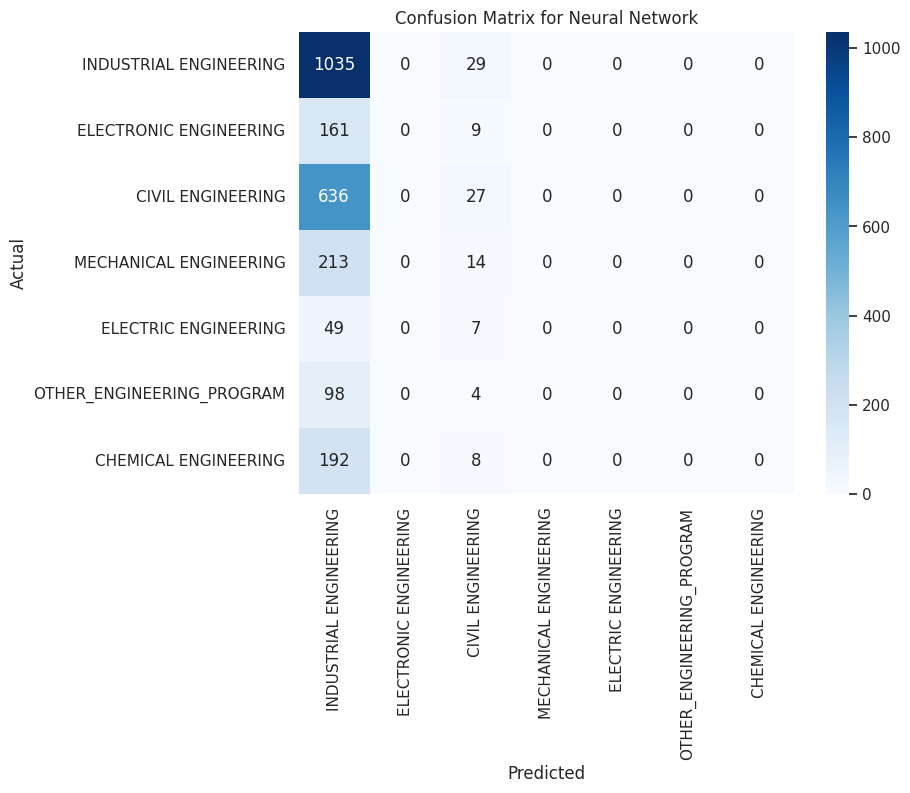

In [ ]:
# Prepare your features and target variable
X = extracted_data.drop('ACADEMIC_PROGRAM', axis=1)
y = extracted_data['ACADEMIC_PROGRAM']

# Split the data into training and testing sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Dictionary of models to evaluate
models = {
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "Support Vector Machine": SVC(),
    "Neural Network": MLPClassifier(max_iter=1000)
}

# Loop through each model
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")

    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate the confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Calculate and display classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


In [ ]:
pip install lightgbm catboost seaborn matplotlib


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.0 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


Evaluating model: Naive Bayes
Classification Report for Naive Bayes:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.133333  0.360000  0.194595   200.00000
CIVIL ENGINEERING           0.373134  0.037707  0.068493   663.00000
ELECTRIC ENGINEERING        0.062500  0.017857  0.027778    56.00000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.00000
INDUSTRIAL ENGINEERING      0.479419  0.744361  0.583211  1064.00000
MECHANICAL ENGINEERING      0.128788  0.074890  0.094708   227.00000
OTHER_ENGINEERING_PROGRAM   0.051724  0.029412  0.037500   102.00000
accuracy                    0.366640  0.366640  0.366640     0.36664
macro avg                   0.175557  0.180604  0.143755  2482.00000
weighted avg                0.331252  0.366640  0.294821  2482.00000


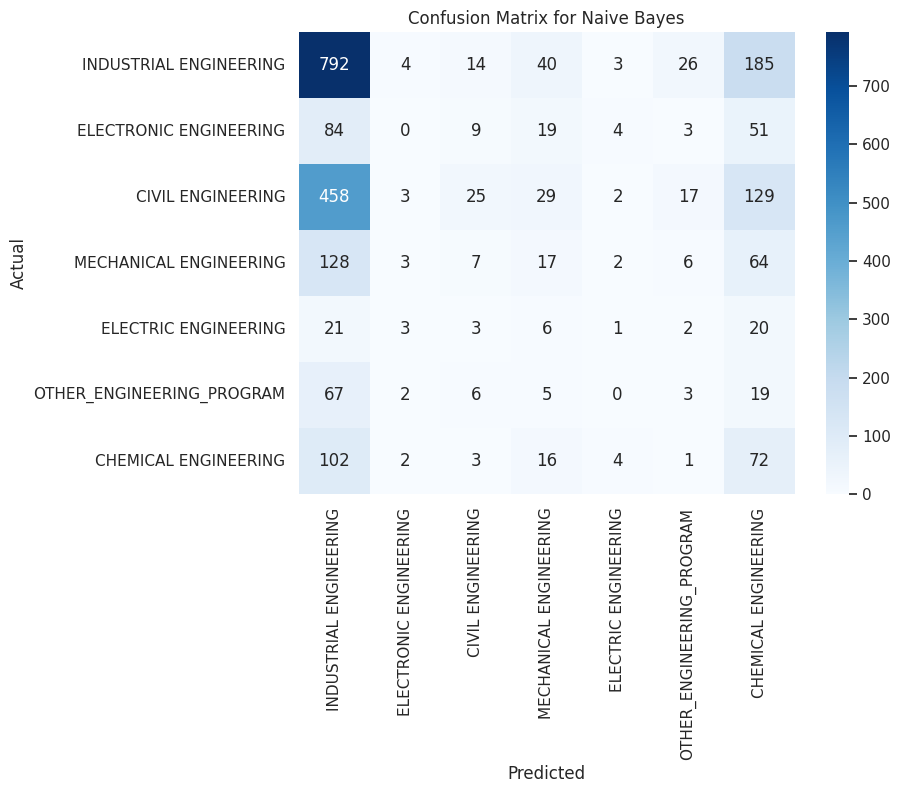

Evaluating model: Decision Tree
Classification Report for Decision Tree:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.090000  0.090000  0.090000   200.000000
CIVIL ENGINEERING           0.276374  0.280543  0.278443   663.000000
ELECTRIC ENGINEERING        0.043478  0.053571  0.048000    56.000000
ELECTRONIC ENGINEERING      0.086486  0.094118  0.090141   170.000000
INDUSTRIAL ENGINEERING      0.486434  0.471805  0.479008  1064.000000
MECHANICAL ENGINEERING      0.133333  0.123348  0.128146   227.000000
OTHER_ENGINEERING_PROGRAM   0.035398  0.039216  0.037209   102.000000
accuracy                    0.304996  0.304996  0.304996     0.304996
macro avg                   0.164501  0.164657  0.164421  2482.000000
weighted avg                0.310160  0.304996  0.307481  2482.000000


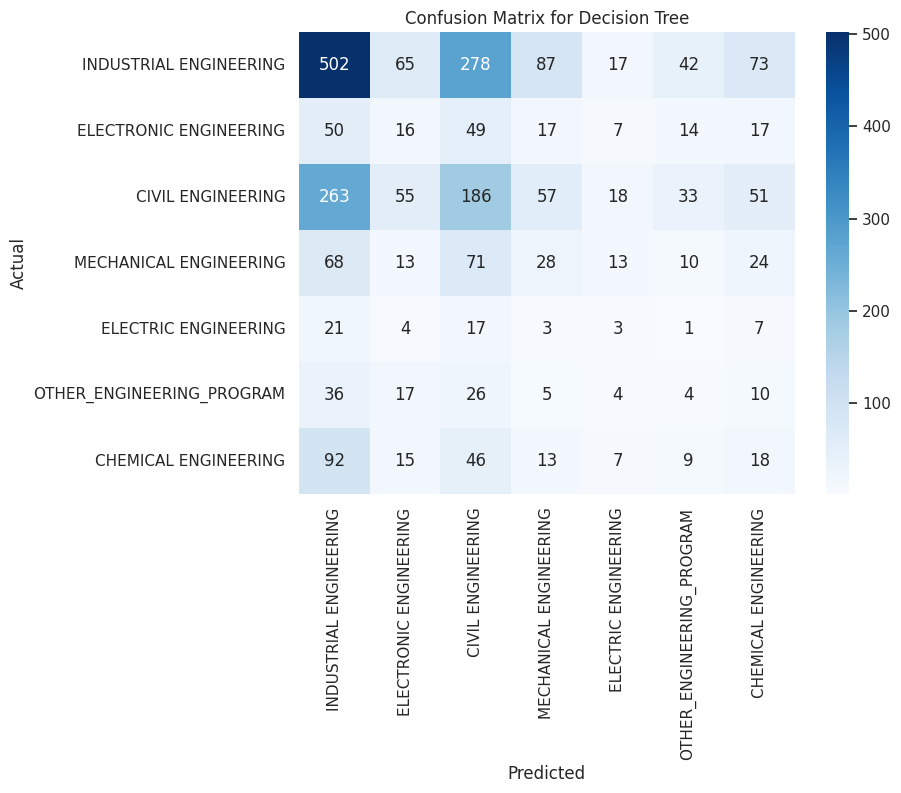

Evaluating model: LightGBM
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 333
[LightGBM] [Info] Number of data points in the train set: 9924, number of used features: 8
[LightGBM] [Info] Start training from score -2.518100
[LightGBM] [Info] Start training from score -1.318888
[LightGBM] [Info] Start training from score -3.800034
[LightGBM] [Info] Start training from score -2.682090
[LightGBM] [Info] Start training from score -0.847096
[LightGBM] [Info] Start training from score -2.392569
[LightGBM] [Info] Start training from score -3.191444
Classification Report for LightGBM:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.113208  0.030000  0.047431   200.00000
CIVIL ENGINEERING           0.290722  0.212670  0.245645   663.00000
EL

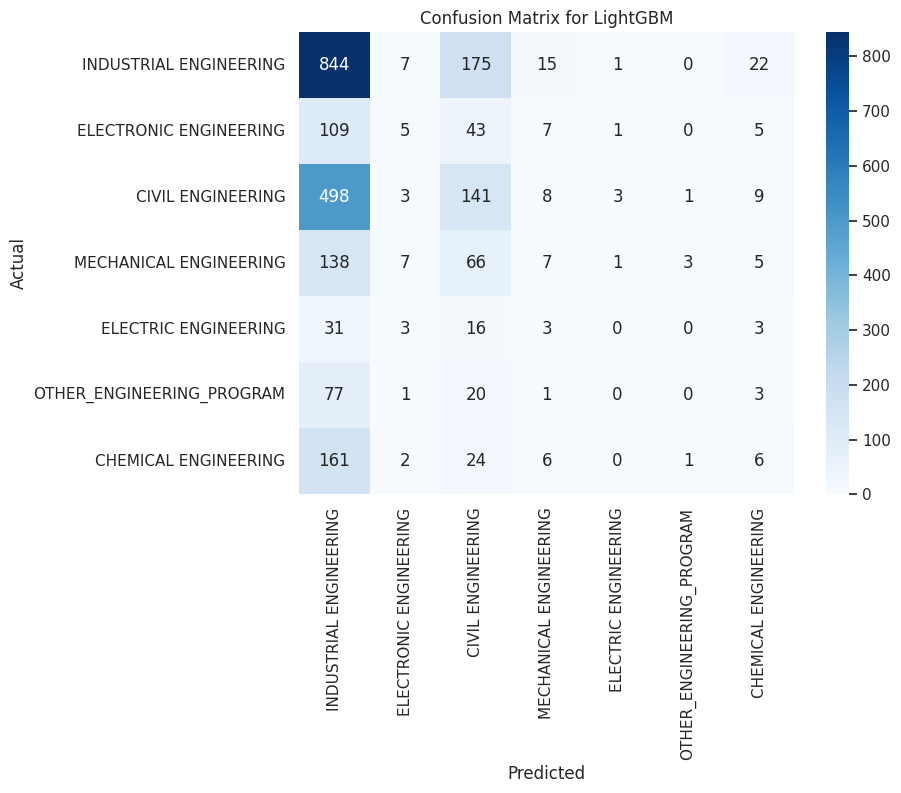

Evaluating model: CatBoost
Classification Report for CatBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.160714  0.045000  0.070312   200.000000
CIVIL ENGINEERING           0.275000  0.215686  0.241758   663.000000
ELECTRIC ENGINEERING        0.333333  0.017857  0.033898    56.000000
ELECTRONIC ENGINEERING      0.157895  0.035294  0.057692   170.000000
INDUSTRIAL ENGINEERING      0.458218  0.778195  0.576803  1064.000000
MECHANICAL ENGINEERING      0.134615  0.030837  0.050179   227.000000
OTHER_ENGINEERING_PROGRAM   0.166667  0.009804  0.018519   102.000000
accuracy                    0.400886  0.400886  0.400886     0.400886
macro avg                   0.240920  0.161811  0.149880  2482.000000
weighted avg                0.320338  0.400886  0.327579  2482.000000


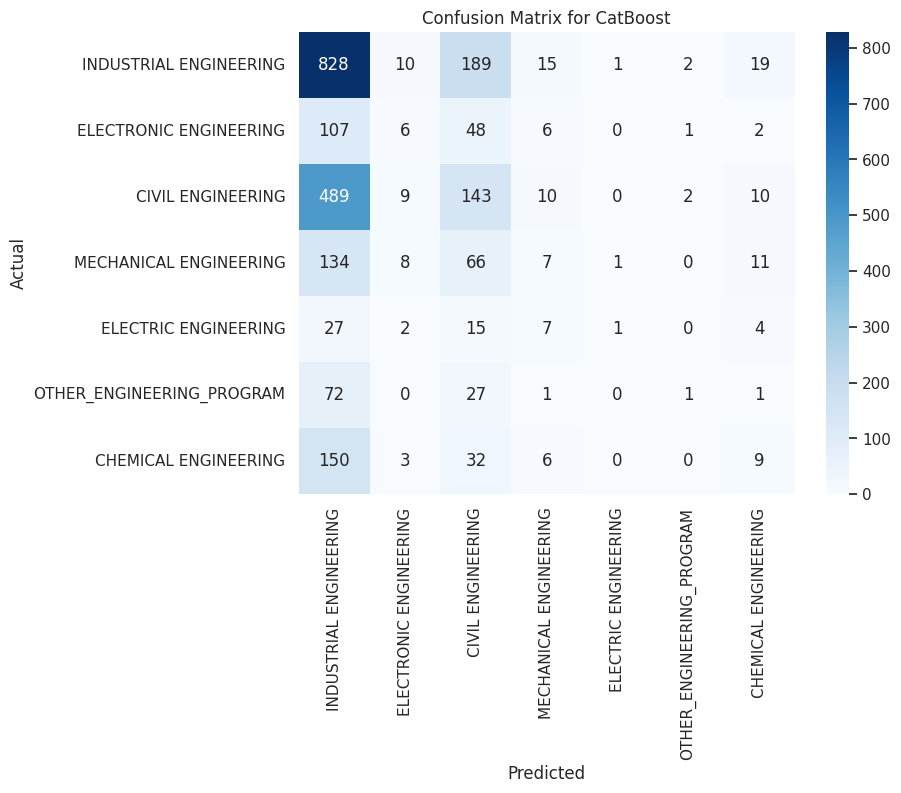

In [ ]:
# Prepare your features and target variable
X = extracted_data.drop('ACADEMIC_PROGRAM', axis=1)
y = extracted_data['ACADEMIC_PROGRAM']

# Split the data into training and testing sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Dictionary of models to evaluate
models = {
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "LightGBM": lgb.LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0)  # Set verbose=0 to avoid excessive output
}

# Loop through each model
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")

    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate the confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Calculate and display classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


In [ ]:
# Separate features (X) and target (y)
X = extracted_data.drop(columns='ACADEMIC_PROGRAM')
y = extracted_data['ACADEMIC_PROGRAM']

# Initialize StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize the models
models = {
    'KNN': KNeighborsClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'SVM': SVC(),
    'Neural Network': MLPClassifier(max_iter=1000)
}

# Standardize features (important for models like KNN, SVM, Neural Network)
scaler = StandardScaler()

# Loop through each fold and model
for model_name, model in models.items():
    print(f"Evaluating {model_name} model:")

    # Initialize lists to collect results for each fold
    all_reports = []

    for train_index, test_index in skf.split(X, y):
        # Split the data into train and test for this fold
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Standardize features
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Train the model
        model.fit(X_train_scaled, y_train)

        # Make predictions
        y_pred = model.predict(X_test_scaled)

        # Generate classification report for this fold
        report = classification_report(y_test, y_pred, output_dict=True)
        all_reports.append(report)

        # Sample predictions (first 10)
        sample_predictions = pd.DataFrame({
            'Actual': y_test.head(10).values,
            'Predicted': y_pred[:10]
        })
        print("Sample Predictions:")
        print(sample_predictions)

    # Average classification report
    # We need to average each metric across all reports
    avg_report = {}

    for key in all_reports[0].keys():
        if isinstance(all_reports[0][key], dict):
            avg_report[key] = {}
            for metric in all_reports[0][key].keys():
                avg_report[key][metric] = np.mean([fold[key][metric] for fold in all_reports])
        else:
            # If it's a float (like accuracy), take the mean directly
            avg_report[key] = np.mean([fold[key] for fold in all_reports])

    # Display average classification report
    avg_report_df = pd.DataFrame(avg_report).transpose()
    print("Average Classification Report:")
    print(avg_report_df)
    print("\n" + "="*80 + "\n")


Evaluating KNN model:
Sample Predictions:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
3  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING    CHEMICAL ENGINEERING
6  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
Sample Predictions:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING
1     INDUSTRIAL ENGINEERING  ELECTRONIC ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sample Predictions:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sample Predictions:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM       CIVIL ENGINEERING


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sample Predictions:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
6     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sample Predictions:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sample Predictions:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
8  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
9  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
Average Classification Report:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.302180  0.093155  0.142336   663.400000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    55.600000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   169.800000
INDUSTRIAL ENGINEERING      0.446188  0.952613  0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sample Predictions:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  MECHANICAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sample Predictions:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
4     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM       CIVIL ENGINEERING


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sample Predictions:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING       CIVIL ENGINEERING
1          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
6     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sample Predictions:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3       CIVIL ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
Sample Predictions:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7       CI

Evaluating model: K-Nearest Neighbors
Average Classification Report for K-Nearest Neighbors:
                           precision    recall  f1-score       support
CHEMICAL ENGINEERING        0.142361  0.164000  0.152416   1000.000000
CIVIL ENGINEERING           0.286965  0.355743  0.317674   3317.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    278.000000
ELECTRONIC ENGINEERING      0.076923  0.034158  0.047308    849.000000
INDUSTRIAL ENGINEERING      0.462534  0.544378  0.500130   5318.000000
MECHANICAL ENGINEERING      0.092784  0.031746  0.047306   1134.000000
OTHER_ENGINEERING_PROGRAM   0.063492  0.007843  0.013962    510.000000
accuracy                    0.347251  0.347251  0.347251      0.347251
macro avg                   0.160723  0.162553  0.154114  12406.000000
weighted avg                0.302828  0.347251  0.319745  12406.000000


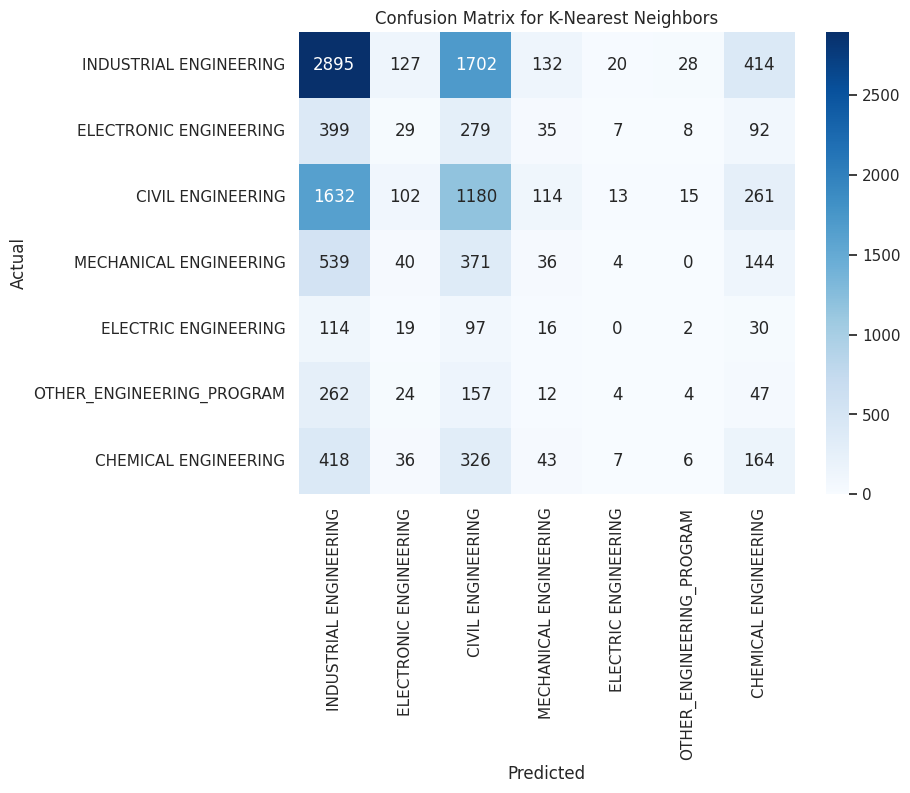

Evaluating model: Random Forest
Average Classification Report for Random Forest:
                           precision    recall  f1-score       support
CHEMICAL ENGINEERING        0.203883  0.063000  0.096257   1000.000000
CIVIL ENGINEERING           0.275211  0.255050  0.264747   3317.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    278.000000
ELECTRONIC ENGINEERING      0.124294  0.025913  0.042885    849.000000
INDUSTRIAL ENGINEERING      0.467112  0.737119  0.571845   5318.000000
MECHANICAL ENGINEERING      0.135678  0.047619  0.070496   1134.000000
OTHER_ENGINEERING_PROGRAM   0.029412  0.001961  0.003676    510.000000
accuracy                    0.395454  0.395454  0.395454      0.395454
macro avg                   0.176513  0.161523  0.149987  12406.000000
weighted avg                0.312369  0.395454  0.333204  12406.000000


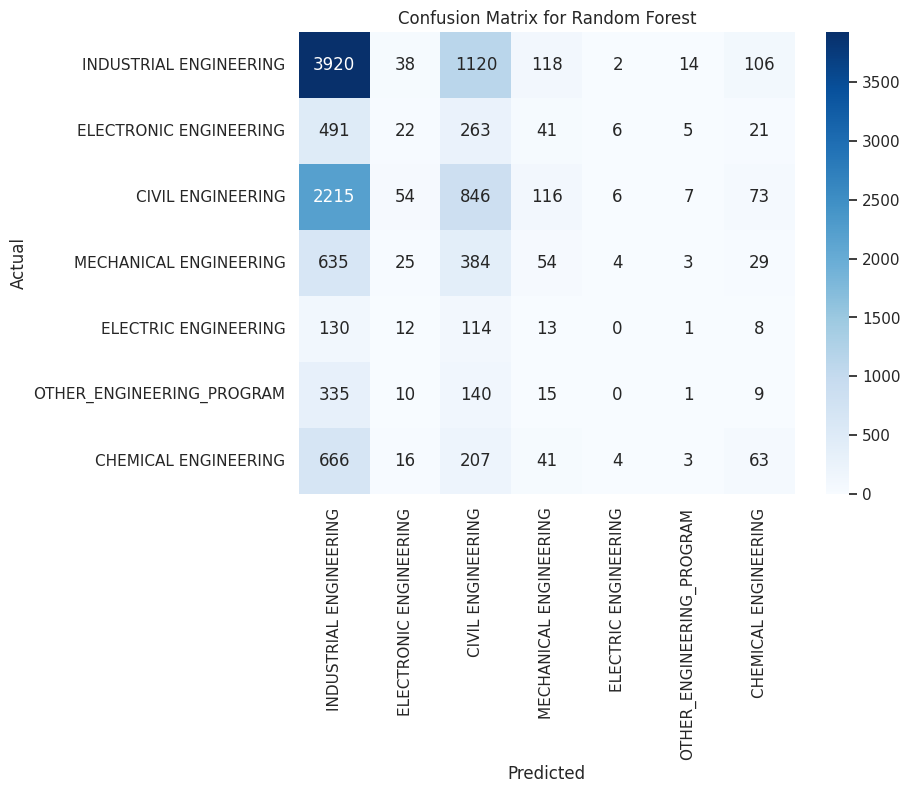

Evaluating model: Gradient Boosting
Average Classification Report for Gradient Boosting:
                           precision    recall  f1-score       support
CHEMICAL ENGINEERING        0.097222  0.007000  0.013060   1000.000000
CIVIL ENGINEERING           0.309716  0.173952  0.222780   3317.000000
ELECTRIC ENGINEERING        0.043478  0.003597  0.006645    278.000000
ELECTRONIC ENGINEERING      0.106667  0.009423  0.017316    849.000000
INDUSTRIAL ENGINEERING      0.457699  0.875893  0.601226   5318.000000
MECHANICAL ENGINEERING      0.149171  0.023810  0.041065   1134.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000    510.000000
accuracy                    0.425439  0.425439  0.425439      0.425439
macro avg                   0.166279  0.156239  0.128870  12406.000000
weighted avg                0.308754  0.425439  0.323429  12406.000000


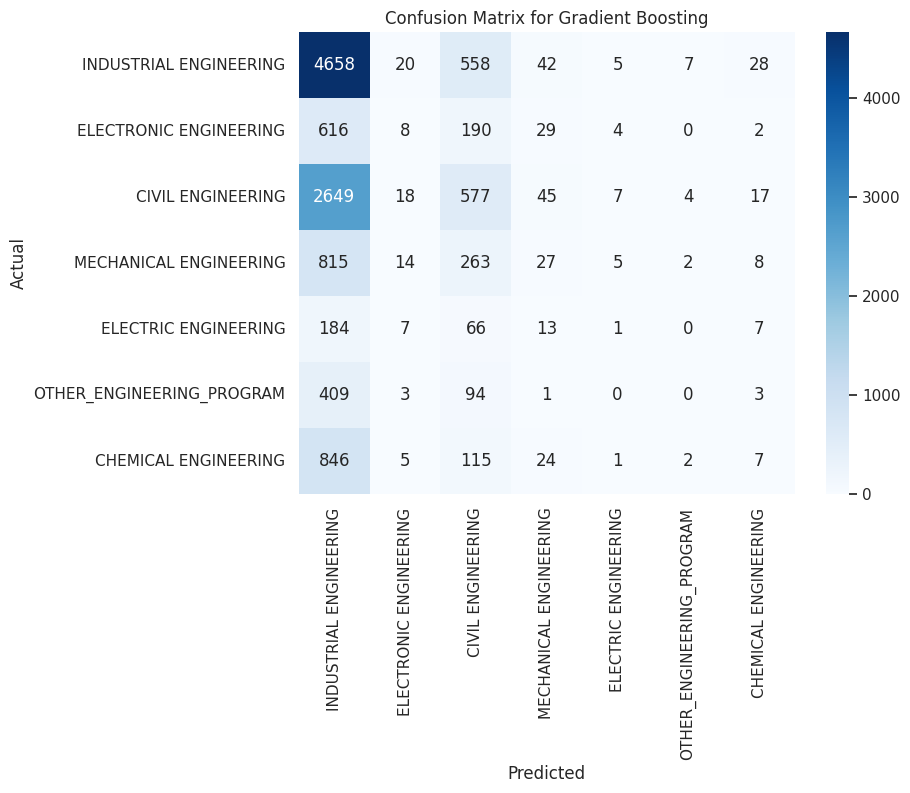

Evaluating model: Support Vector Machine


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Average Classification Report for Support Vector Machine:
                           precision    recall  f1-score       support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   1000.000000
CIVIL ENGINEERING           0.000000  0.000000  0.000000   3317.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    278.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000    849.000000
INDUSTRIAL ENGINEERING      0.428664  1.000000  0.600090   5318.000000
MECHANICAL ENGINEERING      0.000000  0.000000  0.000000   1134.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000    510.000000
accuracy                    0.428664  0.428664  0.428664      0.428664
macro avg                   0.061238  0.142857  0.085727  12406.000000
weighted avg                0.183752  0.428664  0.257237  12406.000000


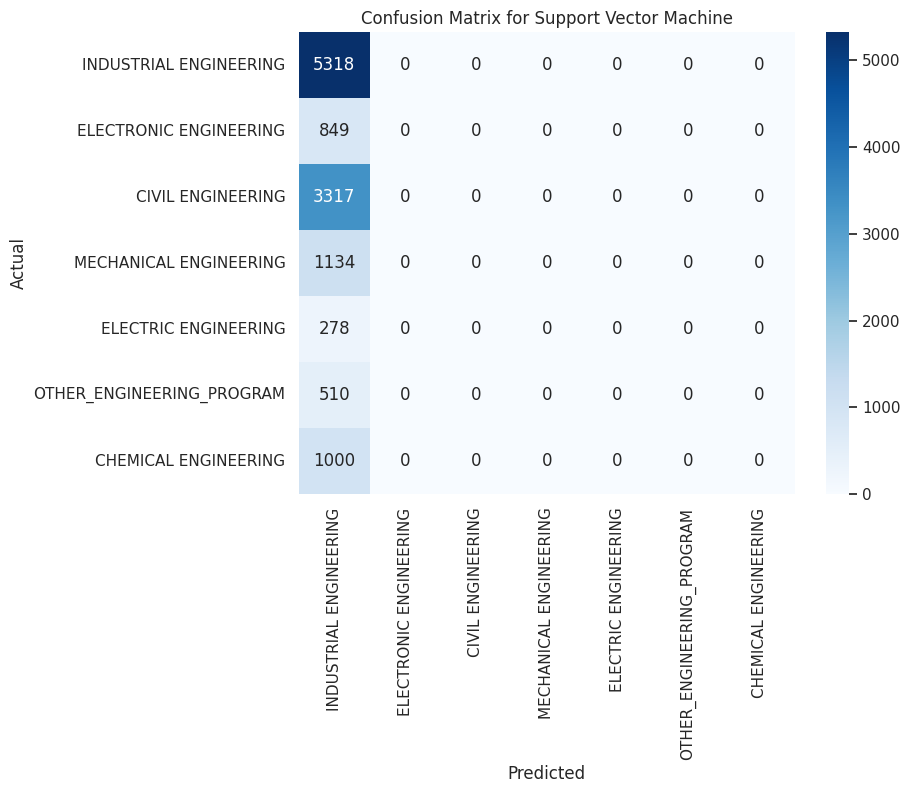

Evaluating model: Neural Network


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Average Classification Report for Neural Network:
                           precision    recall  f1-score       support
CHEMICAL ENGINEERING        0.227273  0.040000  0.068027   1000.000000
CIVIL ENGINEERING           0.296041  0.103708  0.153606   3317.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    278.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000    849.000000
INDUSTRIAL ENGINEERING      0.440753  0.915570  0.595050   5318.000000
MECHANICAL ENGINEERING      0.142857  0.002646  0.005195   1134.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000    510.000000
accuracy                    0.423666  0.423666  0.423666      0.423666
macro avg                   0.158132  0.151703  0.117411  12406.000000
weighted avg                0.299465  0.423666  0.302104  12406.000000


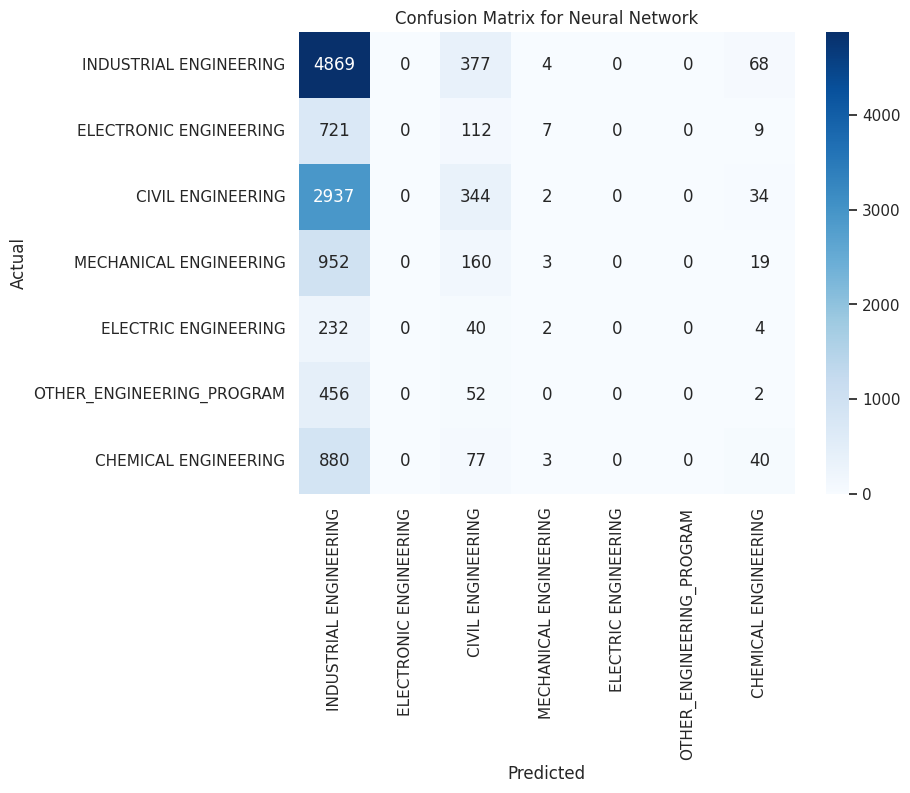

''

In [ ]:
# Prepare your features and target variable
X = extracted_data.drop('ACADEMIC_PROGRAM', axis=1)
y = extracted_data['ACADEMIC_PROGRAM']

# Initialize Stratified K-Fold
skf = StratifiedKFold(n_splits=5)

# Dictionary of models to evaluate
models = {
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "Support Vector Machine": SVC(),
    "Neural Network": MLPClassifier(max_iter=1000)
}

# Loop through each model
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")

    # Initialize a total confusion matrix
    total_confusion_matrix = np.zeros((len(y.unique()), len(y.unique())))

    # Store all true labels and predictions for classification report
    all_y_true = []
    all_y_pred = []

    # Stratified K-Fold cross-validation
    for train_index, test_index in skf.split(X, y):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train the model
        model.fit(X_train, y_train)

        # Make predictions
        y_pred = model.predict(X_test)

        # Store true and predicted labels
        all_y_true.extend(y_test)
        all_y_pred.extend(y_pred)

        # Compute the confusion matrix for this fold
        confusion_matrix_fold = confusion_matrix(y_test, y_pred, labels=y.unique())

        # Add the confusion matrix of this fold to the total confusion matrix
        total_confusion_matrix += confusion_matrix_fold

    # Calculate and display average classification report across all folds
    report = classification_report(all_y_true, all_y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Average Classification Report for {model_name}:")
    print(avg_report)

    # Plot the total confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(total_confusion_matrix, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()
""


Evaluating model: Naive Bayes
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Average Accuracy for Naive Bayes: 0.3631
Classification Report for Naive Bayes:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.148330  0.428000  0.219532   200.00000
CIVIL ENGINEERING           0.276353  0.038886  0.067890   663.40000
ELECTRIC ENGINEERING        0.020947  0.014286  0.015662    55.60000
ELECTRONIC ENGINEERING      0.115012  0.016491  0.028799   169.80000
INDUSTRIAL ENGINEERING      0.476138  0.718507  0.572614  1063.60000
MECHANICAL ENGINEERING      0.180725  0.076714  0.105942   226.80000
OTHER_ENGINEERING_PROGRAM   0.062724  0.043137  0.051000   102.00000
accuracy                    0.363130  0.363130  0.363130     0.36313
macro avg                   0.182890  0.190860  0.151634  2481.20000
weighted avg                0.317395  0.363130  0.295413  2481.20000


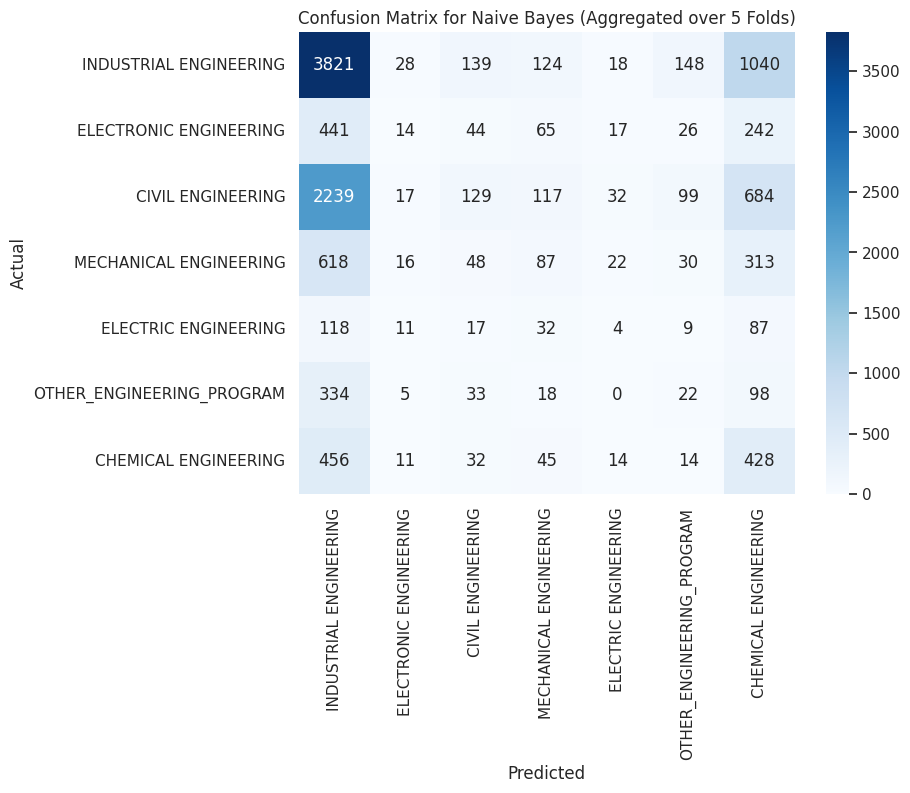


Evaluating model: Decision Tree
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Average Accuracy for Decision Tree: 0.3019
Classification Report for Decision Tree:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.144586  0.155000  0.149569   200.000000
CIVIL ENGINEERING           0.279738  0.274343  0.276921   663.400000
ELECTRIC ENGINEERING        0.033710  0.039481  0.035787    55.600000
ELECTRONIC ENGINEERING      0.078312  0.081274  0.079619   169.800000
INDUSTRIAL ENGINEERING      0.479339  0.459384  0.469111  1063.600000
MECHANICAL ENGINEERING      0.110361  0.117290  0.113695   226.800000
OTHER_ENGINEERING_PROGRAM   0.041320  0.047059  0.043849   102.000000
accuracy                    0.301871  0.301871  0.301871     0.301871
macro avg                   0.166767  0.167690  0.166936  2481.200000
weighted avg                0.309824  0.301871  0.305634  2481.200000


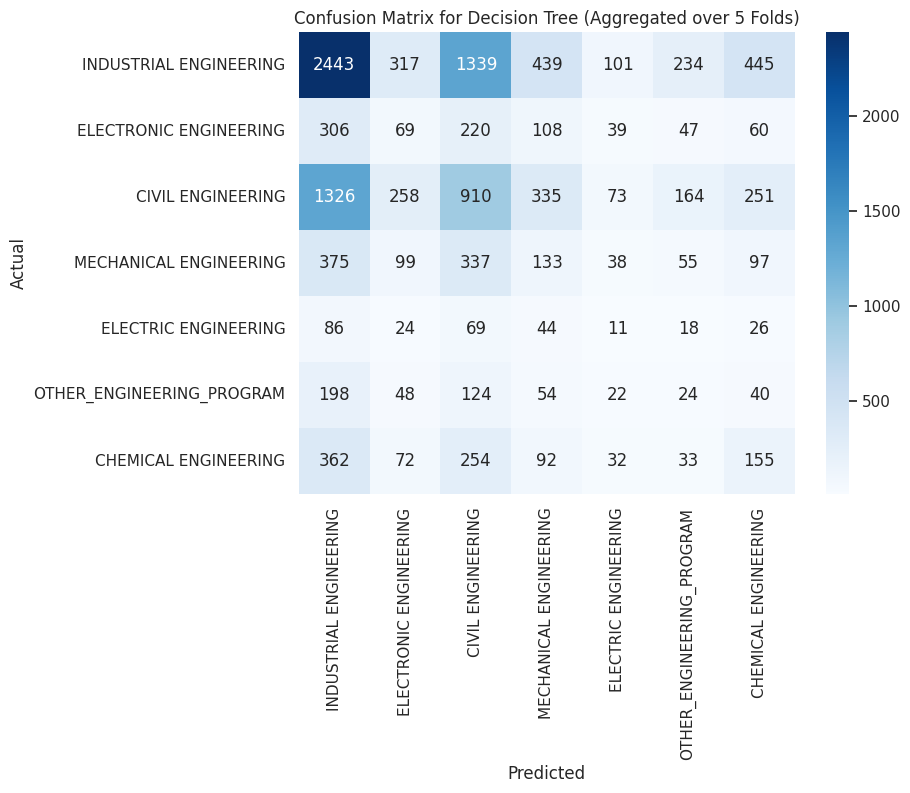


Evaluating model: LightGBM
Fold 1
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 337
[LightGBM] [Info] Number of data points in the train set: 9924, number of used features: 8
[LightGBM] [Info] Start training from score -2.518100
[LightGBM] [Info] Start training from score -1.318888
[LightGBM] [Info] Start training from score -3.800034
[LightGBM] [Info] Start training from score -2.682090
[LightGBM] [Info] Start training from score -0.847096
[LightGBM] [Info] Start training from score -2.392569
[LightGBM] [Info] Start training from score -3.191444
Fold 2
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Lig

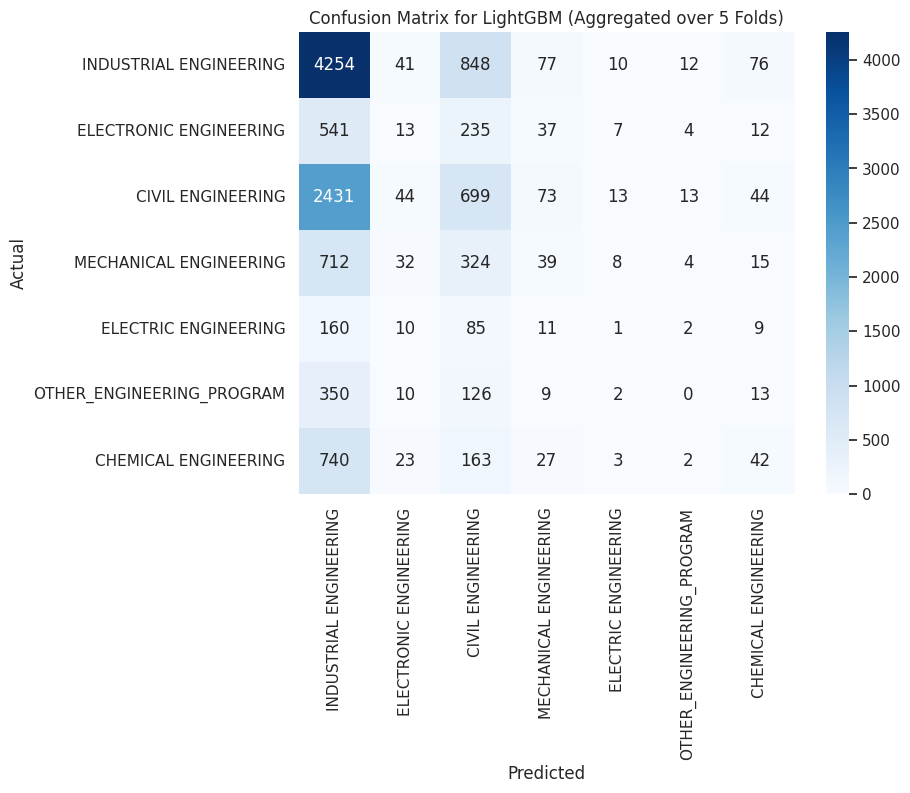


Evaluating model: CatBoost
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Average Accuracy for CatBoost: 0.4071
Classification Report for CatBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.209831  0.040000  0.066854   200.000000
CIVIL ENGINEERING           0.286559  0.233344  0.257199   663.400000
ELECTRIC ENGINEERING        0.100000  0.007273  0.013454    55.600000
ELECTRONIC ENGINEERING      0.143628  0.031793  0.051891   169.800000
INDUSTRIAL ENGINEERING      0.467296  0.783569  0.585436  1063.600000
MECHANICAL ENGINEERING      0.117349  0.035270  0.054093   226.800000
OTHER_ENGINEERING_PROGRAM   0.033333  0.001961  0.003704   102.000000
accuracy                    0.407142  0.407142  0.407142     0.407142
macro avg                   0.194000  0.161887  0.147519  2481.200000
weighted avg                0.317986  0.407142  0.334057  2481.200000


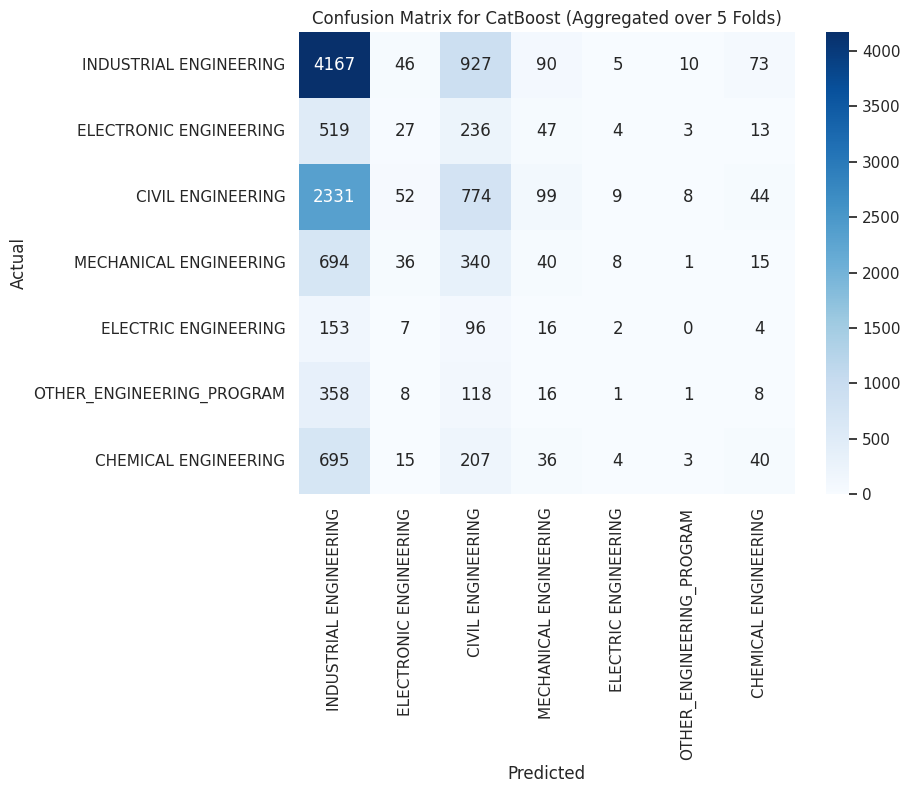

In [ ]:
# Prepare your features and target variable
X = extracted_data.drop('ACADEMIC_PROGRAM', axis=1)
y = extracted_data['ACADEMIC_PROGRAM']

# Dictionary of models to evaluate
models = {
    "Naive Bayes": GaussianNB(),
    "Decision Tree": DecisionTreeClassifier(),
    "LightGBM": lgb.LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0)  # Set verbose=0 to avoid excessive output
}

# Initialize StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Loop through each model
for model_name, model in models.items():
    print(f"\nEvaluating model: {model_name}")

    # To store metrics across all folds
    fold_accuracies = []
    fold_classification_reports = []
    fold_confusion_matrices = np.zeros((len(y.unique()), len(y.unique())))

    # Loop through each fold
    for fold, (train_idx, test_idx) in enumerate(skf.split(X, y), 1):
        print(f"Fold {fold}")

        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Train the model
        model.fit(X_train, y_train)

        # Make predictions
        y_pred = model.predict(X_test)

        # Calculate metrics
        fold_accuracy = accuracy_score(y_test, y_pred)
        fold_accuracies.append(fold_accuracy)

        # Confusion matrix
        confusion_matrix_fold = confusion_matrix(y_test, y_pred, labels=y.unique())
        fold_confusion_matrices += confusion_matrix_fold

        # Classification report
        report = classification_report(y_test, y_pred, output_dict=True)
        fold_classification_reports.append(pd.DataFrame(report).transpose())

    # Average accuracy over folds
    avg_accuracy = np.mean(fold_accuracies)
    print(f"Average Accuracy for {model_name}: {avg_accuracy:.4f}")

    # Average classification report across folds
    avg_classification_report = pd.concat(fold_classification_reports).groupby(level=0).mean()
    print(f"Classification Report for {model_name}:")
    print(avg_classification_report)

    # Plot the aggregated confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(fold_confusion_matrices, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name} (Aggregated over 5 Folds)")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


*Extraction2*

In [ ]:
# Extracting specific columns from the DataFrame 'data'
columns_to_extract_2 = ['ACADEMIC_PROGRAM', 'GENDER', 'JOB', 'SCHOOL_TYPE', 'MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11','SCHOOL_NAT','SCHOOL_NAME','UNIVERSITY']
extracted_data_2 = data[columns_to_extract_2]

# Display the extracted DataFrame
print(extracted_data_2)


               ACADEMIC_PROGRAM  GENDER  JOB SCHOOL_TYPE  MAT_S11  CR_S11  \
0        INDUSTRIAL ENGINEERING       0    0    ACADEMIC       71      81   
1        INDUSTRIAL ENGINEERING       0    0    ACADEMIC       83      75   
2        ELECTRONIC ENGINEERING       1    1    ACADEMIC       52      49   
3        INDUSTRIAL ENGINEERING       0    0    ACADEMIC       56      55   
4        INDUSTRIAL ENGINEERING       1    0    ACADEMIC       80      65   
...                         ...     ...  ...         ...      ...     ...   
12406  MECHATRONICS ENGINEERING       1    0    ACADEMIC       67      69   
12407    INDUSTRIAL ENGINEERING       1    0    ACADEMIC       58      57   
12408    INDUSTRIAL ENGINEERING       1    0    ACADEMIC       66      69   
12409         CIVIL ENGINEERING       0    0    ACADEMIC       53      69   
12410    INDUSTRIAL ENGINEERING       1    0    ACADEMIC       79      65   

       CC_S11  BIO_S11  ENG_S11 SCHOOL_NAT  \
0          61       86       

In [ ]:
# Function to count unique values in each column
def count_unique_values(df):
    unique_counts = {}
    for col in df.columns:
        unique_counts[col] = df[col].value_counts(dropna=False)
    return unique_counts

# Generate the counts of unique values for each column
unique_value_counts = count_unique_values(extracted_data_2)

# Display the counts
for col, counts in unique_value_counts.items():
    print(f"Column: {col}")
    print(counts)
    print("\n")

Column: ACADEMIC_PROGRAM
ACADEMIC_PROGRAM
INDUSTRIAL ENGINEERING                           5318
CIVIL ENGINEERING                                3320
MECHANICAL ENGINEERING                           1135
CHEMICAL ENGINEERING                             1000
ELECTRONIC ENGINEERING                            849
ELECTRIC ENGINEERING                              278
MECHATRONICS ENGINEERING                           82
CATASTRAL ENGINEERING AND GEODESY                  78
PRODUCTION ENGINEERING                             60
ELECTRIC ENGINEERING AND TELECOMMUNICATIONS        47
AERONAUTICAL ENGINEERING                           44
TOPOGRAPHIC ENGINEERY                              42
ELECTROMECHANICAL ENGINEERING                      34
PRODUCTIVITY AND QUALITY ENGINEERING               29
TRANSPORTATION AND ROAD ENGINEERING                27
INDUSTRIAL AUTOMATIC ENGINEERING                   22
CONTROL ENGINEERING                                20
CIVIL CONSTRUCTIONS                     

In [ ]:
extracted_data_2

,ACADEMIC_PROGRAM,GENDER,JOB,SCHOOL_TYPE,MAT_S11,CR_S11,CC_S11,BIO_S11,ENG_S11,SCHOOL_NAT,SCHOOL_NAME,UNIVERSITY
0,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,71,81,61,86,82,PRIVATE,COL NUEVO CAMBRIDGE,UNIVERSIDAD DE SANTANDER - UDES-BUCARAMANGA
1,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,83,75,66,100,88,PRIVATE,COL LA QUINTA DEL PUENTE,UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.
2,ELECTRONIC ENGINEERING,1,1,ACADEMIC,52,49,38,46,42,PRIVATE,CENT EDUC PAULO FREIRE ...,UNIVERSIDAD NACIONAL ABIERTA Y A DISTANCIA UNA...
3,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,56,55,51,64,73,PRIVATE,LICEO ANDINO,UNIVERSIDAD CATOLICA DE PEREIRA-PEREIRA
4,INDUSTRIAL ENGINEERING,1,0,ACADEMIC,80,65,76,85,92,PRIVATE,LIC TALLER SAN MIGUEL,UNIVERSIDAD INDUSTRIAL DE SANTANDER-BUCARAMANGA
...,...,...,...,...,...,...,...,...,...,...,...,...
12406,MECHATRONICS ENGINEERING,1,0,ACADEMIC,67,69,70,67,81,PRIVATE,COLEGIO NUESTRA SENORA DE LAS MISERICORDIAS,UNIVERSIDAD ECCI-BOGOTÁ D.C.
12407,INDUSTRIAL ENGINEERING,1,0,ACADEMIC,58,57,61,63,53,PUBLIC,COLEGIO REPUBLICA FEDERAL DE ALEMANIA (IED),INSTITUCION UNIVERSITARIA DE COLOMBIA - UNIVER...
12408,INDUSTRIAL ENGINEERING,1,0,ACADEMIC,66,69,75,70,58,PRIVATE,INSTITUTO SIGMUND FREUD,UNIVERSIDAD TECNOLOGICA DE BOLIVAR-CARTAGENA
12409,CIVIL ENGINEERING,0,0,ACADEMIC,53,69,64,59,52,PRIVATE,INSTITUTO SIGMUND FREUD,UNIVERSIDAD TECNOLOGICA DE BOLIVAR-CARTAGENA


In [ ]:
extracted_data_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12411 entries, 0 to 12410
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ACADEMIC_PROGRAM  12411 non-null  object
 1   GENDER            12411 non-null  int64 
 2   JOB               12411 non-null  int64 
 3   SCHOOL_TYPE       12411 non-null  object
 4   MAT_S11           12411 non-null  int64 
 5   CR_S11            12411 non-null  int64 
 6   CC_S11            12411 non-null  int64 
 7   BIO_S11           12411 non-null  int64 
 8   ENG_S11           12411 non-null  int64 
 9   SCHOOL_NAT        12411 non-null  object
 10  SCHOOL_NAME       12411 non-null  object
 11  UNIVERSITY        12411 non-null  object
dtypes: int64(7), object(5)
memory usage: 1.1+ MB


In [ ]:
extracted_data_2.head()

,ACADEMIC_PROGRAM,GENDER,JOB,SCHOOL_TYPE,MAT_S11,CR_S11,CC_S11,BIO_S11,ENG_S11,SCHOOL_NAT,SCHOOL_NAME,UNIVERSITY
0,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,71,81,61,86,82,PRIVATE,COL NUEVO CAMBRIDGE,UNIVERSIDAD DE SANTANDER - UDES-BUCARAMANGA
1,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,83,75,66,100,88,PRIVATE,COL LA QUINTA DEL PUENTE,UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.
2,ELECTRONIC ENGINEERING,1,1,ACADEMIC,52,49,38,46,42,PRIVATE,CENT EDUC PAULO FREIRE ...,UNIVERSIDAD NACIONAL ABIERTA Y A DISTANCIA UNA...
3,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,56,55,51,64,73,PRIVATE,LICEO ANDINO,UNIVERSIDAD CATOLICA DE PEREIRA-PEREIRA
4,INDUSTRIAL ENGINEERING,1,0,ACADEMIC,80,65,76,85,92,PRIVATE,LIC TALLER SAN MIGUEL,UNIVERSIDAD INDUSTRIAL DE SANTANDER-BUCARAMANGA


In [ ]:
# Create the 'average mark' column
extracted_data_2['AVG_MARK'] = extracted_data_2[['MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11']].mean(axis=1)

# View the updated DataFrame
extracted_data_2.head()


<ipython-input-47-b1aa567ae3b3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  extracted_data_2['AVG_MARK'] = extracted_data_2[['MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11']].mean(axis=1)


,ACADEMIC_PROGRAM,GENDER,JOB,SCHOOL_TYPE,MAT_S11,CR_S11,CC_S11,BIO_S11,ENG_S11,SCHOOL_NAT,SCHOOL_NAME,UNIVERSITY,AVG_MARK
0,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,71,81,61,86,82,PRIVATE,COL NUEVO CAMBRIDGE,UNIVERSIDAD DE SANTANDER - UDES-BUCARAMANGA,76.2
1,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,83,75,66,100,88,PRIVATE,COL LA QUINTA DEL PUENTE,UNIVERSIDAD DE LOS ANDES-BOGOTÁ D.C.,82.4
2,ELECTRONIC ENGINEERING,1,1,ACADEMIC,52,49,38,46,42,PRIVATE,CENT EDUC PAULO FREIRE ...,UNIVERSIDAD NACIONAL ABIERTA Y A DISTANCIA UNA...,45.4
3,INDUSTRIAL ENGINEERING,0,0,ACADEMIC,56,55,51,64,73,PRIVATE,LICEO ANDINO,UNIVERSIDAD CATOLICA DE PEREIRA-PEREIRA,59.8
4,INDUSTRIAL ENGINEERING,1,0,ACADEMIC,80,65,76,85,92,PRIVATE,LIC TALLER SAN MIGUEL,UNIVERSIDAD INDUSTRIAL DE SANTANDER-BUCARAMANGA,79.6


In [ ]:
value_counts = extracted_data_2['ACADEMIC_PROGRAM'].value_counts()

print("Count of each unique value in 'ACADEMIC_PROGRAM':")
print(value_counts)

Count of each unique value in 'ACADEMIC_PROGRAM':
ACADEMIC_PROGRAM
INDUSTRIAL ENGINEERING       5318
CIVIL ENGINEERING            3320
MECHANICAL ENGINEERING       1135
CHEMICAL ENGINEERING         1000
ELECTRONIC ENGINEERING        849
OTHER_ENGINEERING_PROGRAM     511
ELECTRIC ENGINEERING          278
Name: count, dtype: int64


In [ ]:
extracted_data_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12411 entries, 0 to 12410
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ACADEMIC_PROGRAM  12411 non-null  object 
 1   GENDER            12411 non-null  int64  
 2   JOB               12411 non-null  int64  
 3   SCHOOL_TYPE       12411 non-null  object 
 4   MAT_S11           12411 non-null  int64  
 5   CR_S11            12411 non-null  int64  
 6   CC_S11            12411 non-null  int64  
 7   BIO_S11           12411 non-null  int64  
 8   ENG_S11           12411 non-null  int64  
 9   SCHOOL_NAT        12411 non-null  object 
 10  SCHOOL_NAME       12411 non-null  object 
 11  UNIVERSITY        12411 non-null  object 
 12  AVG_MARK          12411 non-null  float64
dtypes: float64(1), int64(7), object(5)
memory usage: 1.2+ MB


Evaluating model: K-Nearest Neighbors
Classification Report for K-Nearest Neighbors:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.117073  0.120000  0.118519   200.000000
CIVIL ENGINEERING           0.260766  0.328313  0.290667   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.082192  0.035294  0.049383   170.000000
INDUSTRIAL ENGINEERING      0.462025  0.548872  0.501718  1064.000000
MECHANICAL ENGINEERING      0.063291  0.022026  0.032680   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.337092  0.337092  0.337092     0.337092
macro avg                   0.140764  0.150644  0.141852  2483.000000
weighted avg                0.288561  0.337092  0.308638  2483.000000


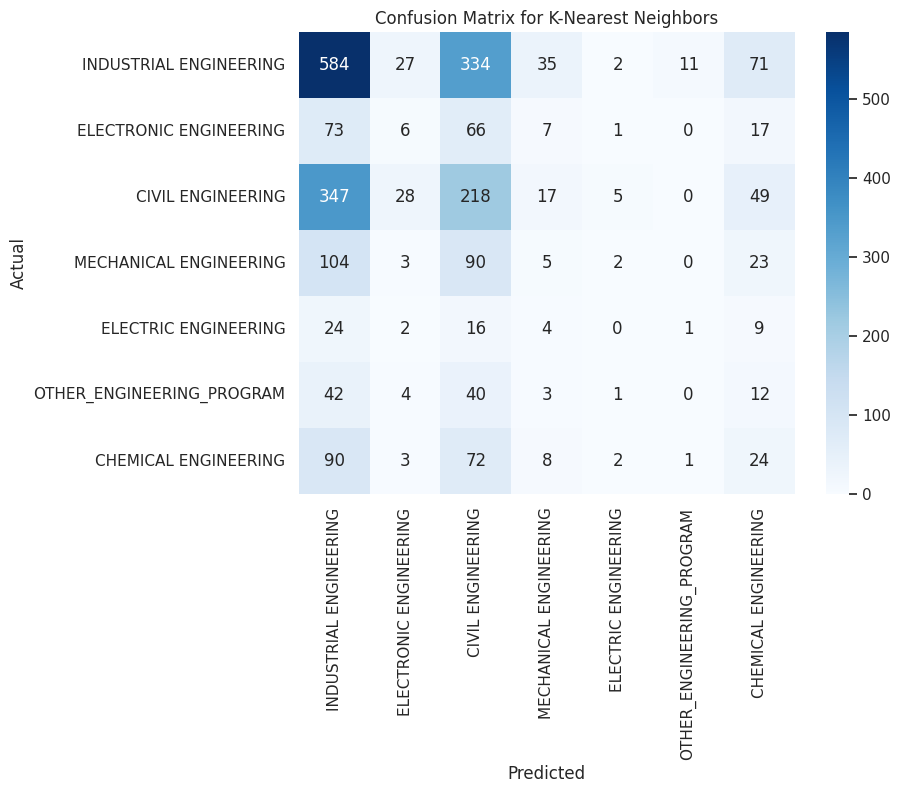

Sample Predictions for K-Nearest Neighbors:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
1       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING  INDUSTRIAL ENGINEERING
5       CIVIL ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  ELECTRONIC ENGINEERING
7  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
8       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


Evaluating model: Random Forest
Classification Report for Random Forest:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.604520  0.535000  0.567639   200.000000
CIVIL ENGINEERING           0.600993  0.546687  0.572555   664.000000
ELECTRIC ENGINEERING        0.375000  0.053571  0.093750    56.000000
ELECTRONIC ENGINEERING      0.551724  0.188235  0.2

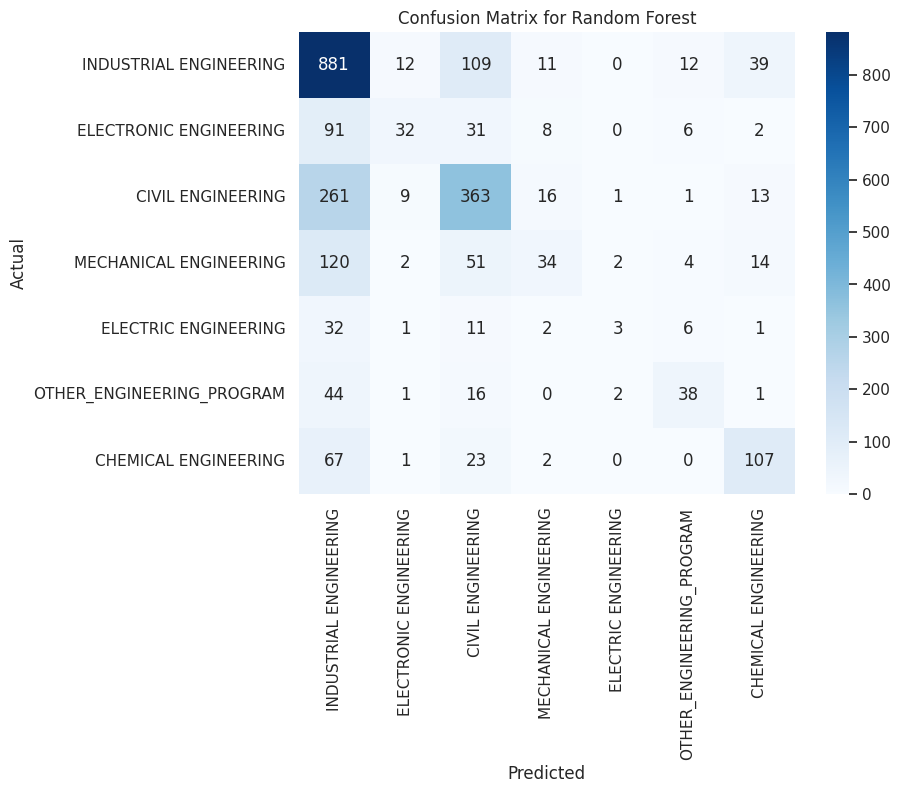

Sample Predictions for Random Forest:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING       CIVIL ENGINEERING


Evaluating model: Gradient Boosting
      Iter       Train Loss   Remaining Time 
         1           1.4640            6.12m
         2           1.4223            6.44m
         3           1.3913            6.25m
         4           1.3689            6.24m
         5           1.3498            6.22m
         6           1.3330            6.01m
         7           1.3171            5.94m
         8   

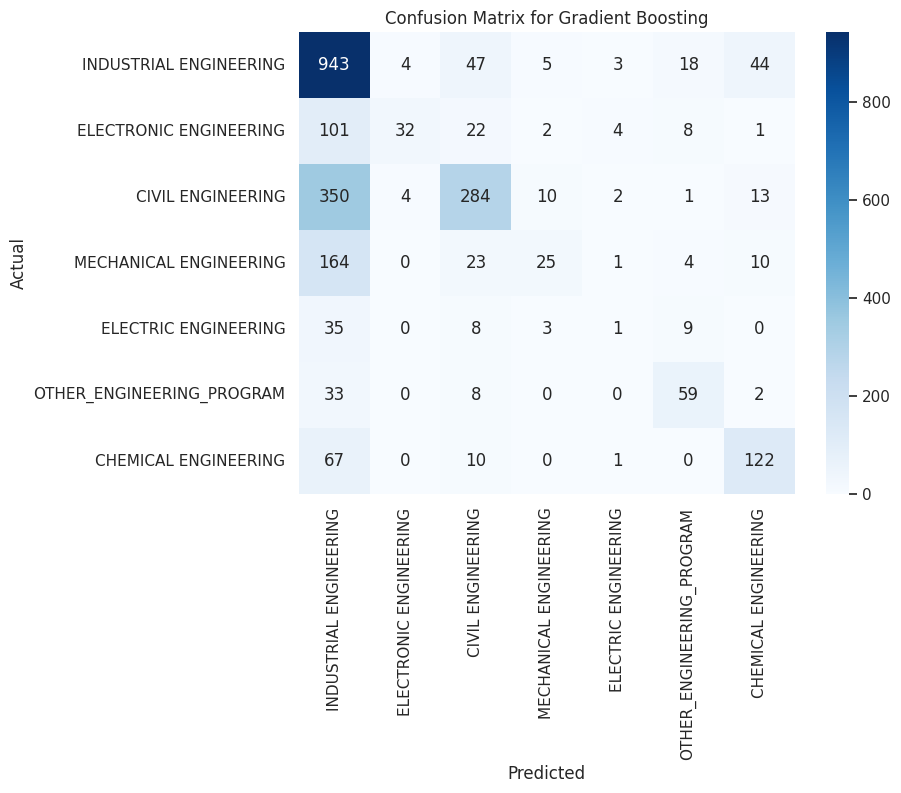

Sample Predictions for Gradient Boosting:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


Evaluating model: Support Vector Machine


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report for Support Vector Machine:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.000000  0.000000  0.000000   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.428514  1.000000  0.599944  1064.000000
MECHANICAL ENGINEERING      0.000000  0.000000  0.000000   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.428514  0.428514  0.428514     0.428514
macro avg                   0.061216  0.142857  0.085706  2483.000000
weighted avg                0.183624  0.428514  0.257084  2483.000000


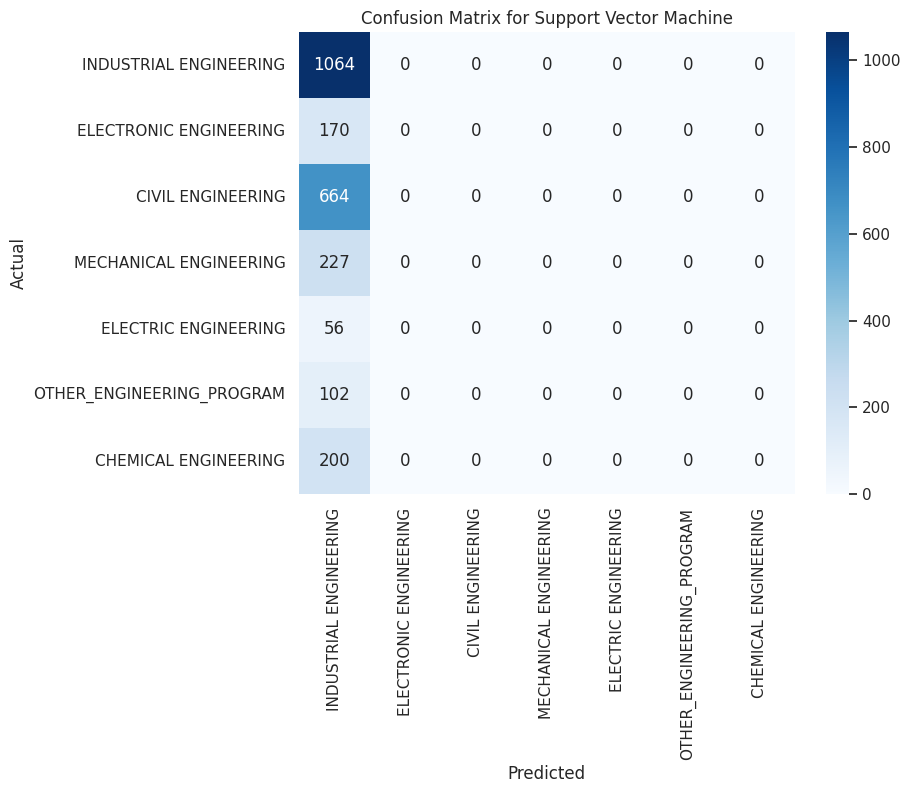

Sample Predictions for Support Vector Machine:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
4    CHEMICAL ENGINEERING  INDUSTRIAL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


Evaluating model: Neural Network
Classification Report for Neural Network:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.516129  0.480000  0.497409   200.000000
CIVIL ENGINEERING           0.643299  0.469880  0.543081   664.000000
ELECTRIC ENGINEERING        0.088235  0.053571  0.066667    56.000000
ELECTRONIC ENGINEERING      0.387931  0.264706

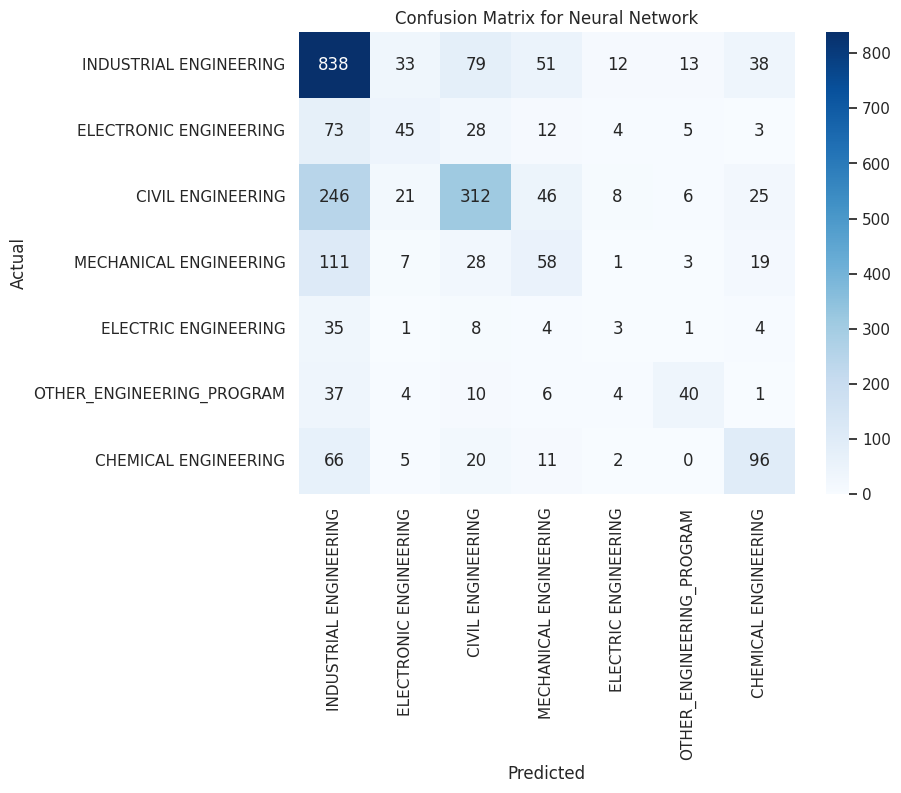

Sample Predictions for Neural Network:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING       CIVIL ENGINEERING




In [ ]:
# Separate features (X) and target (y)
X = extracted_data_2.drop(columns=['ACADEMIC_PROGRAM'])  # Features
y = extracted_data_2['ACADEMIC_PROGRAM']  # Target

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Apply OneHotEncoding to categorical columns with handle_unknown='ignore' and sparse_output=False
column_transformer = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)],
    remainder='passthrough'
)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Dictionary of models to evaluate
models = {
    'K-Nearest Neighbors': make_pipeline(column_transformer, KNeighborsClassifier()),
    'Random Forest': make_pipeline(column_transformer, RandomForestClassifier(random_state=42)),
    'Gradient Boosting': make_pipeline(column_transformer, GradientBoostingClassifier(n_estimators=50, random_state=42, verbose=1)),
    'Support Vector Machine': make_pipeline(column_transformer, SVC()),
    'Neural Network': make_pipeline(column_transformer, MLPClassifier(max_iter=300, random_state=42))
}

# Loop through each model
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")

    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate the confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Calculate and display classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Ensure y_test is a 1D array
    actual_values = y_test.values.flatten()  # Use .values.flatten() to ensure 1D
    predicted_values = y_pred.flatten()  # Ensure predictions are 1D

    # Display a sample of actual vs predicted values
    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for {model_name}:')
    print(sample_predictions)
    print("\n")


Evaluating model: K-Nearest Neighbors
  Fold 1:
    Classification Report for Fold 1:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.152542  0.180000  0.165138   200.00000
CIVIL ENGINEERING           0.287787  0.358434  0.319249   664.00000
ELECTRIC ENGINEERING        0.083333  0.018182  0.029851    55.00000
ELECTRONIC ENGINEERING      0.111111  0.041176  0.060086   170.00000
INDUSTRIAL ENGINEERING      0.461599  0.547932  0.501074  1064.00000
MECHANICAL ENGINEERING      0.057143  0.017621  0.026936   227.00000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   103.00000
accuracy                    0.349980  0.349980  0.349980     0.34998
macro avg                   0.164788  0.166192  0.157476  2483.00000
weighted avg                0.301726  0.349980  0.320629  2483.00000


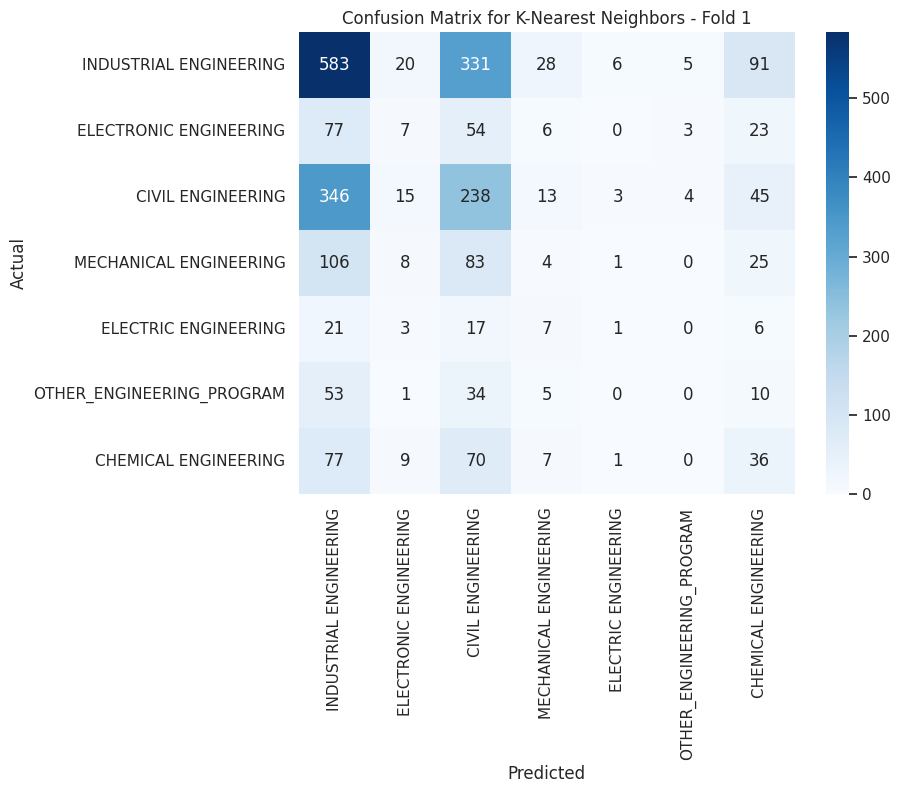

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
3  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING       CIVIL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING
7  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
8  INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 2:
    Classification Report for Fold 2:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.139013  0.155000  0.146572   200.00000
CIVIL ENGINEERING           0.295343  0.362952  0.325676   664.00000
ELECTRIC ENGINEERING        0.066667  0.018182  0.028571    55.00000
ELECTRONIC ENGINEERING      0.112500  0.052941  0.072000   170.00000
INDUSTRIAL ENGINEERI

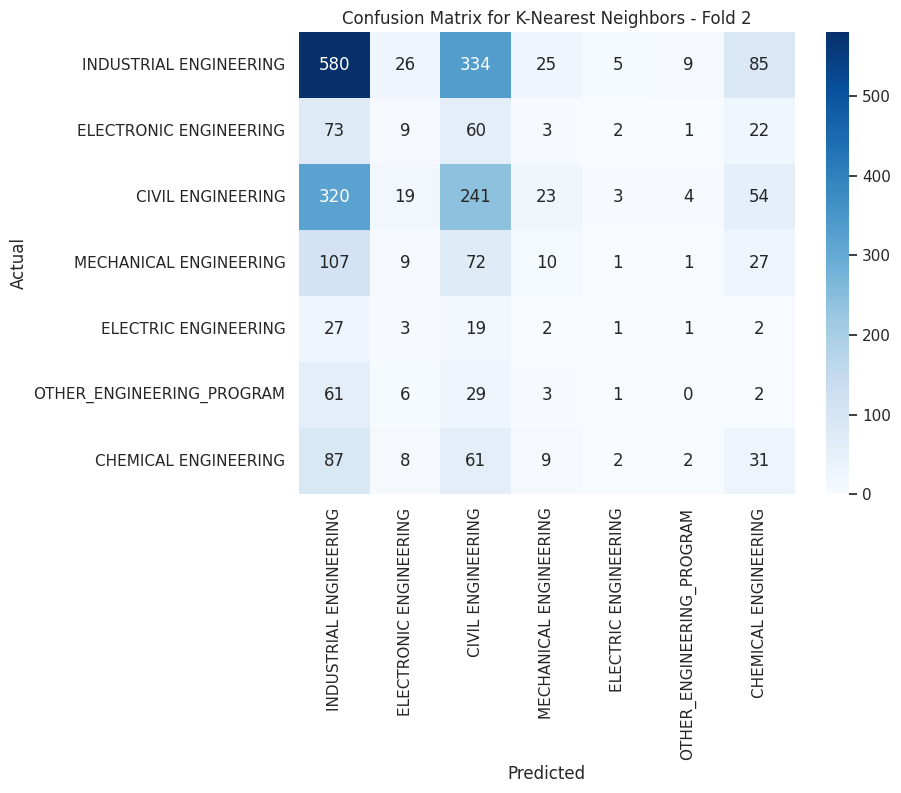

    Sample Predictions for Fold 2:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING
1     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING       CIVIL ENGINEERING
7     INDUSTRIAL ENGINEERING  ELECTRONIC ENGINEERING
8     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING


  Fold 3:
    Classification Report for Fold 3:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.157658  0.175000  0.165877   200.000000
CIVIL ENGINEERING           0.287841  0.349398  0.315646   664.000000
ELECTRIC ENGINEERING        0.071429  0.017857  0.028571    56.000000
ELECTRONIC ENGINEERING      0.125000  0.047337  0.06

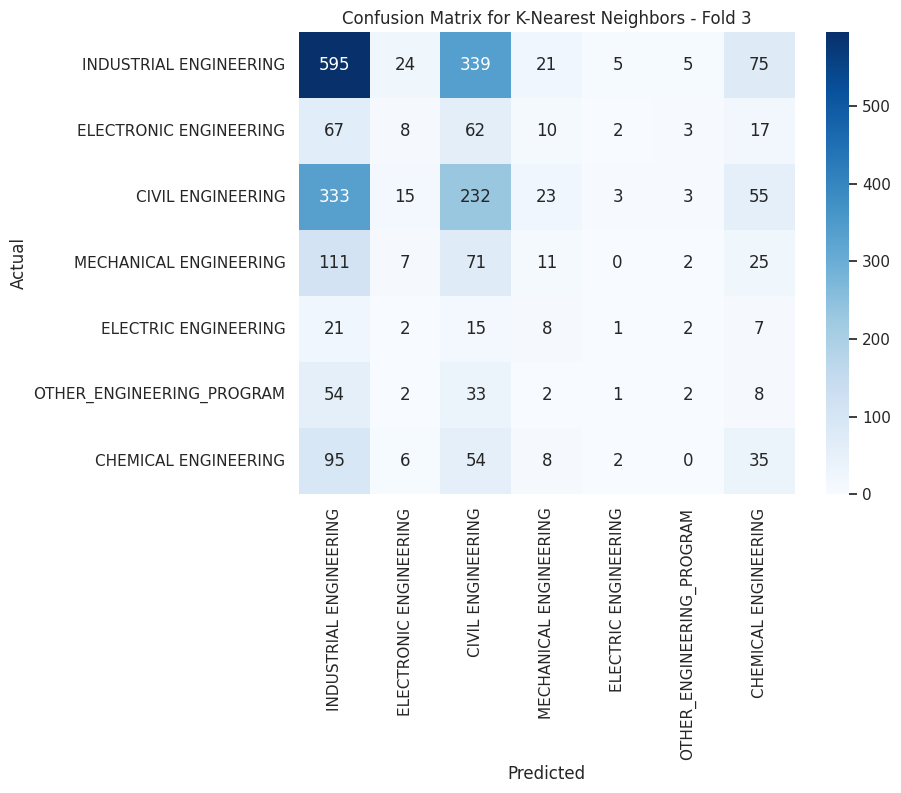

    Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING  MECHANICAL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING
6     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7  OTHER_ENGINEERING_PROGRAM       CIVIL ENGINEERING
8     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
9     MECHANICAL ENGINEERING       CIVIL ENGINEERING


  Fold 4:
    Classification Report for Fold 4:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.158371  0.175000  0.166271   200.000000
CIVIL ENGINEERING           0.299020  0.367470  0.329730   664.000000
ELECTRIC ENGINEERING        0.083333  0.017857  0.029412    56.000000
ELECTRONIC ENGINEERING      0.111111  0.052941  0.07

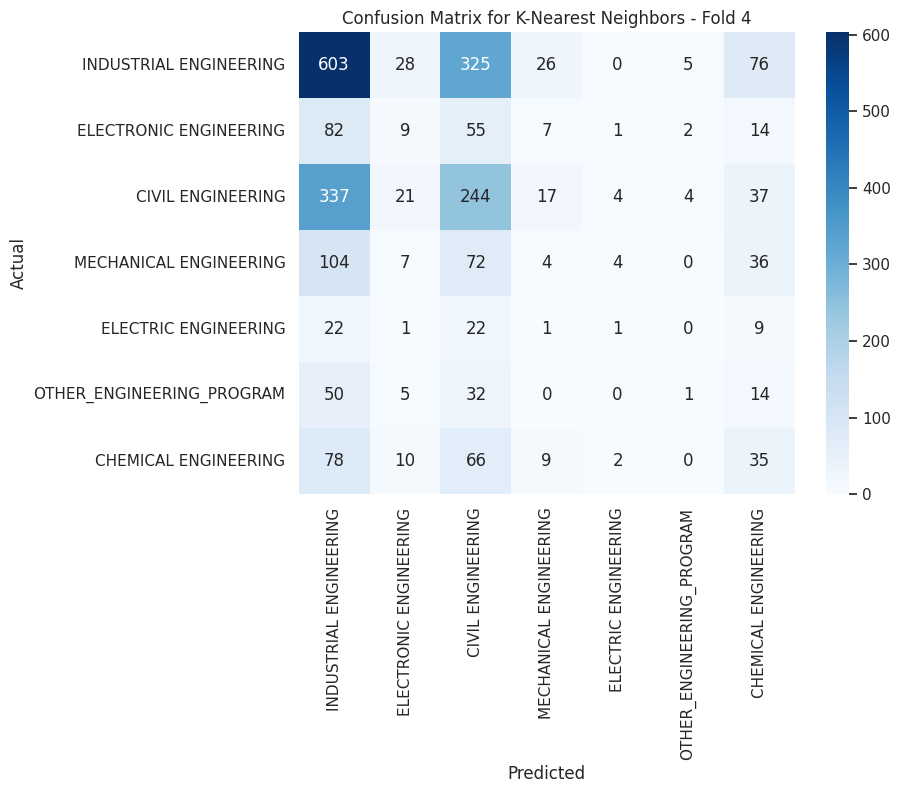

    Sample Predictions for Fold 4:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
3       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING    CHEMICAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
8  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING


  Fold 5:
    Classification Report for Fold 5:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.150794  0.190000  0.168142   200.000000
CIVIL ENGINEERING           0.290727  0.349398  0.317373   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.076087  0.041176  0.053435   170.000000
INDUSTRIAL ENGI

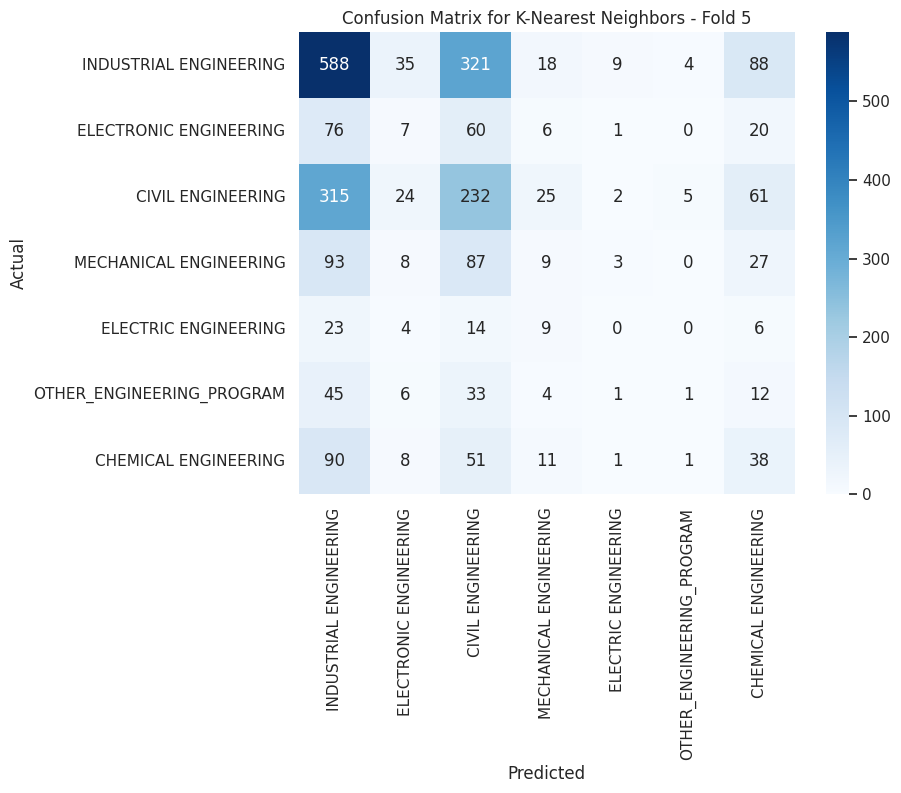

    Sample Predictions for Fold 5:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  MECHANICAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING    CHEMICAL ENGINEERING
4  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


--- Overall Performance for K-Nearest Neighbors ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.151676  0.175000  0.162400   200.000000
CIVIL ENGINEERING           0.292144  0.357530  0.321535   664.000000
ELECTRIC ENGINEERING        0.060952  0.014416  0.023281    55.600000
ELECTRONIC ENGINEERING      0.107162  0.047115  0.065181   169.800000
INDUSTRIAL 

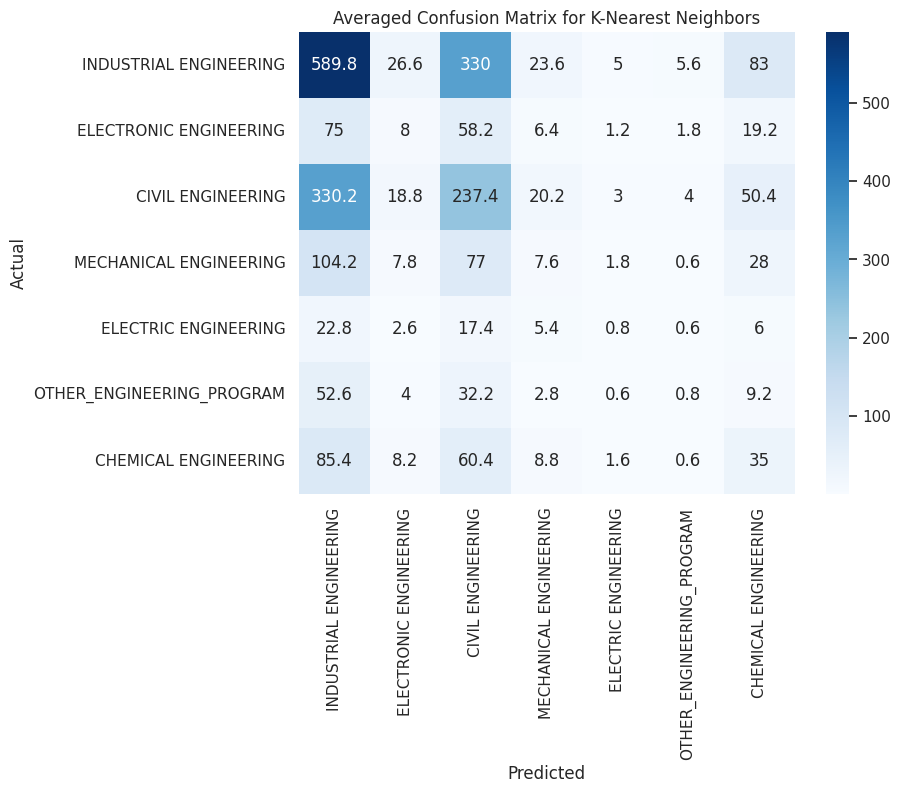

Evaluating model: Random Forest
  Fold 1:
    Classification Report for Fold 1:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.576271  0.510000  0.541114   200.00000
CIVIL ENGINEERING           0.568938  0.540663  0.554440   664.00000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    55.00000
ELECTRONIC ENGINEERING      0.622642  0.194118  0.295964   170.00000
INDUSTRIAL ENGINEERING      0.587517  0.813910  0.682427  1064.00000
MECHANICAL ENGINEERING      0.444444  0.158590  0.233766   227.00000
OTHER_ENGINEERING_PROGRAM   0.619048  0.378641  0.469880   103.00000
accuracy                    0.577930  0.577930  0.577930     0.57793
macro avg                   0.488409  0.370846  0.396799  2483.00000
weighted avg                0.559262  0.577930  0.545409  2483.00000


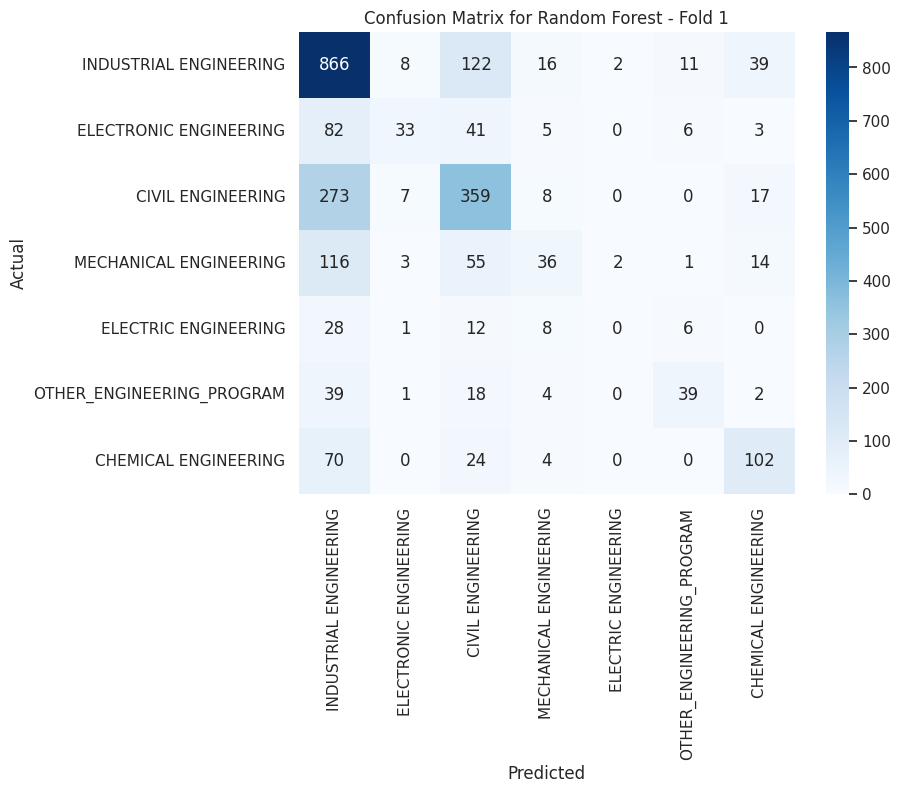

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
3  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 2:
    Classification Report for Fold 2:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.616883  0.475000  0.536723   200.000000
CIVIL ENGINEERING           0.582923  0.534639  0.557738   664.000000
ELECTRIC ENGINEERING        0.333333  0.036364  0.065574    55.000000
ELECTRONIC ENGINEERING      0.644444  0.170588  0.269767   170.000000
INDUSTRIAL ENGI

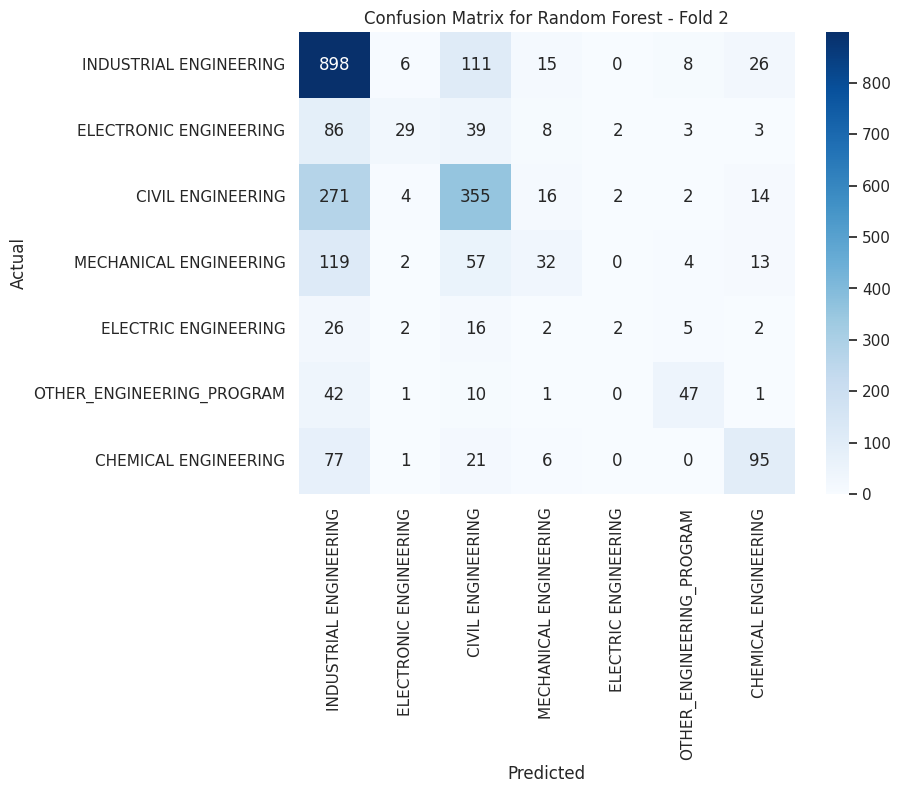

    Sample Predictions for Fold 2:
                      Actual                  Predicted
0     INDUSTRIAL ENGINEERING     MECHANICAL ENGINEERING
1     INDUSTRIAL ENGINEERING          CIVIL ENGINEERING
2       ELECTRIC ENGINEERING     INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING     INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  OTHER_ENGINEERING_PROGRAM
7     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM     MECHANICAL ENGINEERING


  Fold 3:
    Classification Report for Fold 3:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.629412  0.535000  0.578378   200.00000
CIVIL ENGINEERING           0.585644  0.540663  0.562255   664.00000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.00000
ELECTRONIC ENGINEERING 

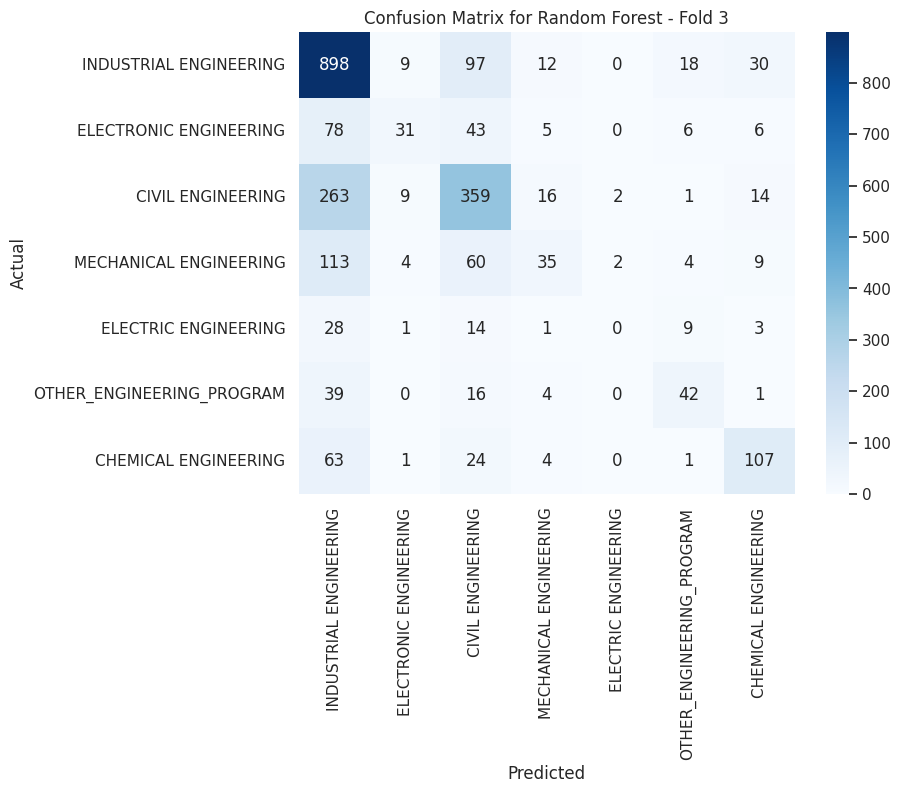

    Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING       CIVIL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
6     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 4:
    Classification Report for Fold 4:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.590909  0.520000  0.553191   200.000000
CIVIL ENGINEERING           0.612111  0.563253  0.586667   664.000000
ELECTRIC ENGINEERING        0.250000  0.053571  0.088235    56.000000
ELECTRONIC ENGINEERING      0.500000  0.152941  0.23

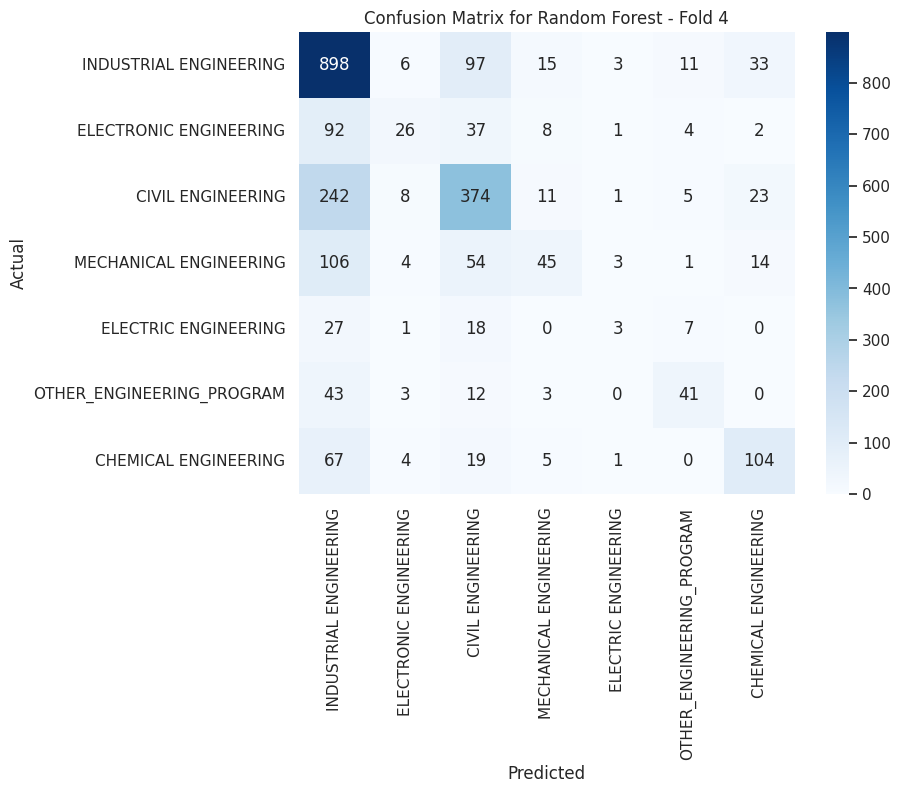

    Sample Predictions for Fold 4:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3       CIVIL ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6       CIVIL ENGINEERING       CIVIL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8  MECHANICAL ENGINEERING  ELECTRONIC ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 5:
    Classification Report for Fold 5:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.603659  0.495000  0.543956   200.000000
CIVIL ENGINEERING           0.603659  0.596386  0.600000   664.000000
ELECTRIC ENGINEERING        0.333333  0.035714  0.064516    56.000000
ELECTRONIC ENGINEERING      0.642857  0.158824  0.254717   170.000000
INDUSTRIAL ENGI

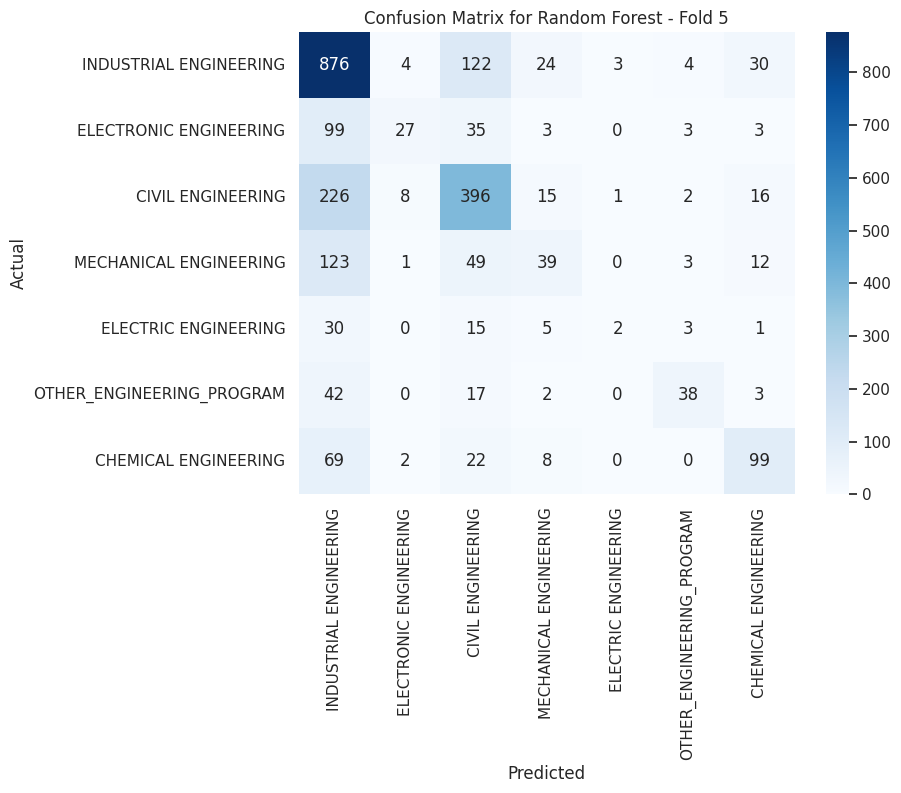

    Sample Predictions for Fold 5:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  MECHANICAL ENGINEERING
3  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4  MECHANICAL ENGINEERING  MECHANICAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


--- Overall Performance for Random Forest ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.603427  0.507000  0.550673   200.000000
CIVIL ENGINEERING           0.590655  0.555120  0.572220   664.000000
ELECTRIC ENGINEERING        0.183333  0.025130  0.043665    55.600000
ELECTRONIC ENGINEERING      0.594716  0.171981  0.266294   169.800000
INDUSTRIAL ENGINE

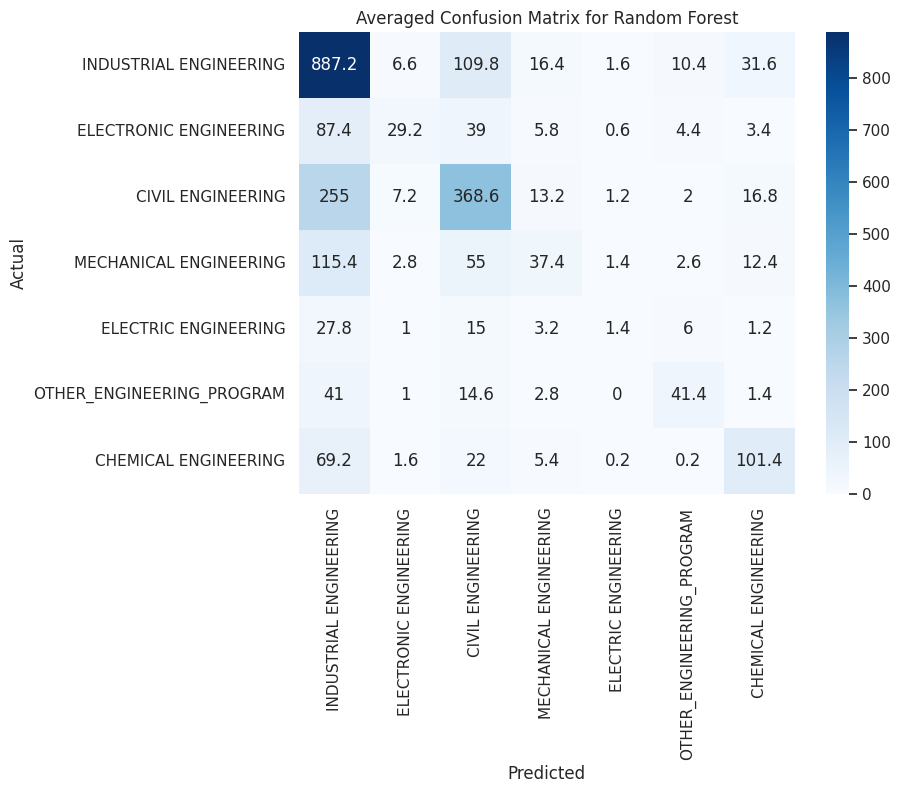

Evaluating model: Gradient Boosting
  Fold 1:
      Iter       Train Loss   Remaining Time 
         1           1.4625            5.77m
         2           1.4200            6.10m
         3           1.3889            5.83m
         4           1.3670            5.86m
         5           1.3480            5.70m
         6           1.3299            5.63m
         7           1.3148            5.58m
         8           1.3017            5.40m
         9           1.2880            5.32m
        10           1.2735            5.17m
        20           1.1822            3.96m
        30           1.1239            2.68m
        40           1.0780            1.35m
        50           1.0417            0.00s
    Classification Report for Fold 1:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.629834  0.570000  0.598425   200.000000
CIVIL ENGINEERING           0.688654  0.393072  0.500479   664.000000
ELECTRIC ENGINEERING        0.

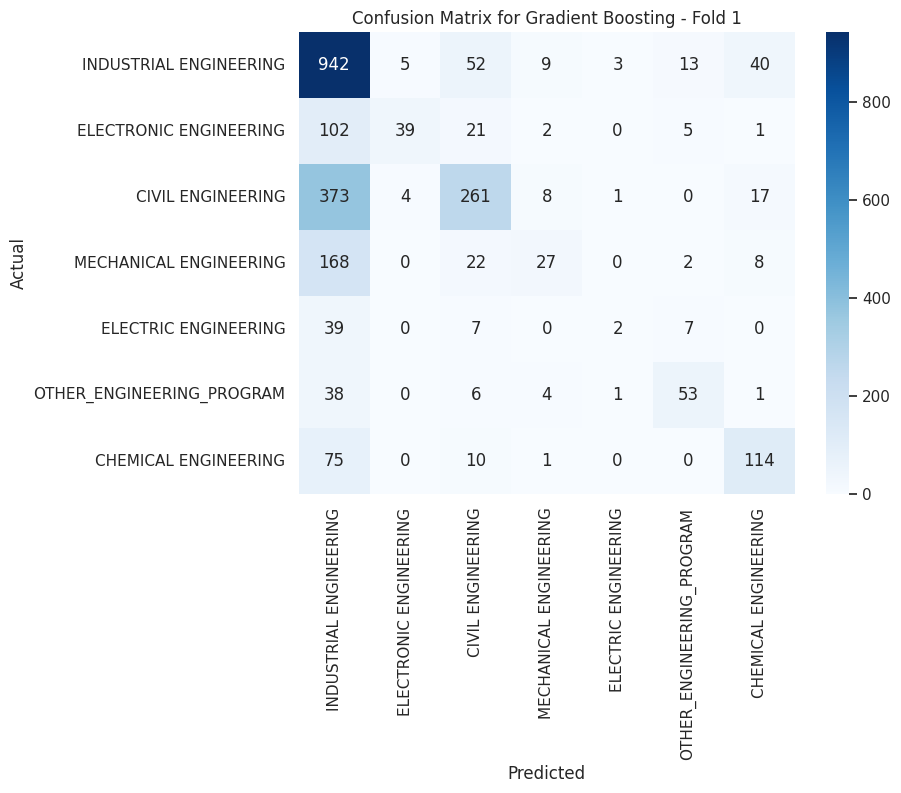

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING       CIVIL ENGINEERING
5  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 2:
      Iter       Train Loss   Remaining Time 
         1           1.4640            6.81m
         2           1.4226            6.27m
         3           1.3925            6.21m
         4           1.3680            6.11m
         5           1.3495            5.94m
         6           1.3327            5.87m
         7           1.3195            5.70m
         8           1.3041            5.6

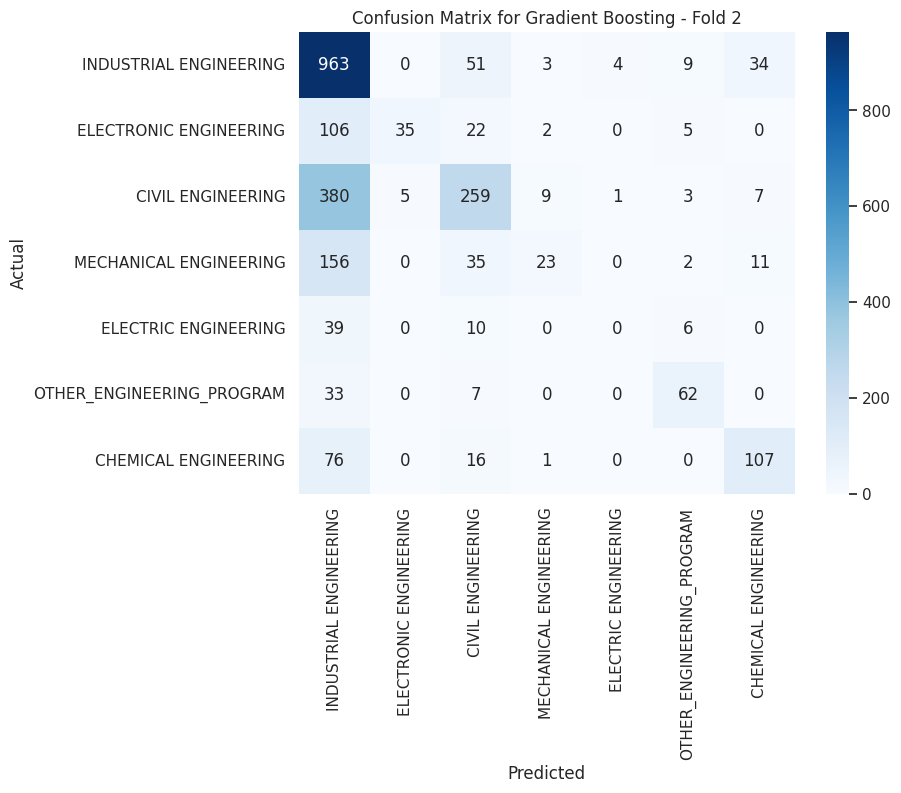

    Sample Predictions for Fold 2:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING


  Fold 3:
      Iter       Train Loss   Remaining Time 
         1           1.4639            5.91m
         2           1.4221            6.13m
         3           1.3925            6.07m
         4           1.3694            5.86m
         5           1.3504            5.84m
         6           1.3329            5.65m
         7           1.3189            5.59m
         

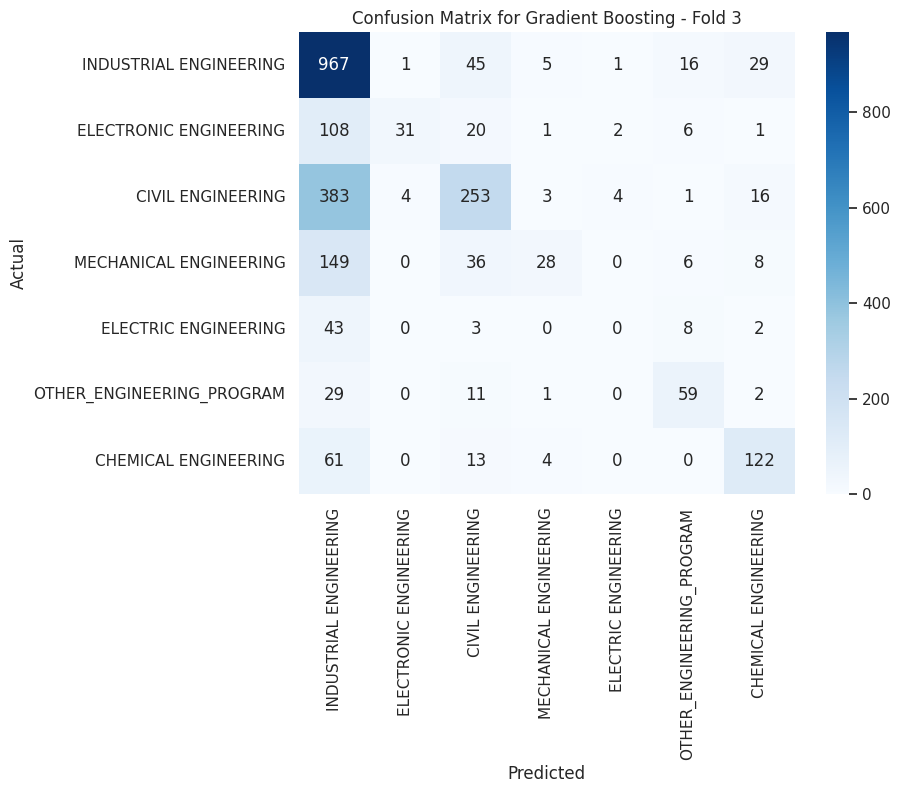

    Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING       CIVIL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
6     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 4:
      Iter       Train Loss   Remaining Time 
         1           1.4633            5.88m
         2           1.4218            6.11m
         3           1.3898            5.83m
         4           1.3656            5.81m
         5           1.3456            5.69m
         6           1.3295            5.58m
         7           1.3158            5.52m
         

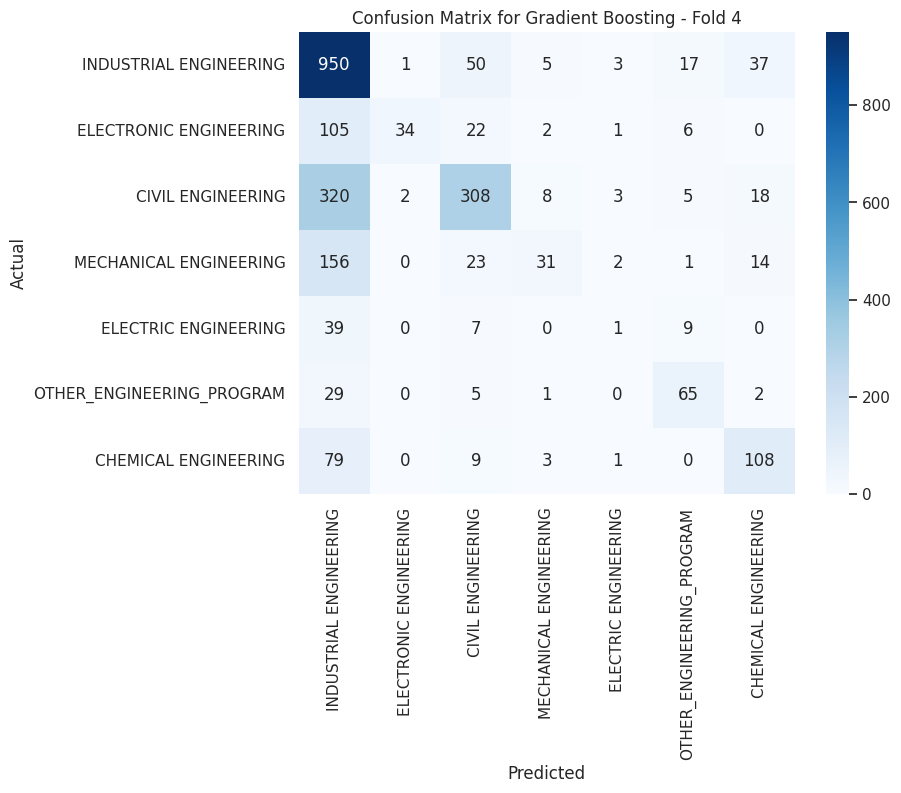

    Sample Predictions for Fold 4:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3       CIVIL ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING       CIVIL ENGINEERING
5  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
6       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 5:
      Iter       Train Loss   Remaining Time 
         1           1.4605            6.00m
         2           1.4201            6.21m
         3           1.3874            6.19m
         4           1.3647            5.95m
         5           1.3421            5.88m
         6           1.3253            5.70m
         7           1.3109            5.60m
         8           1.2945            5.4

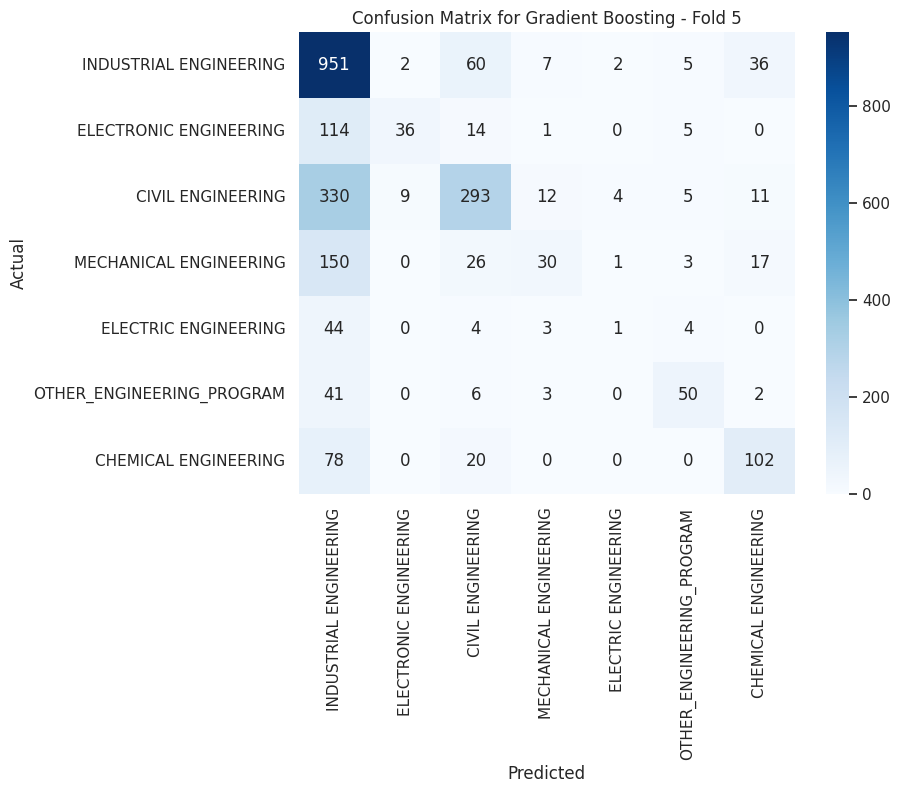

    Sample Predictions for Fold 5:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4  MECHANICAL ENGINEERING  MECHANICAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


--- Overall Performance for Gradient Boosting ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.638213  0.553000  0.592180   200.000000
CIVIL ENGINEERING           0.683857  0.413855  0.515361   664.000000
ELECTRIC ENGINEERING        0.100325  0.014416  0.025123    55.600000
ELECTRONIC ENGINEERING      0.846697  0.206098  0.330774   169.800000
INDUSTRIAL EN

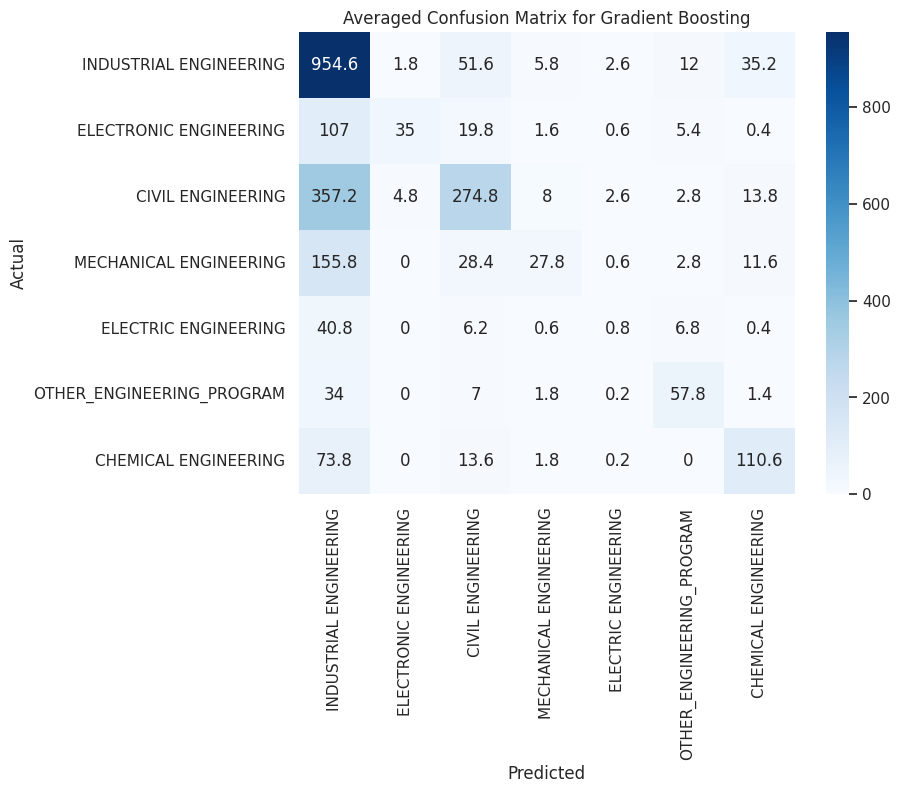

Evaluating model: Support Vector Machine
  Fold 1:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


    Classification Report for Fold 1:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.000000  0.000000  0.000000   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    55.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.428514  1.000000  0.599944  1064.000000
MECHANICAL ENGINEERING      0.000000  0.000000  0.000000   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   103.000000
accuracy                    0.428514  0.428514  0.428514     0.428514
macro avg                   0.061216  0.142857  0.085706  2483.000000
weighted avg                0.183624  0.428514  0.257084  2483.000000


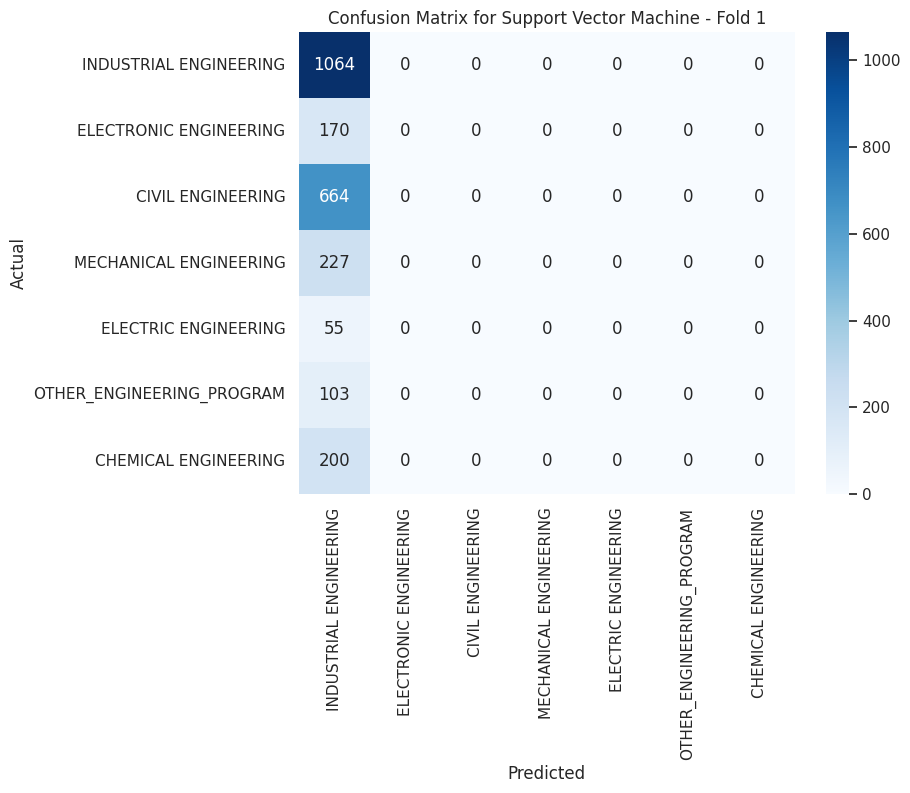

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 2:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


    Classification Report for Fold 2:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.000000  0.000000  0.000000   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    55.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.428687  1.000000  0.600113  1064.000000
MECHANICAL ENGINEERING      0.000000  0.000000  0.000000   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.428687  0.428687  0.428687     0.428687
macro avg                   0.061241  0.142857  0.085730  2482.000000
weighted avg                0.183772  0.428687  0.257260  2482.000000


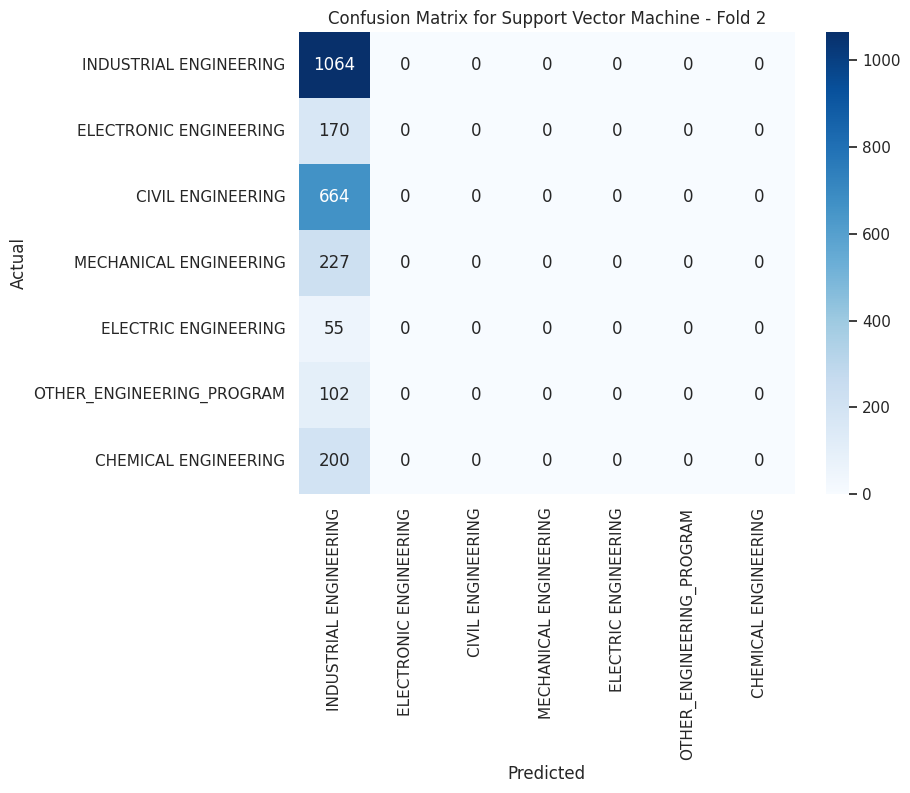

    Sample Predictions for Fold 2:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING


  Fold 3:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


    Classification Report for Fold 3:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.000000  0.000000  0.000000   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   169.000000
INDUSTRIAL ENGINEERING      0.428687  1.000000  0.600113  1064.000000
MECHANICAL ENGINEERING      0.000000  0.000000  0.000000   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.428687  0.428687  0.428687     0.428687
macro avg                   0.061241  0.142857  0.085730  2482.000000
weighted avg                0.183772  0.428687  0.257260  2482.000000


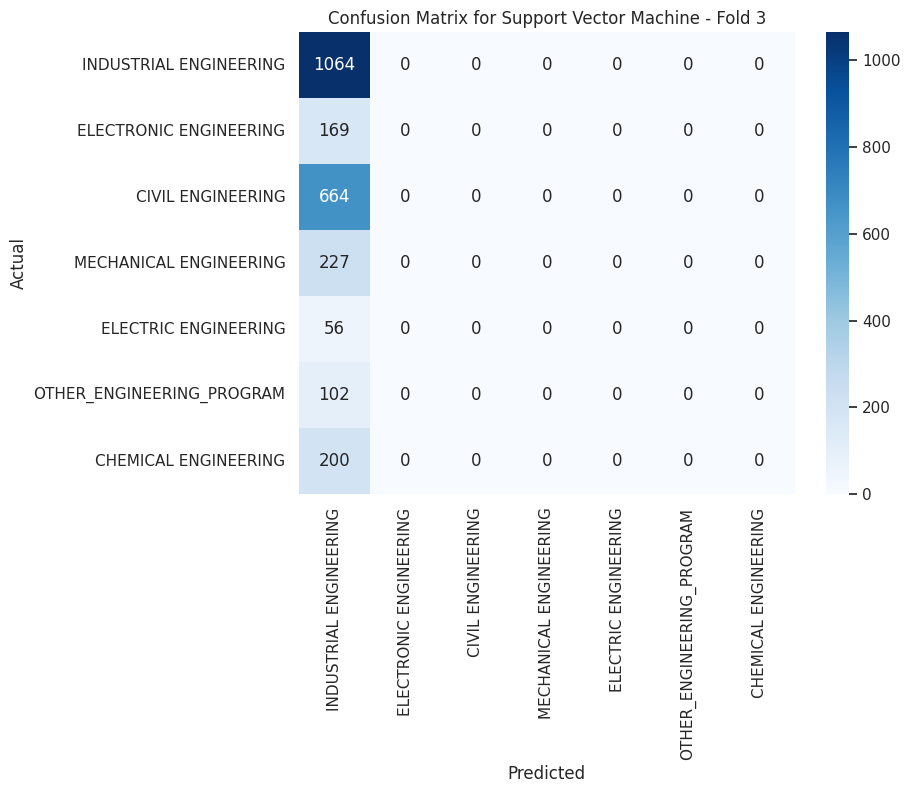

    Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
6     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 4:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


    Classification Report for Fold 4:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.000000  0.000000  0.000000   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.428284  1.000000  0.599718  1063.000000
MECHANICAL ENGINEERING      0.000000  0.000000  0.000000   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.428284  0.428284  0.428284     0.428284
macro avg                   0.061183  0.142857  0.085674  2482.000000
weighted avg                0.183427  0.428284  0.256849  2482.000000


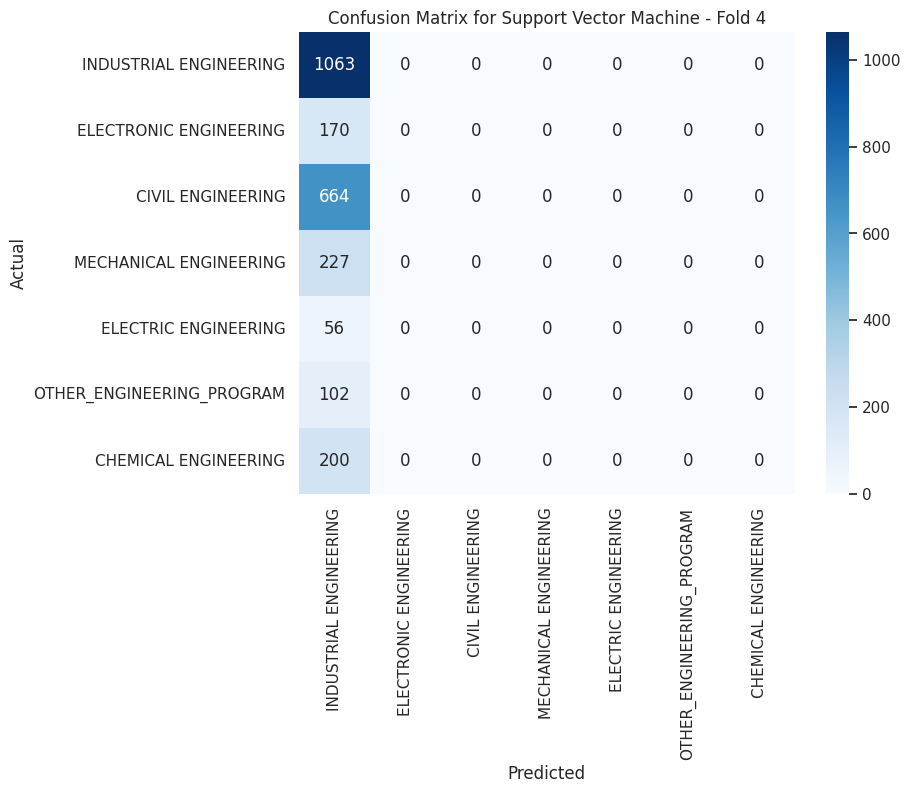

    Sample Predictions for Fold 4:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 5:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


    Classification Report for Fold 5:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.000000  0.000000  0.000000   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.428284  1.000000  0.599718  1063.000000
MECHANICAL ENGINEERING      0.000000  0.000000  0.000000   227.000000
OTHER_ENGINEERING_PROGRAM   0.000000  0.000000  0.000000   102.000000
accuracy                    0.428284  0.428284  0.428284     0.428284
macro avg                   0.061183  0.142857  0.085674  2482.000000
weighted avg                0.183427  0.428284  0.256849  2482.000000


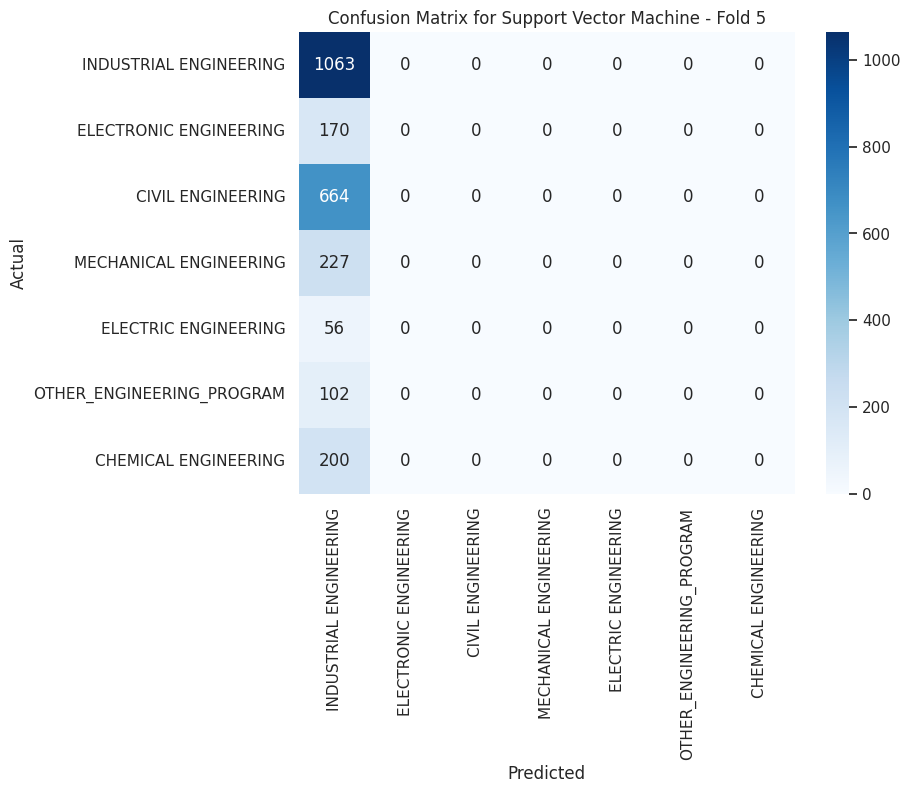

    Sample Predictions for Fold 5:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


--- Overall Performance for Support Vector Machine ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.000000  0.000000  0.000000   200.000000
CIVIL ENGINEERING           0.000000  0.000000  0.000000   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    55.600000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   169.800000
INDUSTRI

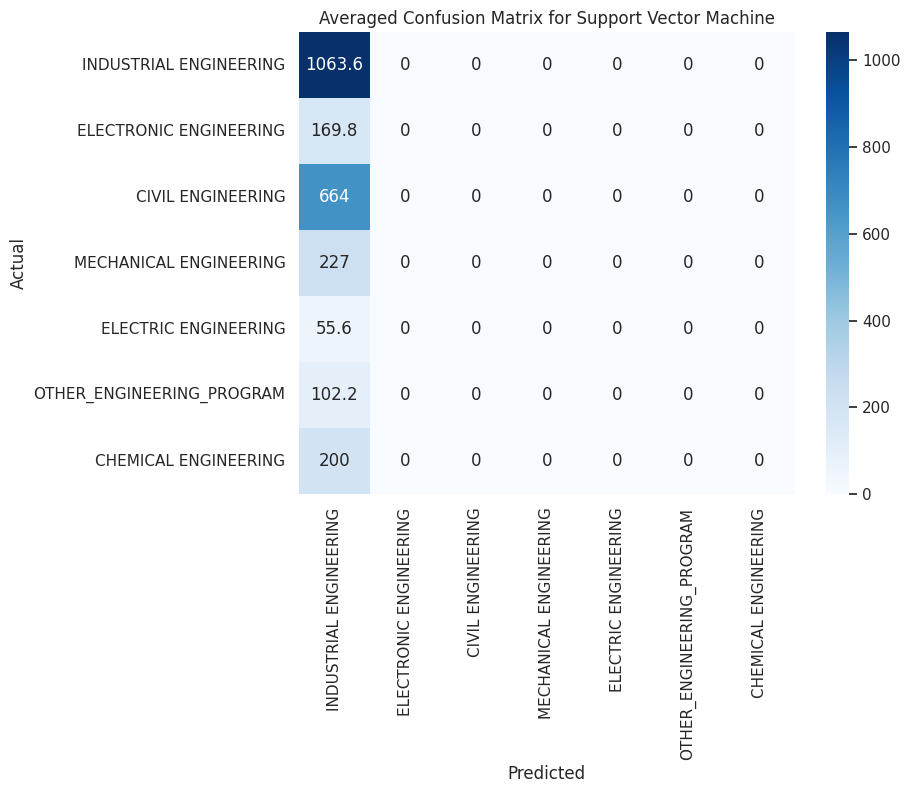

Evaluating model: Neural Network
  Fold 1:
    Classification Report for Fold 1:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.600000  0.270000  0.372414   200.000000
CIVIL ENGINEERING           0.508790  0.740964  0.603311   664.000000
ELECTRIC ENGINEERING        0.266667  0.072727  0.114286    55.000000
ELECTRONIC ENGINEERING      0.463918  0.264706  0.337079   170.000000
INDUSTRIAL ENGINEERING      0.665998  0.624060  0.644347  1064.000000
MECHANICAL ENGINEERING      0.344978  0.348018  0.346491   227.000000
OTHER_ENGINEERING_PROGRAM   0.511364  0.436893  0.471204   103.000000
accuracy                    0.556988  0.556988  0.556988     0.556988
macro avg                   0.480245  0.393910  0.412733  2483.000000
weighted avg                0.560198  0.556988  0.544278  2483.000000


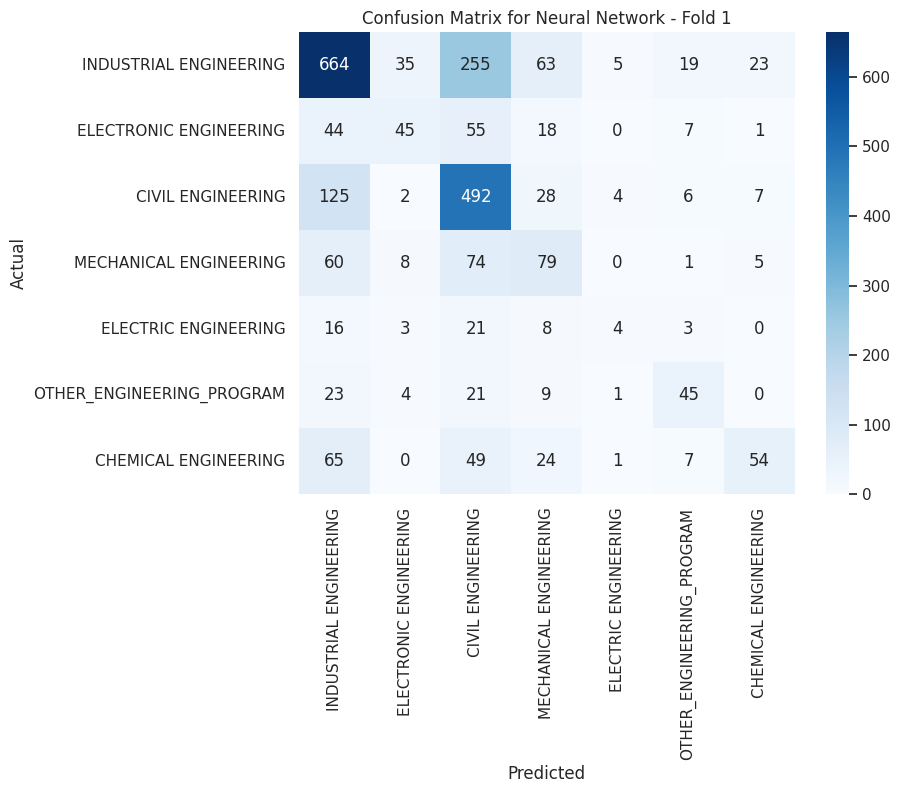

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
3  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING       CIVIL ENGINEERING
5  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 2:
    Classification Report for Fold 2:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.569892  0.530000  0.549223   200.000000
CIVIL ENGINEERING           0.636882  0.504518  0.563025   664.000000
ELECTRIC ENGINEERING        0.114286  0.072727  0.088889    55.000000
ELECTRONIC ENGINEERING      0.594937  0.276471  0.377510   170.000000
INDUSTRIAL ENGI

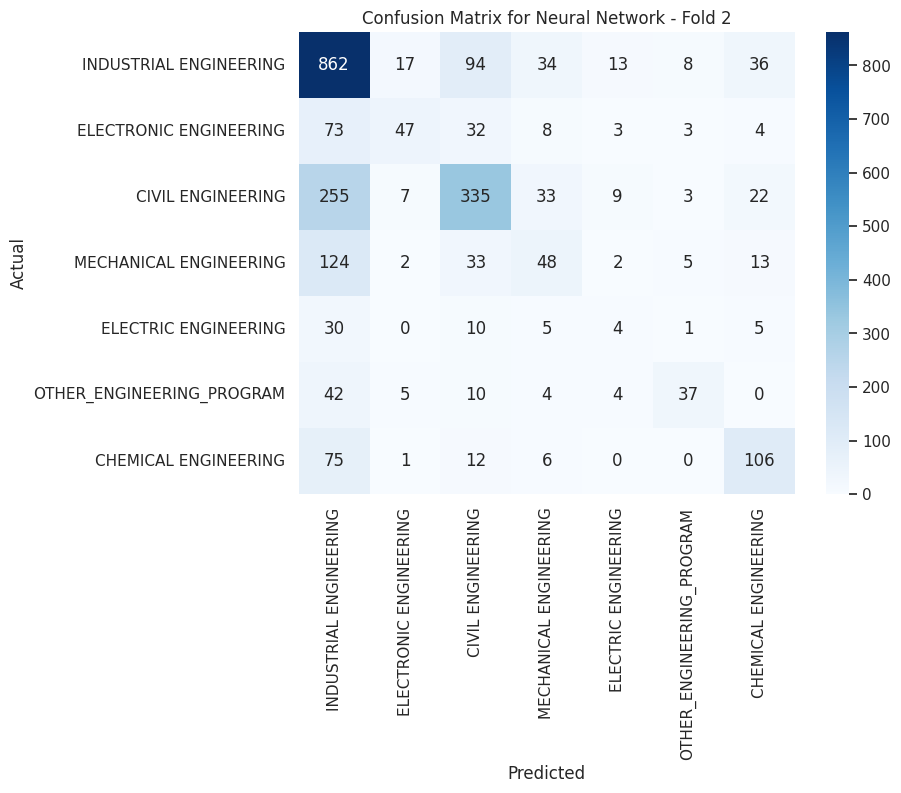

    Sample Predictions for Fold 2:
                      Actual                  Predicted
0     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
1     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING     INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING     INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  OTHER_ENGINEERING_PROGRAM
7     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM     MECHANICAL ENGINEERING


  Fold 3:
    Classification Report for Fold 3:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.494382  0.660000  0.565310   200.000000
CIVIL ENGINEERING           0.676815  0.435241  0.529789   664.000000
ELECTRIC ENGINEERING        0.230769  0.267857  0.247934    56.000000
ELECTRONIC ENGINEER

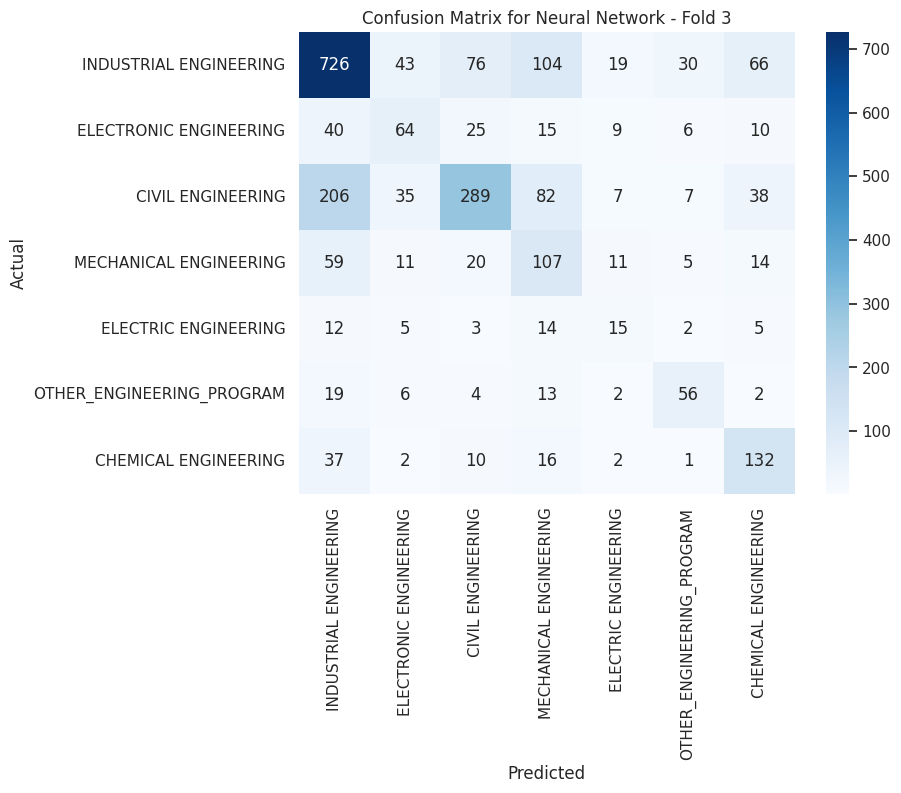

    Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING       CIVIL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  MECHANICAL ENGINEERING
6     INDUSTRIAL ENGINEERING    ELECTRIC ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  MECHANICAL ENGINEERING


  Fold 4:
    Classification Report for Fold 4:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.495652  0.285000  0.361905   200.000000
CIVIL ENGINEERING           0.583461  0.573795  0.578588   664.000000
ELECTRIC ENGINEERING        0.155556  0.125000  0.138614    56.000000
ELECTRONIC ENGINEERING      0.447619  0.276471  0.34

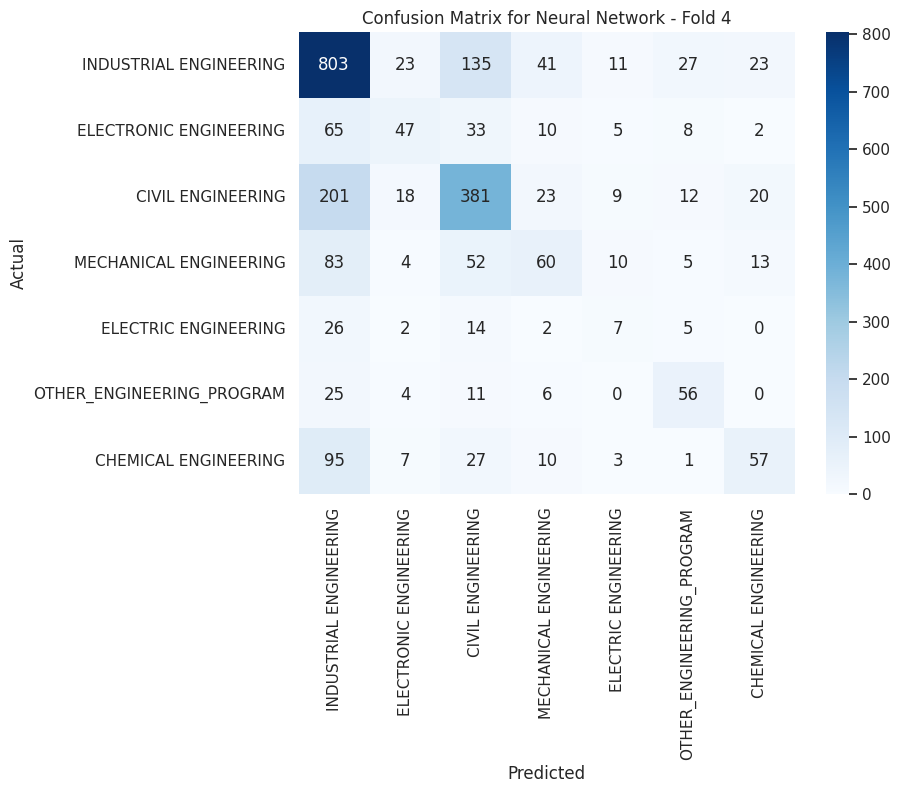

    Sample Predictions for Fold 4:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3       CIVIL ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING       CIVIL ENGINEERING
5  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
6       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  MECHANICAL ENGINEERING
8  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 5:
    Classification Report for Fold 5:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.494949  0.490000  0.492462   200.00000
CIVIL ENGINEERING           0.563660  0.640060  0.599436   664.00000
ELECTRIC ENGINEERING        0.170213  0.142857  0.155340    56.00000
ELECTRONIC ENGINEERING      0.457944  0.288235  0.353791   170.00000
INDUSTRIAL ENGINEERI

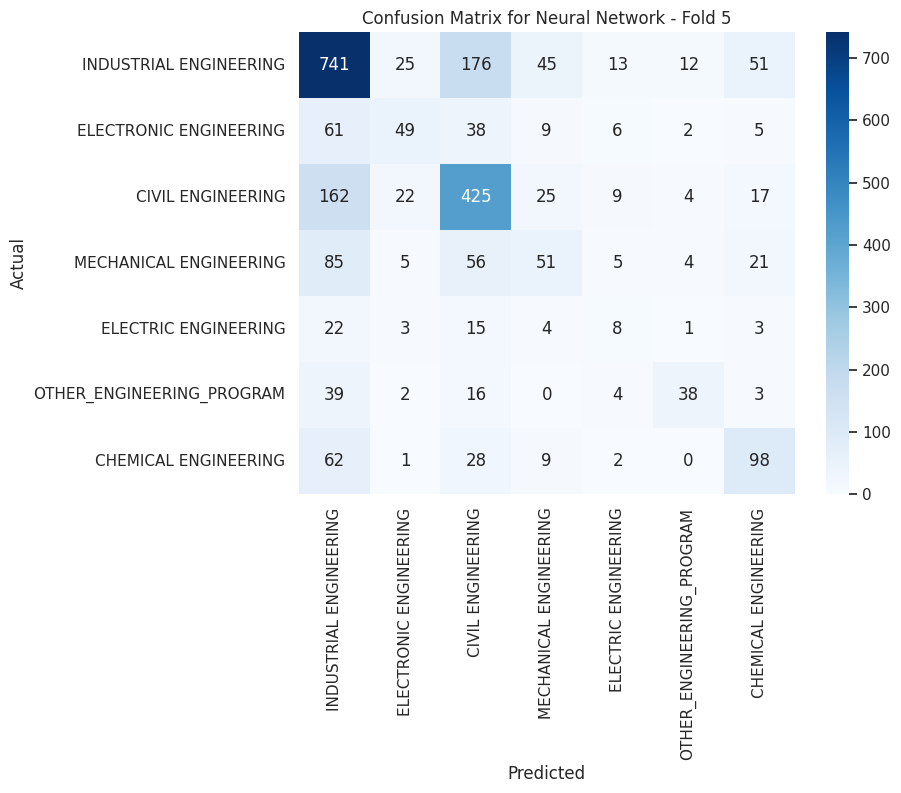

    Sample Predictions for Fold 5:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4  MECHANICAL ENGINEERING  MECHANICAL ENGINEERING
5  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  ELECTRONIC ENGINEERING    ELECTRIC ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


--- Overall Performance for Neural Network ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.530975  0.447000  0.468263   200.000000
CIVIL ENGINEERING           0.593922  0.578916  0.574830   664.000000
ELECTRIC ENGINEERING        0.187498  0.136234  0.149012    55.600000
ELECTRONIC ENGINEERING      0.469992  0.296916  0.358457   169.800000
INDUSTRIAL ENGIN

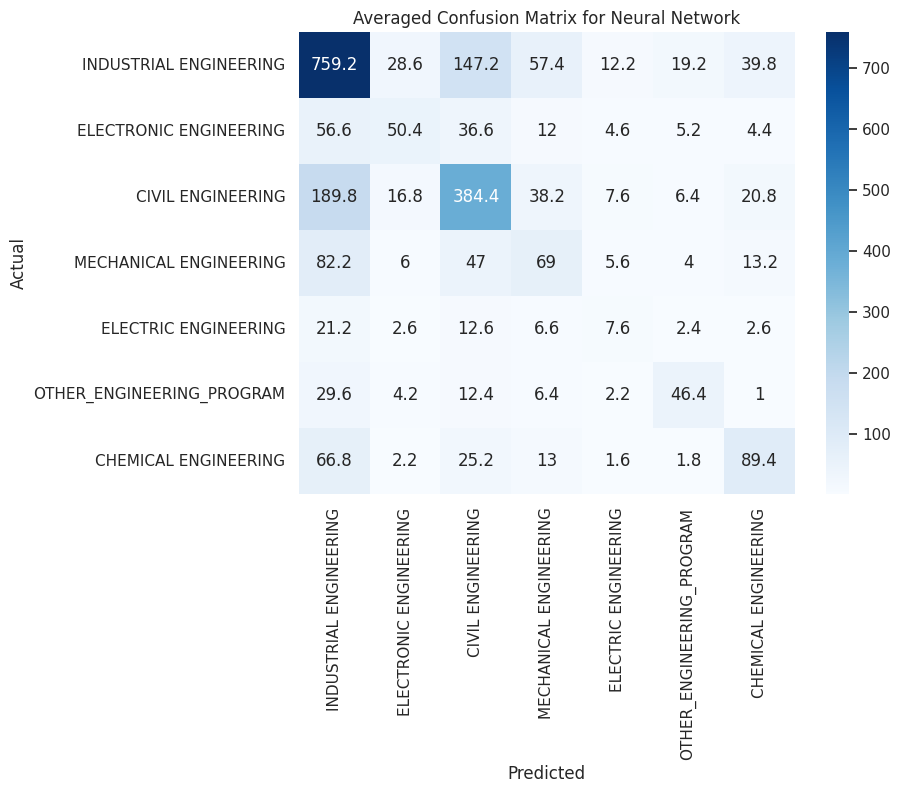

In [ ]:
# Separate features (X) and target (y)
X = extracted_data_2.drop(columns=['ACADEMIC_PROGRAM'])  # Features
y = extracted_data_2['ACADEMIC_PROGRAM']  # Target

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Apply OneHotEncoding to categorical columns with handle_unknown='ignore' and sparse_output=False
column_transformer = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)],
    remainder='passthrough'
)

# Dictionary of models to evaluate
models = {
    'K-Nearest Neighbors': make_pipeline(column_transformer, KNeighborsClassifier()),
    'Random Forest': make_pipeline(column_transformer, RandomForestClassifier(random_state=42)),
    'Gradient Boosting': make_pipeline(column_transformer, GradientBoostingClassifier(n_estimators=50, random_state=42, verbose=1)),
    'Support Vector Machine': make_pipeline(column_transformer, SVC()),
    'Neural Network': make_pipeline(column_transformer, MLPClassifier(max_iter=300, random_state=42))
}

# Stratified K-Fold cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Loop through each model
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")

    # Initialize lists to store the performance metrics for each fold
    all_reports = []
    all_confusion_matrices = []

    # Fold counter
    fold = 1

    # Stratified K-Fold Cross Validation
    for train_index, test_index in skf.split(X, y):
        print(f"  Fold {fold}:")

        # Split the data into training and testing sets for the current fold
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train the model
        model.fit(X_train, y_train)

        # Make predictions
        y_pred = model.predict(X_test)

        # Calculate the confusion matrix for the current fold
        confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())
        all_confusion_matrices.append(confusion_matrix_total)

        # Calculate and store the classification report for the current fold
        report = classification_report(y_test, y_pred, output_dict=True)
        avg_report = pd.DataFrame(report).transpose()
        all_reports.append(avg_report)

        print(f"    Classification Report for Fold {fold}:")
        print(avg_report)

        # Plot the confusion matrix for the current fold
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                    xticklabels=y.unique(), yticklabels=y.unique())
        plt.title(f"Confusion Matrix for {model_name} - Fold {fold}")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.show()

        # Display a sample of actual vs predicted values
        sample_predictions = pd.DataFrame({
            'Actual': y_test.values[:10],  # Take the first 10 actual values
            'Predicted': y_pred[:10]  # Take the first 10 predicted values
        })
        print(f'    Sample Predictions for Fold {fold}:')
        print(sample_predictions)
        print("\n")

        fold += 1

    # Optionally: Aggregate results across all folds
    print(f"--- Overall Performance for {model_name} ---")
    avg_report_across_folds = pd.concat(all_reports).groupby(level=0).mean()
    print(avg_report_across_folds)

    # Plot the averaged confusion matrix across all folds
    mean_confusion_matrix = np.mean(all_confusion_matrices, axis=0)
    plt.figure(figsize=(8, 6))
    sns.heatmap(mean_confusion_matrix, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Averaged Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


Evaluating model: Naive Bayes
Classification Report for Naive Bayes:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.400000  0.520000  0.452174   200.000000
CIVIL ENGINEERING           0.545455  0.433735  0.483221   664.000000
ELECTRIC ENGINEERING        0.117021  0.392857  0.180328    56.000000
ELECTRONIC ENGINEERING      0.200466  0.505882  0.287145   170.000000
INDUSTRIAL ENGINEERING      0.674380  0.383459  0.488916  1064.000000
MECHANICAL ENGINEERING      0.236842  0.277533  0.255578   227.000000
OTHER_ENGINEERING_PROGRAM   0.246377  0.500000  0.330097   102.000000
accuracy                    0.411599  0.411599  0.411599     0.411599
macro avg                   0.345792  0.430495  0.353923  2483.000000
weighted avg                0.515203  0.411599  0.435803  2483.000000


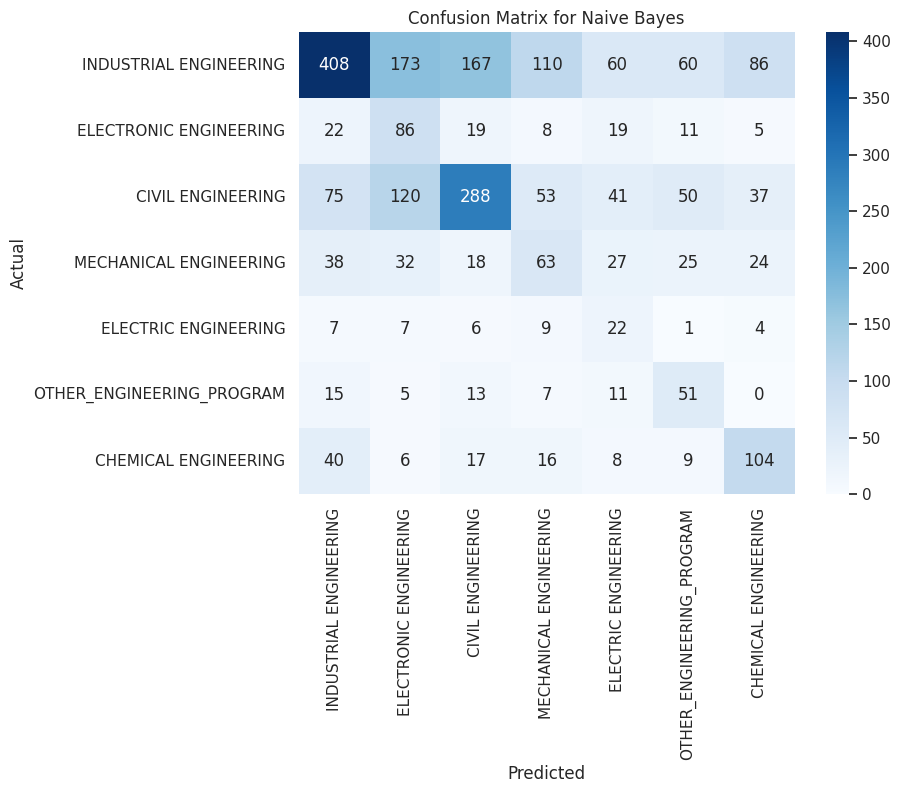

Sample Predictions for Naive Bayes:
                   Actual                  Predicted
0  INDUSTRIAL ENGINEERING  OTHER_ENGINEERING_PROGRAM
1       CIVIL ENGINEERING          CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       ELECTRIC ENGINEERING
4    CHEMICAL ENGINEERING          CIVIL ENGINEERING
5       CIVIL ENGINEERING     INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  OTHER_ENGINEERING_PROGRAM
7  INDUSTRIAL ENGINEERING     ELECTRONIC ENGINEERING
8       CIVIL ENGINEERING     ELECTRONIC ENGINEERING
9       CIVIL ENGINEERING     MECHANICAL ENGINEERING


Evaluating model: Decision Tree
Classification Report for Decision Tree:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.526316  0.550000  0.537897   200.000000
CIVIL ENGINEERING           0.552632  0.537651  0.545038   664.000000
ELECTRIC ENGINEERING        0.128205  0.089286  0.105263    56.000000
ELECTRONIC ENGINEERING    

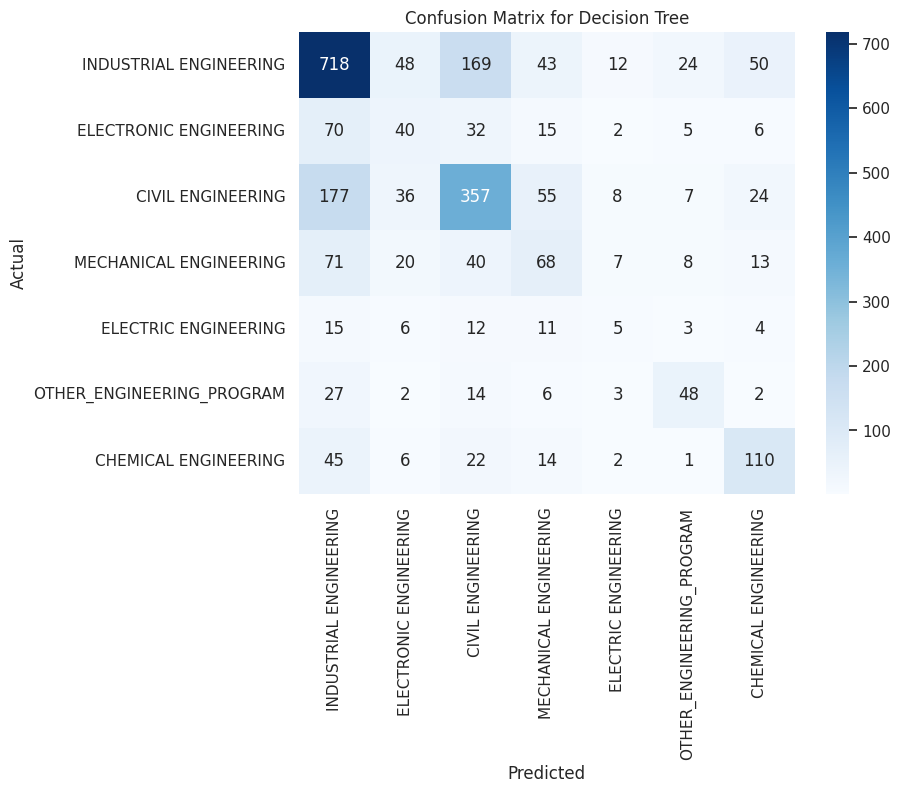

Sample Predictions for Decision Tree:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


Evaluating model: LightGBM
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 818
[LightGBM] [Info] Number of data points in the train set: 9928, number of used features: 130
[LightGBM] [Info] Start trainin

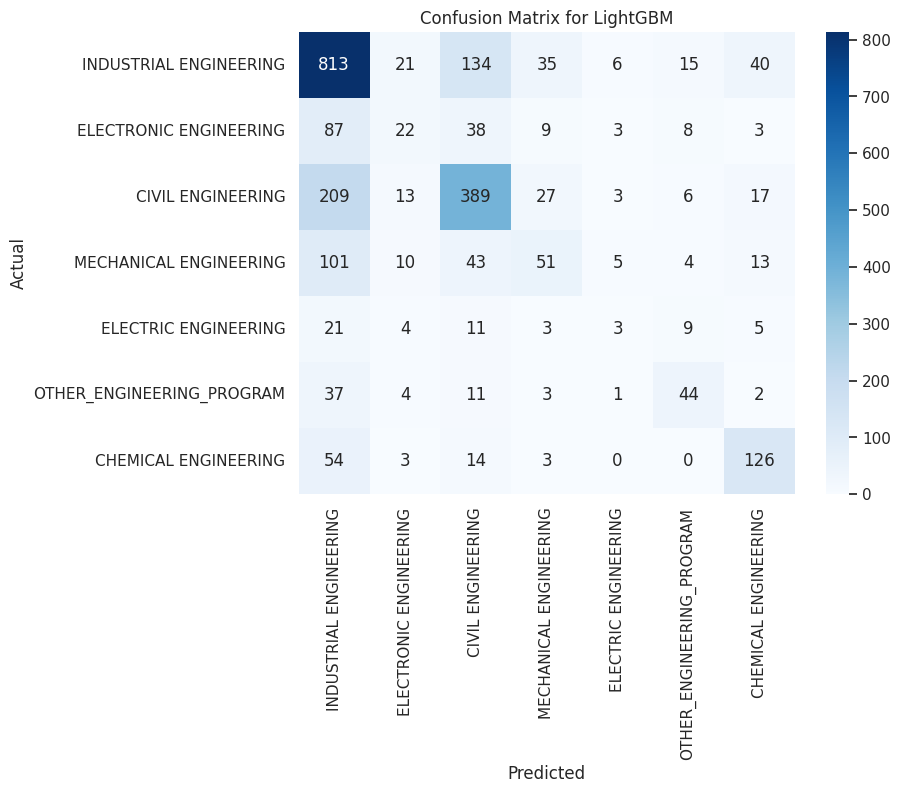

Sample Predictions for LightGBM:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


Evaluating model: CatBoost


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Classification Report for CatBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.664894  0.625000  0.644330   200.000000
CIVIL ENGINEERING           0.600619  0.584337  0.592366   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.637931  0.217647  0.324561   170.000000
INDUSTRIAL ENGINEERING      0.616573  0.825188  0.705788  1064.000000
MECHANICAL ENGINEERING      0.395062  0.140969  0.207792   227.000000
OTHER_ENGINEERING_PROGRAM   0.604651  0.509804  0.553191   102.000000
accuracy                    0.608941  0.608941  0.608941     0.608941
macro avg                   0.502819  0.414706  0.432576  2483.000000
weighted avg                0.583015  0.608941  0.576692  2483.000000


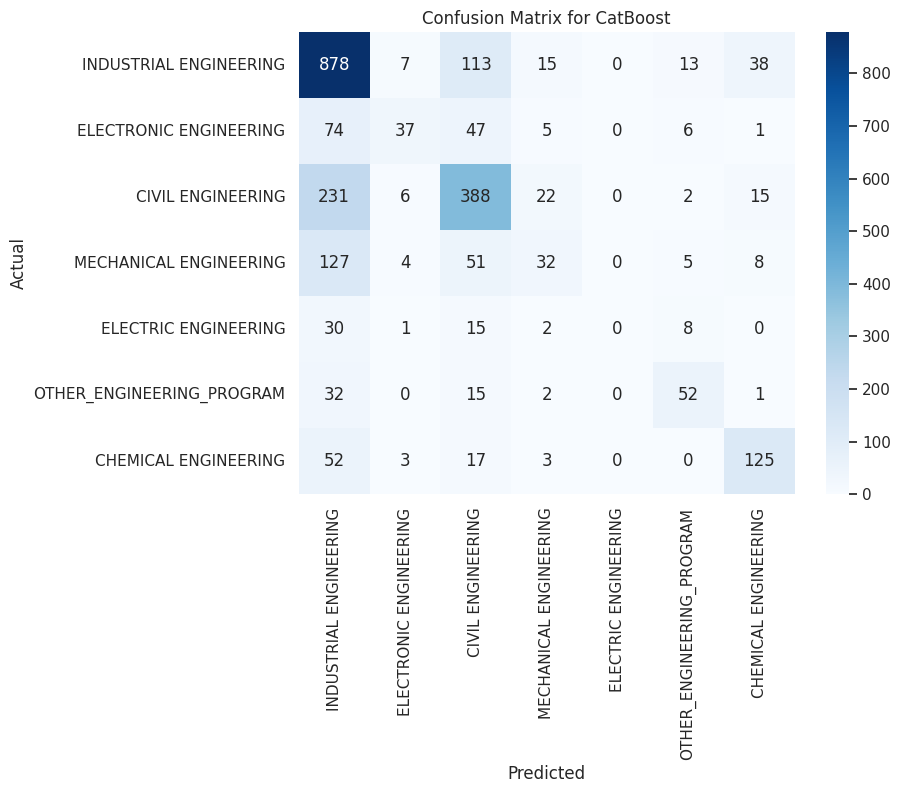

Sample Predictions for CatBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


Evaluating model: AdaBoost


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-

Classification Report for AdaBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.307692  0.020000  0.037559   200.000000
CIVIL ENGINEERING           0.360759  0.085843  0.138686   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.459991  0.945489  0.618886  1064.000000
MECHANICAL ENGINEERING      0.276596  0.057269  0.094891   227.000000
OTHER_ENGINEERING_PROGRAM   0.423077  0.323529  0.366667   102.000000
accuracy                    0.448248  0.448248  0.448248     0.448248
macro avg                   0.261159  0.204590  0.179527  2483.000000
weighted avg                0.361037  0.448248  0.329051  2483.000000


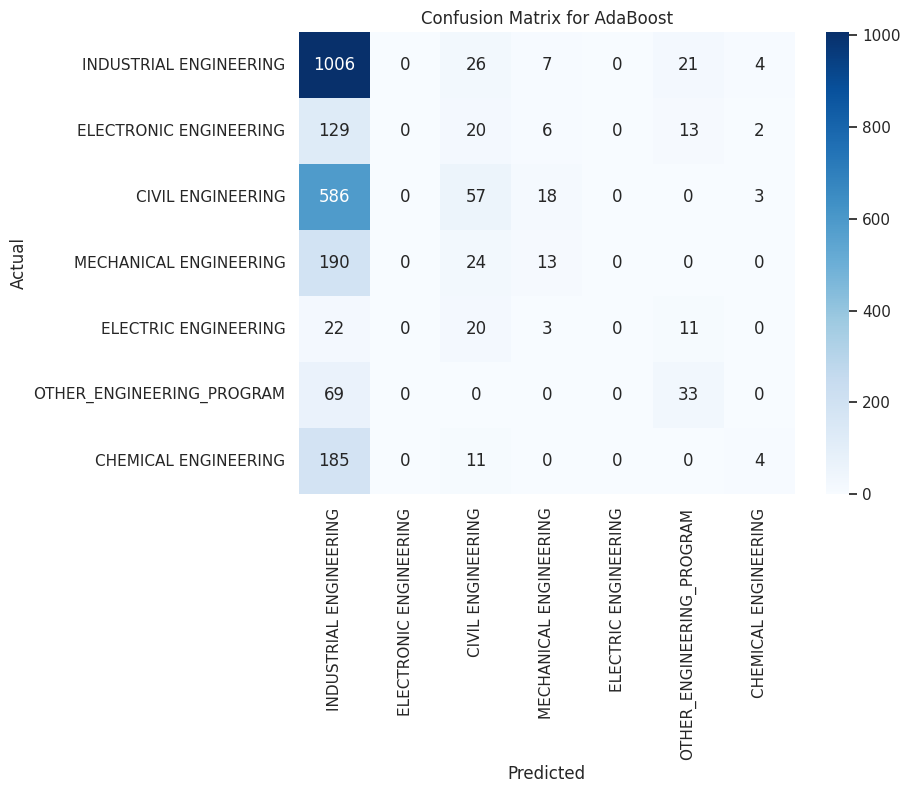

Sample Predictions for AdaBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING




In [ ]:
# Separate features (X) and target (y)
X = extracted_data_2.drop(columns=['ACADEMIC_PROGRAM'])
y = extracted_data_2['ACADEMIC_PROGRAM']

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Apply OneHotEncoding to categorical columns with handle_unknown='ignore' and sparse_output=False
column_transformer = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)],
    remainder='passthrough'
)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Dictionary of models to evaluate
models = {
    'Naive Bayes': make_pipeline(column_transformer, GaussianNB()),
    'Decision Tree': make_pipeline(column_transformer, DecisionTreeClassifier()),
    'LightGBM': make_pipeline(column_transformer, lgb.LGBMClassifier()),
    'CatBoost': make_pipeline(column_transformer, CatBoostClassifier(verbose=0)),
    'AdaBoost': make_pipeline(column_transformer, AdaBoostClassifier())
}

# Loop through each model
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")

    # Train the model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate the confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Calculate and display classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Ensure y_test is a 1D array
    actual_values = y_test.values.flatten()  # Use .values.flatten() to ensure 1D
    predicted_values = y_pred.flatten()  # Ensure predictions are 1D

    # Display a sample of actual vs predicted values
    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for {model_name}:')
    print(sample_predictions)
    print("\n")


Evaluating model: Naive Bayes
  Fold 1:
    Classification Report for Fold 1:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.381132  0.505000  0.434409   200.000000
CIVIL ENGINEERING           0.512821  0.421687  0.462810   664.000000
ELECTRIC ENGINEERING        0.135678  0.490909  0.212598    55.000000
ELECTRONIC ENGINEERING      0.165865  0.405882  0.235495   170.000000
INDUSTRIAL ENGINEERING      0.681416  0.361842  0.472683  1064.000000
MECHANICAL ENGINEERING      0.215827  0.264317  0.237624   227.000000
OTHER_ENGINEERING_PROGRAM   0.275701  0.572816  0.372240   103.000000
accuracy                    0.395087  0.395087  0.395087     0.395087
macro avg                   0.338349  0.431779  0.346837  2483.000000
weighted avg                0.505363  0.395087  0.419303  2483.000000


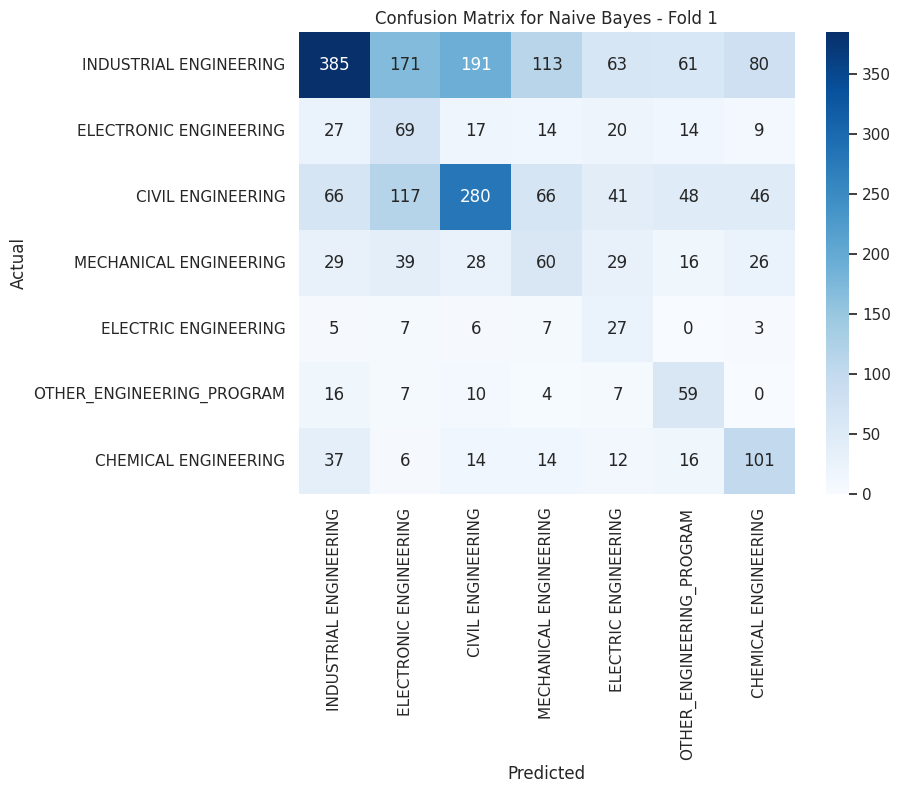

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  ELECTRONIC ENGINEERING
3  ELECTRONIC ENGINEERING    CHEMICAL ENGINEERING
4       CIVIL ENGINEERING  ELECTRONIC ENGINEERING
5  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  ELECTRONIC ENGINEERING
7  ELECTRONIC ENGINEERING    ELECTRIC ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  ELECTRONIC ENGINEERING


  Fold 2:
    Classification Report for Fold 2:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.455645  0.565000  0.504464   200.000000
CIVIL ENGINEERING           0.536260  0.423193  0.473064   664.000000
ELECTRIC ENGINEERING        0.112745  0.418182  0.177606    55.000000
ELECTRONIC ENGINEERING      0.204036  0.535294  0.295455   170.000000
INDUSTRIAL ENGI

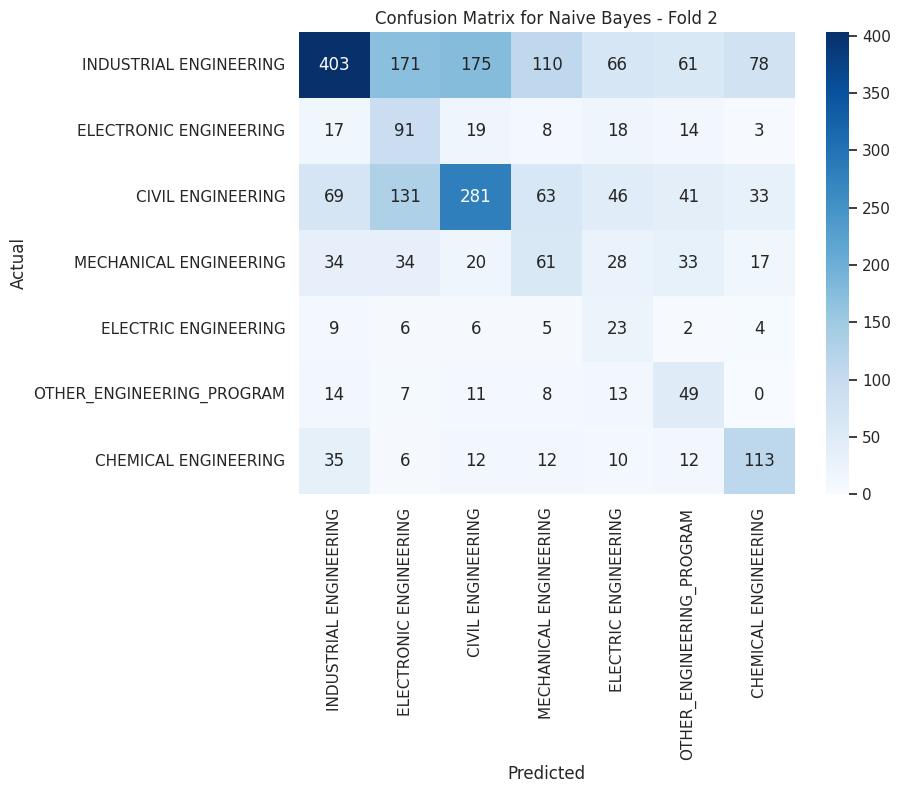

    Sample Predictions for Fold 2:
                      Actual                  Predicted
0     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
1     INDUSTRIAL ENGINEERING     ELECTRONIC ENGINEERING
2       ELECTRIC ENGINEERING     INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING          CIVIL ENGINEERING
5          CIVIL ENGINEERING     ELECTRONIC ENGINEERING
6     MECHANICAL ENGINEERING  OTHER_ENGINEERING_PROGRAM
7     INDUSTRIAL ENGINEERING     ELECTRONIC ENGINEERING
8     INDUSTRIAL ENGINEERING       ELECTRIC ENGINEERING
9  OTHER_ENGINEERING_PROGRAM     MECHANICAL ENGINEERING


  Fold 3:
    Classification Report for Fold 3:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.390845  0.555000  0.458678   200.000000
CIVIL ENGINEERING           0.535587  0.453313  0.491028   664.000000
ELECTRIC ENGINEERING        0.142132  0.500000  0.221344    56.000000
ELECTRONIC ENGINEER

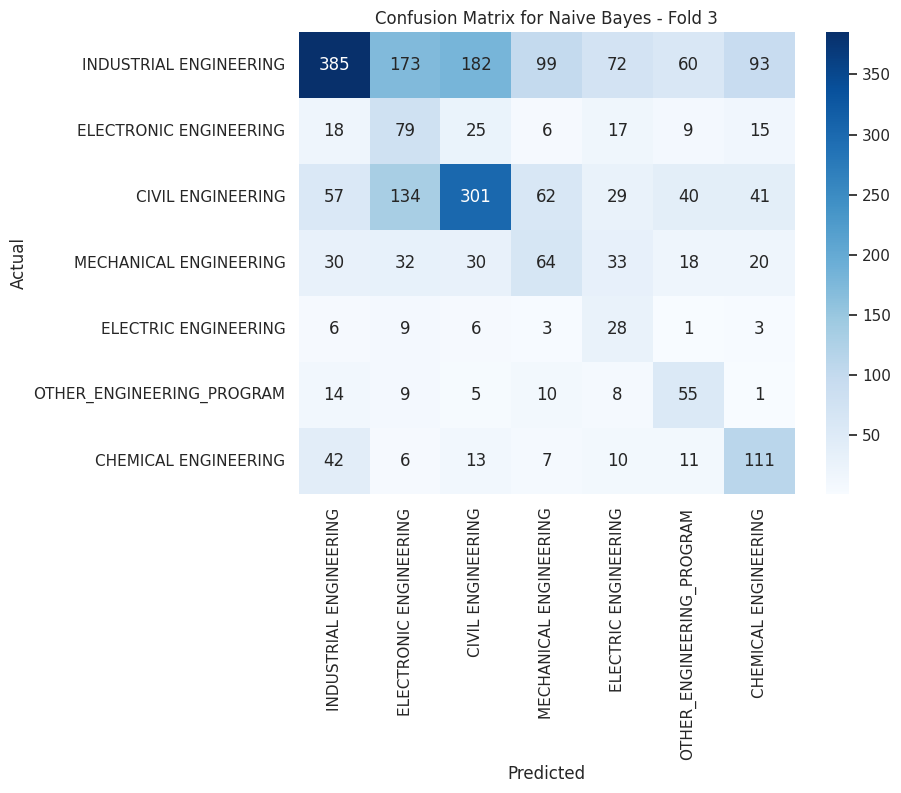

    Sample Predictions for Fold 3:
                      Actual                  Predicted
0     ELECTRONIC ENGINEERING     INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING          CIVIL ENGINEERING
2     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING     ELECTRONIC ENGINEERING
4     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING     ELECTRONIC ENGINEERING
6     INDUSTRIAL ENGINEERING       ELECTRIC ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  OTHER_ENGINEERING_PROGRAM
8     INDUSTRIAL ENGINEERING          CIVIL ENGINEERING
9     MECHANICAL ENGINEERING       ELECTRIC ENGINEERING


  Fold 4:
    Classification Report for Fold 4:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.421642  0.565000  0.482906   200.000000
CIVIL ENGINEERING           0.558594  0.430723  0.486395   664.000000
ELECTRIC ENGINEERING        0.131707  0.482143  0.206897    56.000000
ELECTRONIC ENGINEER

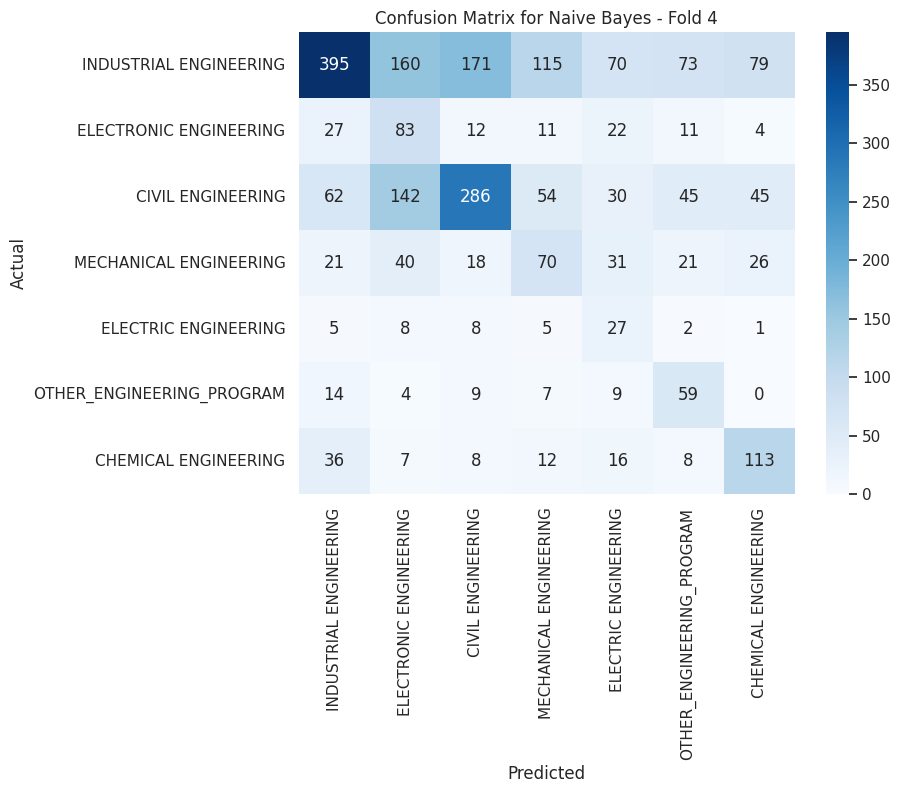

    Sample Predictions for Fold 4:
                   Actual                  Predicted
0  INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING       ELECTRIC ENGINEERING
3       CIVIL ENGINEERING  OTHER_ENGINEERING_PROGRAM
4       CIVIL ENGINEERING     ELECTRONIC ENGINEERING
5  ELECTRONIC ENGINEERING       ELECTRIC ENGINEERING
6       CIVIL ENGINEERING     ELECTRONIC ENGINEERING
7  INDUSTRIAL ENGINEERING     MECHANICAL ENGINEERING
8  MECHANICAL ENGINEERING       ELECTRIC ENGINEERING
9  INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING


  Fold 5:
    Classification Report for Fold 5:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.417021  0.490000  0.450575   200.000000
CIVIL ENGINEERING           0.547710  0.432229  0.483165   664.000000
ELECTRIC ENGINEERING        0.133641  0.517857  0.212454    56.000000
ELECTRONIC ENGINEERING      0.177986  0.447059  0.25

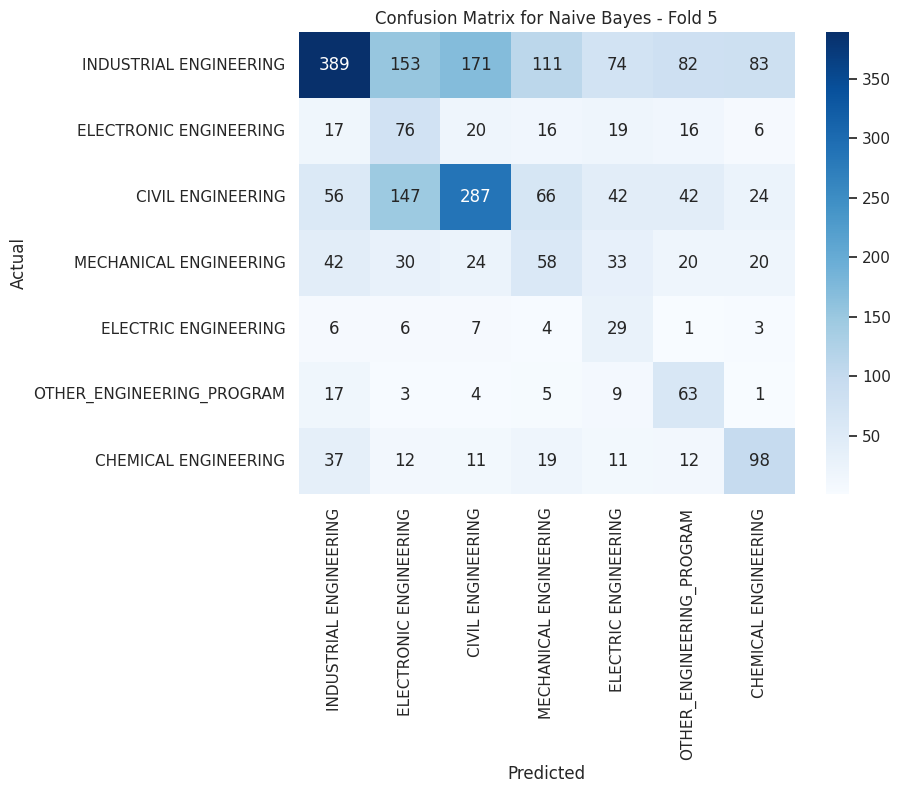

    Sample Predictions for Fold 5:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
1  INDUSTRIAL ENGINEERING    CHEMICAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4  MECHANICAL ENGINEERING  MECHANICAL ENGINEERING
5  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING    ELECTRIC ENGINEERING
8  ELECTRONIC ENGINEERING    ELECTRIC ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


--- Overall Performance for Naive Bayes ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.413257  0.536000  0.466206   200.000000
CIVIL ENGINEERING           0.538194  0.432229  0.479292   664.000000
ELECTRIC ENGINEERING        0.131181  0.481818  0.206180    55.600000
ELECTRONIC ENGINEERING      0.182711  0.468785  0.262901   169.800000
INDUSTRIAL ENGINEER

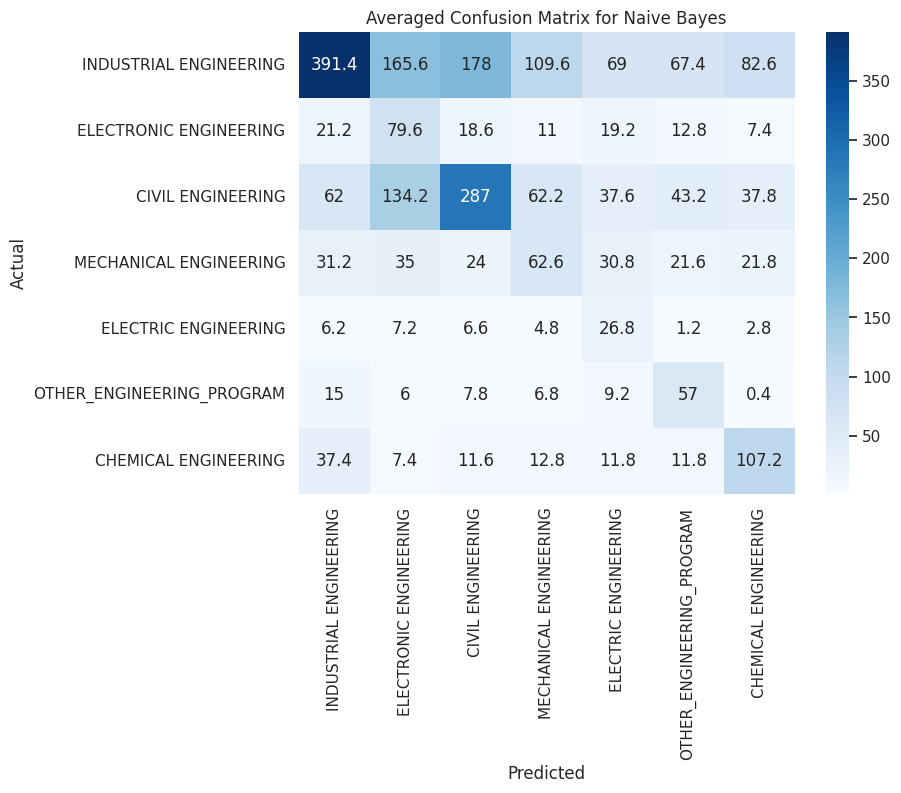

Evaluating model: Decision Tree
  Fold 1:
    Classification Report for Fold 1:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.527273  0.580000  0.552381   200.000000
CIVIL ENGINEERING           0.554531  0.543675  0.549049   664.000000
ELECTRIC ENGINEERING        0.170732  0.127273  0.145833    55.000000
ELECTRONIC ENGINEERING      0.324503  0.288235  0.305296   170.000000
INDUSTRIAL ENGINEERING      0.638739  0.666353  0.652254  1064.000000
MECHANICAL ENGINEERING      0.307339  0.295154  0.301124   227.000000
OTHER_ENGINEERING_PROGRAM   0.586957  0.524272  0.553846   103.000000
accuracy                    0.548933  0.548933  0.548933     0.548933
macro avg                   0.444296  0.432137  0.437112  2483.000000
weighted avg                0.542916  0.548933  0.545455  2483.000000


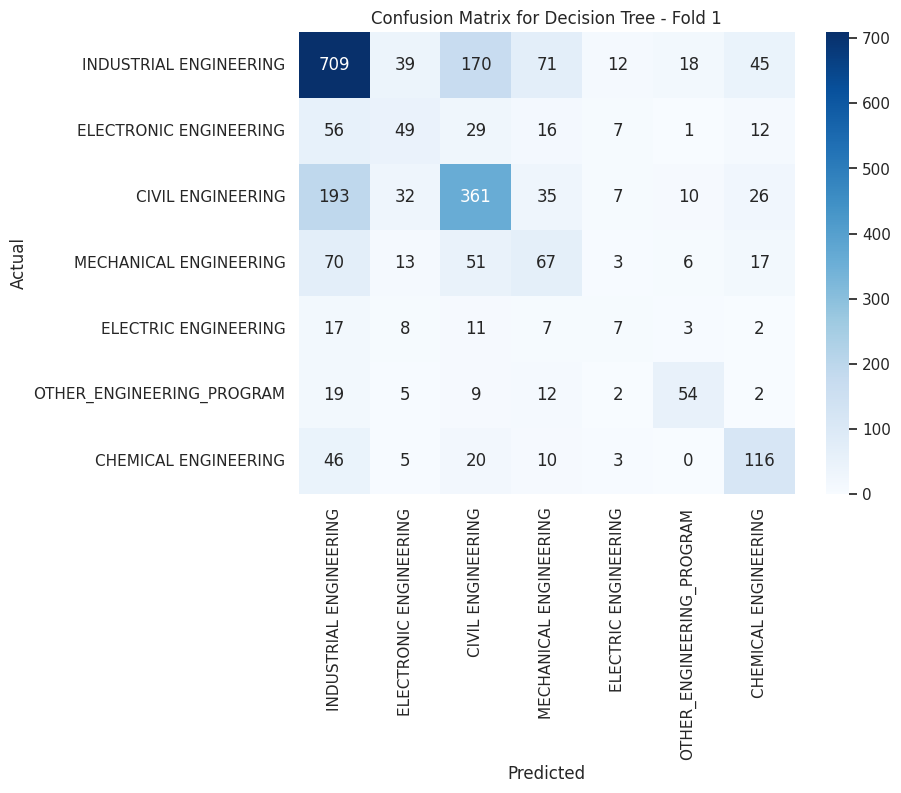

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
3  ELECTRONIC ENGINEERING    CHEMICAL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING    CHEMICAL ENGINEERING
6  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7  ELECTRONIC ENGINEERING    CHEMICAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 2:
    Classification Report for Fold 2:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.500000  0.480000  0.489796   200.000000
CIVIL ENGINEERING           0.538462  0.558735  0.548411   664.000000
ELECTRIC ENGINEERING        0.150000  0.109091  0.126316    55.000000
ELECTRONIC ENGINEERING      0.263566  0.200000  0.227425   170.000000
INDUSTRIAL ENGI

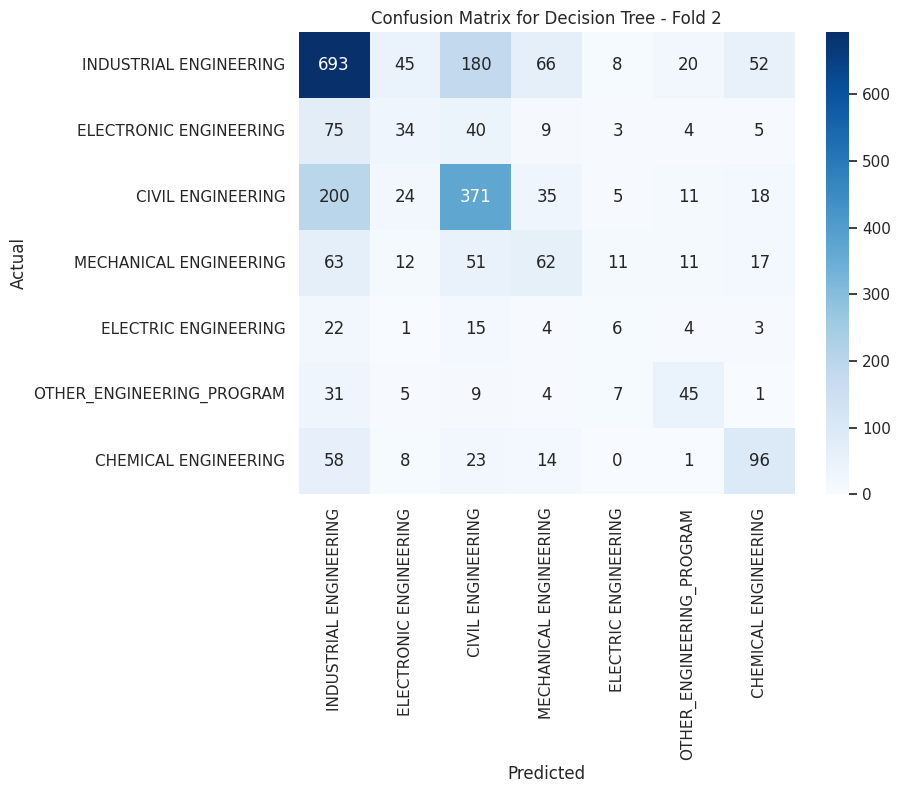

    Sample Predictions for Fold 2:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING  ELECTRONIC ENGINEERING
1     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING  ELECTRONIC ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING


  Fold 3:
    Classification Report for Fold 3:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.483092  0.500000  0.491400   200.000000
CIVIL ENGINEERING           0.539823  0.551205  0.545455   664.000000
ELECTRIC ENGINEERING        0.150943  0.142857  0.146789    56.000000
ELECTRONIC ENGINEERING      0.310345  0.266272  0.28

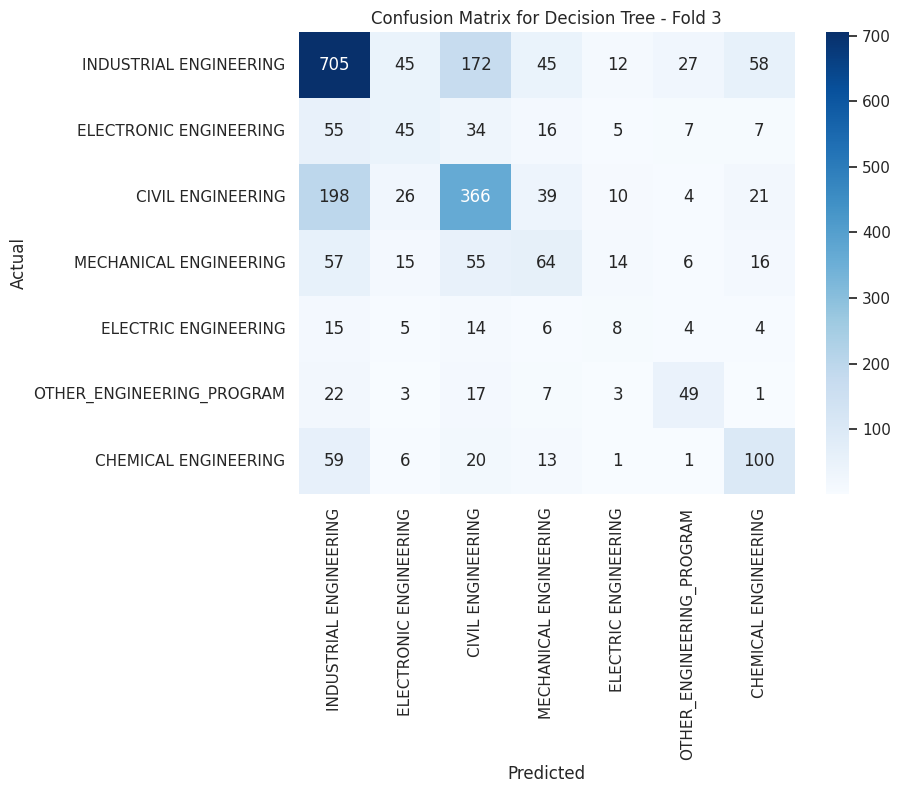

    Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
1          CIVIL ENGINEERING       CIVIL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  ELECTRONIC ENGINEERING
6     INDUSTRIAL ENGINEERING    ELECTRIC ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING    CHEMICAL ENGINEERING


  Fold 4:
    Classification Report for Fold 4:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.518868  0.550000  0.533981   200.000000
CIVIL ENGINEERING           0.563338  0.569277  0.566292   664.000000
ELECTRIC ENGINEERING        0.100000  0.071429  0.083333    56.000000
ELECTRONIC ENGINEERING      0.228346  0.170588  0.19

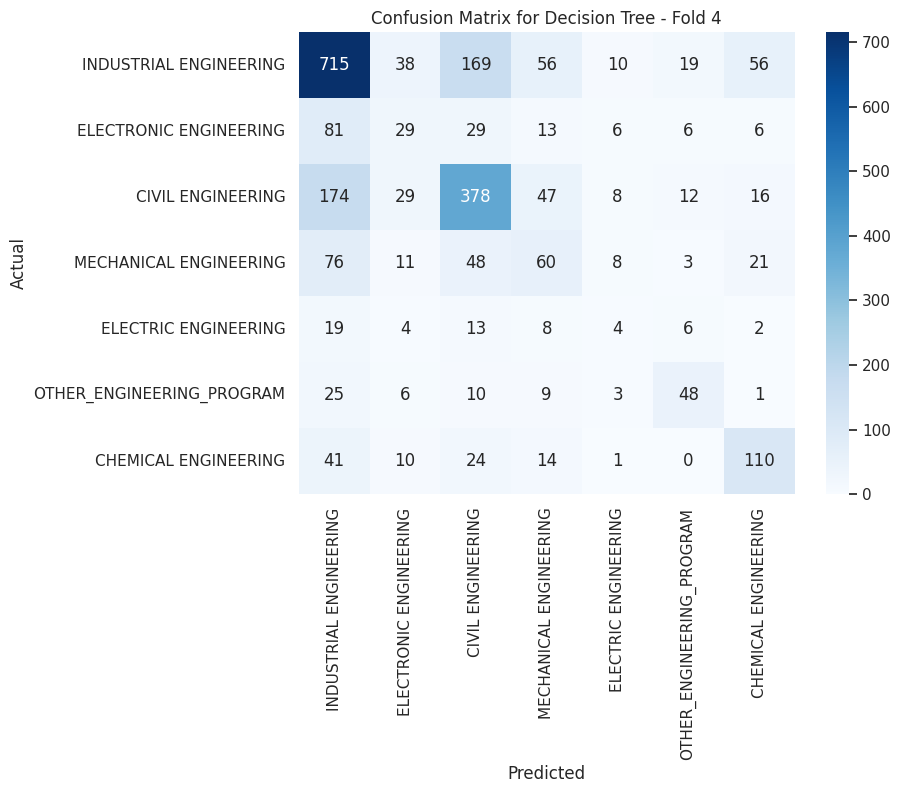

    Sample Predictions for Fold 4:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3       CIVIL ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
6       CIVIL ENGINEERING  ELECTRONIC ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8  MECHANICAL ENGINEERING  ELECTRONIC ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 5:
    Classification Report for Fold 5:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.522222  0.470000  0.494737   200.000000
CIVIL ENGINEERING           0.537589  0.570783  0.553689   664.000000
ELECTRIC ENGINEERING        0.131579  0.089286  0.106383    56.000000
ELECTRONIC ENGINEERING      0.301370  0.258824  0.278481   170.000000
INDUSTRIAL ENGI

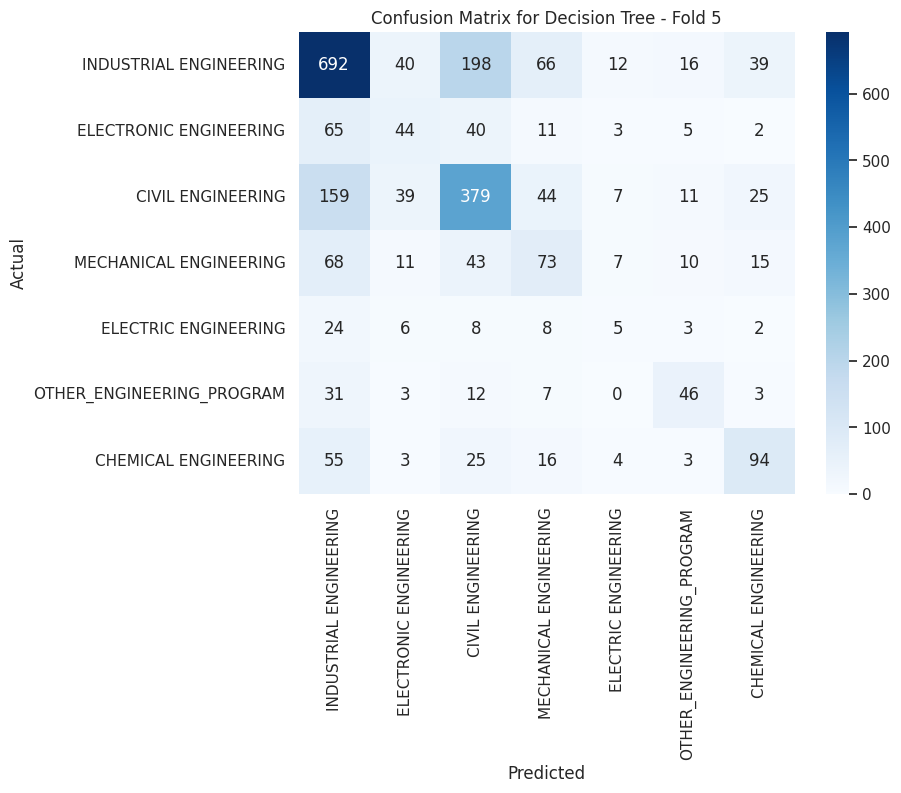

    Sample Predictions for Fold 5:
                   Actual                  Predicted
0  INDUSTRIAL ENGINEERING          CIVIL ENGINEERING
1  INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING     MECHANICAL ENGINEERING
3  ELECTRONIC ENGINEERING     ELECTRONIC ENGINEERING
4  MECHANICAL ENGINEERING     MECHANICAL ENGINEERING
5  ELECTRONIC ENGINEERING     ELECTRONIC ENGINEERING
6  INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING  OTHER_ENGINEERING_PROGRAM
8  ELECTRONIC ENGINEERING     INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING


--- Overall Performance for Decision Tree ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.510291  0.516000  0.512459   200.000000
CIVIL ENGINEERING           0.546749  0.558735  0.552579   664.000000
ELECTRIC ENGINEERING        0.140651  0.107987  0.121731    55.600000
ELECTRONIC ENGINEERING      0.285626  0.236784  0.2586

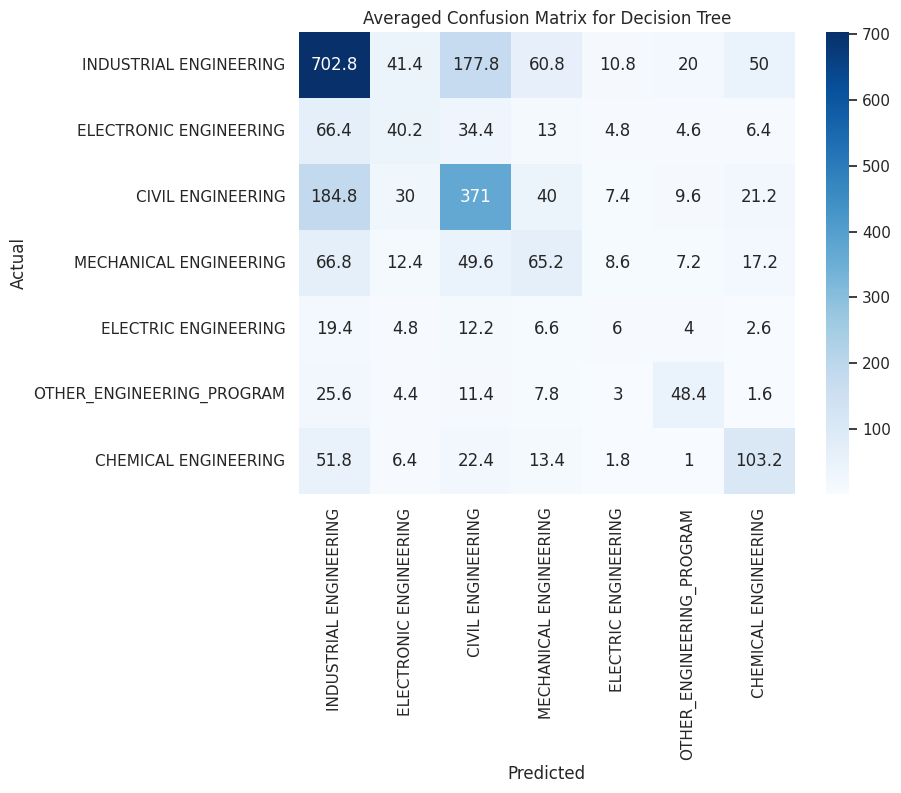

Evaluating model: LightGBM
  Fold 1:
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001556 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 815
[LightGBM] [Info] Number of data points in the train set: 9928, number of used features: 127
[LightGBM] [Info] Start training from score -2.518503
[LightGBM] [Info] Start training from score -1.318538
[LightGBM] [Info] Start training from score -3.795943
[LightGBM] [Info] Start training from score -2.682493
[LightGBM] [Info] Start training from score -0.847499
[LightGBM] [Info] Start training from score -2.391870
[LightGBM] [Info] Start training from score -3.191847
    Classification Report for Fold 1:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.586207  0.595000  0.590571   200.000000
CIVIL ENGINEERING           0.583333  0.590361  0.58682

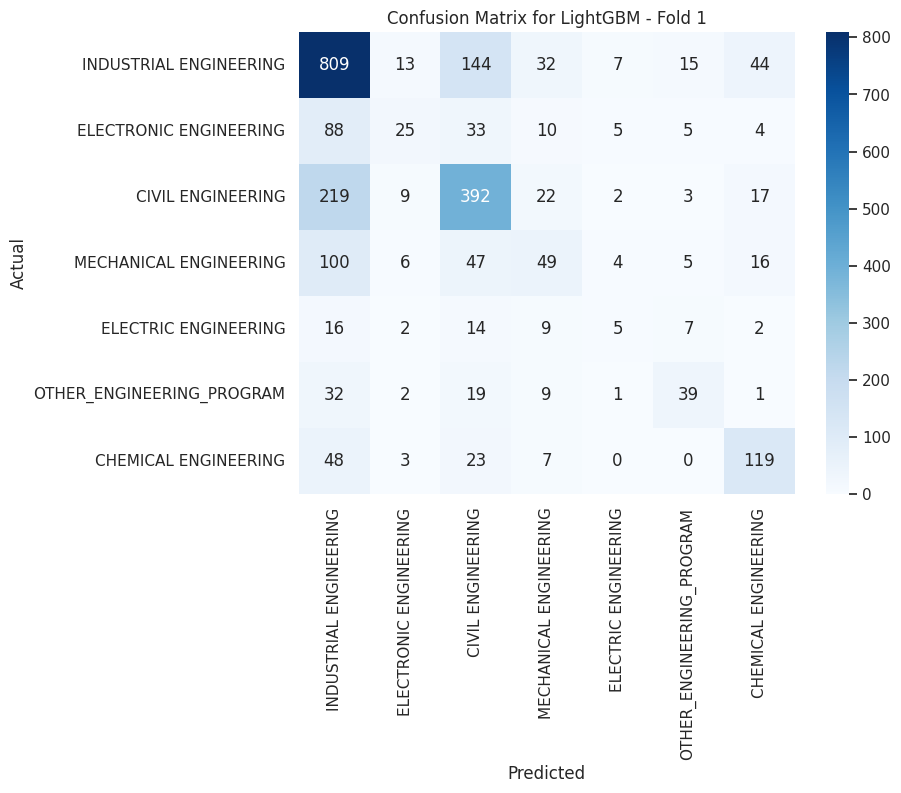

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING       CIVIL ENGINEERING
5  ELECTRONIC ENGINEERING    CHEMICAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 2:
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 808
[LightGBM] [Info] Number of data points in the train set: 9929, number of used features: 123
[LightGBM] [Info] Start training from score -2.5186

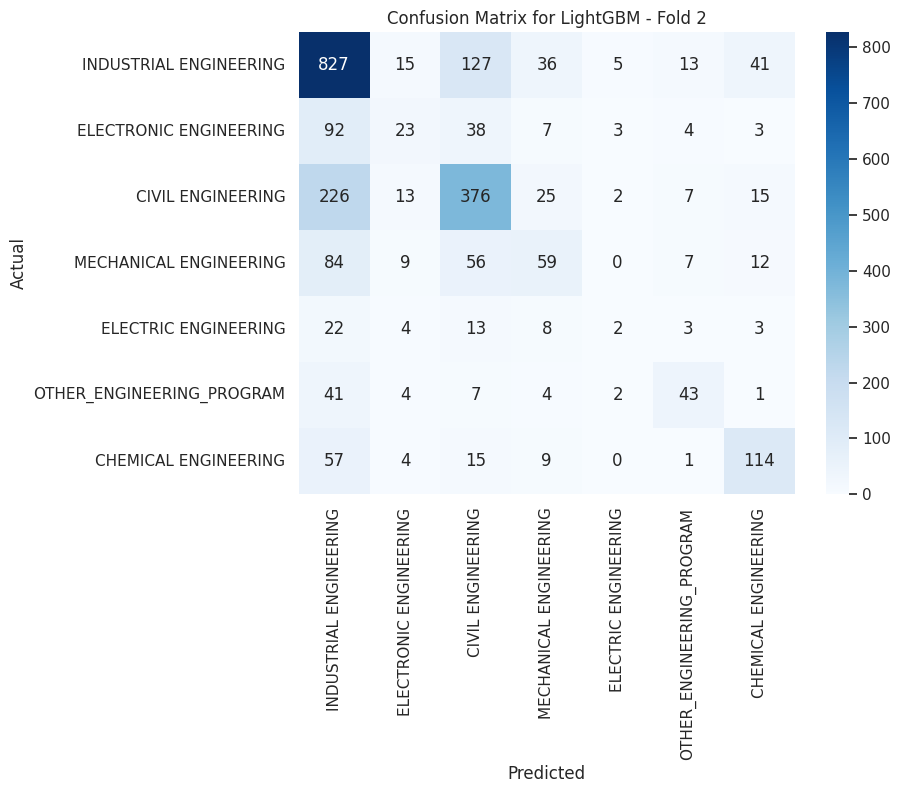

    Sample Predictions for Fold 2:
                      Actual                  Predicted
0     INDUSTRIAL ENGINEERING     MECHANICAL ENGINEERING
1     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING     INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING     INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  OTHER_ENGINEERING_PROGRAM
7     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM     INDUSTRIAL ENGINEERING


  Fold 3:
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001562 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 812
[LightGBM] [Info] Number of data points in the train set: 9929, number of used

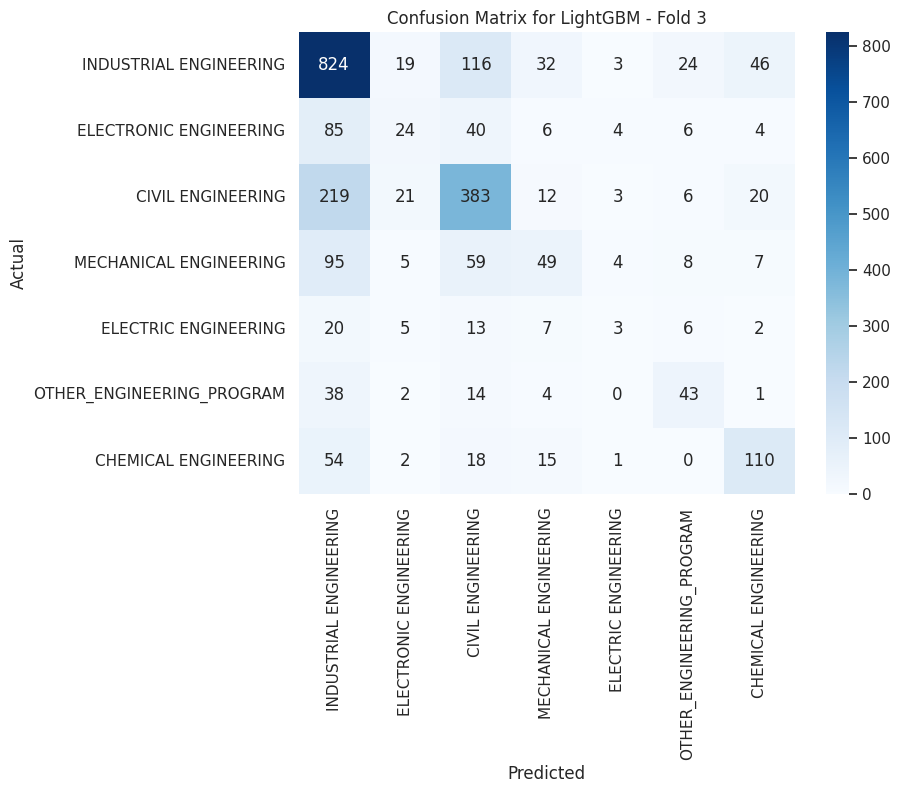

    Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING       CIVIL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
6     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 4:
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 801
[LightGBM] [Info] Number of data points in the train set: 9929, number of used features: 122
[LightGBM] [Info] 

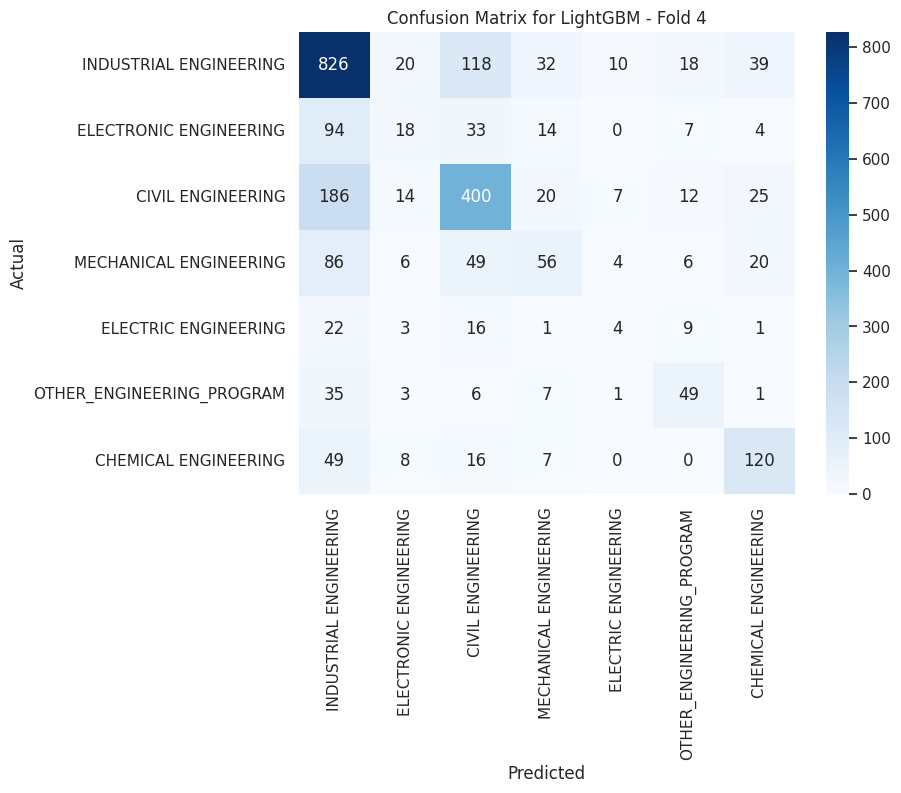

    Sample Predictions for Fold 4:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
3       CIVIL ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6       CIVIL ENGINEERING       CIVIL ENGINEERING
7  INDUSTRIAL ENGINEERING    ELECTRIC ENGINEERING
8  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 5:
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002445 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 800
[LightGBM] [Info] Number of data points in the train set: 9929, number of used features: 121
[LightGBM] [Info] Start training from score -2.5186

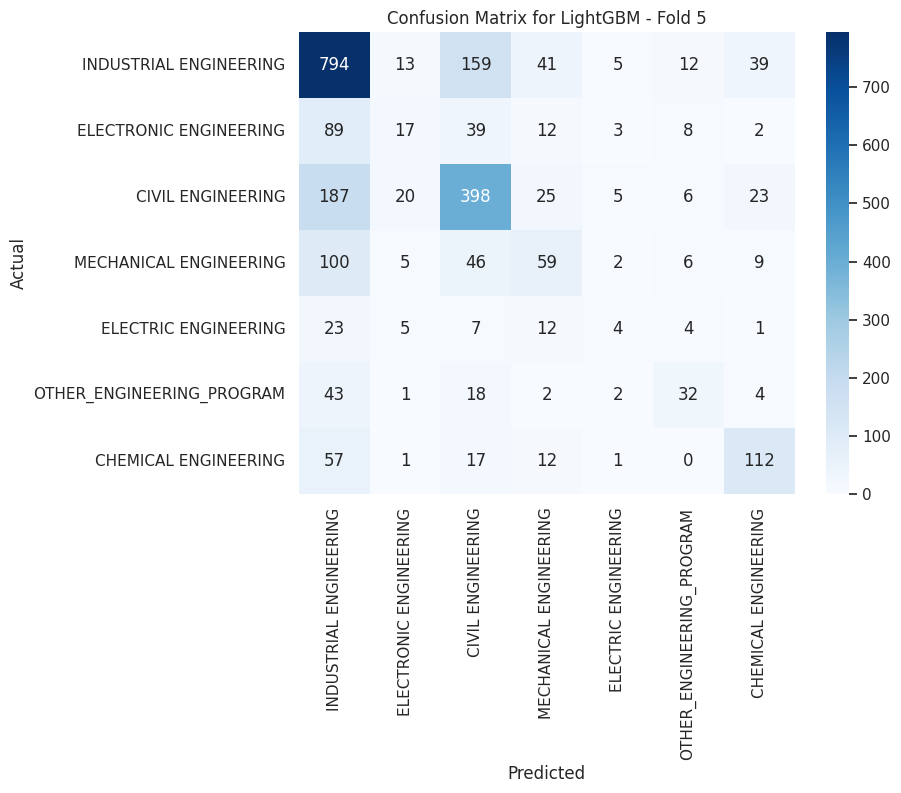

    Sample Predictions for Fold 5:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4  MECHANICAL ENGINEERING  MECHANICAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


--- Overall Performance for LightGBM ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.585846  0.575000  0.580103   200.000000
CIVIL ENGINEERING           0.596549  0.587048  0.591618   664.000000
ELECTRIC ENGINEERING        0.170704  0.064740  0.093152    55.600000
ELECTRONIC ENGINEERING      0.313599  0.126049  0.179424   169.800000
INDUSTRIAL ENGINEERING

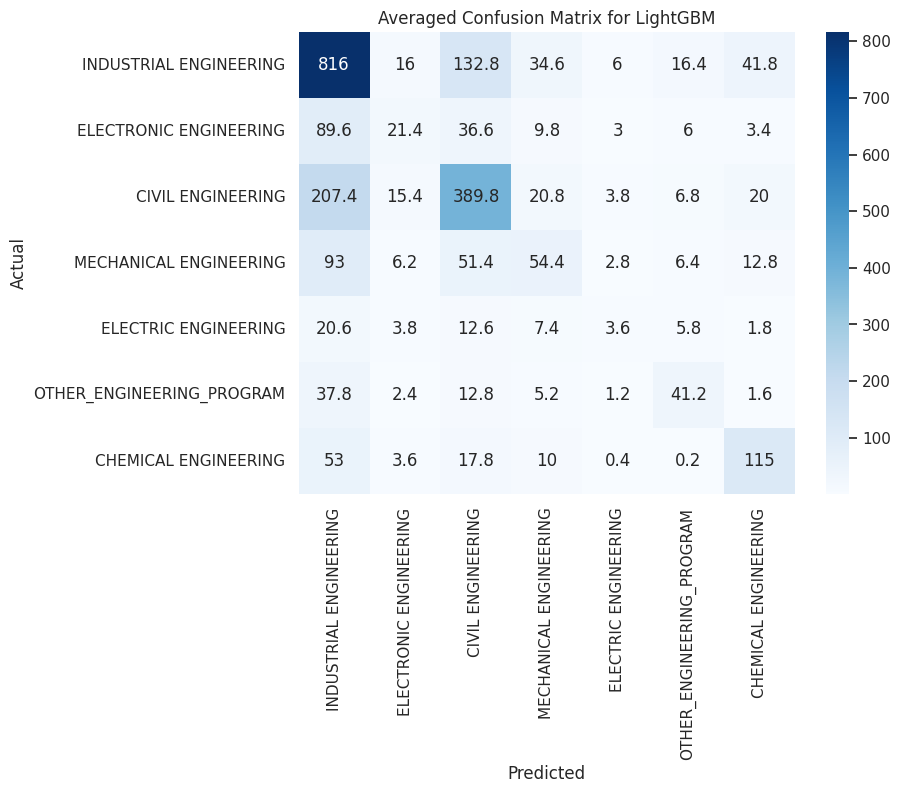

Evaluating model: CatBoost
  Fold 1:
    Classification Report for Fold 1:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.654971  0.560000  0.603774   200.000000
CIVIL ENGINEERING           0.577086  0.614458  0.595186   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    55.000000
ELECTRONIC ENGINEERING      0.736842  0.247059  0.370044   170.000000
INDUSTRIAL ENGINEERING      0.615880  0.809211  0.699431  1064.000000
MECHANICAL ENGINEERING      0.475610  0.171806  0.252427   227.000000
OTHER_ENGINEERING_PROGRAM   0.656716  0.427184  0.517647   103.000000
accuracy                    0.606524  0.606524  0.606524     0.606524
macro avg                   0.531015  0.404245  0.434073  2483.000000
weighted avg                0.592164  0.606524  0.577398  2483.000000


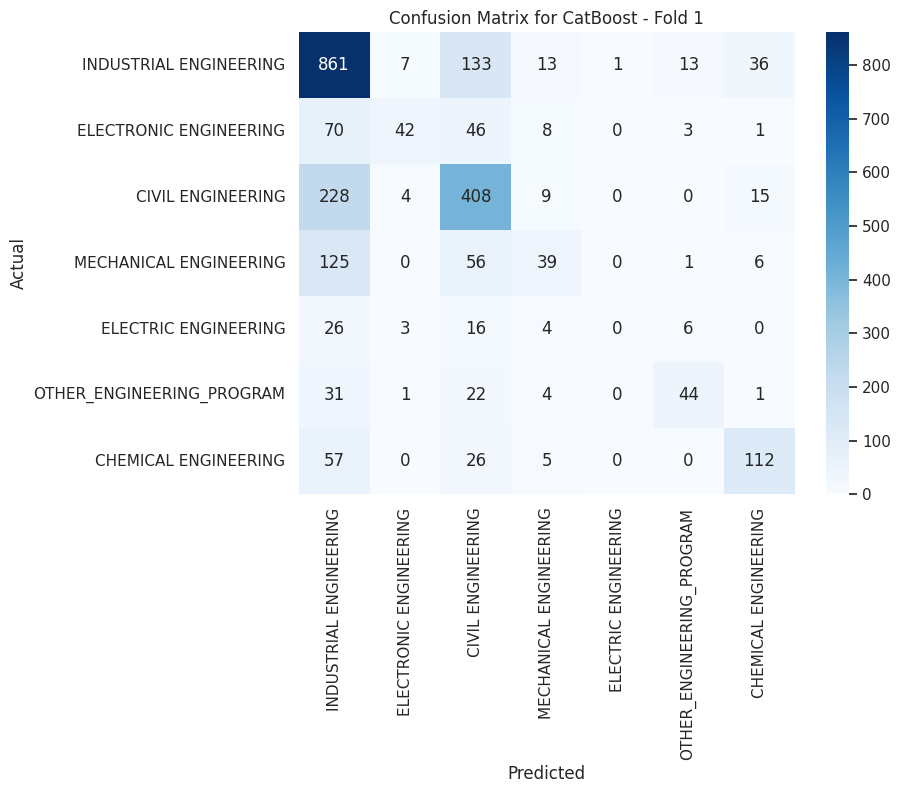

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING       CIVIL ENGINEERING
5  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 2:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


    Classification Report for Fold 2:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.640449  0.570000  0.603175   200.00000
CIVIL ENGINEERING           0.590504  0.599398  0.594918   664.00000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    55.00000
ELECTRONIC ENGINEERING      0.822222  0.217647  0.344186   170.00000
INDUSTRIAL ENGINEERING      0.624823  0.828008  0.712207  1064.00000
MECHANICAL ENGINEERING      0.500000  0.207048  0.292835   227.00000
OTHER_ENGINEERING_PROGRAM   0.703704  0.558824  0.622951   102.00000
accuracy                    0.618050  0.618050  0.618050     0.61805
macro avg                   0.554529  0.425846  0.452896  2482.00000
weighted avg                0.608401  0.618050  0.589031  2482.00000


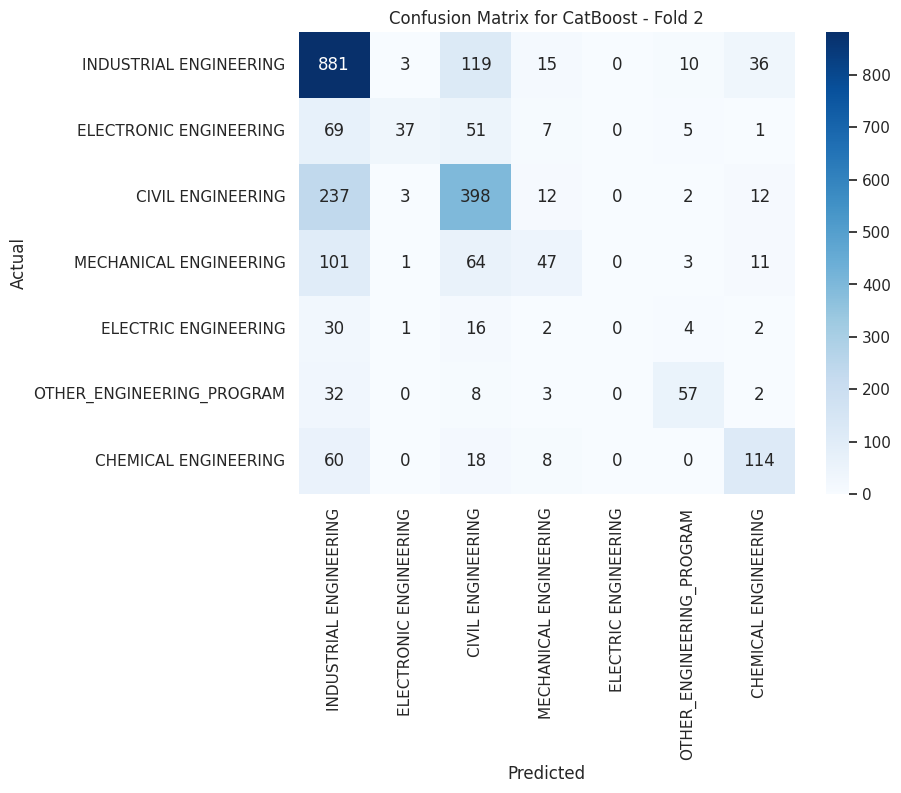

    Sample Predictions for Fold 2:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING  MECHANICAL ENGINEERING
1     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING


  Fold 3:
    Classification Report for Fold 3:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.695652  0.560000  0.620499   200.000000
CIVIL ENGINEERING           0.579970  0.584337  0.582146   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.755102  0.218935  0.33

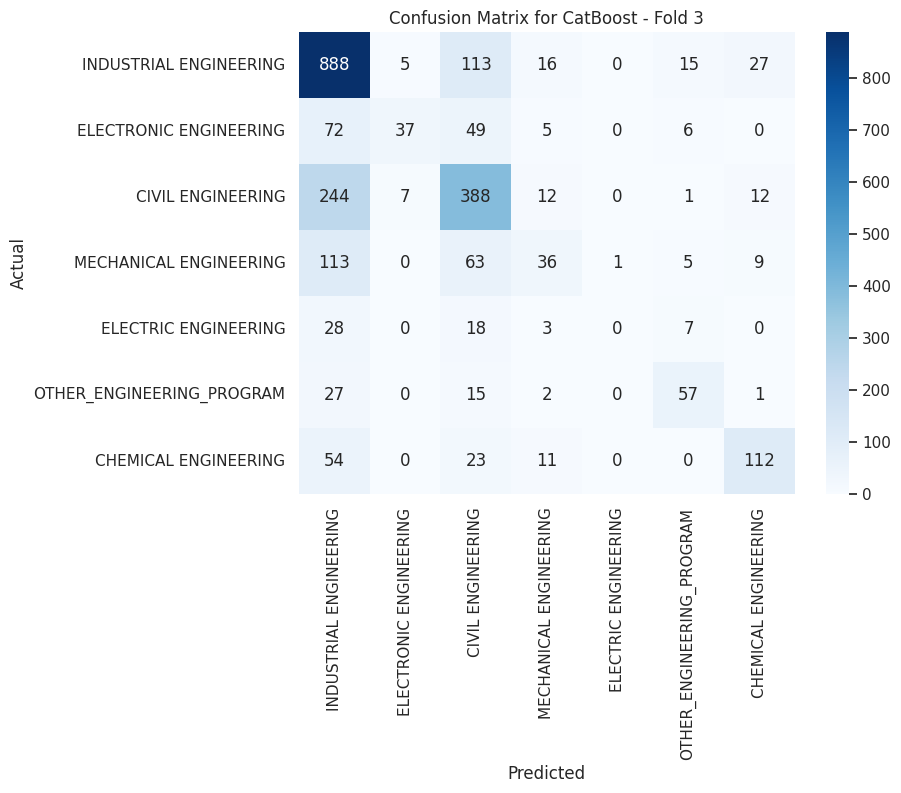

    Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING       CIVIL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
6     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 4:
    Classification Report for Fold 4:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.621622  0.575000  0.597403   200.000000
CIVIL ENGINEERING           0.620029  0.634036  0.626955   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.618182  0.200000  0.30

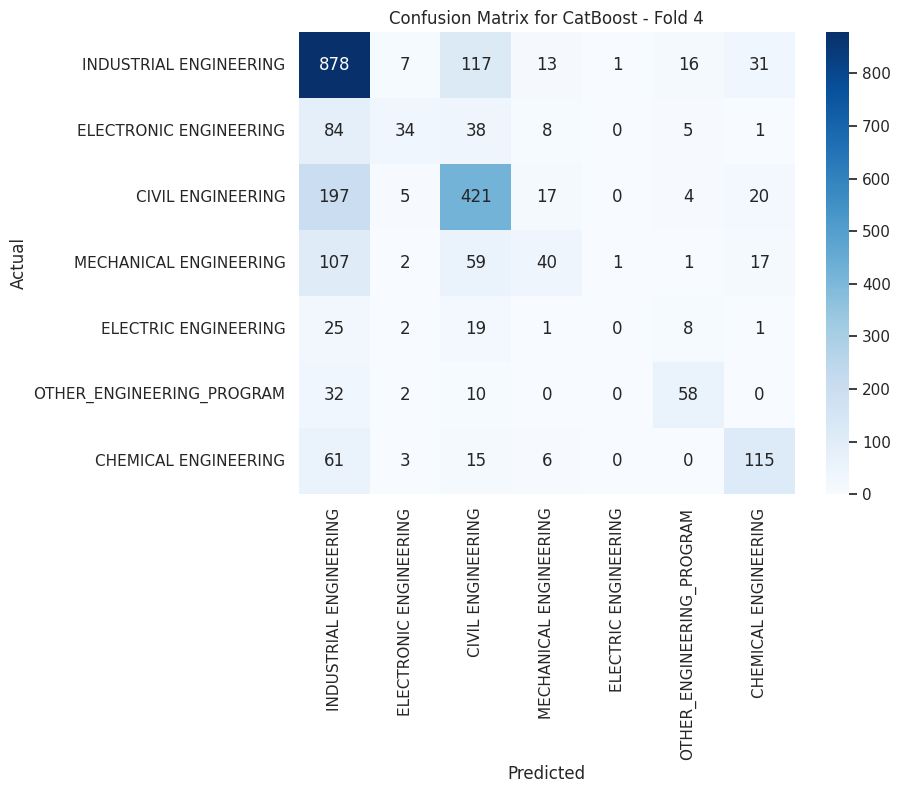

    Sample Predictions for Fold 4:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3       CIVIL ENGINEERING       CIVIL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
6       CIVIL ENGINEERING       CIVIL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 5:
    Classification Report for Fold 5:
                           precision    recall  f1-score     support
CHEMICAL ENGINEERING        0.625000  0.500000  0.555556   200.00000
CIVIL ENGINEERING           0.601983  0.640060  0.620438   664.00000
ELECTRIC ENGINEERING        0.500000  0.017857  0.034483    56.00000
ELECTRONIC ENGINEERING      0.655738  0.235294  0.346320   170.00000
INDUSTRIAL ENGINEERI

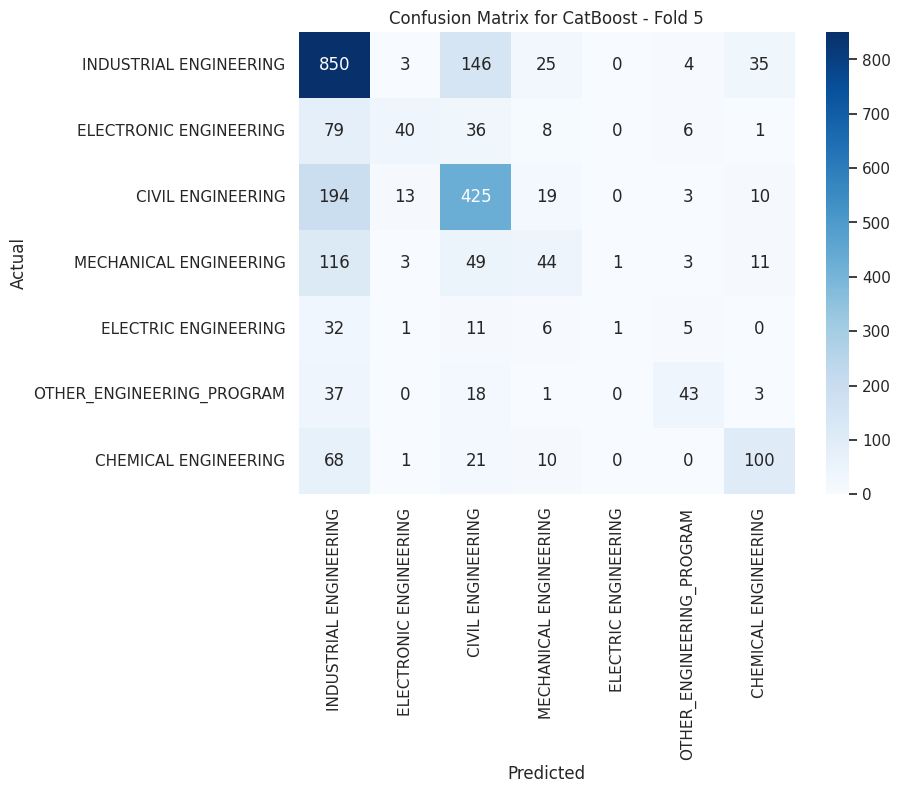

    Sample Predictions for Fold 5:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4  MECHANICAL ENGINEERING  MECHANICAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


--- Overall Performance for CatBoost ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.647539  0.553000  0.596081   200.000000
CIVIL ENGINEERING           0.593915  0.614458  0.603928   664.000000
ELECTRIC ENGINEERING        0.100000  0.003571  0.006897    55.600000
ELECTRONIC ENGINEERING      0.717617  0.223787  0.340444   169.800000
INDUSTRIAL ENGINEERING

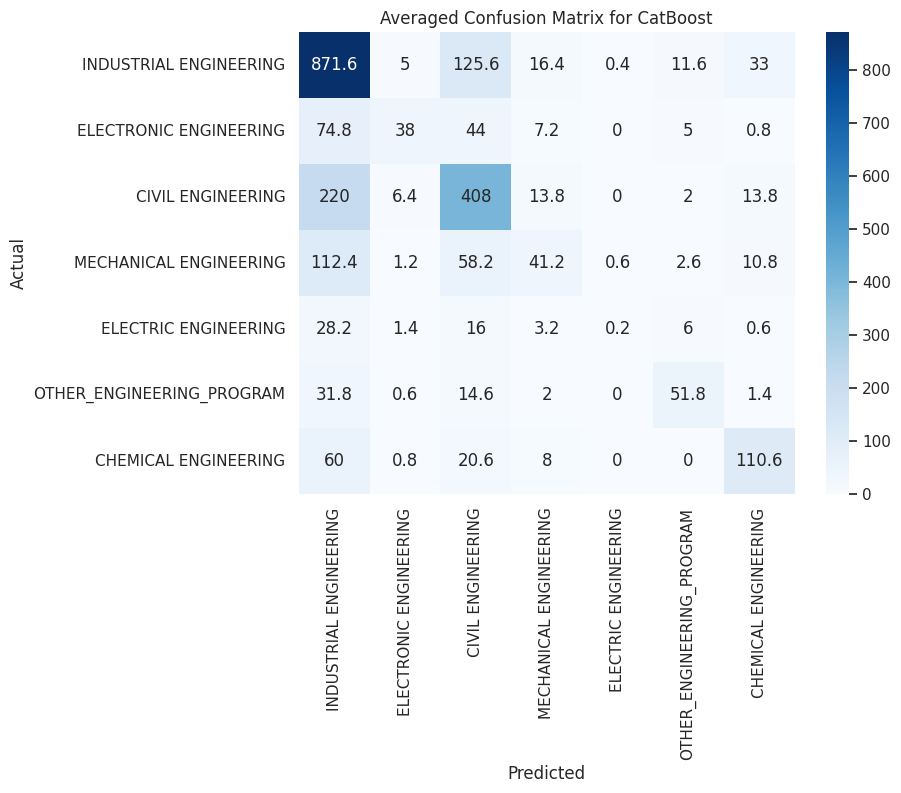

Evaluating model: AdaBoost
  Fold 1:


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-

    Classification Report for Fold 1:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.636364  0.280000  0.388889   200.000000
CIVIL ENGINEERING           0.375839  0.084337  0.137761   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    55.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.470227  0.935150  0.625786  1064.000000
MECHANICAL ENGINEERING      0.317073  0.114537  0.168285   227.000000
OTHER_ENGINEERING_PROGRAM   0.354167  0.165049  0.225166   103.000000
accuracy                    0.463149  0.463149  0.463149     0.463149
macro avg                   0.307667  0.225582  0.220841  2483.000000
weighted avg                0.396942  0.463149  0.361047  2483.000000


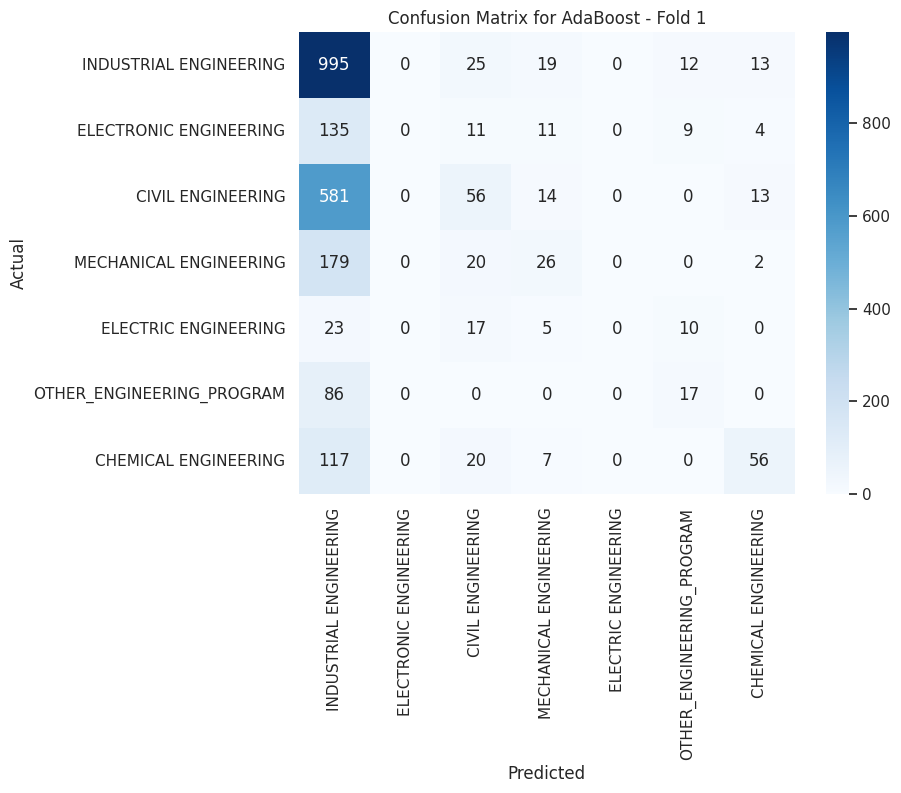

    Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 2:


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-

    Classification Report for Fold 2:
                           precision    recall  f1-score    support
CHEMICAL ENGINEERING        0.642857  0.045000  0.084112   200.0000
CIVIL ENGINEERING           0.358974  0.063253  0.107554   664.0000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    55.0000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.0000
INDUSTRIAL ENGINEERING      0.450506  0.962406  0.613725  1064.0000
MECHANICAL ENGINEERING      0.300000  0.052863  0.089888   227.0000
OTHER_ENGINEERING_PROGRAM   0.421053  0.156863  0.228571   102.0000
accuracy                    0.444400  0.444400  0.444400     0.4444
macro avg                   0.310484  0.182912  0.160550  2482.0000
weighted avg                0.385704  0.444400  0.316261  2482.0000


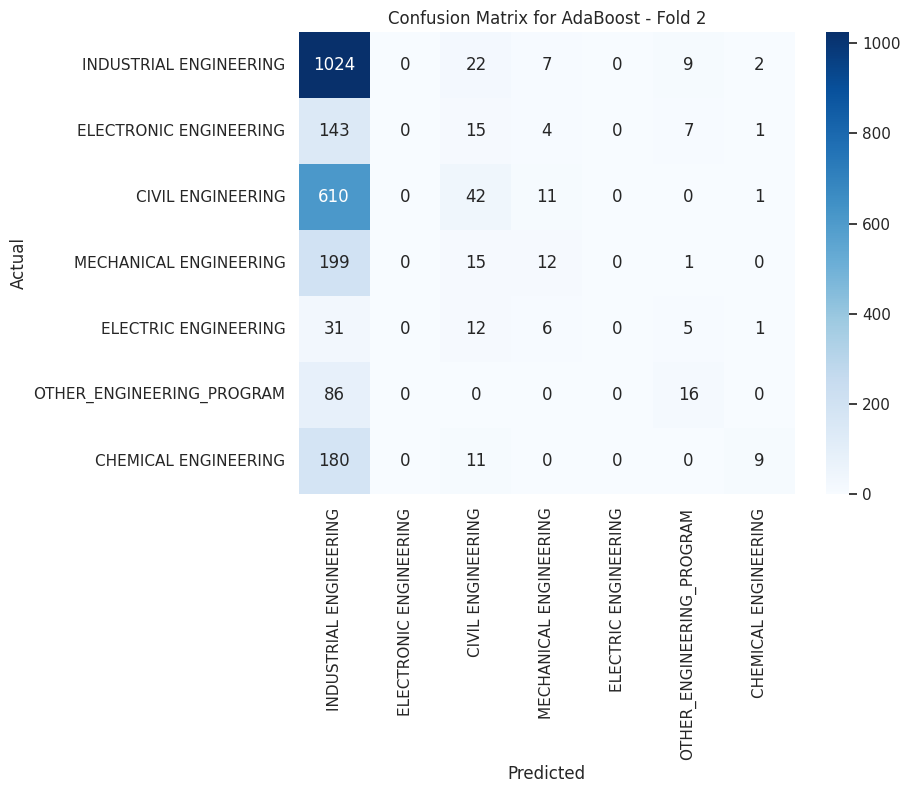

    Sample Predictions for Fold 2:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING  MECHANICAL ENGINEERING
1     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING


  Fold 3:


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-

    Classification Report for Fold 3:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.656250  0.210000  0.318182   200.000000
CIVIL ENGINEERING           0.317618  0.192771  0.239925   664.000000
ELECTRIC ENGINEERING        0.166667  0.017857  0.032258    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   169.000000
INDUSTRIAL ENGINEERING      0.481078  0.872180  0.620114  1064.000000
MECHANICAL ENGINEERING      0.305556  0.048458  0.083650   227.000000
OTHER_ENGINEERING_PROGRAM   0.318182  0.137255  0.191781   102.000000
accuracy                    0.452861  0.452861  0.452861     0.452861
macro avg                   0.320764  0.211217  0.212273  2482.000000
weighted avg                0.388866  0.452861  0.371919  2482.000000


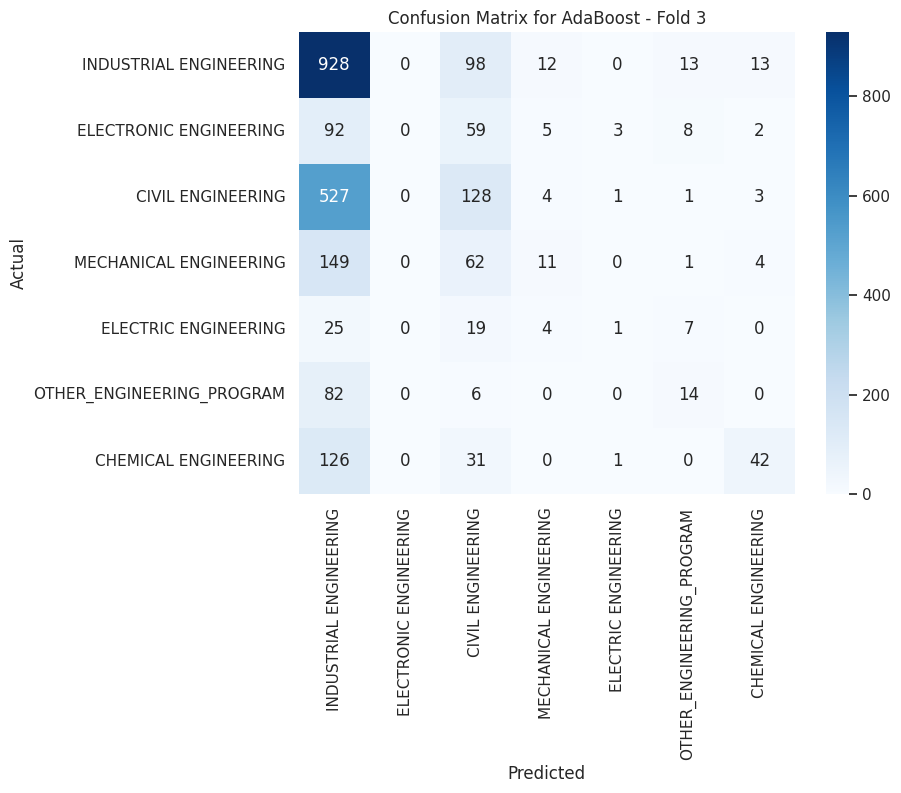

    Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING       CIVIL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING       CIVIL ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
6     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 4:


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


    Classification Report for Fold 4:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.544118  0.185000  0.276119   200.000000
CIVIL ENGINEERING           0.356725  0.091867  0.146108   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.200000  0.011765  0.022222   170.000000
INDUSTRIAL ENGINEERING      0.463898  0.924741  0.617850  1063.000000
MECHANICAL ENGINEERING      0.404762  0.074890  0.126394   227.000000
OTHER_ENGINEERING_PROGRAM   0.484375  0.303922  0.373494   102.000000
accuracy                    0.455681  0.455681  0.455681     0.455681
macro avg                   0.350554  0.227455  0.223170  2482.000000
weighted avg                0.408582  0.455681  0.354384  2482.000000


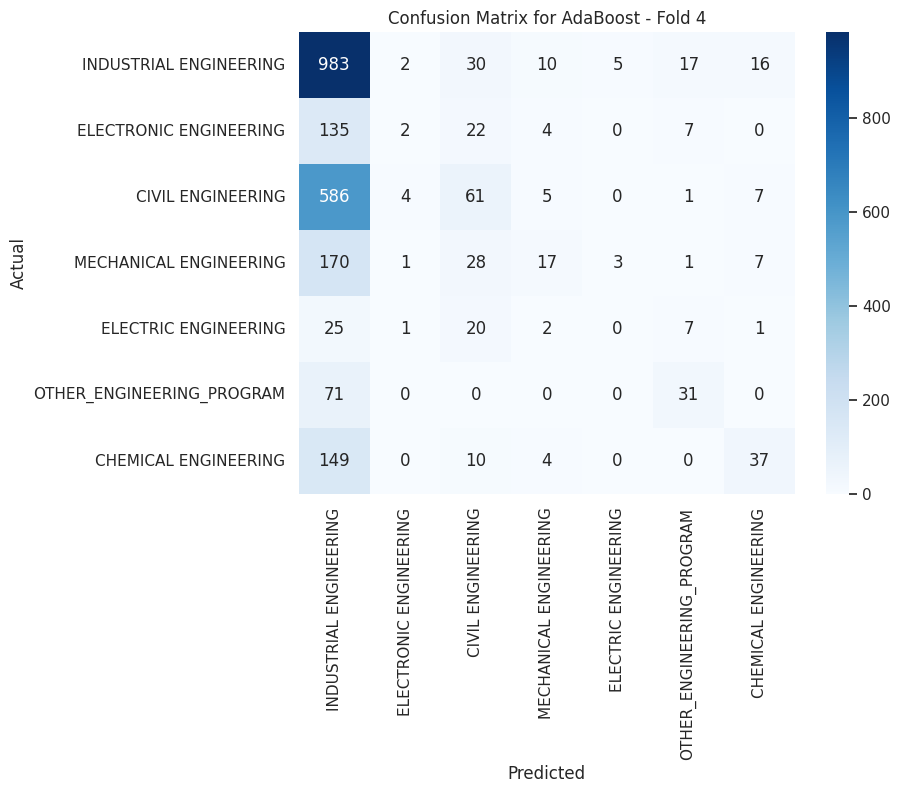

    Sample Predictions for Fold 4:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


  Fold 5:


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-

    Classification Report for Fold 5:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.732143  0.205000  0.320312   200.000000
CIVIL ENGINEERING           0.350384  0.206325  0.259716   664.000000
ELECTRIC ENGINEERING        0.238095  0.089286  0.129870    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERING      0.484367  0.859831  0.619661  1063.000000
MECHANICAL ENGINEERING      0.290323  0.118943  0.168750   227.000000
OTHER_ENGINEERING_PROGRAM   0.382353  0.127451  0.191176   102.000000
accuracy                    0.458098  0.458098  0.458098     0.458098
macro avg                   0.353952  0.229548  0.241355  2482.000000
weighted avg                0.407817  0.458098  0.386903  2482.000000


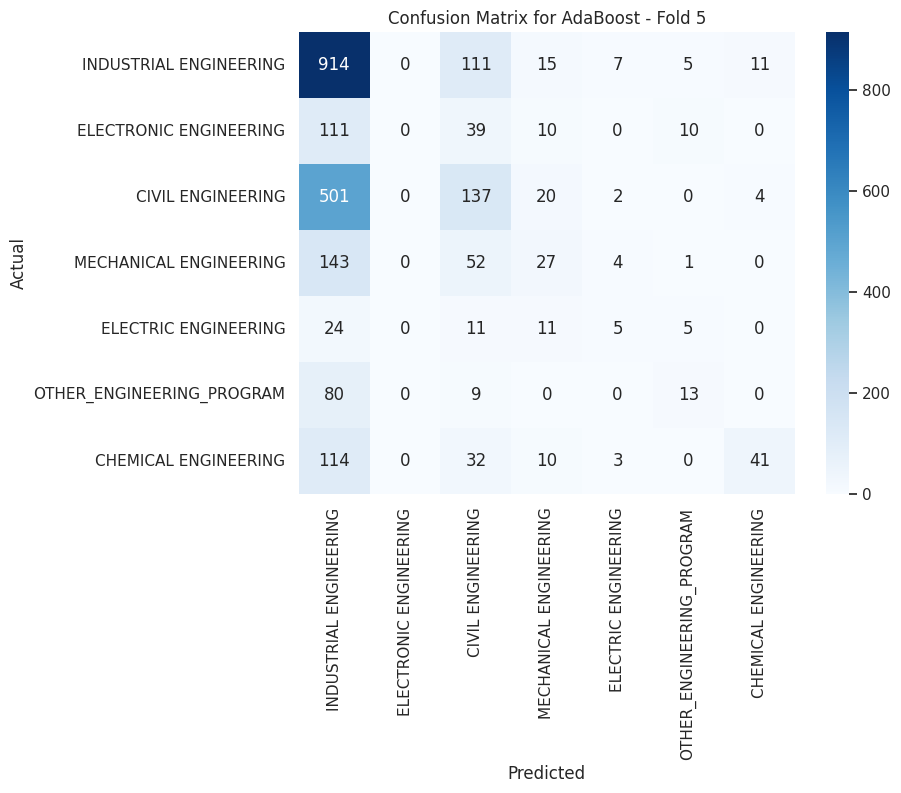

    Sample Predictions for Fold 5:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING    ELECTRIC ENGINEERING
3  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
4  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
5  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
8  ELECTRONIC ENGINEERING       CIVIL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


--- Overall Performance for AdaBoost ---
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.642346  0.185000  0.277523   200.000000
CIVIL ENGINEERING           0.351908  0.127711  0.178213   664.000000
ELECTRIC ENGINEERING        0.080952  0.021429  0.032426    55.600000
ELECTRONIC ENGINEERING      0.040000  0.002353  0.004444   169.800000
INDUSTRIAL ENGINEERING

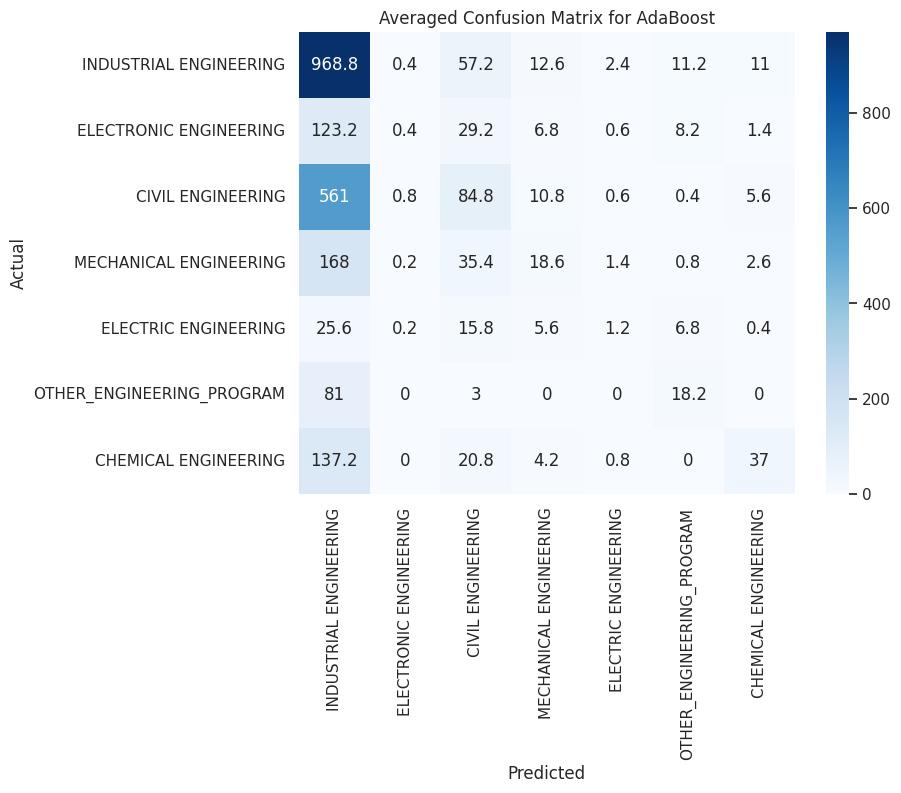

In [ ]:
# Separate features (X) and target (y)
X = extracted_data_2.drop(columns=['ACADEMIC_PROGRAM'])
y = extracted_data_2['ACADEMIC_PROGRAM']

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Apply OneHotEncoding to categorical columns with handle_unknown='ignore' and sparse_output=False
column_transformer = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)],
    remainder='passthrough'
)

# Dictionary of models to evaluate
models = {
    'Naive Bayes': make_pipeline(column_transformer, GaussianNB()),
    'Decision Tree': make_pipeline(column_transformer, DecisionTreeClassifier()),
    'LightGBM': make_pipeline(column_transformer, lgb.LGBMClassifier()),
    'CatBoost': make_pipeline(column_transformer, CatBoostClassifier(verbose=0)),
    'AdaBoost': make_pipeline(column_transformer, AdaBoostClassifier())
}

# Stratified K-Fold cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Loop through each model
for model_name, model in models.items():
    print(f"Evaluating model: {model_name}")

    # Initialize lists to store the performance metrics for each fold
    all_reports = []
    all_confusion_matrices = []

    # Stratified K-Fold Cross Validation
    fold = 1
    for train_index, test_index in skf.split(X, y):
        print(f"  Fold {fold}:")

        # Split the data into training and testing sets for the current fold
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Train the model
        model.fit(X_train, y_train)

        # Make predictions
        y_pred = model.predict(X_test)

        # Calculate the confusion matrix for the current fold
        confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())
        all_confusion_matrices.append(confusion_matrix_total)

        # Calculate and store the classification report for the current fold
        report = classification_report(y_test, y_pred, output_dict=True)
        avg_report = pd.DataFrame(report).transpose()
        all_reports.append(avg_report)

        print(f"    Classification Report for Fold {fold}:")
        print(avg_report)

        # Plot the confusion matrix for the current fold
        plt.figure(figsize=(8, 6))
        sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                    xticklabels=y.unique(), yticklabels=y.unique())
        plt.title(f"Confusion Matrix for {model_name} - Fold {fold}")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.show()

        # Ensure y_test is a 1D array
        actual_values = y_test.values.flatten()  # Use .values.flatten() to ensure 1D
        predicted_values = y_pred.flatten()  # Ensure predictions are 1D

        # Display a sample of actual vs predicted values
        sample_predictions = pd.DataFrame({
            'Actual': actual_values[:10],  # Take the first 10 actual values
            'Predicted': predicted_values[:10]  # Take the first 10 predicted values
        })
        print(f'    Sample Predictions for Fold {fold}:')
        print(sample_predictions)
        print("\n")

        fold += 1

    # Optionally: Aggregate results across all folds
    print(f"--- Overall Performance for {model_name} ---")
    avg_report_across_folds = pd.concat(all_reports).groupby(level=0).mean()
    print(avg_report_across_folds)

    # Plot the averaged confusion matrix across all folds
    mean_confusion_matrix = np.mean(all_confusion_matrices, axis=0)
    plt.figure(figsize=(8, 6))
    sns.heatmap(mean_confusion_matrix, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Averaged Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no pre

Classification Report for Logistic Regression:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.576923  0.525000  0.549738   200.000000
CIVIL ENGINEERING           0.564841  0.590361  0.577320   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.350000  0.082353  0.133333   170.000000
INDUSTRIAL ENGINEERING      0.593109  0.760338  0.666392  1064.000000
MECHANICAL ENGINEERING      0.277778  0.154185  0.198300   227.000000
OTHER_ENGINEERING_PROGRAM   0.415584  0.313725  0.357542   102.000000
accuracy                    0.558598  0.558598  0.558598     0.558598
macro avg                   0.396891  0.346566  0.354661  2483.000000
weighted avg                0.518104  0.558598  0.526170  2483.000000


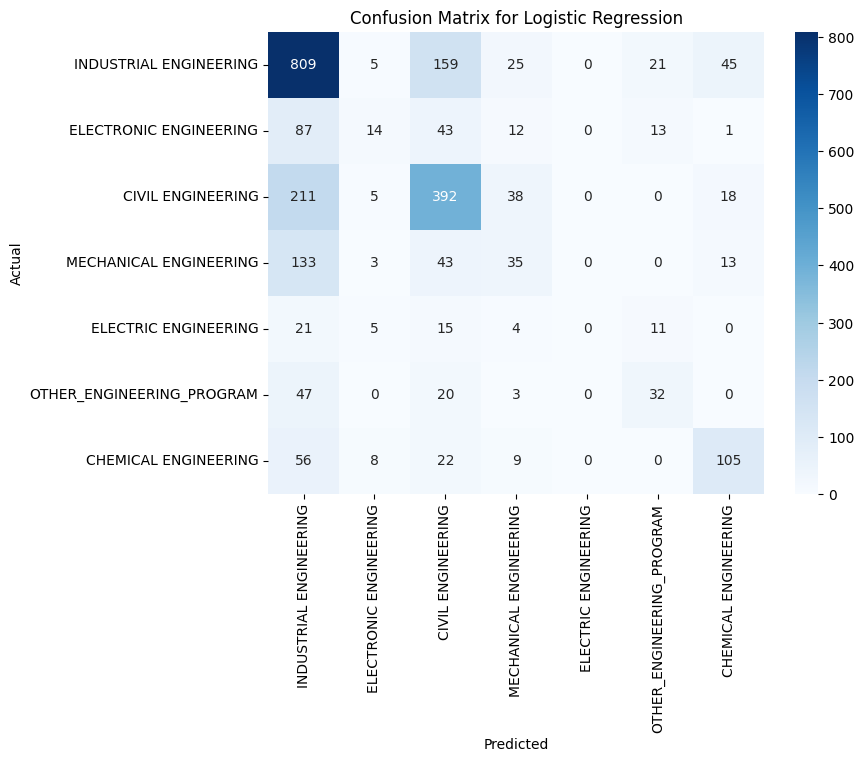

Sample Predictions for Logistic Regression:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING  ELECTRONIC ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


In [ ]:
# Separate features (X) and target (y)
X = extracted_data_2.drop(columns=['ACADEMIC_PROGRAM'])  # Features
y = extracted_data_2['ACADEMIC_PROGRAM']  # Target

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Apply OneHotEncoding to categorical columns with handle_unknown='ignore', sparse_output=False
column_transformer = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)],
    remainder='passthrough'
)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Create pipeline for Logistic Regression
logreg_model = make_pipeline(column_transformer, LogisticRegression(max_iter=500))

# Train the Logistic Regression model
logreg_model.fit(X_train, y_train)

# Make predictions
y_pred = logreg_model.predict(X_test)

# Calculate the confusion matrix
confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

# Calculate and display classification report
report = classification_report(y_test, y_pred, output_dict=True)
avg_report = pd.DataFrame(report).transpose()
print("Classification Report for Logistic Regression:")
print(avg_report)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
            xticklabels=y.unique(), yticklabels=y.unique())
plt.title("Confusion Matrix for Logistic Regression")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Ensure y_test is a 1D array
actual_values = y_test.values.flatten()  # Use .values.flatten() to ensure 1D
predicted_values = y_pred.flatten()  # Ensure predictions are 1D

# Display a sample of actual vs predicted values
sample_predictions = pd.DataFrame({
    'Actual': actual_values[:10],  # Take the first 10 actual values
    'Predicted': predicted_values[:10]  # Take the first 10 predicted values
})
print('Sample Predictions for Logistic Regression:')
print(sample_predictions)


Fold 1:


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.1

Classification Report for Fold 1:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.580189  0.615000  0.597087   200.000000
CIVIL ENGINEERING           0.602679  0.609940  0.606287   664.000000
ELECTRIC ENGINEERING        0.333333  0.018182  0.034483    55.000000
ELECTRONIC ENGINEERING      0.627907  0.317647  0.421875   170.000000
INDUSTRIAL ENGINEERING      0.632881  0.745301  0.684506  1064.000000
MECHANICAL ENGINEERING      0.397436  0.273128  0.323760   227.000000
OTHER_ENGINEERING_PROGRAM   0.633663  0.621359  0.627451   103.000000
accuracy                    0.604913  0.604913  0.604913     0.604913
macro avg                   0.544013  0.457222  0.470778  2483.000000
weighted avg                0.592092  0.604913  0.588821  2483.000000


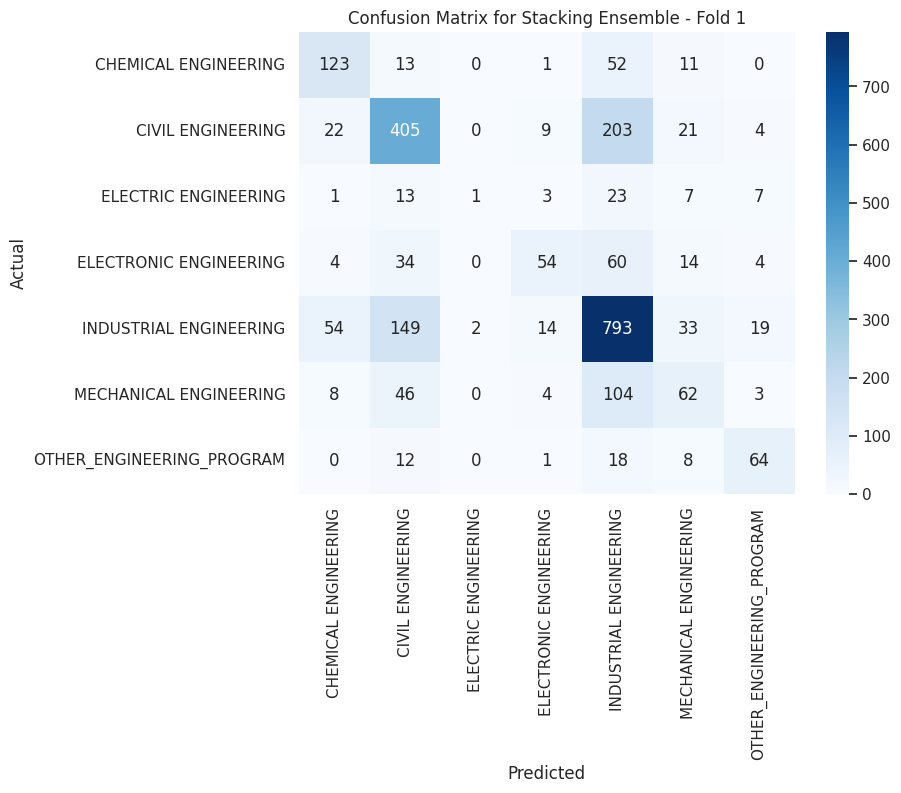

Sample Predictions for Fold 1:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
3  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
4       CIVIL ENGINEERING       CIVIL ENGINEERING
5  ELECTRONIC ENGINEERING    CHEMICAL ENGINEERING
6  INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
7  ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
8  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING


Fold 2:


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.1

Classification Report for Fold 2:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.623116  0.620000  0.621554   200.000000
CIVIL ENGINEERING           0.595912  0.570783  0.583077   664.000000
ELECTRIC ENGINEERING        0.142857  0.036364  0.057971    55.000000
ELECTRONIC ENGINEERING      0.561224  0.323529  0.410448   170.000000
INDUSTRIAL ENGINEERING      0.631912  0.751880  0.686695  1064.000000
MECHANICAL ENGINEERING      0.417178  0.299559  0.348718   227.000000
OTHER_ENGINEERING_PROGRAM   0.603774  0.627451  0.615385   102.000000
accuracy                    0.601128  0.601128  0.601128     0.601128
macro avg                   0.510853  0.461367  0.474835  2482.000000
weighted avg                0.585098  0.601128  0.587031  2482.000000


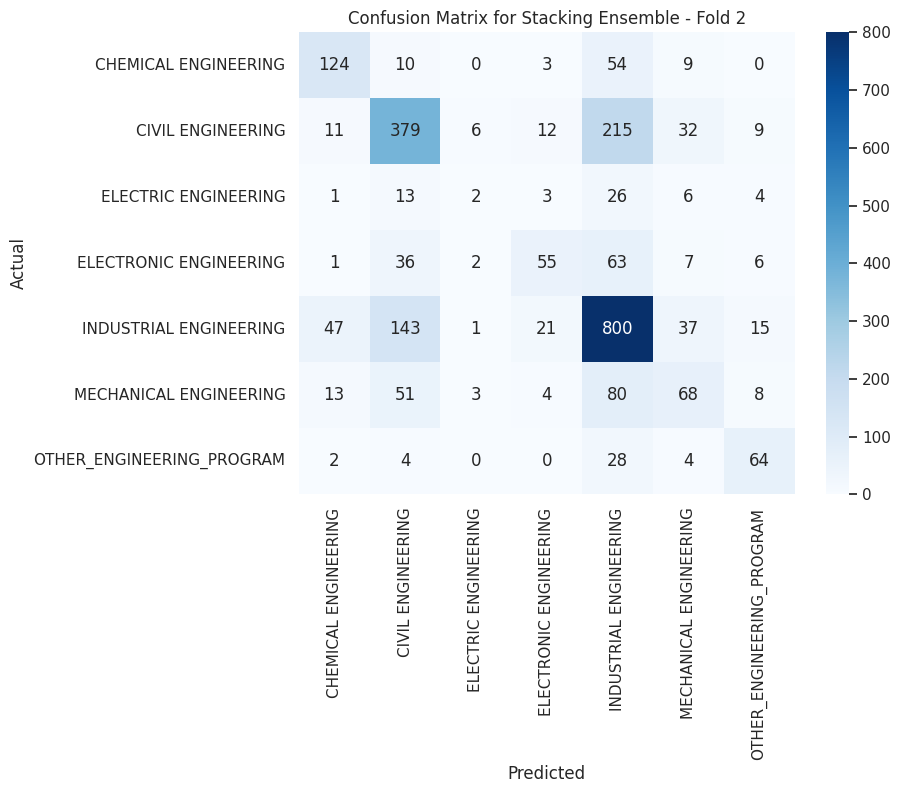

Sample Predictions for Fold 2:
                      Actual               Predicted
0     INDUSTRIAL ENGINEERING  MECHANICAL ENGINEERING
1     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
2       ELECTRIC ENGINEERING  INDUSTRIAL ENGINEERING
3     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
4     INDUSTRIAL ENGINEERING       CIVIL ENGINEERING
5          CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6     MECHANICAL ENGINEERING  INDUSTRIAL ENGINEERING
7     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING


Fold 3:


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.1

Classification Report for Fold 3:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.643243  0.595000  0.618182   200.000000
CIVIL ENGINEERING           0.609250  0.575301  0.591789   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.617284  0.295858  0.400000   169.000000
INDUSTRIAL ENGINEERING      0.618759  0.768797  0.685666  1064.000000
MECHANICAL ENGINEERING      0.475177  0.295154  0.364130   227.000000
OTHER_ENGINEERING_PROGRAM   0.547619  0.676471  0.605263   102.000000
accuracy                    0.606366  0.606366  0.606366     0.606366
macro avg                   0.501619  0.458083  0.466433  2482.000000
weighted avg                0.588072  0.606366  0.587481  2482.000000


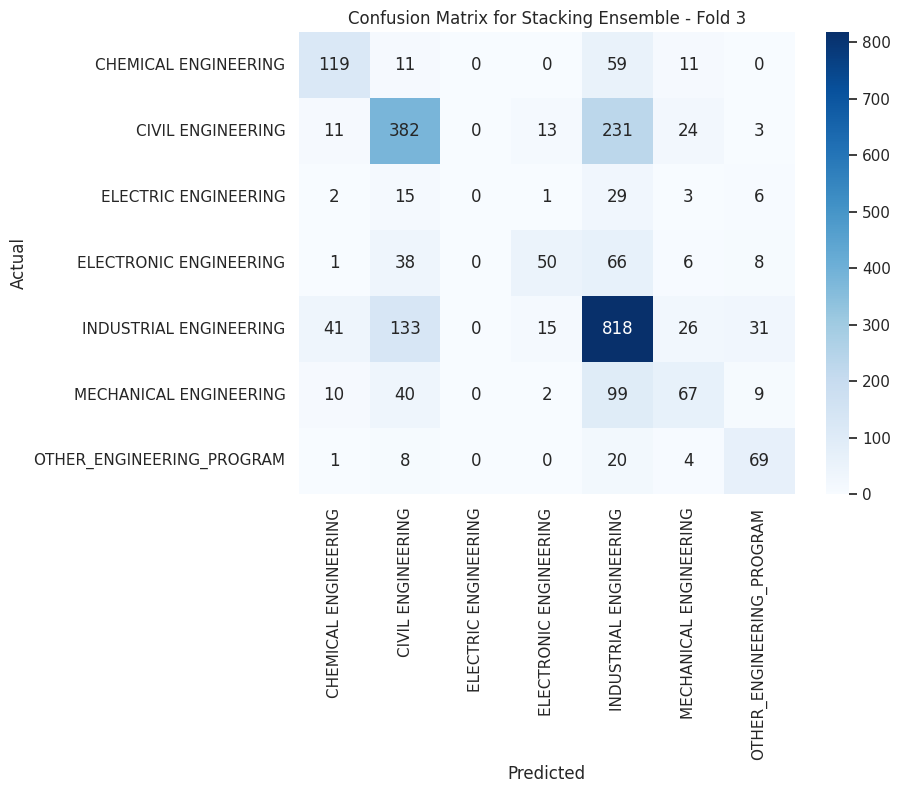

Sample Predictions for Fold 3:
                      Actual               Predicted
0     ELECTRONIC ENGINEERING  INDUSTRIAL ENGINEERING
1          CIVIL ENGINEERING  MECHANICAL ENGINEERING
2     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3     ELECTRONIC ENGINEERING  ELECTRONIC ENGINEERING
4     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
5     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
6     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  OTHER_ENGINEERING_PROGRAM  INDUSTRIAL ENGINEERING
8     INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
9     MECHANICAL ENGINEERING  MECHANICAL ENGINEERING


Fold 4:


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


In [ ]:
# Separate features (X) and target (y)
X = extracted_data_2.drop(columns=['ACADEMIC_PROGRAM'])
y = extracted_data_2['ACADEMIC_PROGRAM']

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Apply OneHotEncoding to categorical columns with handle_unknown='ignore' and sparse_output=False
column_transformer = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)],
    remainder='passthrough'
)

# Calculate class weights
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y), y=y)
class_weights_dict = {cls: weight for cls, weight in zip(np.unique(y), class_weights)}

# Define base models with pipelines
catboost_pipeline = make_pipeline(
    column_transformer,
    CatBoostClassifier(
        verbose=0,
        early_stopping_rounds=50,
        class_weights=class_weights
    )
)

adaboost_pipeline = make_pipeline(
    column_transformer,
    AdaBoostClassifier()
)

# Define the meta-classifier
meta_classifier = LogisticRegression()

# Create the stacking ensemble
stacking_ensemble = StackingClassifier(
    estimators=[
        ('catboost', catboost_pipeline),
        ('adaboost', adaboost_pipeline)
    ],
    final_estimator=meta_classifier,
    cv=5  # You can adjust the number of folds for cross-validation within stacking
)

# Stratified K-Fold cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Initialize lists to store the performance metrics for each fold
all_reports = []
all_confusion_matrices = []

fold = 1
for train_index, test_index in skf.split(X, y):
    print(f"Fold {fold}:")

    # Split the data into training and testing sets for the current fold
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Train the stacking ensemble
    stacking_ensemble.fit(X_train, y_train)

    # Make predictions
    y_pred = stacking_ensemble.predict(X_test)

    # Calculate the confusion matrix for the current fold
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=np.unique(y))
    all_confusion_matrices.append(confusion_matrix_total)

    # Calculate and store the classification report for the current fold
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    all_reports.append(avg_report)

    print(f"Classification Report for Fold {fold}:")
    print(avg_report)

    # Plot the confusion matrix for the current fold
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=np.unique(y), yticklabels=np.unique(y))
    plt.title(f"Confusion Matrix for Stacking Ensemble - Fold {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Display a sample of actual vs predicted values
    actual_values = y_test.values.flatten()
    predicted_values = y_pred.flatten()

    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for Fold {fold}:')
    print(sample_predictions)
    print("\n")

    fold += 1

# Aggregate Results Across All Folds
print("--- Overall Performance ---")
avg_report_across_folds = pd.concat(all_reports).groupby(level=0).mean()
print(avg_report_across_folds)

# Averaged Confusion Matrix
mean_confusion_matrix = np.mean(all_confusion_matrices, axis=0)
plt.figure(figsize=(8, 6))
sns.heatmap(mean_confusion_matrix, annot=True, fmt="g", cmap="Blues",
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.title("Averaged Confusion Matrix for Stacking Ensemble")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
 

Classification Report for Logistic Regression:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.630137  0.460000  0.531792   200.000000
CIVIL ENGINEERING           0.552632  0.506024  0.528302   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.295455  0.076471  0.121495   170.000000
INDUSTRIAL ENGINEERING      0.548510  0.812970  0.655055  1064.000000
MECHANICAL ENGINEERING      0.365385  0.083700  0.136201   227.000000
OTHER_ENGINEERING_PROGRAM   0.375000  0.205882  0.265823   102.000000
accuracy                    0.542086  0.542086  0.542086     0.542086
macro avg                   0.395303  0.306435  0.319810  2483.000000
weighted avg                0.502621  0.542086  0.496502  2483.000000


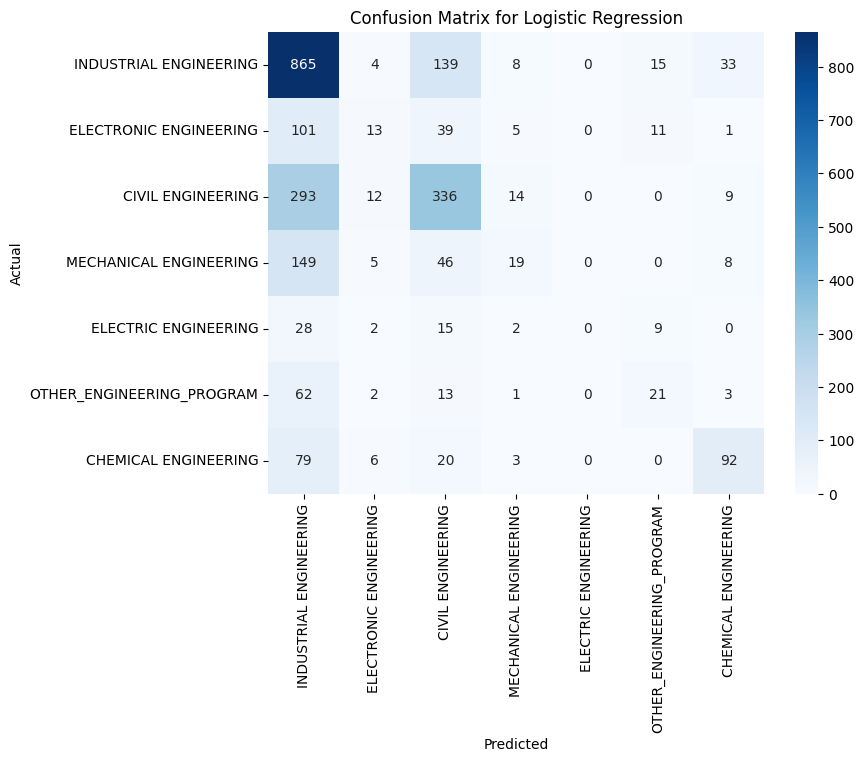

Sample Predictions for Logistic Regression:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING       CIVIL ENGINEERING
Classification Report for AdaBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.307692  0.020000  0.037559   200.000000
CIVIL ENGINEERING           0.360759  0.085843  0.138686   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERI

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


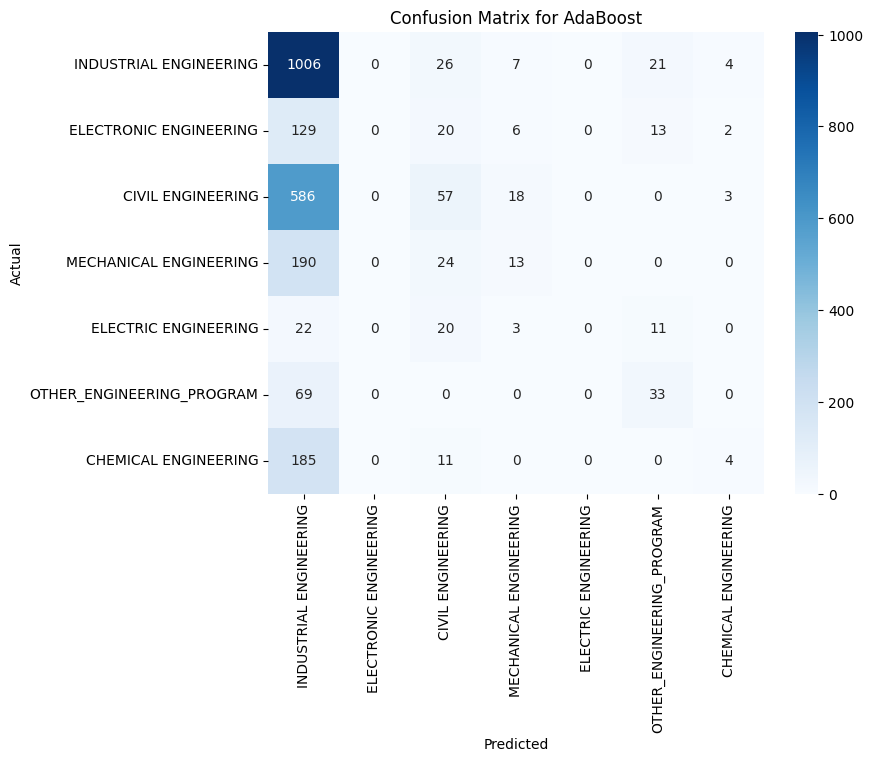

Sample Predictions for AdaBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
Classification Report for CatBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.571429  0.660000  0.612529   200.000000
CIVIL ENGINEERING           0.583450  0.626506  0.604212   664.000000
ELECTRIC ENGINEERING        0.444444  0.071429  0.123077    56.000000
ELECTRONIC ENGINEERING      0.600000  0.229412  0.331915   170.000000
INDUSTRIAL ENGINEERING      0.6

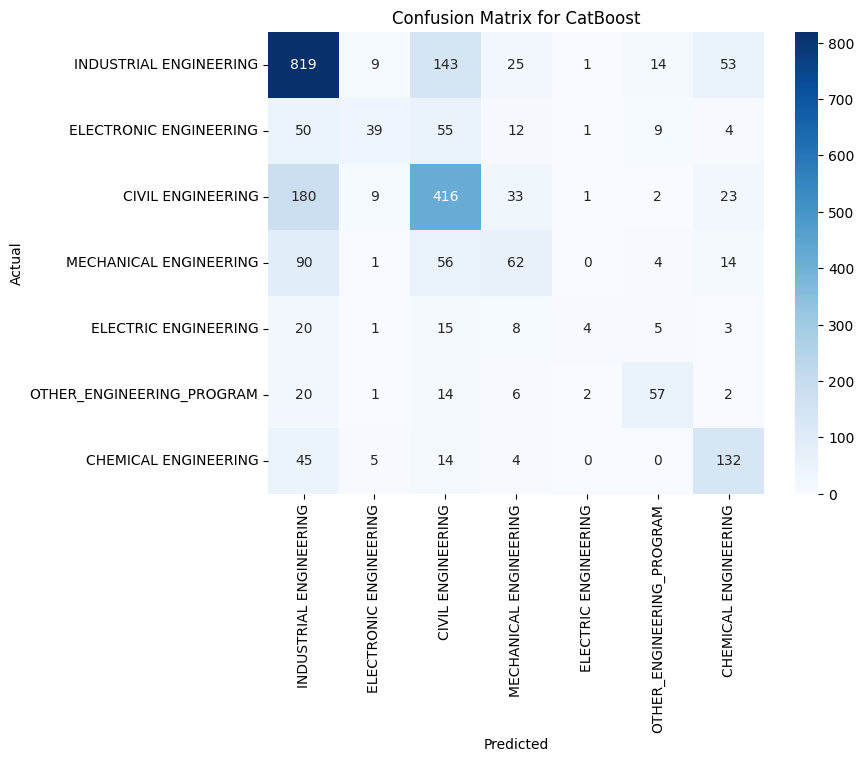

Sample Predictions for CatBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


In [ ]:
# Separate features (X) and target (y) using the new data 'extra'
X = extra.drop(columns=['ACADEMIC_PROGRAM'])  # Features from 'extra' dataset
y = extra['ACADEMIC_PROGRAM']  # Target from 'extra' dataset

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Convert categorical columns to a list (for use in CatBoost)
categorical_columns_list = categorical_columns.tolist()

# Apply OneHotEncoding to categorical columns with handle_unknown='ignore', sparse_output=False for Logistic Regression and AdaBoost
column_transformer = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)],
    remainder='passthrough'
)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Logistic Regression pipeline
logreg_model = make_pipeline(column_transformer, LogisticRegression(max_iter=500))

# Train the Logistic Regression model
logreg_model.fit(X_train, y_train)

# AdaBoost Classifier pipeline
adaboost_model = make_pipeline(column_transformer, AdaBoostClassifier(n_estimators=100))

# Train the AdaBoost Classifier
adaboost_model.fit(X_train, y_train)

# CatBoost Classifier (CatBoost handles categorical features directly)
# Pass the list of categorical columns to the 'cat_features' parameter
catboost_model = CatBoostClassifier(iterations=500, cat_features=categorical_columns_list, verbose=0)

# Train CatBoost without OneHotEncoding (CatBoost handles categorical features directly)
catboost_model.fit(X_train, y_train)

# Make predictions for each model
y_pred_logreg = logreg_model.predict(X_test)
y_pred_adaboost = adaboost_model.predict(X_test)
y_pred_catboost = catboost_model.predict(X_test)

# Function to evaluate and display model performance
def evaluate_model(y_test, y_pred, model_name):
    # Confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Display a sample of actual vs predicted values
    actual_values = y_test.values.flatten()  # Ensure it's 1D
    predicted_values = y_pred.flatten()  # Ensure predictions are 1D
    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for {model_name}:')
    print(sample_predictions)

# Evaluate Logistic Regression
evaluate_model(y_test, y_pred_logreg, "Logistic Regression")

# Evaluate AdaBoost
evaluate_model(y_test, y_pred_adaboost, "AdaBoost")

# Evaluate CatBoost
evaluate_model(y_test, y_pred_catboost, "CatBoost")


*Extraction 3*

In [ ]:
# Create the 'average mark' column
data['AVG_MARK_FUTURE'] = data[['FEP_PRO', 'WC_PRO', 'CC_PRO', 'QR_PRO', 'ENG_PRO','CR_PRO']].mean(axis=1)

# View the updated DataFrame
data.head()

,COD_S11,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,Unnamed: 9,...,ENG_PRO,WC_PRO,FEP_PRO,G_SC,PERCENTILE,2ND_DECILE,QUARTILE,SEL,SEL_IHE,AVG_MARK_FUTURE
0,SB11201210000129,F,Incomplete Professional Education,Complete technique or technology,Technical or professional level employee,Home,Stratum 4,It is not classified by the SISBEN,Three,NaN,...,93,79,181,180,91,5,4,2,2,98.000000
1,SB11201210000137,F,Complete Secundary,Complete professional education,Entrepreneur,Independent professional,Stratum 5,It is not classified by the SISBEN,Three,NaN,...,98,78,201,182,92,5,4,4,4,99.666667
2,SB11201210005154,M,Not sure,Not sure,Independent,Home,Stratum 2,Level 2,Five,NaN,...,43,22,113,113,7,1,1,1,1,35.666667
3,SB11201210007504,F,Not sure,Not sure,Other occupation,Independent,Stratum 2,It is not classified by the SISBEN,Three,NaN,...,80,48,137,157,67,4,3,2,2,73.500000
4,SB11201210007548,M,Complete professional education,Complete professional education,Executive,Home,Stratum 4,It is not classified by the SISBEN,One,NaN,...,100,71,189,198,98,5,4,4,2,107.666667


In [ ]:
# Create the 'average mark' column
data['AVG_MARK'] = data[['MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11']].mean(axis=1)

# View the updated DataFrame
data.head()

,COD_S11,GENDER,EDU_FATHER,EDU_MOTHER,OCC_FATHER,OCC_MOTHER,STRATUM,SISBEN,PEOPLE_HOUSE,Unnamed: 9,...,WC_PRO,FEP_PRO,G_SC,PERCENTILE,2ND_DECILE,QUARTILE,SEL,SEL_IHE,AVG_MARK_FUTURE,AVG_MARK
0,SB11201210000129,F,Incomplete Professional Education,Complete technique or technology,Technical or professional level employee,Home,Stratum 4,It is not classified by the SISBEN,Three,NaN,...,79,181,180,91,5,4,2,2,98.000000,76.2
1,SB11201210000137,F,Complete Secundary,Complete professional education,Entrepreneur,Independent professional,Stratum 5,It is not classified by the SISBEN,Three,NaN,...,78,201,182,92,5,4,4,4,99.666667,82.4
2,SB11201210005154,M,Not sure,Not sure,Independent,Home,Stratum 2,Level 2,Five,NaN,...,22,113,113,7,1,1,1,1,35.666667,45.4
3,SB11201210007504,F,Not sure,Not sure,Other occupation,Independent,Stratum 2,It is not classified by the SISBEN,Three,NaN,...,48,137,157,67,4,3,2,2,73.500000,59.8
4,SB11201210007548,M,Complete professional education,Complete professional education,Executive,Home,Stratum 4,It is not classified by the SISBEN,One,NaN,...,71,189,198,98,5,4,4,2,107.666667,79.6


In [ ]:
# Extracting specific columns from the DataFrame 'data'
extra = ['ACADEMIC_PROGRAM', 'GENDER', 'JOB', 'SCHOOL_TYPE', 'MAT_S11', 'CR_S11', 'CC_S11', 'BIO_S11', 'ENG_S11','SCHOOL_NAT','SCHOOL_NAME','UNIVERSITY','G_SC','AVG_MARK_FUTURE','AVG_MARK']
extra = data[extra]

# Display the extracted DataFrame
print(extra)


               ACADEMIC_PROGRAM GENDER                             JOB  \
0        INDUSTRIAL ENGINEERING      F                              No   
1        INDUSTRIAL ENGINEERING      F                              No   
2        ELECTRONIC ENGINEERING      M  Yes, 20 hours or more per week   
3        INDUSTRIAL ENGINEERING      F                              No   
4        INDUSTRIAL ENGINEERING      M                              No   
...                         ...    ...                             ...   
12406  MECHATRONICS ENGINEERING      M                              No   
12407    INDUSTRIAL ENGINEERING      M                              No   
12408    INDUSTRIAL ENGINEERING      M                              No   
12409         CIVIL ENGINEERING      F                              No   
12410    INDUSTRIAL ENGINEERING      M                              No   

      SCHOOL_TYPE  MAT_S11  CR_S11  CC_S11  BIO_S11  ENG_S11 SCHOOL_NAT  \
0        ACADEMIC       71      81  

In [ ]:
# Define the list of programs to be renamed
programs_to_rename = [
    'MECHATRONICS ENGINEERING', 'CATASTRAL ENGINEERING AND GEODESY', 'PRODUCTION ENGINEERING',
    'ELECTRIC ENGINEERING AND TELECOMMUNICATIONS', 'AERONAUTICAL ENGINEERING', 'TOPOGRAPHIC ENGINEERY',
    'ELECTROMECHANICAL ENGINEERING', 'PRODUCTIVITY AND QUALITY ENGINEERING',
    'TRANSPORTATION AND ROAD ENGINEERING', 'INDUSTRIAL AUTOMATIC ENGINEERING', 'CONTROL ENGINEERING',
    'CIVIL CONSTRUCTIONS', 'AUTOMATION ENGINEERING', 'TEXTILE ENGINEERING',
    'INDUSTRIAL CONTROL AND AUTOMATION ENGINEERING'
]

# Modify the 'ACADEMIC_PROGRAM' column in the 'extra' DataFrame
extra.loc[extra['ACADEMIC_PROGRAM'].isin(programs_to_rename), 'ACADEMIC_PROGRAM'] = 'OTHER_ENGINEERING_PROGRAM'

# Display the updated DataFrame
print(extra)


                ACADEMIC_PROGRAM GENDER                             JOB  \
0         INDUSTRIAL ENGINEERING      F                              No   
1         INDUSTRIAL ENGINEERING      F                              No   
2         ELECTRONIC ENGINEERING      M  Yes, 20 hours or more per week   
3         INDUSTRIAL ENGINEERING      F                              No   
4         INDUSTRIAL ENGINEERING      M                              No   
...                          ...    ...                             ...   
12406  OTHER_ENGINEERING_PROGRAM      M                              No   
12407     INDUSTRIAL ENGINEERING      M                              No   
12408     INDUSTRIAL ENGINEERING      M                              No   
12409          CIVIL ENGINEERING      F                              No   
12410     INDUSTRIAL ENGINEERING      M                              No   

      SCHOOL_TYPE  MAT_S11  CR_S11  CC_S11  BIO_S11  ENG_S11 SCHOOL_NAT  \
0        ACADEMIC       

In [ ]:
extra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12411 entries, 0 to 12410
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ACADEMIC_PROGRAM  12411 non-null  object 
 1   GENDER            12411 non-null  object 
 2   JOB               12411 non-null  object 
 3   SCHOOL_TYPE       12411 non-null  object 
 4   MAT_S11           12411 non-null  int64  
 5   CR_S11            12411 non-null  int64  
 6   CC_S11            12411 non-null  int64  
 7   BIO_S11           12411 non-null  int64  
 8   ENG_S11           12411 non-null  int64  
 9   SCHOOL_NAT        12411 non-null  object 
 10  SCHOOL_NAME       12411 non-null  object 
 11  UNIVERSITY        12411 non-null  object 
 12  G_SC              12411 non-null  int64  
 13  AVG_MARK_FUTURE   12411 non-null  float64
 14  AVG_MARK          12411 non-null  float64
dtypes: float64(2), int64(6), object(7)
memory usage: 1.4+ MB


In [ ]:
!pip install catboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 9.0 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
 

Classification Report for Logistic Regression:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.630137  0.460000  0.531792   200.000000
CIVIL ENGINEERING           0.552632  0.506024  0.528302   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.295455  0.076471  0.121495   170.000000
INDUSTRIAL ENGINEERING      0.548510  0.812970  0.655055  1064.000000
MECHANICAL ENGINEERING      0.365385  0.083700  0.136201   227.000000
OTHER_ENGINEERING_PROGRAM   0.375000  0.205882  0.265823   102.000000
accuracy                    0.542086  0.542086  0.542086     0.542086
macro avg                   0.395303  0.306435  0.319810  2483.000000
weighted avg                0.502621  0.542086  0.496502  2483.000000


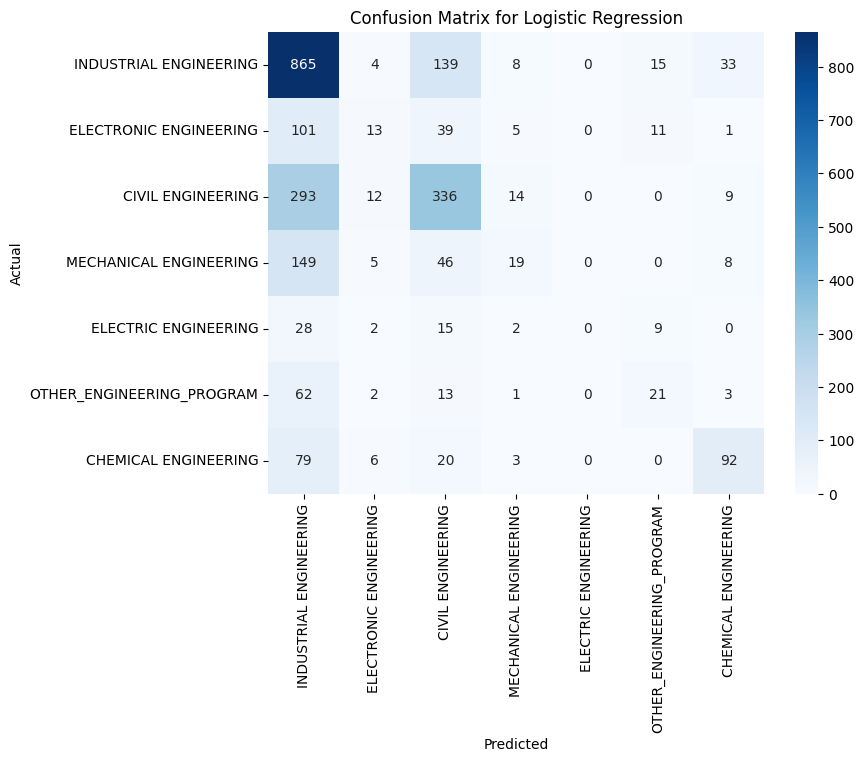

Sample Predictions for Logistic Regression:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING       CIVIL ENGINEERING
Classification Report for AdaBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.307692  0.020000  0.037559   200.000000
CIVIL ENGINEERING           0.360759  0.085843  0.138686   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERI

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


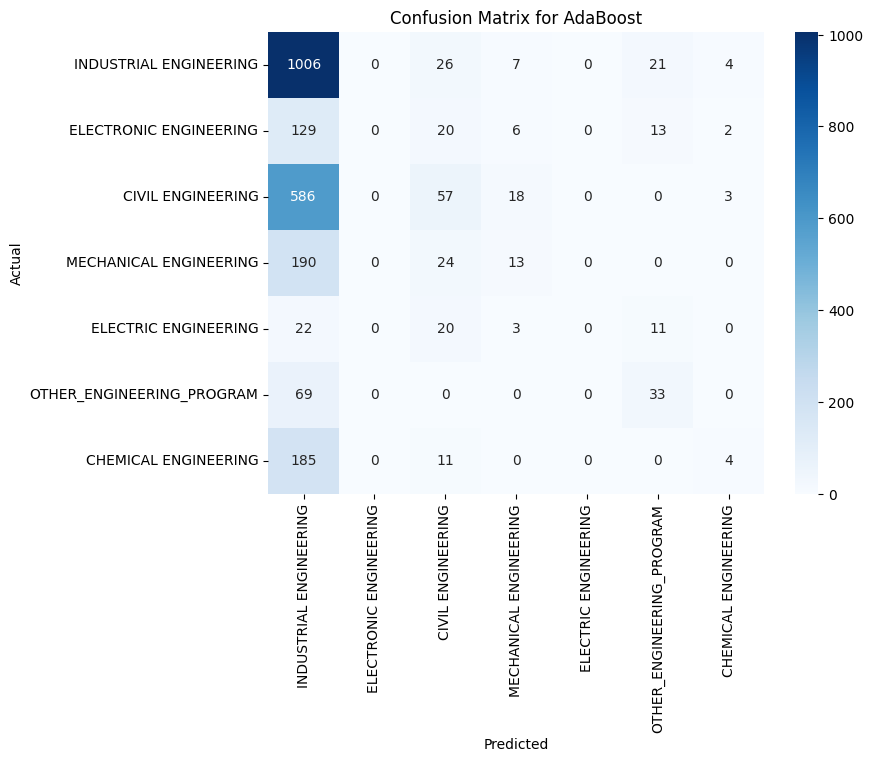

Sample Predictions for AdaBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
Classification Report for CatBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.571429  0.660000  0.612529   200.000000
CIVIL ENGINEERING           0.583450  0.626506  0.604212   664.000000
ELECTRIC ENGINEERING        0.444444  0.071429  0.123077    56.000000
ELECTRONIC ENGINEERING      0.600000  0.229412  0.331915   170.000000
INDUSTRIAL ENGINEERING      0.6

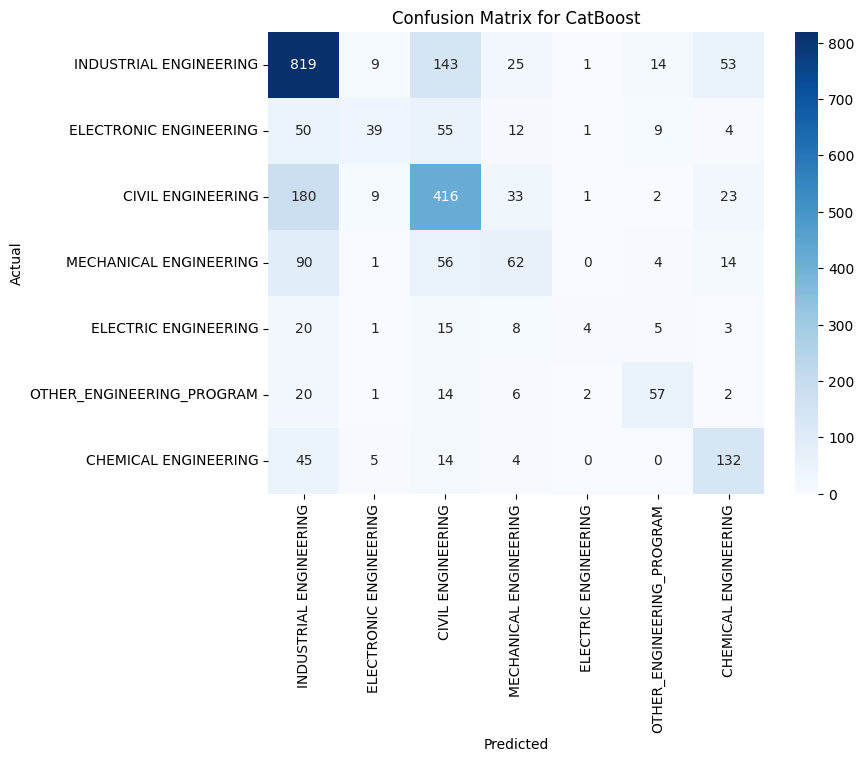

Sample Predictions for CatBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


In [ ]:
# Separate features (X) and target (y) using the new data 'extra'
X = extra.drop(columns=['ACADEMIC_PROGRAM'])  # Features from 'extra' dataset
y = extra['ACADEMIC_PROGRAM']  # Target from 'extra' dataset

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Convert categorical columns to a list (for use in CatBoost)
categorical_columns_list = categorical_columns.tolist()

# Apply OneHotEncoding to categorical columns with handle_unknown='ignore', sparse_output=False for Logistic Regression and AdaBoost
column_transformer = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)],
    remainder='passthrough'
)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Logistic Regression pipeline
logreg_model = make_pipeline(column_transformer, LogisticRegression(max_iter=500))

# Train the Logistic Regression model
logreg_model.fit(X_train, y_train)

# AdaBoost Classifier pipeline
adaboost_model = make_pipeline(column_transformer, AdaBoostClassifier(n_estimators=100))

# Train the AdaBoost Classifier
adaboost_model.fit(X_train, y_train)

# CatBoost Classifier (CatBoost handles categorical features directly)
# Pass the list of categorical columns to the 'cat_features' parameter
catboost_model = CatBoostClassifier(iterations=500, cat_features=categorical_columns_list, verbose=0)

# Train CatBoost without OneHotEncoding (CatBoost handles categorical features directly)
catboost_model.fit(X_train, y_train)

# Make predictions for each model
y_pred_logreg = logreg_model.predict(X_test)
y_pred_adaboost = adaboost_model.predict(X_test)
y_pred_catboost = catboost_model.predict(X_test)

# Function to evaluate and display model performance
def evaluate_model(y_test, y_pred, model_name):
    # Confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Display a sample of actual vs predicted values
    actual_values = y_test.values.flatten()  # Ensure it's 1D
    predicted_values = y_pred.flatten()  # Ensure predictions are 1D
    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for {model_name}:')
    print(sample_predictions)

# Evaluate Logistic Regression
evaluate_model(y_test, y_pred_logreg, "Logistic Regression")

# Evaluate AdaBoost
evaluate_model(y_test, y_pred_adaboost, "AdaBoost")

# Evaluate CatBoost
evaluate_model(y_test, y_pred_catboost, "CatBoost")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
 

Classification Report for Logistic Regression:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.648148  0.350000  0.454545   200.000000
CIVIL ENGINEERING           0.536713  0.462349  0.496764   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.181818  0.082353  0.113360   170.000000
INDUSTRIAL ENGINEERING      0.539387  0.843045  0.657866  1064.000000
MECHANICAL ENGINEERING      0.314286  0.048458  0.083969   227.000000
OTHER_ENGINEERING_PROGRAM   0.321429  0.088235  0.138462   102.000000
accuracy                    0.526782  0.526782  0.526782     0.526782
macro avg                   0.363112  0.267777  0.277852  2483.000000
weighted avg                0.481253  0.526782  0.472487  2483.000000


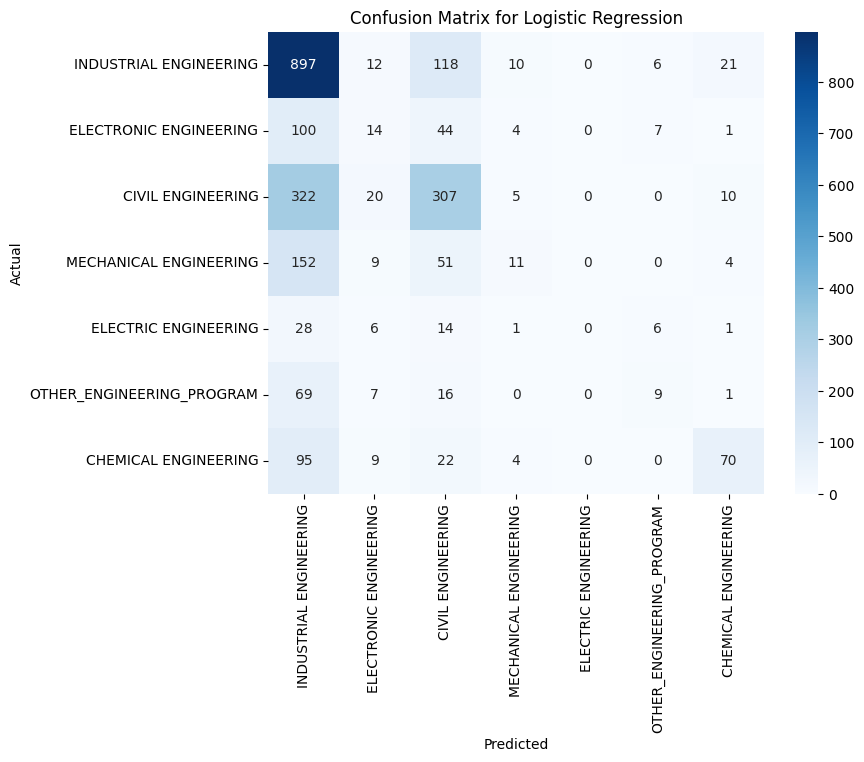

Sample Predictions for Logistic Regression:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
Classification Report for AdaBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.307692  0.020000  0.037559   200.000000
CIVIL ENGINEERING           0.360759  0.085843  0.138686   664.000000
ELECTRIC ENGINEERING        0.000000  0.000000  0.000000    56.000000
ELECTRONIC ENGINEERING      0.000000  0.000000  0.000000   170.000000
INDUSTRIAL ENGINEERI

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


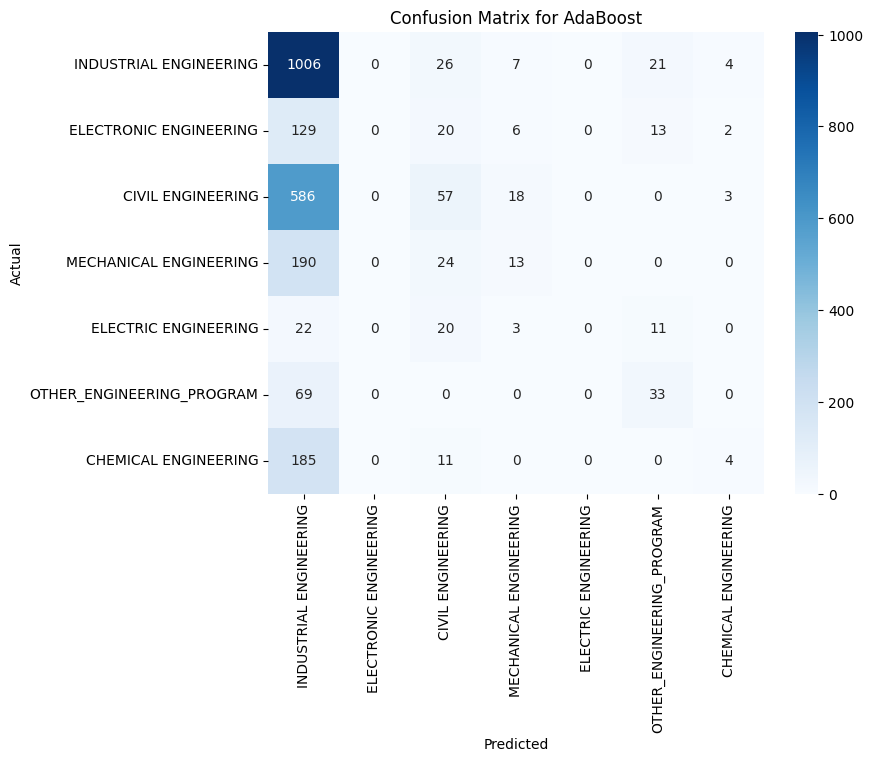

Sample Predictions for AdaBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
Classification Report for Gradient Boosting:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.613208  0.650000  0.631068   200.000000
CIVIL ENGINEERING           0.665298  0.487952  0.562989   664.000000
ELECTRIC ENGINEERING        0.125000  0.035714  0.055556    56.000000
ELECTRONIC ENGINEERING      0.725490  0.217647  0.334842   170.000000
INDUSTRIAL ENGINEERING

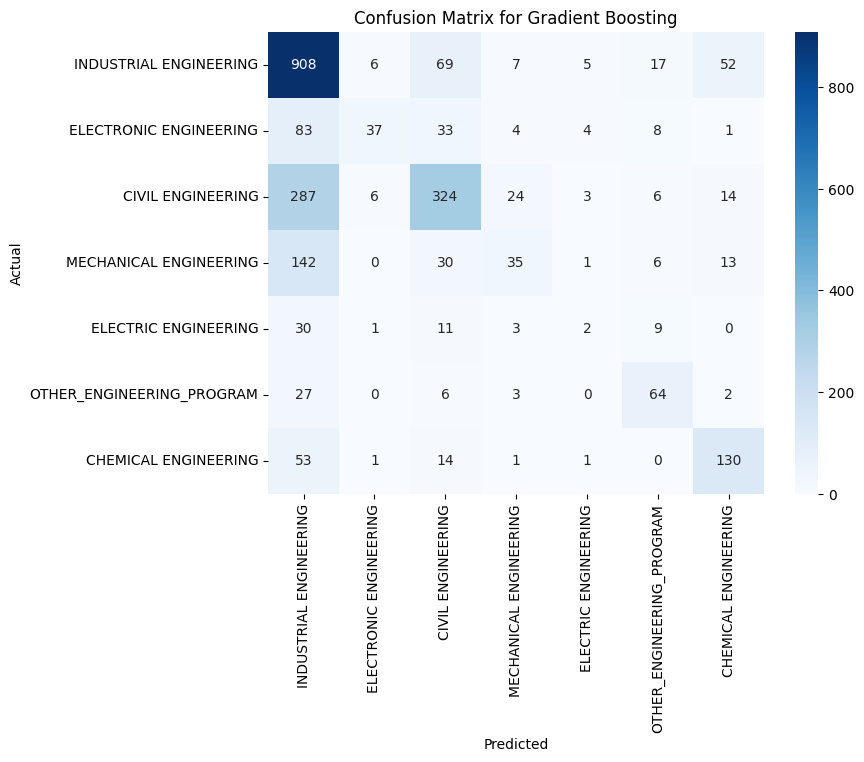

Sample Predictions for Gradient Boosting:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING
Classification Report for CatBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.559829  0.655000  0.603687   200.000000
CIVIL ENGINEERING           0.604262  0.597892  0.601060   664.000000
ELECTRIC ENGINEERING        0.307692  0.071429  0.115942    56.000000
ELECTRONIC ENGINEERING      0.500000  0.217647  0.303279   170.000000
INDUSTRIAL ENGINEERING

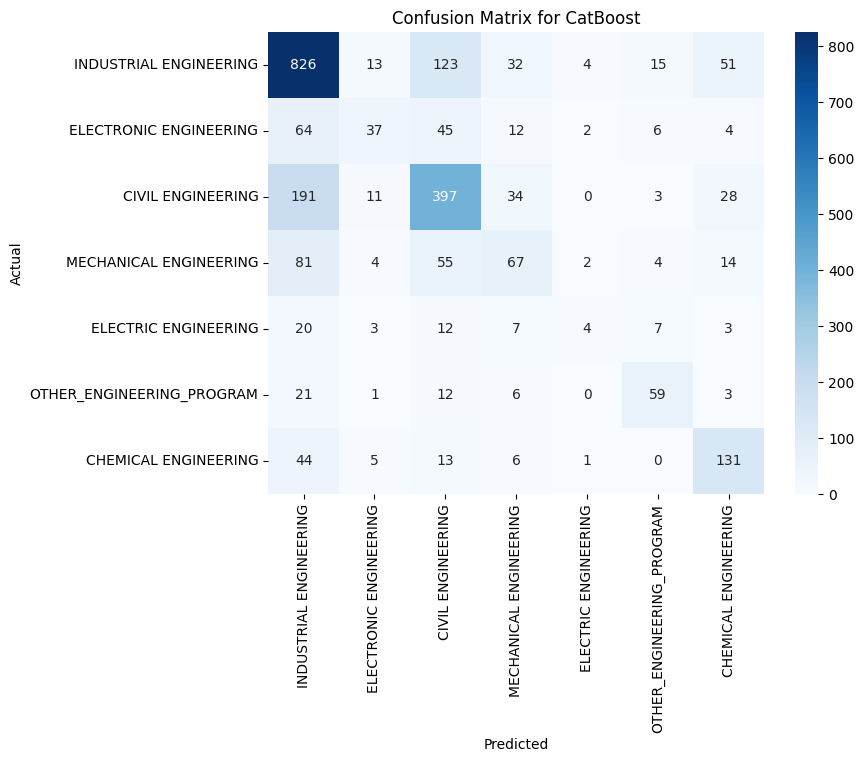

Sample Predictions for CatBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


In [ ]:

# Separate features (X) and target (y) using the new data 'extra'
X = extra.drop(columns=['ACADEMIC_PROGRAM'])  # Features from 'extra' dataset
y = extra['ACADEMIC_PROGRAM']  # Target from 'extra' dataset

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Convert categorical columns to a list (for use in CatBoost)
categorical_columns_list = categorical_columns.tolist()

# Apply OneHotEncoding to categorical columns with handle_unknown='ignore', sparse_output=False for Logistic Regression, AdaBoost, and Gradient Boosting
column_transformer = ColumnTransformer(
    transformers=[('cat', OneHotEncoder(handle_unknown='ignore', sparse_output=False), categorical_columns)],
    remainder='passthrough'
)

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Logistic Regression pipeline
logreg_model = make_pipeline(column_transformer, LogisticRegression(max_iter=500))

# AdaBoost Classifier pipeline
adaboost_model = make_pipeline(column_transformer, AdaBoostClassifier(n_estimators=100))

# Gradient Boosting pipeline
gradientboost_model = make_pipeline(column_transformer, GradientBoostingClassifier(n_estimators=100))

# CatBoost Classifier (CatBoost handles categorical features directly)
catboost_model = CatBoostClassifier(iterations=500, cat_features=categorical_columns_list, verbose=0)

# Train the models
logreg_model.fit(X_train, y_train)
adaboost_model.fit(X_train, y_train)
gradientboost_model.fit(X_train, y_train)
catboost_model.fit(X_train, y_train)

# Make predictions for each model
y_pred_logreg = logreg_model.predict(X_test)
y_pred_adaboost = adaboost_model.predict(X_test)
y_pred_gradientboost = gradientboost_model.predict(X_test)
y_pred_catboost = catboost_model.predict(X_test)

# Function to evaluate and display model performance
def evaluate_model(y_test, y_pred, model_name):
    # Confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Display a sample of actual vs predicted values
    actual_values = y_test.values.flatten()  # Ensure it's 1D
    predicted_values = y_pred.flatten()  # Ensure predictions are 1D
    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for {model_name}:')
    print(sample_predictions)

# Evaluate Logistic Regression
evaluate_model(y_test, y_pred_logreg, "Logistic Regression")

# Evaluate AdaBoost
evaluate_model(y_test, y_pred_adaboost, "AdaBoost")

# Evaluate Gradient Boosting
evaluate_model(y_test, y_pred_gradientboost, "Gradient Boosting")

# Evaluate CatBoost
evaluate_model(y_test, y_pred_catboost, "CatBoost")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
 

Model Performance Comparison:
                 Model  Accuracy  Precision    Recall  F1-Score
0  Logistic Regression  0.526782   0.481253  0.526782  0.472487
1             AdaBoost  0.448248   0.361037  0.448248  0.329051
2    Gradient Boosting  0.601692   0.597945  0.601692  0.568539
3             CatBoost  0.612565   0.594832  0.612565  0.595121


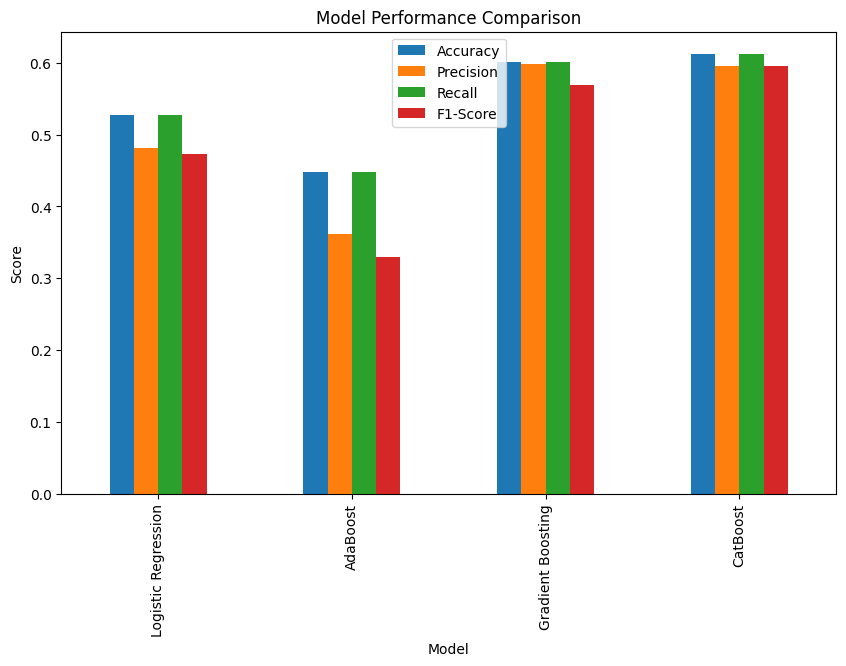

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
import pandas as pd

# Function to evaluate and return a dictionary of metrics
def get_model_metrics(y_test, y_pred, model_name):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    }

# Train the models (if not already trained)
logreg_model.fit(X_train, y_train)
adaboost_model.fit(X_train, y_train)
gradientboost_model.fit(X_train, y_train)
catboost_model.fit(X_train, y_train)

# Make predictions for each model
y_pred_logreg = logreg_model.predict(X_test)
y_pred_adaboost = adaboost_model.predict(X_test)
y_pred_gradientboost = gradientboost_model.predict(X_test)
y_pred_catboost = catboost_model.predict(X_test)

# Collect metrics for each model
logreg_metrics = get_model_metrics(y_test, y_pred_logreg, "Logistic Regression")
adaboost_metrics = get_model_metrics(y_test, y_pred_adaboost, "AdaBoost")
gradientboost_metrics = get_model_metrics(y_test, y_pred_gradientboost, "Gradient Boosting")
catboost_metrics = get_model_metrics(y_test, y_pred_catboost, "CatBoost")

# Create a DataFrame to store and display the metrics
metrics_df = pd.DataFrame([logreg_metrics, adaboost_metrics, gradientboost_metrics, catboost_metrics])

# Display the comparison of models based on metrics
print("Model Performance Comparison:")
print(metrics_df)

# Optionally, visualize the comparison using a bar plot
metrics_df.set_index('Model', inplace=True)
metrics_df.plot(kind='bar', figsize=(10, 6), title="Model Performance Comparison")
plt.ylabel("Score")
plt.show()


Classification Report for CatBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.559829  0.655000  0.603687   200.000000
CIVIL ENGINEERING           0.604262  0.597892  0.601060   664.000000
ELECTRIC ENGINEERING        0.307692  0.071429  0.115942    56.000000
ELECTRONIC ENGINEERING      0.500000  0.217647  0.303279   170.000000
INDUSTRIAL ENGINEERING      0.662390  0.776316  0.714842  1064.000000
MECHANICAL ENGINEERING      0.408537  0.295154  0.342711   227.000000
OTHER_ENGINEERING_PROGRAM   0.627660  0.578431  0.602041   102.000000
accuracy                    0.612565  0.612565  0.612565     0.612565
macro avg                   0.524338  0.455981  0.469080  2483.000000
weighted avg                0.594832  0.612565  0.595121  2483.000000


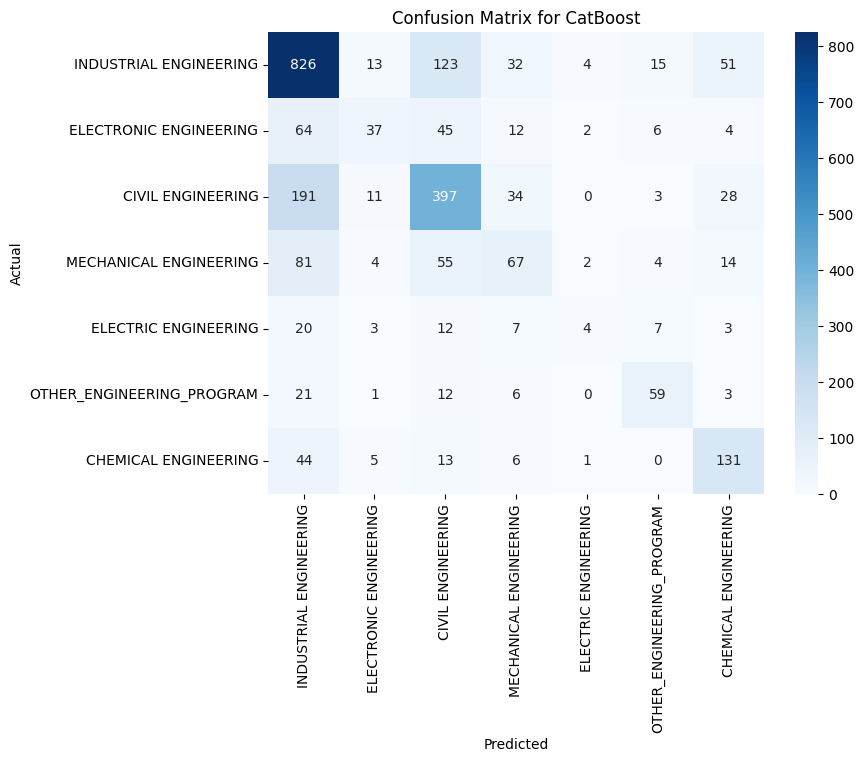

Sample Predictions for CatBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


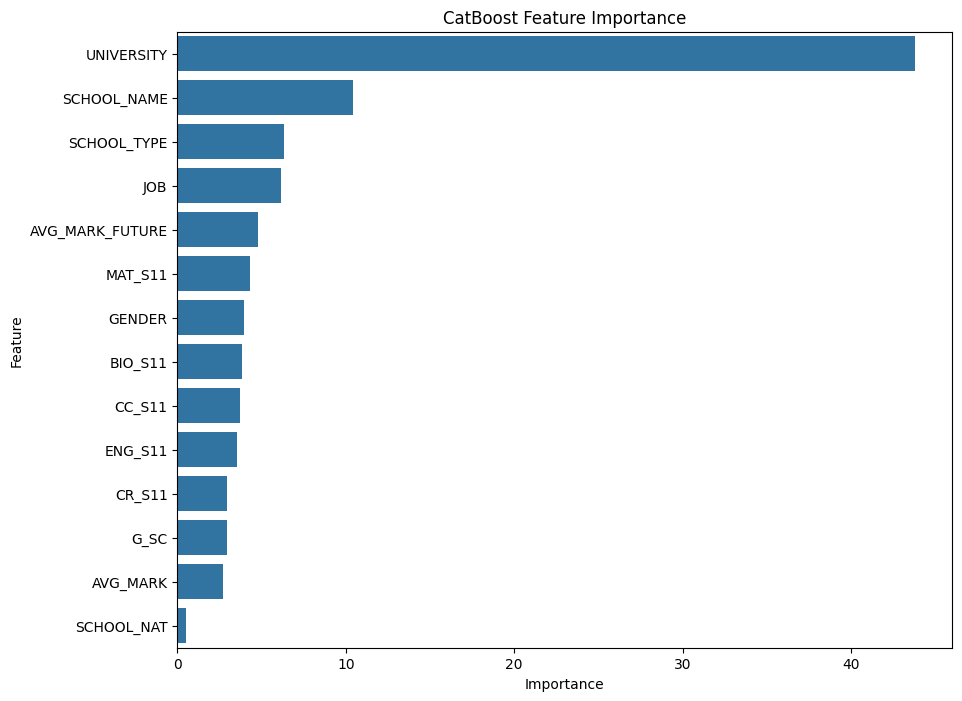

In [ ]:

# Separate features (X) and target (y) using the new data 'extra'
X = extra.drop(columns=['ACADEMIC_PROGRAM'])  # Features from 'extra' dataset
y = extra['ACADEMIC_PROGRAM']  # Target from 'extra' dataset

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Convert categorical columns to a list (for use in CatBoost)
categorical_columns_list = categorical_columns.tolist()

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# CatBoost Classifier (CatBoost handles categorical features directly)
catboost_model = CatBoostClassifier(iterations=500, cat_features=categorical_columns_list, verbose=0)

# Train the CatBoost model
catboost_model.fit(X_train, y_train)

# Make predictions with CatBoost
y_pred_catboost = catboost_model.predict(X_test)

# Function to evaluate and display model performance
def evaluate_model(y_test, y_pred, model_name):
    # Confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Display a sample of actual vs predicted values
    actual_values = y_test.values.flatten()  # Ensure it's 1D
    predicted_values = y_pred.flatten()  # Ensure predictions are 1D
    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for {model_name}:')
    print(sample_predictions)

# Evaluate CatBoost
evaluate_model(y_test, y_pred_catboost, "CatBoost")

# Get feature importance from the CatBoost model
feature_importances = catboost_model.get_feature_importance()

# Plot feature importance
feature_names = X.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('CatBoost Feature Importance')
plt.show()


In [ ]:
extra.drop('SCHOOL_NAT', axis=1, inplace=True)


<ipython-input-13-578f3df70338>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  extra.drop('SCHOOL_NAT', axis=1, inplace=True)


Classification Report for CatBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.582222  0.655000  0.616471   200.000000
CIVIL ENGINEERING           0.587554  0.611446  0.599262   664.000000
ELECTRIC ENGINEERING        0.363636  0.071429  0.119403    56.000000
ELECTRONIC ENGINEERING      0.535211  0.223529  0.315353   170.000000
INDUSTRIAL ENGINEERING      0.649518  0.759398  0.700173  1064.000000
MECHANICAL ENGINEERING      0.386207  0.246696  0.301075   227.000000
OTHER_ENGINEERING_PROGRAM   0.583333  0.549020  0.565657   102.000000
accuracy                    0.603705  0.603705  0.603705     0.603705
macro avg                   0.526812  0.445217  0.459628  2483.000000
weighted avg                0.586462  0.603705  0.584988  2483.000000


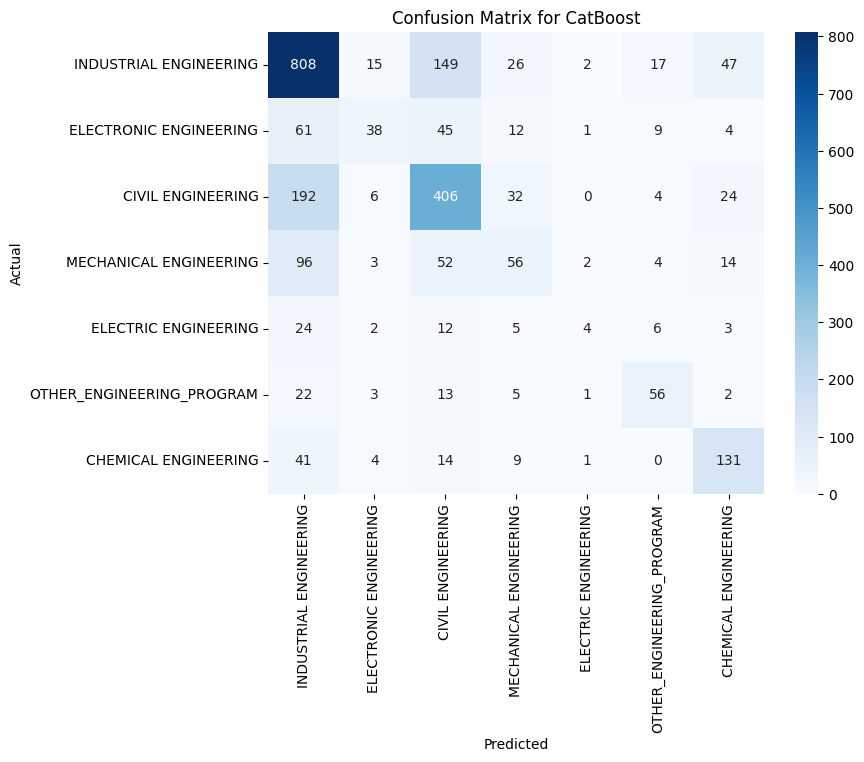

Sample Predictions for CatBoost:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING  INDUSTRIAL ENGINEERING


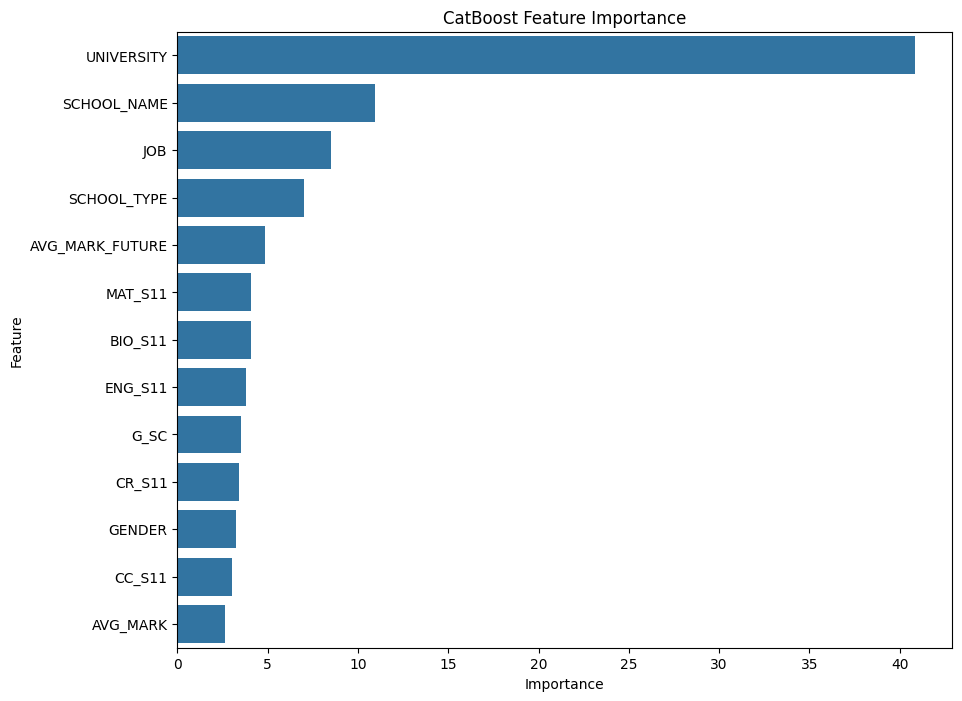

In [ ]:
#Without SCHOOL_NAT
# Separate features (X) and target (y) using the new data 'extra'
X = extra.drop(columns=['ACADEMIC_PROGRAM'])  # Features from 'extra' dataset
y = extra['ACADEMIC_PROGRAM']  # Target from 'extra' dataset

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Convert categorical columns to a list (for use in CatBoost)
categorical_columns_list = categorical_columns.tolist()

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# CatBoost Classifier (CatBoost handles categorical features directly)
catboost_model = CatBoostClassifier(iterations=500, cat_features=categorical_columns_list, verbose=0)

# Train the CatBoost model
catboost_model.fit(X_train, y_train)

# Make predictions with CatBoost
y_pred_catboost = catboost_model.predict(X_test)

# Function to evaluate and display model performance
def evaluate_model(y_test, y_pred, model_name):
    # Confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Display a sample of actual vs predicted values
    actual_values = y_test.values.flatten()  # Ensure it's 1D
    predicted_values = y_pred.flatten()  # Ensure predictions are 1D
    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for {model_name}:')
    print(sample_predictions)

# Evaluate CatBoost
evaluate_model(y_test, y_pred_catboost, "CatBoost")

# Get feature importance from the CatBoost model
feature_importances = catboost_model.get_feature_importance()

# Plot feature importance
feature_names = X.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('CatBoost Feature Importance')
plt.show()


Classification Report for Gradient Boosting:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.582524  0.600000  0.591133   200.000000
CIVIL ENGINEERING           0.591988  0.600904  0.596413   664.000000
ELECTRIC ENGINEERING        0.130435  0.053571  0.075949    56.000000
ELECTRONIC ENGINEERING      0.554054  0.241176  0.336066   170.000000
INDUSTRIAL ENGINEERING      0.652821  0.782895  0.711966  1064.000000
MECHANICAL ENGINEERING      0.451128  0.264317  0.333333   227.000000
OTHER_ENGINEERING_PROGRAM   0.639175  0.607843  0.623116   102.000000
accuracy                    0.611357  0.611357  0.611357     0.611357
macro avg                   0.514589  0.450101  0.466854  2483.000000
weighted avg                0.593348  0.611357  0.592986  2483.000000


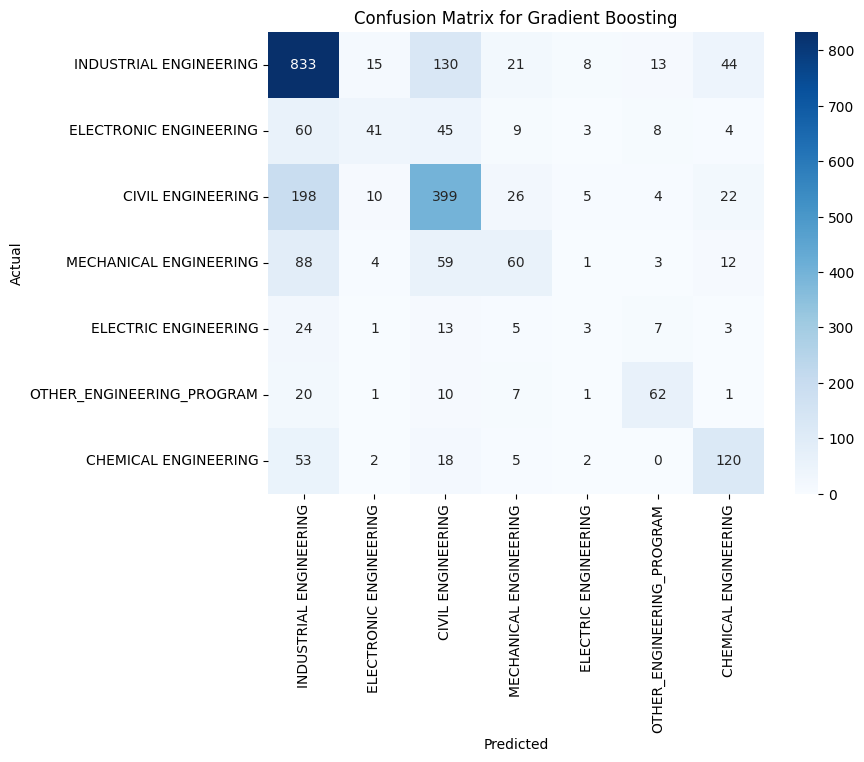

Sample Predictions for Gradient Boosting:
                   Actual               Predicted
0  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
1       CIVIL ENGINEERING       CIVIL ENGINEERING
2  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
3  MECHANICAL ENGINEERING       CIVIL ENGINEERING
4    CHEMICAL ENGINEERING       CIVIL ENGINEERING
5       CIVIL ENGINEERING       CIVIL ENGINEERING
6  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
7  INDUSTRIAL ENGINEERING  INDUSTRIAL ENGINEERING
8       CIVIL ENGINEERING       CIVIL ENGINEERING
9       CIVIL ENGINEERING       CIVIL ENGINEERING


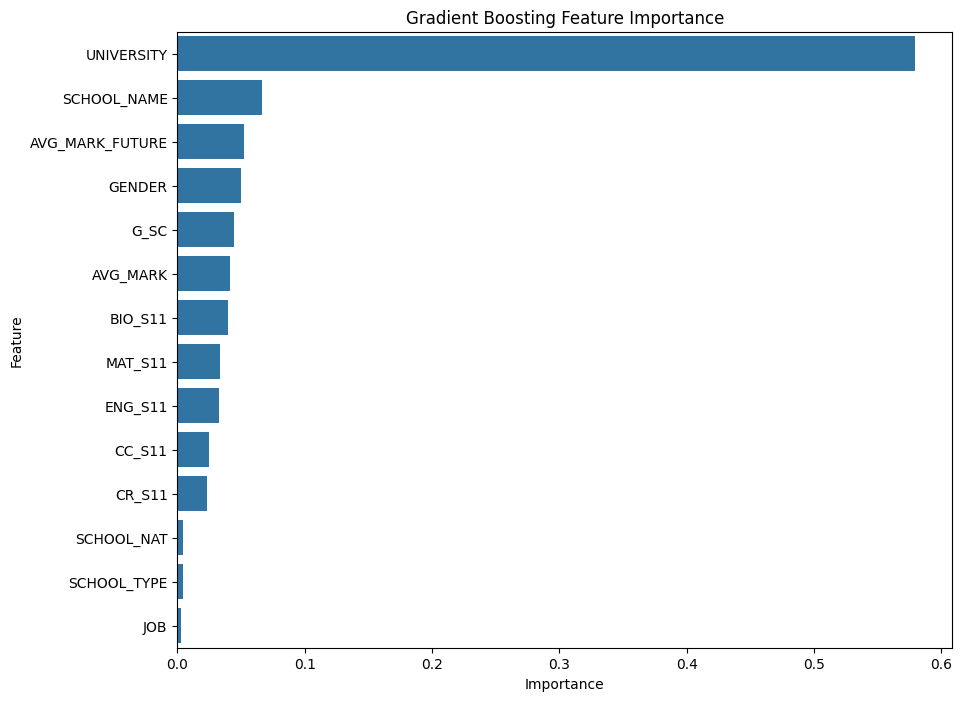

In [ ]:
#  define X and y from 'extra'
X = extra.drop(columns=['ACADEMIC_PROGRAM'])  # Features
y = extra['ACADEMIC_PROGRAM']  # Target

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Convert categorical columns to a list
categorical_columns_list = categorical_columns.tolist()

# Preprocess categorical features using LabelEncoder (since Gradient Boosting doesn't handle categorical features directly)
X_encoded = X.copy()

# Apply LabelEncoder to all categorical columns
from sklearn.preprocessing import LabelEncoder

label_encoders = {}
for col in categorical_columns_list:
    le = LabelEncoder()
    X_encoded[col] = le.fit_transform(X[col].astype(str))
    label_encoders[col] = le

# Split the encoded data into train and test sets (80-20 split)
from sklearn.model_selection import train_test_split

X_train_encoded, X_test_encoded, y_train_encoded, y_test_encoded = train_test_split(X_encoded, y, test_size=0.2, random_state=42, stratify=y)

# Initialize GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingClassifier

gb_model = GradientBoostingClassifier(n_estimators=500, random_state=42)

# Train the model
gb_model.fit(X_train_encoded, y_train_encoded)

# Make predictions
y_pred_gb = gb_model.predict(X_test_encoded)

# Function to evaluate and display model performance
def evaluate_model(y_test, y_pred, model_name):
    # Confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Display a sample of actual vs predicted values
    actual_values = y_test.values.flatten()  # Ensure it's 1D
    predicted_values = y_pred.flatten()  # Ensure predictions are 1D
    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for {model_name}:')
    print(sample_predictions)

# Evaluate Gradient Boosting model
evaluate_model(y_test_encoded, y_pred_gb, "Gradient Boosting")

# Get feature importance from the Gradient Boosting model
feature_importances_gb = gb_model.feature_importances_

# Plot feature importance
importance_df_gb = pd.DataFrame({'Feature': X_encoded.columns, 'Importance': feature_importances_gb})
importance_df_gb = importance_df_gb.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df_gb)
plt.title('Gradient Boosting Feature Importance')
plt.show()


*Gradient Boosting + CatBoost and logistic*

<Figure size 1000x700 with 0 Axes>

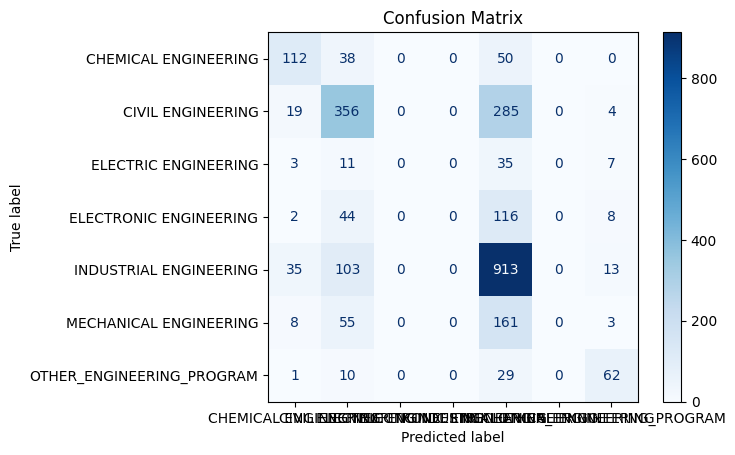

Classification Report:
                            precision    recall  f1-score   support

     CHEMICAL ENGINEERING       0.62      0.56      0.59       200
        CIVIL ENGINEERING       0.58      0.54      0.56       664
     ELECTRIC ENGINEERING       0.00      0.00      0.00        56
   ELECTRONIC ENGINEERING       0.00      0.00      0.00       170
   INDUSTRIAL ENGINEERING       0.57      0.86      0.69      1064
   MECHANICAL ENGINEERING       0.00      0.00      0.00       227
OTHER_ENGINEERING_PROGRAM       0.64      0.61      0.62       102

                 accuracy                           0.58      2483
                macro avg       0.34      0.37      0.35      2483
             weighted avg       0.48      0.58      0.52      2483


Sample of Actual vs Predicted:
Actual: CIVIL ENGINEERING, Predicted: CHEMICAL ENGINEERING
Actual: INDUSTRIAL ENGINEERING, Predicted: INDUSTRIAL ENGINEERING
Actual: OTHER_ENGINEERING_PROGRAM, Predicted: INDUSTRIAL ENGINEERING
Actual: IN

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# Step 1: Separate features (X) and target (y)
X = extra.drop(columns=['ACADEMIC_PROGRAM'])  # Features
y = extra['ACADEMIC_PROGRAM']  # Target

# Step 2: Encode the target variable
label_encoder_y = LabelEncoder()
y_encoded = label_encoder_y.fit_transform(y)

# Step 3: Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns.tolist()

# Step 4: Preprocess categorical features using LabelEncoder
X_encoded = X.copy()
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    X_encoded[col] = le.fit_transform(X[col].astype(str))
    label_encoders[col] = le

# Step 5: Split the encoded data into train and test sets (80-20 split)
X_train_encoded, X_test_encoded, y_train_encoded, y_test_encoded = train_test_split(X_encoded, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded)

# Step 6: Initialize and train Gradient Boosting Classifier
gb_model = GradientBoostingClassifier(n_estimators=500, random_state=42)
gb_model.fit(X_train_encoded, y_train_encoded)

# Step 7: Initialize and train CatBoost Classifier
catboost_model = CatBoostClassifier(iterations=500, cat_features=categorical_columns, verbose=0)
catboost_model.fit(X_train_encoded, y_train_encoded)

# Step 8: Generate predictions from both models on the training set
gb_predictions_train = gb_model.predict(X_train_encoded)  # Class labels
catboost_predictions_train = catboost_model.predict(X_train_encoded)  # Class labels

# Flatten CatBoost predictions to ensure 1D
catboost_predictions_train = catboost_predictions_train.ravel()

# Prepare the training set for the meta-learner
meta_features_train = np.vstack((gb_predictions_train, catboost_predictions_train)).T

# Step 9: Train Logistic Regression as the meta-learner
meta_learner = LogisticRegression(max_iter=1000)  # Increased max_iter for better convergence
meta_learner.fit(meta_features_train, y_train_encoded)

# Step 10: Generate predictions from both models on the test set
gb_predictions_test = gb_model.predict(X_test_encoded)  # Class labels
catboost_predictions_test = catboost_model.predict(X_test_encoded)  # Class labels

# Flatten CatBoost test predictions to ensure 1D
catboost_predictions_test = catboost_predictions_test.ravel()

# Prepare the test set for the meta-learner
meta_features_test = np.vstack((gb_predictions_test, catboost_predictions_test)).T

# Make predictions with the meta-learner
meta_predictions = meta_learner.predict(meta_features_test)

# Step 11: Evaluate the model
# Confusion matrix
cm = confusion_matrix(y_test_encoded, meta_predictions)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
ConfusionMatrixDisplay(cm, display_labels=label_encoder_y.classes_).plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

# Classification report
report = classification_report(y_test_encoded, meta_predictions, target_names=label_encoder_y.classes_)
print("Classification Report:\n", report)

# Display a sample of predicted and actual values
sample_indices = np.random.choice(len(y_test_encoded), size=10, replace=False)
print("\nSample of Actual vs Predicted:")
for index in sample_indices:
    print(f"Actual: {label_encoder_y.inverse_transform([y_test_encoded[index]])[0]}, Predicted: {label_encoder_y.inverse_transform([meta_predictions[index]])[0]}")


*Hyper Tuning*

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 500],  # Number of trees in the ensemble
    'learning_rate': [0.01, 0.05, 0.1, 0.2],  # Step size shrinkage
    'max_depth': [3, 4, 5, 6],  # Maximum depth of trees
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum samples required to be at a leaf node
}

# Initialize Gradient Boosting model
gb_model = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid,
                           scoring='accuracy', cv=5, verbose=2, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_encoded, y_train_encoded)

# Best parameters
print("Best parameters found: ", grid_search.best_params_)

# Best model
best_gb_model = grid_search.best_estimator_

# Make predictions with the best model
y_pred_best_gb = best_gb_model.predict(X_test_encoded)

# Evaluate the best model
evaluate_model(y_test_encoded, y_pred_best_gb, "Best Gradient Boosting")


Fitting 5 folds for each of 432 candidates, totalling 2160 fits


KeyboardInterrupt: 

*SMOTE*

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from imblearn.over_sampling import SMOTE
from catboost import CatBoostClassifier
from sklearn.metrics import classification_report

# Assuming 'extra' is your DataFrame
X = extra.drop(columns=['ACADEMIC_PROGRAM'])  # Features
y = extra['ACADEMIC_PROGRAM']  # Target

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Identify categorical columns
categorical_columns = X_train.select_dtypes(include=['object']).columns.tolist()

# One-Hot Encoding for categorical columns
X_train_encoded = pd.get_dummies(X_train, columns=categorical_columns, drop_first=True)
X_test_encoded = pd.get_dummies(X_test, columns=categorical_columns, drop_first=True)

# Align columns of X_test_encoded with X_train_encoded
X_test_encoded = X_test_encoded.reindex(columns=X_train_encoded.columns, fill_value=0)

# Apply SMOTE to oversample the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_encoded, y_train)

# Train CatBoost model
catboost_model = CatBoostClassifier(iterations=500, verbose=0)
catboost_model.fit(X_resampled, y_resampled)

# Make predictions
y_pred = catboost_model.predict(X_test_encoded)

# Evaluate model
print(classification_report(y_test, y_pred))


                           precision    recall  f1-score   support

     CHEMICAL ENGINEERING       0.52      0.74      0.61       200
        CIVIL ENGINEERING       0.64      0.53      0.58       664
     ELECTRIC ENGINEERING       0.14      0.25      0.18        56
   ELECTRONIC ENGINEERING       0.35      0.35      0.35       170
   INDUSTRIAL ENGINEERING       0.72      0.65      0.68      1064
   MECHANICAL ENGINEERING       0.35      0.38      0.36       227
OTHER_ENGINEERING_PROGRAM       0.47      0.74      0.57       102

                 accuracy                           0.58      2483
                macro avg       0.45      0.52      0.48      2483
             weighted avg       0.60      0.58      0.58      2483



Mean cross-validation accuracy: 0.6027
Standard deviation of cross-validation accuracy: 0.0185
Classification Report for CatBoost:
                           precision    recall  f1-score      support
CHEMICAL ENGINEERING        0.579832  0.690000  0.630137   100.000000
CIVIL ENGINEERING           0.579952  0.731928  0.647137   332.000000
ELECTRIC ENGINEERING        0.285714  0.071429  0.114286    28.000000
ELECTRONIC ENGINEERING      0.611111  0.258824  0.363636    85.000000
INDUSTRIAL ENGINEERING      0.707635  0.714286  0.710945   532.000000
MECHANICAL ENGINEERING      0.455696  0.315789  0.373057   114.000000
OTHER_ENGINEERING_PROGRAM   0.600000  0.529412  0.562500    51.000000
accuracy                    0.627214  0.627214  0.627214     0.627214
macro avg                   0.545706  0.473095  0.485957  1242.000000
weighted avg                0.619552  0.627214  0.613052  1242.000000


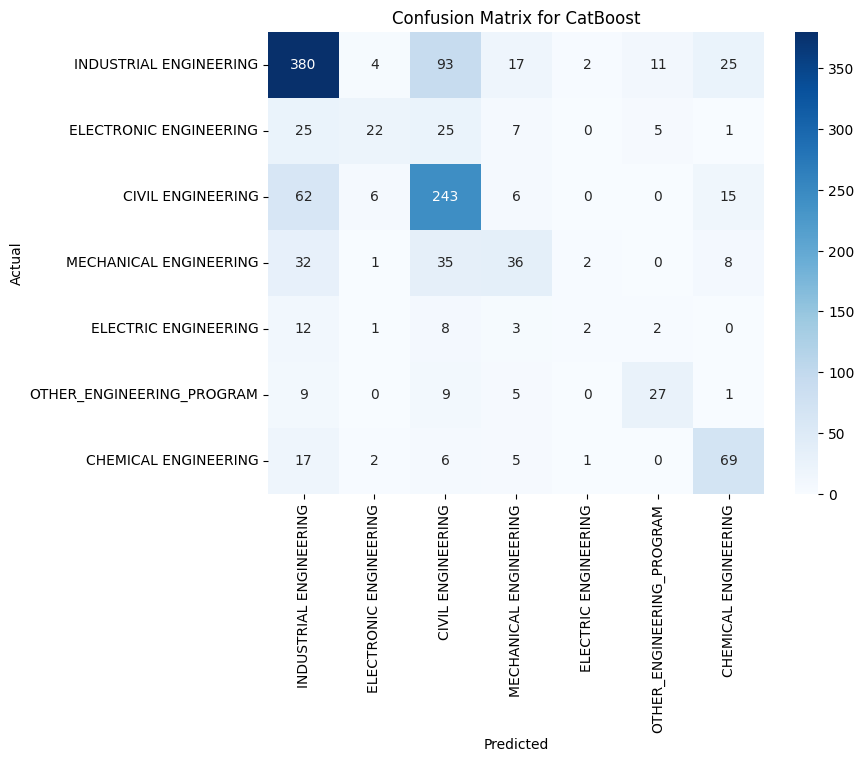

Sample Predictions for CatBoost:
                      Actual                  Predicted
0       CHEMICAL ENGINEERING          CIVIL ENGINEERING
1     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
2     INDUSTRIAL ENGINEERING          CIVIL ENGINEERING
3          CIVIL ENGINEERING       CHEMICAL ENGINEERING
4  OTHER_ENGINEERING_PROGRAM  OTHER_ENGINEERING_PROGRAM
5     INDUSTRIAL ENGINEERING       CHEMICAL ENGINEERING
6     MECHANICAL ENGINEERING     INDUSTRIAL ENGINEERING
7     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING
8     ELECTRONIC ENGINEERING          CIVIL ENGINEERING
9     INDUSTRIAL ENGINEERING     INDUSTRIAL ENGINEERING


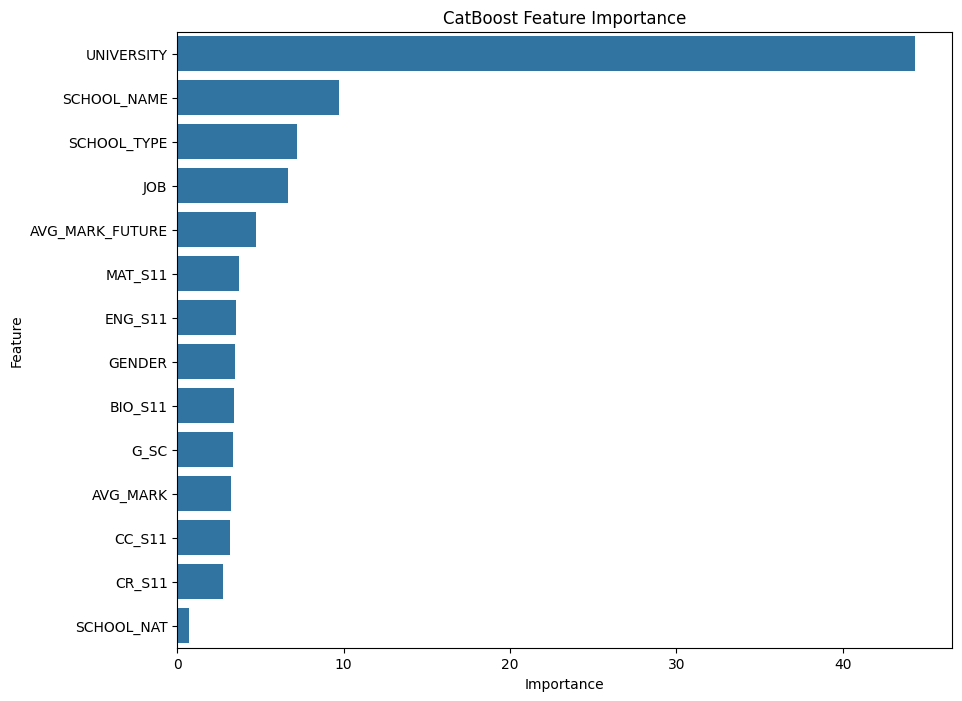

In [ ]:
# Separate features (X) and target (y) using the new data 'extra'
X = extra.drop(columns=['ACADEMIC_PROGRAM'])
y = extra['ACADEMIC_PROGRAM']

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns.tolist()

# Create a CatBoostClassifier object (using default parameters)
catboost_model = CatBoostClassifier(cat_features=categorical_columns, iterations=500, verbose=0)

# Perform cross-validation
cv_scores = cross_val_score(catboost_model, X, y, cv=5, scoring='accuracy')

# Print mean and standard deviation of cross-validation scores
print(f"Mean cross-validation accuracy: {cv_scores.mean():.4f}")
print(f"Standard deviation of cross-validation accuracy: {cv_scores.std():.4f}")

# Split into train and test sets (80-20 split) for final evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, stratify=y)

# Train the CatBoost model on the training set
catboost_model.fit(X_train, y_train)

# Make predictions with the CatBoost model
y_pred_catboost = catboost_model.predict(X_test)

# Function to evaluate and display model performance
def evaluate_model(y_test, y_pred, model_name):
    # Confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)

    # Plot the confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_total, annot=True, fmt="g", cmap="Blues",
                xticklabels=y.unique(), yticklabels=y.unique())
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Display a sample of actual vs predicted values
    actual_values = y_test.values.flatten()  # Ensure it's 1D
    predicted_values = y_pred.flatten()  # Ensure predictions are 1D
    sample_predictions = pd.DataFrame({
        'Actual': actual_values[:10],  # Take the first 10 actual values
        'Predicted': predicted_values[:10]  # Take the first 10 predicted values
    })
    print(f'Sample Predictions for {model_name}:')
    print(sample_predictions)

# Evaluate CatBoost
evaluate_model(y_test, y_pred_catboost, "CatBoost")

# Get feature importance from the CatBoost model
feature_importances = catboost_model.get_feature_importance()

# Plot feature importance
feature_names = X.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('CatBoost Feature Importance')
plt.show()


*Shap*

In [ ]:
!pip install shap


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 6.5 MB/s eta 0:00:00


<Figure size 1000x800 with 0 Axes>

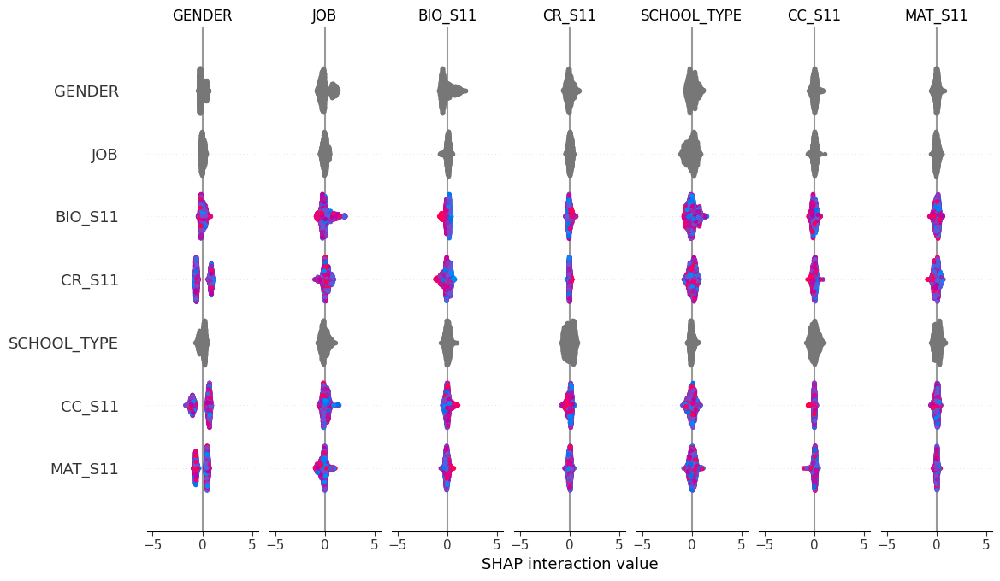

ValueError: Could not find feature named: Feature_Name

<Figure size 1000x800 with 0 Axes>

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from catboost import CatBoostClassifier
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import shap  # SHAP library for model interpretation

# Separate features (X) and target (y) using the new data 'extra'
X = extra.drop(columns=['ACADEMIC_PROGRAM'])  # Features from 'extra' dataset
y = extra['ACADEMIC_PROGRAM']  # Target from 'extra' dataset

# Identify categorical columns
categorical_columns = X.select_dtypes(include=['object']).columns

# Convert categorical columns to a list (for use in CatBoost)
categorical_columns_list = categorical_columns.tolist()

# Split into train and test sets (80-20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# CatBoost Classifier (CatBoost handles categorical features directly)
catboost_model = CatBoostClassifier(iterations=500, cat_features=categorical_columns_list, verbose=0)

# Train the CatBoost model
catboost_model.fit(X_train, y_train)

# Make predictions with CatBoost
y_pred_catboost = catboost_model.predict(X_test)

# Function to evaluate and display model performance
def evaluate_model(y_test, y_pred, model_name):
    # Confusion matrix
    confusion_matrix_total = confusion_matrix(y_test, y_pred, labels=y.unique())

    # Classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    avg_report = pd.DataFrame(report).transpose()
    print(f"Classification Report for {model_name}:")
    print(avg_report)



# SHAP Values
explainer = shap.TreeExplainer(catboost_model)  # Initialize SHAP TreeExplainer
shap_values = explainer.shap_values(X_test)     # Calculate SHAP values for the test set

# Plot SHAP summary
plt.figure(figsize=(10, 8))
shap.summary_plot(shap_values, X_test, feature_names=feature_names)
plt.show()

# SHAP dependence plot for a specific feature
plt.figure(figsize=(10, 8))
shap.dependence_plot('Feature_Name', shap_values, X_test, feature_names=feature_names)
plt.show()

# SHAP force plot for a specific prediction
shap.initjs()  # Initialize JS visualization
shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0, :])


Shape of SHAP values for class 1: (2483, 14)


<Figure size 1000x800 with 0 Axes>

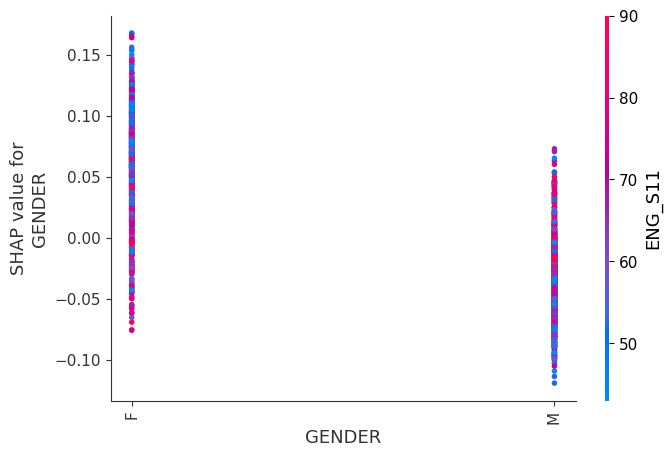

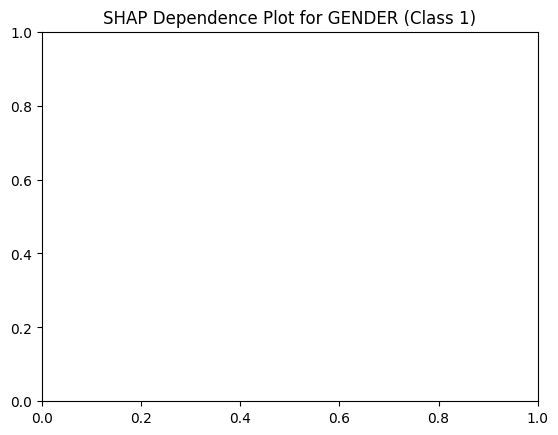

<Figure size 1000x800 with 0 Axes>

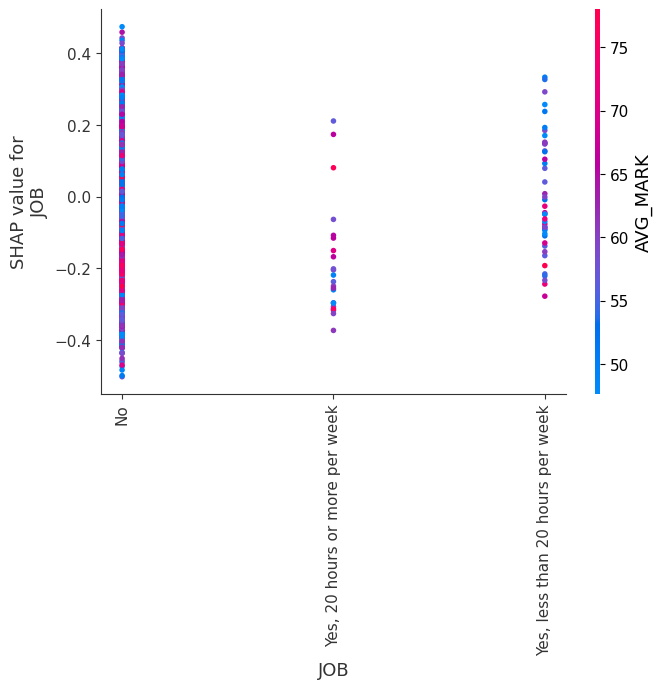

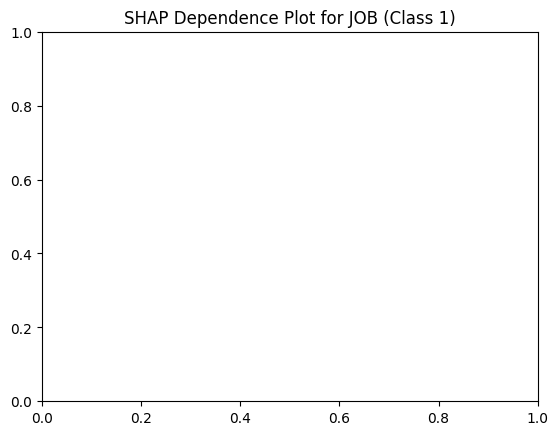

<Figure size 1000x800 with 0 Axes>

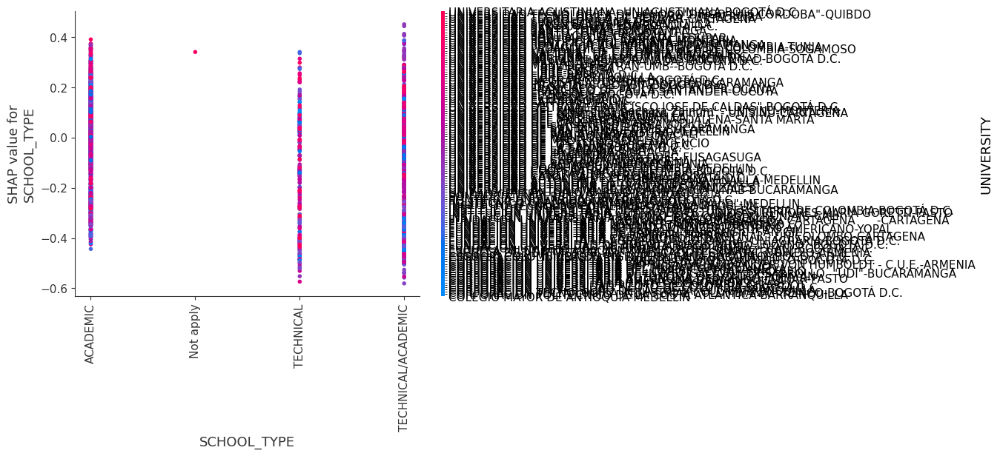

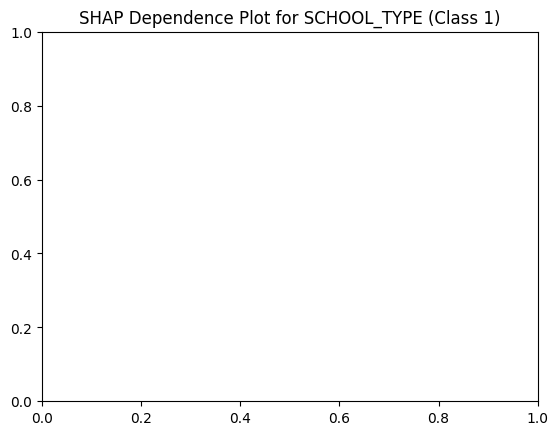

<Figure size 1000x800 with 0 Axes>

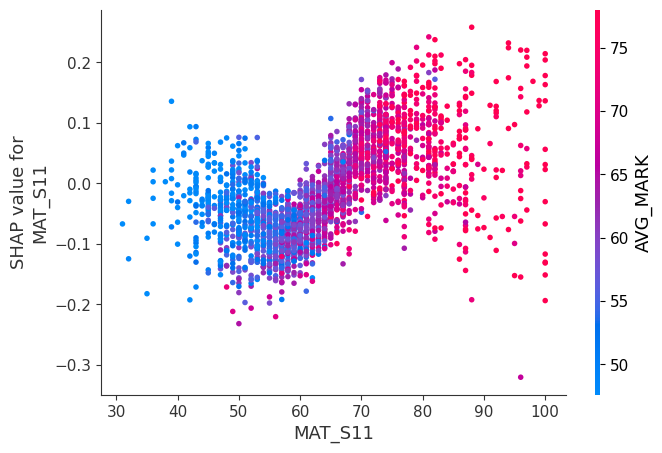

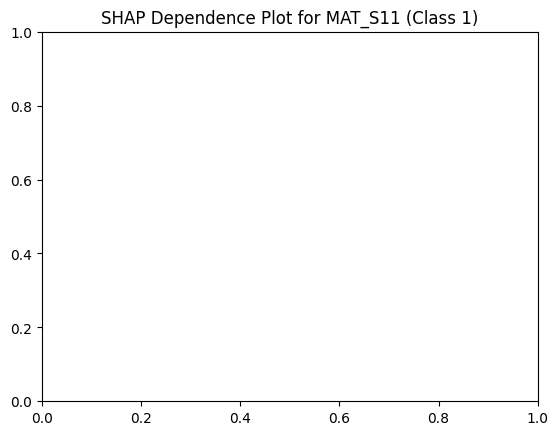

<Figure size 1000x800 with 0 Axes>

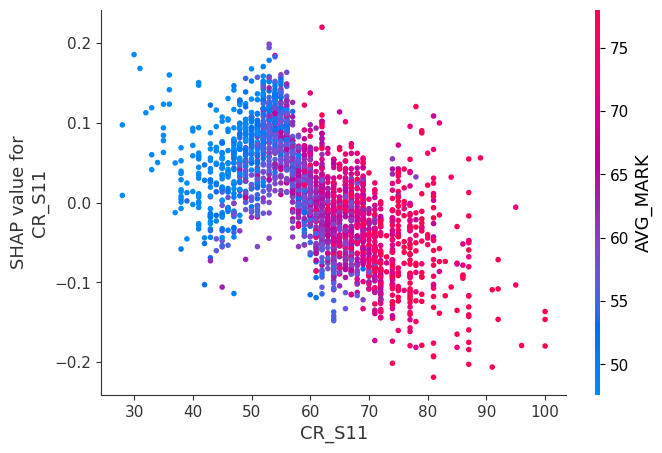

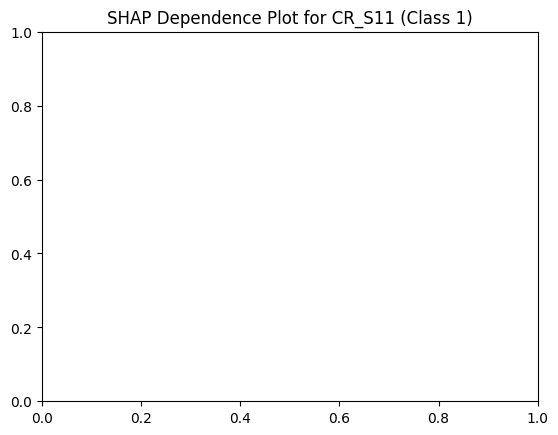

<Figure size 1000x800 with 0 Axes>

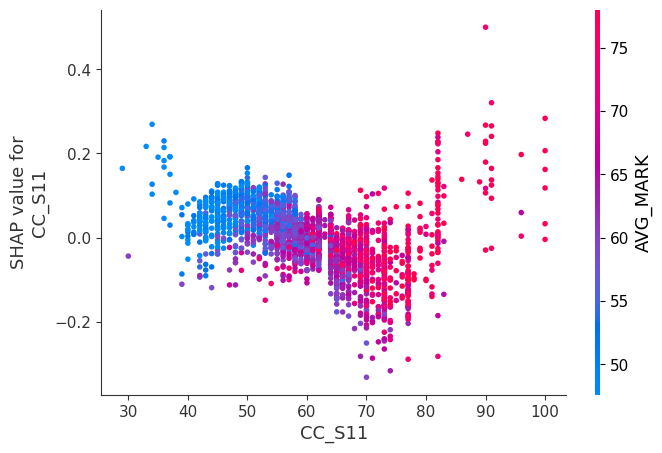

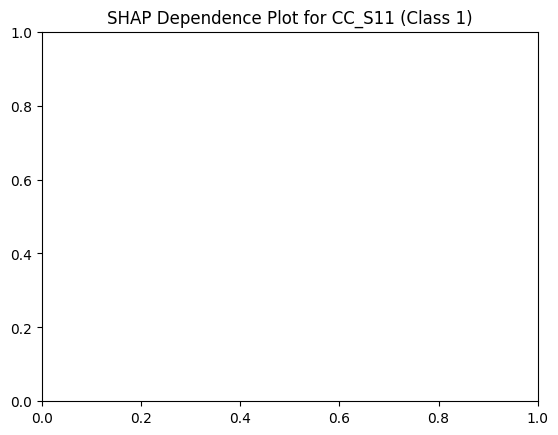

<Figure size 1000x800 with 0 Axes>

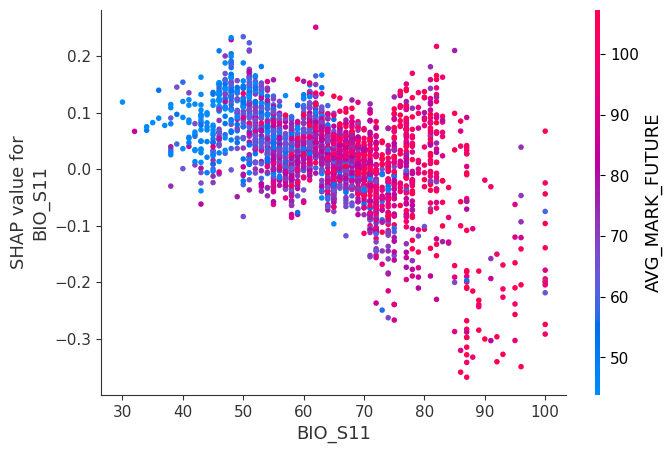

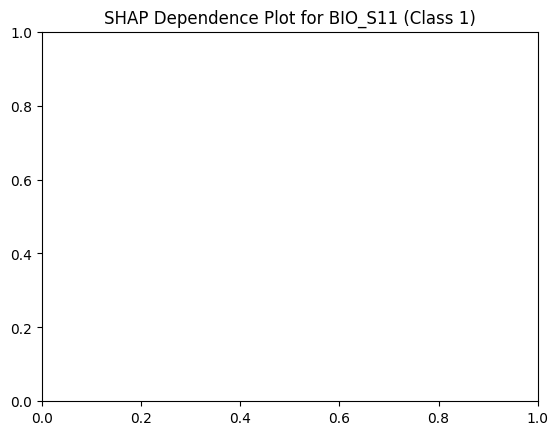

<Figure size 1000x800 with 0 Axes>

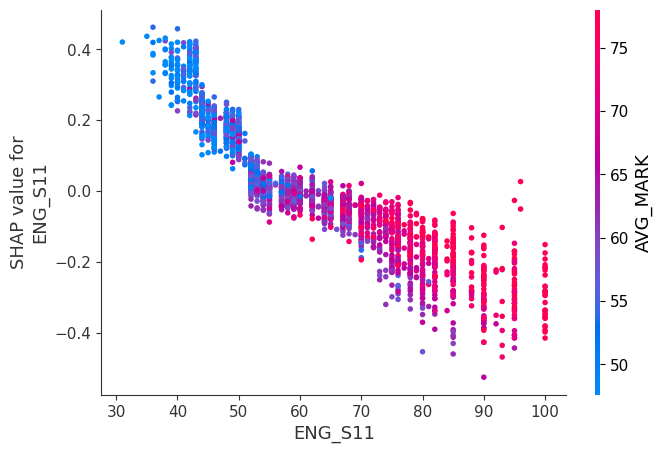

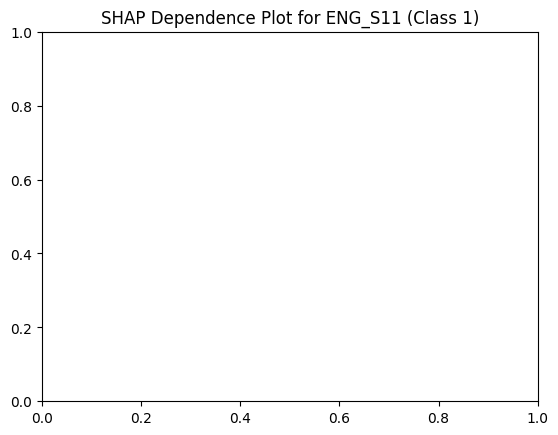

<Figure size 1000x800 with 0 Axes>

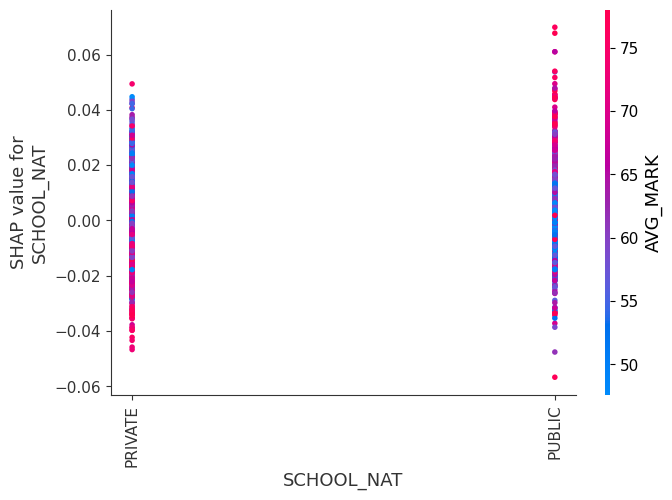

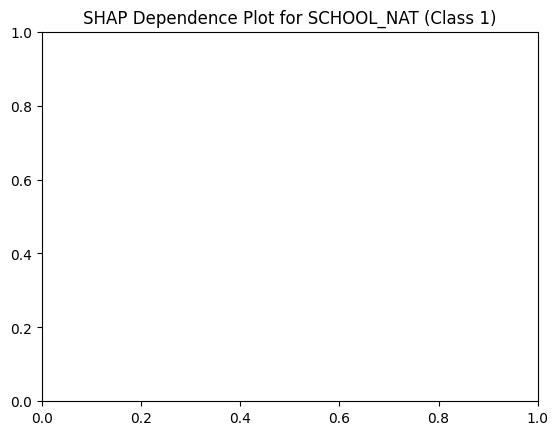

<Figure size 1000x800 with 0 Axes>

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129 (\x81) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


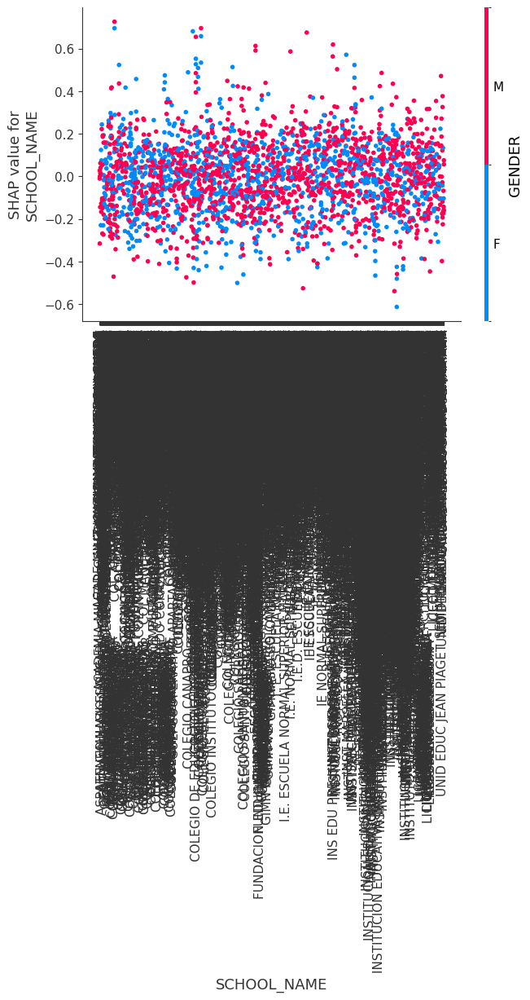

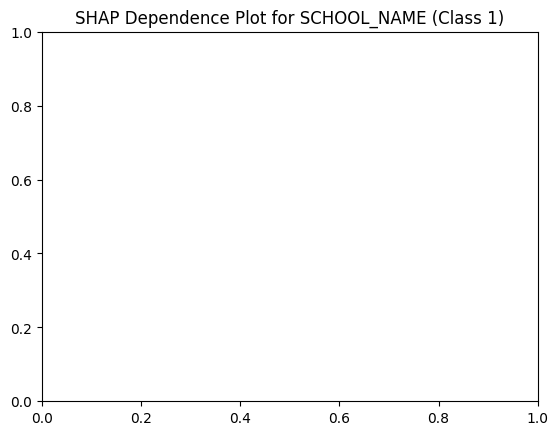

<Figure size 1000x800 with 0 Axes>

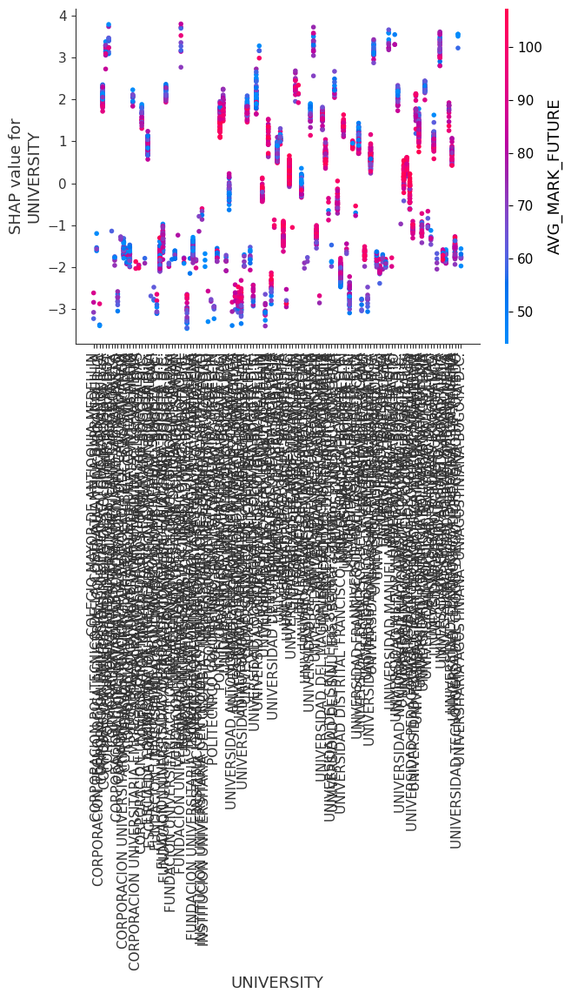

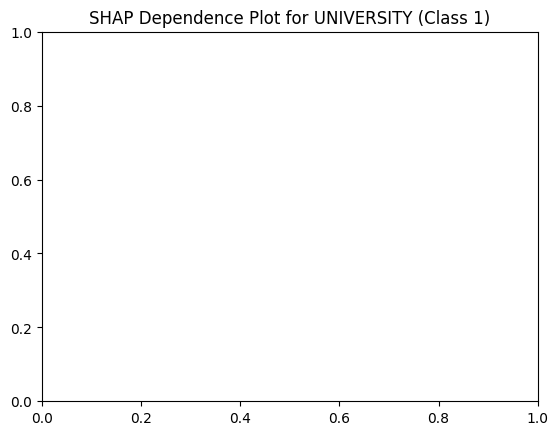

<Figure size 1000x800 with 0 Axes>

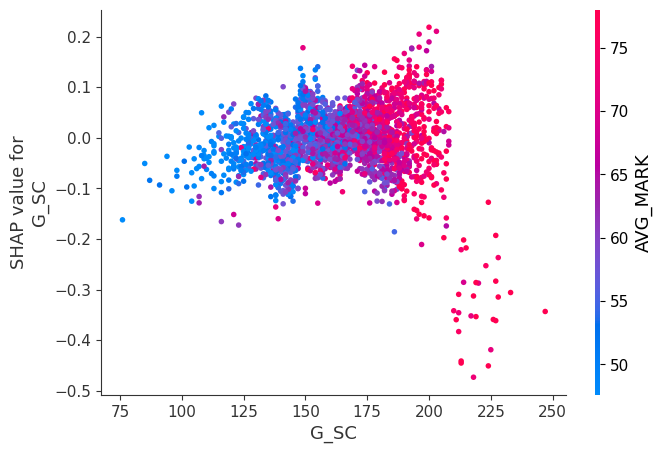

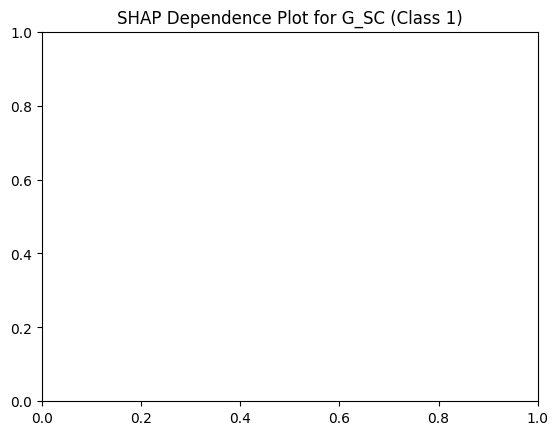

<Figure size 1000x800 with 0 Axes>

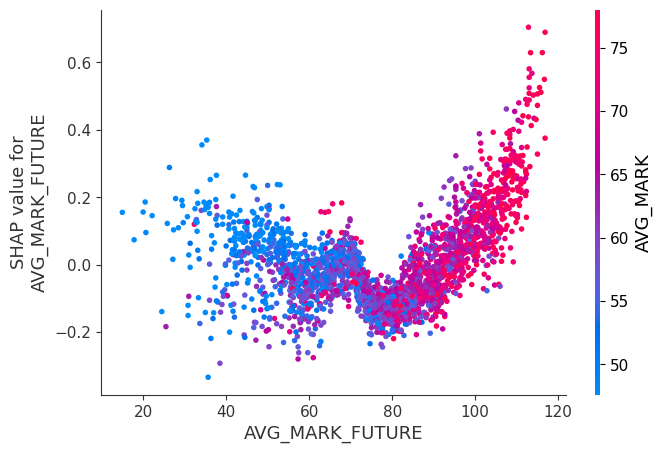

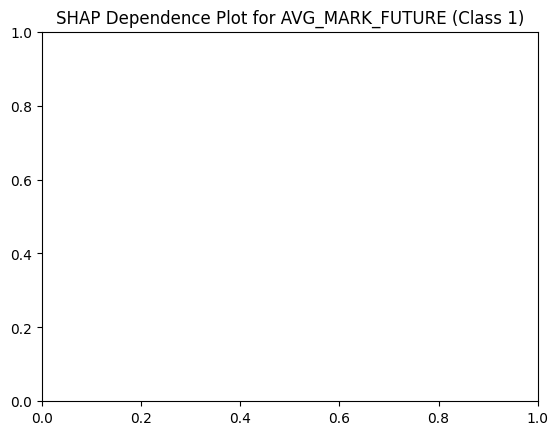

<Figure size 1000x800 with 0 Axes>

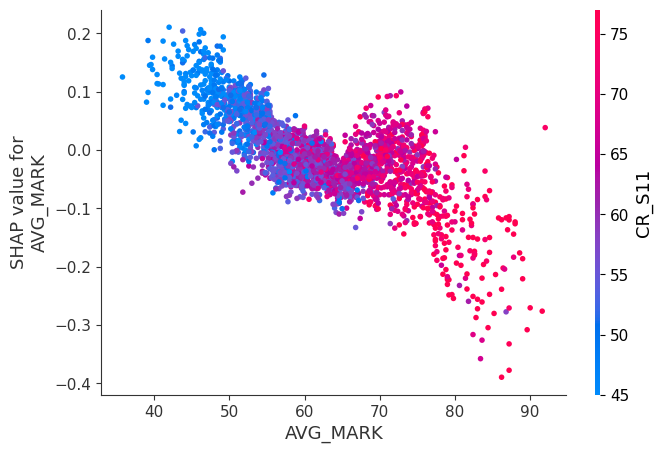

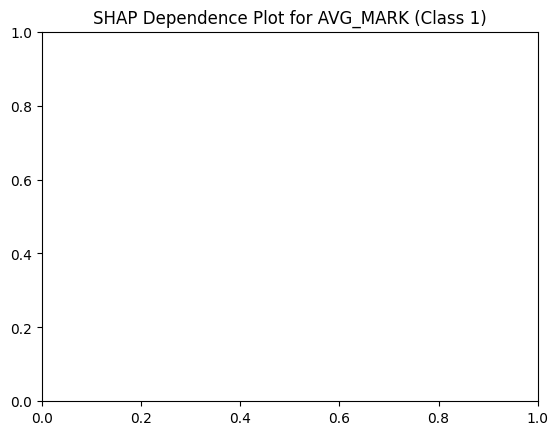

In [ ]:
import numpy as np
import shap
import matplotlib.pyplot as plt

#  plot for a specific class
class_index = 1

# Select the SHAP values for the specific class
shap_values_class = shap_values[:, :, class_index]

# Check the shape of the selected SHAP values
print(f"Shape of SHAP values for class {class_index}: {shap_values_class.shape}")

# Loop through each feature in the X_test DataFrame
for feature in X_test.columns:
    # Plot SHAP dependence plot for the current feature
    plt.figure(figsize=(10, 8))

    # Check if the feature exists in the SHAP values and X_test
    if feature in X_test.columns:
        shap.dependence_plot(feature, shap_values_class, X_test)
        plt.title(f'SHAP Dependence Plot for {feature} (Class {class_index})')
        plt.show()
    else:
        print(f"Feature {feature} not found in X_test.")
